In [9]:
from __future__ import print_function
import numpy as np
from tensorflow import keras as ks
import pandas as pd
import sklearn as sk
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import GridSearchCV
from tensorflow.keras import regularizers
from sklearn.metrics import recall_score
from numpy.random import seed
from sklearn.metrics import f1_score
seed(1)


from tensorflow.keras import regularizers

In [10]:
tf.random.set_seed(42)
from numpy.random import seed
seed(1)

In [11]:
#Zpload the training data

In [12]:
from imblearn.over_sampling import RandomOverSampler

In [13]:
#data for modelling
X_test = pd.read_csv("X_testNonOver_8_3.csv", header = 0)
X_test = X_test.drop(columns = "Unnamed: 0")

y_test = pd.read_csv("y_testNonOver_8_3.csv", header = 0)
y_test = y_test.drop(columns = "Unnamed: 0").astype("category")

X_train = pd.read_csv("X_trainNonOver_8_3.csv", header = 0)
X_train = X_train.drop(columns = "Unnamed: 0")

y_train = pd.read_csv("y_trainNonOver_8_3.csv", header = 0)
y_train = y_train.drop(columns = "Unnamed: 0").astype("category")

In [24]:
y_train.describe()

,sow_estimated_net_worth_value
count,449.0
unique,2.0
top,0.0
freq,329.0


In [19]:
print_Xdf = pd.concat([X_test, X_train])
print_Xdf

,num_in_trans,num_out_trans,avg_trans_out,avg_trans_in,sum_trans_in,max_trans_out,max_trans_in,std_trans_in,std_trans_out,min_trans_out,...,high_pressure_sells,high_pressure_buys,0,1,2,3,4,5,6,7
0,16,56,3567.209058,9174.191458,146787.063334,107350.723054,106496.796622,26246.865041,14778.605231,1.012039,...,1,3,-1.799268,0.154799,1.656201,0.740169,1.065944,-2.174852,0.299887,-0.741653
1,139,940,554.187962,2114.968494,293980.620635,73751.678000,55630.201655,5845.738748,3072.297769,2.150100,...,10,10,0.094175,-1.344943,2.105521,0.263924,1.209026,0.265904,0.159177,-0.074871
2,76,273,5.926206,19.237265,1462.032121,275.542200,285.956522,36.931228,26.220915,0.005260,...,7,6,-4.243502,-5.858241,1.067419,0.263878,-0.548854,-1.421164,2.108046,0.690278
3,5,362,1928.869263,10192.046000,50960.230000,200229.000000,38731.770000,16582.685034,13490.568827,138.748500,...,7,5,-1.413512,-1.034474,2.318258,2.025879,0.035617,-1.536197,-0.164666,1.228101
4,7,110,73.391183,1014.945386,7104.617701,1642.779114,2596.319930,1044.671387,277.205972,54.343682,...,2,10,-1.107579,0.974636,1.093773,1.242254,1.252293,-0.458790,0.975106,-1.274403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,1,40,2172.204750,547.449000,547.449000,86888.190000,547.449000,0.000000,13738.229108,86888.190000,...,2,8,-0.977036,-0.386204,3.134112,0.262715,-0.904693,-2.629008,1.110907,-0.608370
445,63,325,5940.844013,8488.780288,534793.158157,197637.138000,82650.780000,14996.164470,20500.029032,0.454520,...,9,10,0.971460,-0.426380,1.563981,1.181168,0.420010,-0.274193,0.566387,-0.773764
446,2,2,389.826045,390.050000,780.100000,616.683991,617.060000,321.040621,320.825584,162.968099,...,0,0,-1.806143,-1.450455,0.652977,-0.500314,3.169092,-0.040722,1.491697,-1.218794
447,1,6,13.899790,141.823619,141.823619,20.969580,141.823619,0.000000,10.768333,20.490000,...,0,1,-1.371662,-1.237572,1.467208,-0.084673,1.047548,-1.041551,-0.453278,-0.390771


In [20]:
print_Xdf.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
num_in_trans,599.0,3.194825e+01,6.149657e+01,1.000000,4.000000,13.000000,3.350000e+01,9.360000e+02
num_out_trans,599.0,2.225659e+02,3.399052e+02,1.000000,16.000000,77.000000,2.535000e+02,1.678000e+03
avg_trans_out,599.0,1.577203e+03,5.943562e+03,0.000000,69.346660,306.962452,1.110454e+03,9.311562e+04
avg_trans_in,599.0,4.073294e+04,8.822015e+05,0.000000,207.110441,870.432567,3.022798e+03,2.159236e+07
sum_trans_in,599.0,3.556883e+05,4.290238e+06,0.000000,942.654865,9276.983250,7.473016e+04,8.636942e+07
max_trans_out,599.0,5.750872e+04,5.281705e+05,0.000000,528.978000,4713.774114,2.220310e+04,1.259614e+07
max_trans_in,599.0,1.751046e+05,3.477862e+06,0.000000,559.172575,3367.125439,1.667548e+04,8.505991e+07
std_trans_in,599.0,7.804581e+04,1.728867e+06,0.000000,106.492392,945.394275,4.164681e+03,4.231425e+07
std_trans_out,599.0,4.925800e+03,2.464467e+04,0.000000,110.952525,798.569613,2.732883e+03,5.281983e+05
min_trans_out,599.0,7.790993e+02,6.867942e+03,0.000000,0.356868,13.799691,1.035612e+02,1.029308e+05


In [7]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_test.shape

(150, 47)

In [7]:
X_test = pd.DataFrame(X_test)
X_train = pd.DataFrame(X_train)

In [8]:
#data for later model training with best parameters -> over-sampled
smoter = RandomOverSampler(sampling_strategy=1, random_state=42)
X_train_upsample, y_train_upsample = smoter.fit_resample(X_train, y_train)

## Train the best shallow model

In [9]:
#first model
#länge Oversampled Training Data: 658

In [132]:
tf.random.set_seed(0)
seed(42)
def get_mlp_model(hiddenLayerOne=6, hiddenLayerTwo=6,
    dropout=0.3, learnRate=0.007, regul = 0.025):
    # initialize a sequential model and add layer to flatten the
    # input data
    model = Sequential()
    model.add(Flatten())
    # add two stacks of FC => RELU => DROPOUT
    model.add(Dense(hiddenLayerOne, activation="relu",input_shape=(784,), activity_regularizer=regularizers.l1(regul)))
    model.add(Dropout(dropout))
    model.add(Dense(hiddenLayerTwo, activation="relu", activity_regularizer=regularizers.l1(regul)))
    model.add(Dropout(dropout))
    # add a softmax layer on top
    model.add(Dense(1, activation="sigmoid"))
    # compile the model
    model.compile(optimizer=Adam(learning_rate=learnRate),loss="binary_crossentropy",metrics=["accuracy", tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
    # return compiled model
    return model

In [133]:
tf.random.set_seed(0)
seed(42)
def score_model(hiddenLayerOne, hiddenLayerTwo,
    dropout, learnRate, regul, epochs, batch, cv=None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    if cv is None:
        cv = KFold(n_splits=5, random_state=42, shuffle = True)

    smoter = RandomOverSampler(sampling_strategy=1, random_state=42)
    
    scores = []

    for train_fold_index, val_fold_index in cv.split(X_train, y_train):
        # Get the training data
        X_train_fold, y_train_fold = X_train.iloc[train_fold_index,:], y_train.iloc[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X_train.iloc[val_fold_index,:], y_train.iloc[val_fold_index]

        # Upsample only the data in the training section
        X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,
                                                                           y_train_fold)
        # Fit the model on the upsampled training data
        model = get_mlp_model(hiddenLayerOne=hiddenLayerOne, hiddenLayerTwo=hiddenLayerTwo,dropout=dropout, learnRate= learnRate, regul=regul)
        model_obj = model.fit(X_train_fold_upsample, y_train_fold_upsample, epochs = epochs, batch_size = batch, verbose = 1)
        # Score the model on the (non-upsampled) validation data
        score = model.evaluate(X_val_fold, y_val_fold)
        model_proba = model.predict(X_val_fold)
        model_trues = pd.DataFrame(tf.greater(model_proba, 0.5))
        model_preds = model_trues.astype(int)
        model_F1 = f1_score(y_val_fold, model_preds)
        score.append(model_F1)
        scores.append(score)
    return np.array(scores)

# Example of the model in action



In [12]:
## Define Grid for Hyperparameter Tuning

In [13]:
hiddenLayerOne = [6, 5]
hiddenLayerTwo = [6, 5]
learnRate = [0.007, 0.004]
dropout = [0, 0.05]
epochs = [10, 20]
batch = [32,64]
regul = [0, 0.05]

In [14]:
grid = dict(
    hiddenLayerOne=hiddenLayerOne,
    learnRate=learnRate,
    hiddenLayerTwo=hiddenLayerTwo,
    dropout=dropout,
    regul = regul, 
    batch = batch,
    epochs=epochs
)

In [15]:
grid

{'hiddenLayerOne': [6, 5],
 'learnRate': [0.007, 0.004],
 'hiddenLayerTwo': [6, 5],
 'dropout': [0, 0.05],
 'regul': [0, 0.05],
 'batch': [32, 64],
 'epochs': [10, 20]}

In [16]:
tf.random.set_seed(0)
seed(42)
score_tracker = []
for n_nodes1 in grid['hiddenLayerOne']:
    for n_nodes2 in grid['hiddenLayerTwo']:
        for learnings in grid['learnRate']:
            for dropts in grid['dropout']:
                for reguls in grid['regul']:
                    for batchs in grid['batch']:
                        for epochs in grid['epochs']:
                            parameter_track = {'hiddenLayerOne': n_nodes1,
                                               'learnRate': learnings,
                                               'hiddenLayerTwo': n_nodes2,
                                               'dropout': dropts,
                                               'epochs': epochs,
                                               'regul': reguls, 
                                               'batch': batchs}
                            scores = score_model(hiddenLayerOne=n_nodes1, 
                                                 hiddenLayerTwo=n_nodes2,                                           
                                                 dropout=dropts, 
                                                 learnRate=learnings, 
                                                 regul=reguls,
                                                 epochs=epochs,
                                                 batch=batchs,
                                                 cv=None)
                            
                            parameter_track['accuracy']= scores[:,1]
                            parameter_track['AUC']= scores[:,2]
                            parameter_track['recall']= scores[:,4]
                            parameter_track['precision']= scores[:,3]
                            parameter_track['F1']= scores[:,5]

                            score_tracker.append(parameter_track)


Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.6652 - accuracy: 0.6109 - auc: 0.6591 - precision: 0.6213 - recall: 0.5681
Epoch 2/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5620 - accuracy: 0.7451 - auc: 0.8139 - precision: 0.7386 - recall: 0.7588
Epoch 3/10
17/17 [==============================] - 0s 9ms/step - loss: 0.4511 - accuracy: 0.8054 - auc: 0.8804 - precision: 0.7814 - recall: 0.8482
Epoch 4/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3666 - accuracy: 0.8599 - auc: 0.9208 - precision: 0.8201 - recall: 0.9222
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3138 - accuracy: 0.8774 - auc: 0.9362 - precision: 0.8255 - recall: 0.9572
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.2756 - accuracy: 0.9027 - auc: 0.9507 - precision: 0.8508 - recall: 0.9767
Epoch 7/10
17/17 [==============================] - 0s 10ms/step - loss: 0.2554 - accuracy: 0.9066 - 

Epoch 12/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2316 - accuracy: 0.9068 - auc_6: 0.9514 - precision_6: 0.8543 - recall_6: 0.9810
Epoch 13/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2214 - accuracy: 0.9144 - auc_6: 0.9537 - precision_6: 0.8633 - recall_6: 0.9848
Epoch 14/20
17/17 [==============================] - 0s 9ms/step - loss: 0.2136 - accuracy: 0.9202 - auc_6: 0.9562 - precision_6: 0.8771 - recall_6: 0.9772
Epoch 15/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2062 - accuracy: 0.9240 - auc_6: 0.9600 - precision_6: 0.8754 - recall_6: 0.9886
Epoch 16/20
17/17 [==============================] - 0s 9ms/step - loss: 0.2056 - accuracy: 0.9202 - auc_6: 0.9628 - precision_6: 0.8797 - recall_6: 0.9734
Epoch 17/20
17/17 [==============================] - 0s 9ms/step - loss: 0.1978 - accuracy: 0.9297 - auc_6: 0.9640 - precision_6: 0.8792 - recall_6: 0.9962
Epoch 18/20
17/17 [==============================] - 0s 10ms/

3/3 [==============================] - 0s 13ms/step - loss: 0.6876 - accuracy: 0.7556 - auc_12: 0.8377 - precision_12: 0.6579 - recall_12: 0.7353
Epoch 1/10
9/9 [==============================] - 0s 12ms/step - loss: 0.7145 - accuracy: 0.4310 - auc_13: 0.5304 - precision_13: 0.3000 - recall_13: 0.1034
Epoch 2/10
9/9 [==============================] - 0s 10ms/step - loss: 0.6280 - accuracy: 0.5939 - auc_13: 0.7433 - precision_13: 0.6644 - recall_13: 0.3793
Epoch 3/10
9/9 [==============================] - 0s 10ms/step - loss: 0.5606 - accuracy: 0.7280 - auc_13: 0.8331 - precision_13: 0.7902 - recall_13: 0.6207
Epoch 4/10
9/9 [==============================] - 0s 10ms/step - loss: 0.5026 - accuracy: 0.7969 - auc_13: 0.8869 - precision_13: 0.7992 - recall_13: 0.7931
Epoch 5/10
9/9 [==============================] - 0s 10ms/step - loss: 0.4542 - accuracy: 0.8487 - auc_13: 0.9051 - precision_13: 0.8116 - recall_13: 0.9080
Epoch 6/10
9/9 [==============================] - 0s 11ms/step - loss

9/9 [==============================] - 0s 10ms/step - loss: 0.1908 - accuracy: 0.9368 - auc_18: 0.9684 - precision_18: 0.9014 - recall_18: 0.9808
Epoch 19/20
9/9 [==============================] - 0s 11ms/step - loss: 0.1823 - accuracy: 0.9349 - auc_18: 0.9747 - precision_18: 0.8874 - recall_18: 0.9962
Epoch 20/20
3/3 [==============================] - 0s 13ms/step - loss: 0.4761 - accuracy: 0.8222 - auc_18: 0.9004 - precision_18: 0.5882 - recall_18: 0.9091
Epoch 1/20
9/9 [==============================] - 1s 12ms/step - loss: 0.6494 - accuracy: 0.7137 - auc_19: 0.7252 - precision_19: 0.6842 - recall_19: 0.7939
Epoch 2/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5686 - accuracy: 0.7576 - auc_19: 0.8318 - precision_19: 0.7015 - recall_19: 0.8969
Epoch 3/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4949 - accuracy: 0.7844 - auc_19: 0.8758 - precision_19: 0.7264 - recall_19: 0.9122
Epoch 4/20
9/9 [==============================] - 0s 11ms/step - lo

17/17 [==============================] - 0s 10ms/step - loss: 0.6860 - accuracy: 0.7814 - auc_26: 0.8307 - precision_26: 0.7387 - recall_26: 0.8707
Epoch 4/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6323 - accuracy: 0.8422 - auc_26: 0.8718 - precision_26: 0.7830 - recall_26: 0.9468
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5801 - accuracy: 0.8498 - auc_26: 0.8990 - precision_26: 0.7930 - recall_26: 0.9468
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5470 - accuracy: 0.8631 - auc_26: 0.8829 - precision_26: 0.7957 - recall_26: 0.9772
Epoch 7/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5210 - accuracy: 0.8650 - auc_26: 0.8821 - precision_26: 0.7927 - recall_26: 0.9886
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5008 - accuracy: 0.8764 - auc_26: 0.8946 - precision_26: 0.8075 - recall_26: 0.9886
Epoch 9/20
17/17 [==============================] - 0s 12

3/3 [==============================] - 0s 14ms/step - loss: 0.5256 - accuracy: 0.8222 - auc_31: 0.9135 - precision_31: 0.6000 - recall_31: 1.0000
Epoch 1/10
9/9 [==============================] - 0s 12ms/step - loss: 0.8984 - accuracy: 0.6300 - auc_32: 0.6893 - precision_32: 0.5983 - recall_32: 0.7912
Epoch 2/10
9/9 [==============================] - 0s 10ms/step - loss: 0.7320 - accuracy: 0.7363 - auc_32: 0.8228 - precision_32: 0.7172 - recall_32: 0.7802
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6668 - accuracy: 0.8150 - auc_32: 0.8953 - precision_32: 0.8162 - recall_32: 0.8132
Epoch 4/10
9/9 [==============================] - 0s 10ms/step - loss: 0.6230 - accuracy: 0.8425 - auc_32: 0.9188 - precision_32: 0.8327 - recall_32: 0.8571
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.5863 - accuracy: 0.8571 - auc_32: 0.9317 - precision_32: 0.8421 - recall_32: 0.8791
Epoch 6/10
9/9 [==============================] - 0s 11ms/step - loss

9/9 [==============================] - 0s 10ms/step - loss: 0.5302 - accuracy: 0.8927 - auc_38: 0.9396 - precision_38: 0.8428 - recall_38: 0.9655
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5010 - accuracy: 0.9042 - auc_38: 0.9440 - precision_38: 0.8528 - recall_38: 0.9770
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4759 - accuracy: 0.9080 - auc_38: 0.9533 - precision_38: 0.8586 - recall_38: 0.9770
Epoch 10/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4560 - accuracy: 0.9080 - auc_38: 0.9583 - precision_38: 0.8586 - recall_38: 0.9770
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4418 - accuracy: 0.9023 - auc_38: 0.9623 - precision_38: 0.8547 - recall_38: 0.9693
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4285 - accuracy: 0.9080 - auc_38: 0.9606 - precision_38: 0.8635 - recall_38: 0.9693
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - 

17/17 [==============================] - 0s 11ms/step - loss: 0.2633 - accuracy: 0.8891 - auc_45: 0.9472 - precision_45: 0.8497 - recall_45: 0.9455
Epoch 14/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2804 - accuracy: 0.8891 - auc_45: 0.9445 - precision_45: 0.8472 - recall_45: 0.9494
Epoch 15/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2303 - accuracy: 0.9144 - auc_45: 0.9604 - precision_45: 0.8737 - recall_45: 0.9689
Epoch 16/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2361 - accuracy: 0.8988 - auc_45: 0.9639 - precision_45: 0.8755 - recall_45: 0.9300
Epoch 17/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2169 - accuracy: 0.9222 - auc_45: 0.9642 - precision_45: 0.8780 - recall_45: 0.9805
Epoch 18/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2375 - accuracy: 0.9163 - auc_45: 0.9555 - precision_45: 0.8768 - recall_45: 0.9689
Epoch 19/20
17/17 [==============================] -

3/3 [==============================] - 0s 13ms/step - loss: 0.3541 - accuracy: 0.8444 - auc_50: 0.8866 - precision_50: 0.5909 - recall_50: 0.7222
Epoch 1/10
9/9 [==============================] - 1s 12ms/step - loss: 0.7104 - accuracy: 0.5684 - auc_51: 0.5673 - precision_51: 0.5489 - recall_51: 0.7681
Epoch 2/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6166 - accuracy: 0.7034 - auc_51: 0.7511 - precision_51: 0.6877 - recall_51: 0.7452
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.5439 - accuracy: 0.7681 - auc_51: 0.8416 - precision_51: 0.7491 - recall_51: 0.8061
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.4763 - accuracy: 0.8042 - auc_51: 0.8634 - precision_51: 0.7581 - recall_51: 0.8935
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.4379 - accuracy: 0.8289 - auc_51: 0.8846 - precision_51: 0.7764 - recall_51: 0.9240
Epoch 6/10
9/9 [==============================] - 0s 11ms/step - loss

9/9 [==============================] - 0s 13ms/step - loss: 0.2455 - accuracy: 0.8993 - auc_57: 0.9566 - precision_57: 0.8658 - recall_57: 0.9451
Epoch 18/20
9/9 [==============================] - 0s 13ms/step - loss: 0.2220 - accuracy: 0.9066 - auc_57: 0.9656 - precision_57: 0.8776 - recall_57: 0.9451
Epoch 19/20
9/9 [==============================] - 0s 12ms/step - loss: 0.2073 - accuracy: 0.9084 - auc_57: 0.9731 - precision_57: 0.8885 - recall_57: 0.9341
Epoch 20/20
3/3 [==============================] - 0s 15ms/step - loss: 0.7479 - accuracy: 0.7778 - auc_57: 0.8406 - precision_57: 0.6944 - recall_57: 0.7353
Epoch 1/20
9/9 [==============================] - 1s 13ms/step - loss: 0.7151 - accuracy: 0.5958 - auc_58: 0.5965 - precision_58: 0.5702 - recall_58: 0.7778
Epoch 2/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6469 - accuracy: 0.6897 - auc_58: 0.7114 - precision_58: 0.6678 - recall_58: 0.7548
Epoch 3/20
9/9 [==============================] - 0s 11ms/step - l

Epoch 3/20
17/17 [==============================] - 0s 11ms/step - loss: 0.6113 - accuracy: 0.8599 - auc_65: 0.8765 - precision_65: 0.8033 - recall_65: 0.9533
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5799 - accuracy: 0.8366 - auc_65: 0.8815 - precision_65: 0.7855 - recall_65: 0.9261
Epoch 5/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5463 - accuracy: 0.8599 - auc_65: 0.9019 - precision_65: 0.7918 - recall_65: 0.9767
Epoch 6/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5026 - accuracy: 0.8872 - auc_65: 0.9174 - precision_65: 0.8241 - recall_65: 0.9844
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4878 - accuracy: 0.8813 - auc_65: 0.9183 - precision_65: 0.8203 - recall_65: 0.9767
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4727 - accuracy: 0.8911 - auc_65: 0.9152 - precision_65: 0.8317 - recall_65: 0.9805
Epoch 9/20
17/17 [============================

3/3 [==============================] - 0s 13ms/step - loss: 0.9216 - accuracy: 0.7640 - auc_69: 0.8375 - precision_69: 0.5143 - recall_69: 0.8182
Epoch 1/10
9/9 [==============================] - 1s 13ms/step - loss: 0.8791 - accuracy: 0.5058 - auc_70: 0.5376 - precision_70: 0.5124 - recall_70: 0.2412
Epoch 2/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7725 - accuracy: 0.6576 - auc_70: 0.7220 - precision_70: 0.6653 - recall_70: 0.6342
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7257 - accuracy: 0.7802 - auc_70: 0.8102 - precision_70: 0.7384 - recall_70: 0.8677
Epoch 4/10
9/9 [==============================] - 0s 12ms/step - loss: 0.6979 - accuracy: 0.7879 - auc_70: 0.8221 - precision_70: 0.7342 - recall_70: 0.9027
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6709 - accuracy: 0.8152 - auc_70: 0.8348 - precision_70: 0.7547 - recall_70: 0.9339
Epoch 6/10
9/9 [==============================] - 0s 11ms/step - loss

9/9 [==============================] - 0s 11ms/step - loss: 0.6697 - accuracy: 0.7949 - auc_77: 0.8580 - precision_77: 0.8233 - recall_77: 0.7509
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6436 - accuracy: 0.8077 - auc_77: 0.8825 - precision_77: 0.8256 - recall_77: 0.7802
Epoch 9/20
9/9 [==============================] - 0s 12ms/step - loss: 0.6194 - accuracy: 0.8352 - auc_77: 0.9035 - precision_77: 0.8453 - recall_77: 0.8205
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6057 - accuracy: 0.8388 - auc_77: 0.8960 - precision_77: 0.8364 - recall_77: 0.8425
Epoch 11/20
9/9 [==============================] - 0s 12ms/step - loss: 0.5773 - accuracy: 0.8535 - auc_77: 0.9184 - precision_77: 0.8614 - recall_77: 0.8425
Epoch 12/20
9/9 [==============================] - 0s 12ms/step - loss: 0.5522 - accuracy: 0.8571 - auc_77: 0.9270 - precision_77: 0.8764 - recall_77: 0.8315
Epoch 13/20
9/9 [==============================] - 0s 12ms/step - 

17/17 [==============================] - 0s 10ms/step - loss: 0.3759 - accuracy: 0.8378 - auc_84: 0.9147 - precision_84: 0.7810 - recall_84: 0.9389
Epoch 5/10
17/17 [==============================] - 0s 9ms/step - loss: 0.3370 - accuracy: 0.8664 - auc_84: 0.9245 - precision_84: 0.8158 - recall_84: 0.9466
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3109 - accuracy: 0.8740 - auc_84: 0.9326 - precision_84: 0.8224 - recall_84: 0.9542
Epoch 7/10
17/17 [==============================] - 0s 10ms/step - loss: 0.2875 - accuracy: 0.8893 - auc_84: 0.9412 - precision_84: 0.8312 - recall_84: 0.9771
Epoch 8/10
17/17 [==============================] - 0s 10ms/step - loss: 0.2684 - accuracy: 0.9008 - auc_84: 0.9493 - precision_84: 0.8454 - recall_84: 0.9809
Epoch 9/10
17/17 [==============================] - 0s 10ms/step - loss: 0.2543 - accuracy: 0.9046 - auc_84: 0.9546 - precision_84: 0.8510 - recall_84: 0.9809
Epoch 10/10
3/3 [==============================] - 0s 13ms

17/17 [==============================] - 0s 10ms/step - loss: 0.2557 - accuracy: 0.9046 - auc_89: 0.9482 - precision_89: 0.8605 - recall_89: 0.9656
Epoch 12/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2434 - accuracy: 0.9160 - auc_89: 0.9497 - precision_89: 0.8682 - recall_89: 0.9809
Epoch 13/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2293 - accuracy: 0.9218 - auc_89: 0.9561 - precision_89: 0.8746 - recall_89: 0.9847
Epoch 14/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2184 - accuracy: 0.9218 - auc_89: 0.9614 - precision_89: 0.8746 - recall_89: 0.9847
Epoch 15/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2062 - accuracy: 0.9237 - auc_89: 0.9648 - precision_89: 0.8801 - recall_89: 0.9809
Epoch 16/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2006 - accuracy: 0.9218 - auc_89: 0.9655 - precision_89: 0.8746 - recall_89: 0.9847
Epoch 17/20
17/17 [==============================] -

9/9 [==============================] - 0s 11ms/step - loss: 0.2848 - accuracy: 0.8992 - auc_96: 0.9441 - precision_96: 0.8571 - recall_96: 0.9582
Epoch 19/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2762 - accuracy: 0.9125 - auc_96: 0.9482 - precision_96: 0.8629 - recall_96: 0.9810
Epoch 20/20
3/3 [==============================] - 0s 13ms/step - loss: 0.3436 - accuracy: 0.8333 - auc_96: 0.9340 - precision_96: 0.6286 - recall_96: 0.9167
Epoch 1/20
9/9 [==============================] - 0s 12ms/step - loss: 0.7396 - accuracy: 0.5073 - auc_97: 0.4770 - precision_97: 0.5189 - recall_97: 0.2015
Epoch 2/20
9/9 [==============================] - 0s 10ms/step - loss: 0.6735 - accuracy: 0.5604 - auc_97: 0.6651 - precision_97: 0.6260 - recall_97: 0.3004
Epoch 3/20
9/9 [==============================] - 0s 10ms/step - loss: 0.6308 - accuracy: 0.6282 - auc_97: 0.7564 - precision_97: 0.7011 - recall_97: 0.4469
Epoch 4/20
9/9 [==============================] - 0s 10ms/step - lo

17/17 [==============================] - 0s 11ms/step - loss: 0.6888 - accuracy: 0.7605 - auc_103: 0.8530 - precision_103: 0.6977 - recall_103: 0.9195
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6569 - accuracy: 0.7969 - auc_103: 0.8822 - precision_103: 0.7327 - recall_103: 0.9349
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6174 - accuracy: 0.8372 - auc_103: 0.9086 - precision_103: 0.7876 - recall_103: 0.9234
Epoch 7/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5771 - accuracy: 0.8659 - auc_103: 0.9217 - precision_103: 0.8194 - recall_103: 0.9387
Epoch 8/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5425 - accuracy: 0.8793 - auc_103: 0.9311 - precision_103: 0.8278 - recall_103: 0.9579
Epoch 9/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5128 - accuracy: 0.8755 - auc_103: 0.9357 - precision_103: 0.8311 - recall_103: 0.9425
Epoch 10/10
3/3 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.4105 - accuracy: 0.9061 - auc_108: 0.9176 - precision_108: 0.8419 - recall_108: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.4685 - accuracy: 0.8222 - auc_108: 0.9191 - precision_108: 0.5882 - recall_108: 0.9091
Epoch 1/20
17/17 [==============================] - 1s 11ms/step - loss: 0.8846 - accuracy: 0.5897 - auc_109: 0.6375 - precision_109: 0.5761 - recall_109: 0.6794
Epoch 2/20
17/17 [==============================] - 0s 10ms/step - loss: 0.7642 - accuracy: 0.6412 - auc_109: 0.7569 - precision_109: 0.6762 - recall_109: 0.5420
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.7014 - accuracy: 0.6870 - auc_109: 0.8087 - precision_109: 0.7188 - recall_109: 0.6145
Epoch 4/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6605 - accuracy: 0.7576 - auc_109: 0.8455 - precision_109: 0.7668 - recall_109: 0.7405
Epoch 5/20
17/17 [======================

9/9 [==============================] - 0s 11ms/step - loss: 0.8598 - accuracy: 0.5456 - auc_116: 0.5941 - precision_116: 0.5451 - recall_116: 0.5513
Epoch 4/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7948 - accuracy: 0.6179 - auc_116: 0.7089 - precision_116: 0.6435 - recall_116: 0.5285
Epoch 5/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7511 - accuracy: 0.6521 - auc_116: 0.7632 - precision_116: 0.7174 - recall_116: 0.5019
Epoch 6/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7167 - accuracy: 0.6635 - auc_116: 0.7975 - precision_116: 0.7389 - recall_116: 0.5057
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6938 - accuracy: 0.6768 - auc_116: 0.8222 - precision_116: 0.7569 - recall_116: 0.5209
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6756 - accuracy: 0.6901 - auc_116: 0.8429 - precision_116: 0.7688 - recall_116: 0.5437
Epoch 9/20
9/9 [==============================] - 0

17/17 [==============================] - 0s 11ms/step - loss: 0.3857 - accuracy: 0.8422 - auc_121: 0.9127 - precision_121: 0.8214 - recall_121: 0.8745
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.4023 - accuracy: 0.8444 - auc_121: 0.9192 - precision_121: 0.6562 - recall_121: 0.8750
Epoch 1/10
18/18 [==============================] - 1s 11ms/step - loss: 0.6975 - accuracy: 0.5495 - auc_122: 0.6057 - precision_122: 0.5312 - recall_122: 0.8425
Epoch 2/10
18/18 [==============================] - 0s 10ms/step - loss: 0.6262 - accuracy: 0.6795 - auc_122: 0.7911 - precision_122: 0.6354 - recall_122: 0.8425
Epoch 3/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5659 - accuracy: 0.7711 - auc_122: 0.8639 - precision_122: 0.7151 - recall_122: 0.9011
Epoch 4/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5369 - accuracy: 0.7985 - auc_122: 0.8800 - precision_122: 0.7492 - recall_122: 0.8974
Epoch 5/10
18/18 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.5909 - accuracy: 0.7146 - auc_128: 0.7960 - precision_128: 0.6854 - recall_128: 0.7931
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5328 - accuracy: 0.7701 - auc_128: 0.8445 - precision_128: 0.7390 - recall_128: 0.8352
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4864 - accuracy: 0.7893 - auc_128: 0.8627 - precision_128: 0.7631 - recall_128: 0.8391
Epoch 5/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4509 - accuracy: 0.8046 - auc_128: 0.8775 - precision_128: 0.7695 - recall_128: 0.8697
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4028 - accuracy: 0.8506 - auc_128: 0.9009 - precision_128: 0.8123 - recall_128: 0.9119
Epoch 7/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3737 - accuracy: 0.8582 - auc_128: 0.9117 - precision_128: 0.8148 - recall_128: 0.9272
Epoch 8/20
17/17 [=====================

9/9 [==============================] - 0s 11ms/step - loss: 0.5467 - accuracy: 0.7549 - auc_135: 0.8206 - precision_135: 0.7106 - recall_135: 0.8599
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5057 - accuracy: 0.7782 - auc_135: 0.8477 - precision_135: 0.7160 - recall_135: 0.9222
Epoch 8/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4761 - accuracy: 0.7879 - auc_135: 0.8657 - precision_135: 0.7284 - recall_135: 0.9183
Epoch 9/20
9/9 [==============================] - 0s 13ms/step - loss: 0.4449 - accuracy: 0.7918 - auc_135: 0.8769 - precision_135: 0.7344 - recall_135: 0.9144
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4188 - accuracy: 0.8171 - auc_135: 0.8845 - precision_135: 0.7655 - recall_135: 0.9144
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3950 - accuracy: 0.8307 - auc_135: 0.8953 - precision_135: 0.7778 - recall_135: 0.9261
Epoch 12/20
9/9 [==============================] 

17/17 [==============================] - 0s 12ms/step - loss: 0.7548 - accuracy: 0.6809 - auc_140: 0.7235 - precision_140: 0.6620 - recall_140: 0.7393
Epoch 4/10
17/17 [==============================] - 0s 11ms/step - loss: 0.7243 - accuracy: 0.7432 - auc_140: 0.7984 - precision_140: 0.6935 - recall_140: 0.8716
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.7052 - accuracy: 0.7354 - auc_140: 0.8111 - precision_140: 0.6795 - recall_140: 0.8911
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6831 - accuracy: 0.7510 - auc_140: 0.8646 - precision_140: 0.6891 - recall_140: 0.9144
Epoch 7/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6460 - accuracy: 0.7996 - auc_140: 0.8900 - precision_140: 0.7377 - recall_140: 0.9300
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6136 - accuracy: 0.8288 - auc_140: 0.9029 - precision_140: 0.7683 - recall_140: 0.9416
Epoch 9/10
17/17 [=====================

18/18 [==============================] - 0s 11ms/step - loss: 0.5811 - accuracy: 0.8883 - auc_147: 0.9103 - precision_147: 0.8419 - recall_147: 0.9560
Epoch 7/20
18/18 [==============================] - 0s 11ms/step - loss: 0.5687 - accuracy: 0.8663 - auc_147: 0.9068 - precision_147: 0.8185 - recall_147: 0.9414
Epoch 8/20
18/18 [==============================] - 0s 11ms/step - loss: 0.5380 - accuracy: 0.9048 - auc_147: 0.9194 - precision_147: 0.8486 - recall_147: 0.9853
Epoch 9/20
18/18 [==============================] - 0s 11ms/step - loss: 0.5264 - accuracy: 0.8846 - auc_147: 0.9048 - precision_147: 0.8281 - recall_147: 0.9707
Epoch 10/20
18/18 [==============================] - 0s 11ms/step - loss: 0.5061 - accuracy: 0.8993 - auc_147: 0.9323 - precision_147: 0.8344 - recall_147: 0.9963
Epoch 11/20
18/18 [==============================] - 0s 11ms/step - loss: 0.4942 - accuracy: 0.9084 - auc_147: 0.9249 - precision_147: 0.8452 - recall_147: 1.0000
Epoch 12/20
18/18 [==================

3/3 [==============================] - 0s 14ms/step - loss: 0.6859 - accuracy: 0.6222 - auc_153: 0.7523 - precision_153: 0.3800 - recall_153: 0.8636
Epoch 1/10
9/9 [==============================] - 1s 13ms/step - loss: 0.8465 - accuracy: 0.5954 - auc_154: 0.6808 - precision_154: 0.5625 - recall_154: 0.8588
Epoch 2/10
9/9 [==============================] - 0s 12ms/step - loss: 0.7878 - accuracy: 0.6603 - auc_154: 0.7615 - precision_154: 0.6304 - recall_154: 0.7748
Epoch 3/10
9/9 [==============================] - 0s 12ms/step - loss: 0.7379 - accuracy: 0.7233 - auc_154: 0.7975 - precision_154: 0.7241 - recall_154: 0.7214
Epoch 4/10
9/9 [==============================] - 0s 12ms/step - loss: 0.7019 - accuracy: 0.7443 - auc_154: 0.8313 - precision_154: 0.7667 - recall_154: 0.7023
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6827 - accuracy: 0.7443 - auc_154: 0.8411 - precision_154: 0.7520 - recall_154: 0.7290
Epoch 6/10
9/9 [==============================] - 0

9/9 [==============================] - 0s 11ms/step - loss: 0.6888 - accuracy: 0.8130 - auc_159: 0.8730 - precision_159: 0.8228 - recall_159: 0.7977
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6711 - accuracy: 0.8206 - auc_159: 0.8818 - precision_159: 0.8231 - recall_159: 0.8168
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6461 - accuracy: 0.8378 - auc_159: 0.8875 - precision_159: 0.8290 - recall_159: 0.8511
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6217 - accuracy: 0.8416 - auc_159: 0.9042 - precision_159: 0.8231 - recall_159: 0.8702
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6007 - accuracy: 0.8492 - auc_159: 0.9054 - precision_159: 0.8352 - recall_159: 0.8702
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5694 - accuracy: 0.8721 - auc_159: 0.9261 - precision_159: 0.8571 - recall_159: 0.8931
Epoch 13/20
9/9 [==============================]

17/17 [==============================] - 0s 11ms/step - loss: 0.4095 - accuracy: 0.8467 - auc_163: 0.9134 - precision_163: 0.8068 - recall_163: 0.9119
Epoch 5/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3449 - accuracy: 0.8831 - auc_163: 0.9314 - precision_163: 0.8289 - recall_163: 0.9655
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3129 - accuracy: 0.8812 - auc_163: 0.9372 - precision_163: 0.8467 - recall_163: 0.9310
Epoch 7/10
17/17 [==============================] - 0s 10ms/step - loss: 0.2824 - accuracy: 0.8889 - auc_163: 0.9476 - precision_163: 0.8395 - recall_163: 0.9617
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2568 - accuracy: 0.9004 - auc_163: 0.9528 - precision_163: 0.8519 - recall_163: 0.9693
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2373 - accuracy: 0.9119 - auc_163: 0.9579 - precision_163: 0.8669 - recall_163: 0.9732
Epoch 10/10
3/3 [======================

17/17 [==============================] - 0s 10ms/step - loss: 0.1611 - accuracy: 0.9502 - auc_168: 0.9661 - precision_168: 0.9094 - recall_168: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 13ms/step - loss: 0.4262 - accuracy: 0.8111 - auc_168: 0.8917 - precision_168: 0.6000 - recall_168: 0.6818
Epoch 1/20
17/17 [==============================] - 1s 11ms/step - loss: 0.6605 - accuracy: 0.6374 - auc_169: 0.7005 - precision_169: 0.6818 - recall_169: 0.5153
Epoch 2/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5709 - accuracy: 0.7844 - auc_169: 0.8274 - precision_169: 0.7811 - recall_169: 0.7901
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4413 - accuracy: 0.8435 - auc_169: 0.8801 - precision_169: 0.8169 - recall_169: 0.8855
Epoch 4/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3494 - accuracy: 0.8511 - auc_169: 0.9116 - precision_169: 0.8067 - recall_169: 0.9237
Epoch 5/20
17/17 [======================

9/9 [==============================] - 0s 11ms/step - loss: 0.4980 - accuracy: 0.7624 - auc_176: 0.8451 - precision_176: 0.7240 - recall_176: 0.8479
Epoch 4/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4503 - accuracy: 0.7852 - auc_176: 0.8739 - precision_176: 0.7534 - recall_176: 0.8479
Epoch 5/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4070 - accuracy: 0.8118 - auc_176: 0.8974 - precision_176: 0.7752 - recall_176: 0.8783
Epoch 6/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3725 - accuracy: 0.8251 - auc_176: 0.9123 - precision_176: 0.7879 - recall_176: 0.8897
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3474 - accuracy: 0.8403 - auc_176: 0.9227 - precision_176: 0.8034 - recall_176: 0.9011
Epoch 8/20
9/9 [==============================] - 0s 10ms/step - loss: 0.3275 - accuracy: 0.8555 - auc_176: 0.9305 - precision_176: 0.8258 - recall_176: 0.9011
Epoch 9/20
9/9 [==============================] - 0

17/17 [==============================] - 0s 10ms/step - loss: 0.4080 - accuracy: 0.9163 - auc_181: 0.9701 - precision_181: 0.8662 - recall_181: 0.9848
Epoch 10/10
3/3 [==============================] - 0s 15ms/step - loss: 0.5493 - accuracy: 0.8222 - auc_181: 0.9037 - precision_181: 0.6111 - recall_181: 0.9167
Epoch 1/10
18/18 [==============================] - 1s 11ms/step - loss: 0.8022 - accuracy: 0.7143 - auc_182: 0.7358 - precision_182: 0.6639 - recall_182: 0.8681
Epoch 2/10
18/18 [==============================] - 0s 10ms/step - loss: 0.6366 - accuracy: 0.8700 - auc_182: 0.9158 - precision_182: 0.8156 - recall_182: 0.9560
Epoch 3/10
18/18 [==============================] - 0s 11ms/step - loss: 0.5363 - accuracy: 0.8864 - auc_182: 0.9361 - precision_182: 0.8307 - recall_182: 0.9707
Epoch 4/10
18/18 [==============================] - 0s 11ms/step - loss: 0.4844 - accuracy: 0.8901 - auc_182: 0.9472 - precision_182: 0.8469 - recall_182: 0.9524
Epoch 5/10
18/18 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.6573 - accuracy: 0.8525 - auc_188: 0.8786 - precision_188: 0.8067 - recall_188: 0.9272
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6024 - accuracy: 0.8659 - auc_188: 0.9075 - precision_188: 0.8259 - recall_188: 0.9272
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5564 - accuracy: 0.8927 - auc_188: 0.9227 - precision_188: 0.8451 - recall_188: 0.9617
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5194 - accuracy: 0.9004 - auc_188: 0.9357 - precision_188: 0.8519 - recall_188: 0.9693
Epoch 6/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4937 - accuracy: 0.8966 - auc_188: 0.9396 - precision_188: 0.8485 - recall_188: 0.9655
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4647 - accuracy: 0.9119 - auc_188: 0.9437 - precision_188: 0.8548 - recall_188: 0.9923
Epoch 8/20
17/17 [=====================

9/9 [==============================] - 0s 11ms/step - loss: 0.6518 - accuracy: 0.7879 - auc_195: 0.8742 - precision_195: 0.7587 - recall_195: 0.8444
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6148 - accuracy: 0.8366 - auc_195: 0.8951 - precision_195: 0.7799 - recall_195: 0.9377
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5744 - accuracy: 0.8502 - auc_195: 0.9130 - precision_195: 0.7961 - recall_195: 0.9416
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5461 - accuracy: 0.8677 - auc_195: 0.9289 - precision_195: 0.8161 - recall_195: 0.9494
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5136 - accuracy: 0.8833 - auc_195: 0.9415 - precision_195: 0.8316 - recall_195: 0.9611
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5108 - accuracy: 0.8755 - auc_195: 0.9355 - precision_195: 0.8484 - recall_195: 0.9144
Epoch 12/20
9/9 [==============================] 

17/17 [==============================] - 0s 11ms/step - loss: 0.3706 - accuracy: 0.8638 - auc_200: 0.9041 - precision_200: 0.8148 - recall_200: 0.9416
Epoch 4/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3148 - accuracy: 0.8716 - auc_200: 0.9302 - precision_200: 0.8237 - recall_200: 0.9455
Epoch 5/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3092 - accuracy: 0.8735 - auc_200: 0.9323 - precision_200: 0.8243 - recall_200: 0.9494
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2953 - accuracy: 0.8872 - auc_200: 0.9364 - precision_200: 0.8373 - recall_200: 0.9611
Epoch 7/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2686 - accuracy: 0.8988 - auc_200: 0.9466 - precision_200: 0.8596 - recall_200: 0.9533
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2654 - accuracy: 0.8969 - auc_200: 0.9500 - precision_200: 0.8542 - recall_200: 0.9572
Epoch 9/10
17/17 [=====================

18/18 [==============================] - 0s 11ms/step - loss: 0.3200 - accuracy: 0.8791 - auc_207: 0.9329 - precision_207: 0.8462 - recall_207: 0.9267
Epoch 7/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2760 - accuracy: 0.8919 - auc_207: 0.9537 - precision_207: 0.8690 - recall_207: 0.9231
Epoch 8/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2937 - accuracy: 0.8974 - auc_207: 0.9503 - precision_207: 0.8678 - recall_207: 0.9377
Epoch 9/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2745 - accuracy: 0.9029 - auc_207: 0.9517 - precision_207: 0.8767 - recall_207: 0.9377
Epoch 10/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2463 - accuracy: 0.9103 - auc_207: 0.9521 - precision_207: 0.8636 - recall_207: 0.9744
Epoch 11/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2216 - accuracy: 0.9267 - auc_207: 0.9619 - precision_207: 0.8949 - recall_207: 0.9670
Epoch 12/20
18/18 [==================

3/3 [==============================] - 0s 13ms/step - loss: 0.3935 - accuracy: 0.8333 - auc_213: 0.8974 - precision_213: 0.5946 - recall_213: 1.0000
Epoch 1/10
9/9 [==============================] - 1s 12ms/step - loss: 0.6906 - accuracy: 0.5725 - auc_214: 0.5915 - precision_214: 0.5625 - recall_214: 0.6527
Epoch 2/10
9/9 [==============================] - 0s 10ms/step - loss: 0.6456 - accuracy: 0.7424 - auc_214: 0.8073 - precision_214: 0.7361 - recall_214: 0.7557
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.5866 - accuracy: 0.7576 - auc_214: 0.8562 - precision_214: 0.7273 - recall_214: 0.8244
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.5147 - accuracy: 0.7748 - auc_214: 0.8802 - precision_214: 0.7353 - recall_214: 0.8588
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.4726 - accuracy: 0.7748 - auc_214: 0.8766 - precision_214: 0.7416 - recall_214: 0.8435
Epoch 6/10
9/9 [==============================] - 0

9/9 [==============================] - 0s 11ms/step - loss: 0.4027 - accuracy: 0.8359 - auc_219: 0.8970 - precision_219: 0.7839 - recall_219: 0.9275
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3644 - accuracy: 0.8340 - auc_219: 0.9161 - precision_219: 0.8007 - recall_219: 0.8893
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3390 - accuracy: 0.8683 - auc_219: 0.9303 - precision_219: 0.8249 - recall_219: 0.9351
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3287 - accuracy: 0.8740 - auc_219: 0.9287 - precision_219: 0.8267 - recall_219: 0.9466
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2996 - accuracy: 0.8874 - auc_219: 0.9379 - precision_219: 0.8418 - recall_219: 0.9542
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2945 - accuracy: 0.8855 - auc_219: 0.9374 - precision_219: 0.8435 - recall_219: 0.9466
Epoch 13/20
9/9 [==============================]

17/17 [==============================] - 0s 11ms/step - loss: 0.6603 - accuracy: 0.6954 - auc_223: 0.7718 - precision_223: 0.7143 - recall_223: 0.6513
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6394 - accuracy: 0.7337 - auc_223: 0.7800 - precision_223: 0.6943 - recall_223: 0.8352
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6042 - accuracy: 0.7605 - auc_223: 0.8475 - precision_223: 0.6799 - recall_223: 0.9847
Epoch 7/10
17/17 [==============================] - 0s 11ms/step - loss: 0.5729 - accuracy: 0.7835 - auc_223: 0.8477 - precision_223: 0.7022 - recall_223: 0.9847
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.5578 - accuracy: 0.7912 - auc_223: 0.8076 - precision_223: 0.7088 - recall_223: 0.9885
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.5260 - accuracy: 0.8180 - auc_223: 0.8245 - precision_223: 0.7371 - recall_223: 0.9885
Epoch 10/10
3/3 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.3428 - accuracy: 0.9157 - auc_228: 0.9758 - precision_228: 0.8653 - recall_228: 0.9847
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.5773 - accuracy: 0.8111 - auc_228: 0.8900 - precision_228: 0.5806 - recall_228: 0.8182
Epoch 1/20
17/17 [==============================] - 1s 11ms/step - loss: 0.8043 - accuracy: 0.6202 - auc_229: 0.7006 - precision_229: 0.7299 - recall_229: 0.3817
Epoch 2/20
17/17 [==============================] - 0s 11ms/step - loss: 0.7230 - accuracy: 0.7443 - auc_229: 0.7595 - precision_229: 0.6788 - recall_229: 0.9275
Epoch 3/20
17/17 [==============================] - 0s 11ms/step - loss: 0.6801 - accuracy: 0.7996 - auc_229: 0.8203 - precision_229: 0.7224 - recall_229: 0.9733
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.6349 - accuracy: 0.8550 - auc_229: 0.8811 - precision_229: 0.7818 - recall_229: 0.9847
Epoch 5/20
17/17 [======================

9/9 [==============================] - 0s 11ms/step - loss: 0.7699 - accuracy: 0.6920 - auc_236: 0.7495 - precision_236: 0.7440 - recall_236: 0.5856
Epoch 4/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7407 - accuracy: 0.6806 - auc_236: 0.7482 - precision_236: 0.7513 - recall_236: 0.5399
Epoch 5/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7214 - accuracy: 0.7319 - auc_236: 0.7838 - precision_236: 0.7961 - recall_236: 0.6236
Epoch 6/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7015 - accuracy: 0.7490 - auc_236: 0.8183 - precision_236: 0.7835 - recall_236: 0.6882
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6828 - accuracy: 0.8004 - auc_236: 0.8499 - precision_236: 0.8038 - recall_236: 0.7947
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6661 - accuracy: 0.7985 - auc_236: 0.8551 - precision_236: 0.7985 - recall_236: 0.7985
Epoch 9/20
9/9 [==============================] - 0

3/3 [==============================] - 0s 13ms/step - loss: 0.3539 - accuracy: 0.8444 - auc_241: 0.9561 - precision_241: 0.6389 - recall_241: 0.9583
Epoch 1/10
18/18 [==============================] - 1s 10ms/step - loss: 0.7886 - accuracy: 0.5037 - auc_242: 0.4852 - precision_242: 0.5025 - recall_242: 0.7253
Epoch 2/10
18/18 [==============================] - 0s 10ms/step - loss: 0.6438 - accuracy: 0.6832 - auc_242: 0.7518 - precision_242: 0.6524 - recall_242: 0.7839
Epoch 3/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5535 - accuracy: 0.7967 - auc_242: 0.8487 - precision_242: 0.7647 - recall_242: 0.8571
Epoch 4/10
18/18 [==============================] - 0s 10ms/step - loss: 0.4836 - accuracy: 0.8223 - auc_242: 0.8900 - precision_242: 0.7993 - recall_242: 0.8608
Epoch 5/10
18/18 [==============================] - 0s 10ms/step - loss: 0.4138 - accuracy: 0.8535 - auc_242: 0.9195 - precision_242: 0.8227 - recall_242: 0.9011
Epoch 6/10
18/18 [=======================

17/17 [==============================] - 0s 10ms/step - loss: 0.4836 - accuracy: 0.7586 - auc_248: 0.8501 - precision_248: 0.7368 - recall_248: 0.8046
Epoch 4/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4327 - accuracy: 0.8123 - auc_248: 0.8754 - precision_248: 0.7708 - recall_248: 0.8889
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3897 - accuracy: 0.8525 - auc_248: 0.8999 - precision_248: 0.7930 - recall_248: 0.9540
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3584 - accuracy: 0.8678 - auc_248: 0.9090 - precision_248: 0.8137 - recall_248: 0.9540
Epoch 7/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3350 - accuracy: 0.8774 - auc_248: 0.9154 - precision_248: 0.8272 - recall_248: 0.9540
Epoch 8/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3164 - accuracy: 0.8851 - auc_248: 0.9223 - precision_248: 0.8317 - recall_248: 0.9655
Epoch 9/20
17/17 [=====================

9/9 [==============================] - 0s 11ms/step - loss: 0.4990 - accuracy: 0.7763 - auc_255: 0.8578 - precision_255: 0.7017 - recall_255: 0.9611
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4698 - accuracy: 0.8035 - auc_255: 0.8688 - precision_255: 0.7281 - recall_255: 0.9689
Epoch 9/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4408 - accuracy: 0.8093 - auc_255: 0.8799 - precision_255: 0.7373 - recall_255: 0.9611
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4151 - accuracy: 0.8249 - auc_255: 0.8909 - precision_255: 0.7508 - recall_255: 0.9728
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3956 - accuracy: 0.8268 - auc_255: 0.8982 - precision_255: 0.7545 - recall_255: 0.9689
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3788 - accuracy: 0.8385 - auc_255: 0.9030 - precision_255: 0.7685 - recall_255: 0.9689
Epoch 13/20
9/9 [==============================]

17/17 [==============================] - 0s 10ms/step - loss: 0.6455 - accuracy: 0.8093 - auc_260: 0.8892 - precision_260: 0.7891 - recall_260: 0.8444
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6045 - accuracy: 0.8405 - auc_260: 0.9050 - precision_260: 0.8049 - recall_260: 0.8988
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5723 - accuracy: 0.8560 - auc_260: 0.9101 - precision_260: 0.8040 - recall_260: 0.9416
Epoch 7/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5460 - accuracy: 0.8677 - auc_260: 0.9172 - precision_260: 0.8058 - recall_260: 0.9689
Epoch 8/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5240 - accuracy: 0.8735 - auc_260: 0.9273 - precision_260: 0.8077 - recall_260: 0.9805
Epoch 9/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5044 - accuracy: 0.8735 - auc_260: 0.9317 - precision_260: 0.8057 - recall_260: 0.9844
Epoch 10/10
3/3 [======================

18/18 [==============================] - 0s 10ms/step - loss: 0.5432 - accuracy: 0.8901 - auc_267: 0.9250 - precision_267: 0.8257 - recall_267: 0.9890
Epoch 8/20
18/18 [==============================] - 0s 10ms/step - loss: 0.5142 - accuracy: 0.8974 - auc_267: 0.9408 - precision_267: 0.8401 - recall_267: 0.9817
Epoch 9/20
18/18 [==============================] - 0s 10ms/step - loss: 0.4891 - accuracy: 0.9029 - auc_267: 0.9325 - precision_267: 0.8416 - recall_267: 0.9927
Epoch 10/20
18/18 [==============================] - 0s 10ms/step - loss: 0.4675 - accuracy: 0.9048 - auc_267: 0.9407 - precision_267: 0.8421 - recall_267: 0.9963
Epoch 11/20
18/18 [==============================] - 0s 10ms/step - loss: 0.4456 - accuracy: 0.9084 - auc_267: 0.9468 - precision_267: 0.8495 - recall_267: 0.9927
Epoch 12/20
18/18 [==============================] - 0s 10ms/step - loss: 0.4272 - accuracy: 0.9084 - auc_267: 0.9455 - precision_267: 0.8495 - recall_267: 0.9927
Epoch 13/20
18/18 [=================

9/9 [==============================] - 0s 13ms/step - loss: 0.9084 - accuracy: 0.5458 - auc_274: 0.6220 - precision_274: 0.6176 - recall_274: 0.2405  
Epoch 2/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7860 - accuracy: 0.6412 - auc_274: 0.7197 - precision_274: 0.7079 - recall_274: 0.4809
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7219 - accuracy: 0.7233 - auc_274: 0.7989 - precision_274: 0.7489 - recall_274: 0.6718
Epoch 4/10
9/9 [==============================] - 0s 12ms/step - loss: 0.6842 - accuracy: 0.7653 - auc_274: 0.8381 - precision_274: 0.7704 - recall_274: 0.7557
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6513 - accuracy: 0.7958 - auc_274: 0.8592 - precision_274: 0.7881 - recall_274: 0.8092
Epoch 6/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6243 - accuracy: 0.8282 - auc_274: 0.8813 - precision_274: 0.7986 - recall_274: 0.8779
Epoch 7/10
9/9 [==============================] -

9/9 [==============================] - 0s 11ms/step - loss: 0.5663 - accuracy: 0.8435 - auc_279: 0.9253 - precision_279: 0.8383 - recall_279: 0.8511
Epoch 9/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5441 - accuracy: 0.8511 - auc_279: 0.9348 - precision_279: 0.8511 - recall_279: 0.8511
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5243 - accuracy: 0.8664 - auc_279: 0.9403 - precision_279: 0.8556 - recall_279: 0.8817
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5086 - accuracy: 0.8683 - auc_279: 0.9426 - precision_279: 0.8587 - recall_279: 0.8817
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4922 - accuracy: 0.8798 - auc_279: 0.9448 - precision_279: 0.8645 - recall_279: 0.9008
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4793 - accuracy: 0.8855 - auc_279: 0.9495 - precision_279: 0.8713 - recall_279: 0.9046
Epoch 14/20
9/9 [==============================

17/17 [==============================] - 0s 11ms/step - loss: 0.4630 - accuracy: 0.8123 - auc_283: 0.8775 - precision_283: 0.7782 - recall_283: 0.8736
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.4041 - accuracy: 0.8467 - auc_283: 0.9033 - precision_283: 0.8068 - recall_283: 0.9119
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.3637 - accuracy: 0.8602 - auc_283: 0.9187 - precision_283: 0.8072 - recall_283: 0.9464
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3505 - accuracy: 0.8467 - auc_283: 0.9114 - precision_283: 0.7948 - recall_283: 0.9349
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3330 - accuracy: 0.8467 - auc_283: 0.9166 - precision_283: 0.8007 - recall_283: 0.9234
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.3620 - accuracy: 0.8111 - auc_283: 0.9021 - precision_283: 0.5714 - recall_283: 0.9091
Epoch 1/10
17/17 [======================

3/3 [==============================] - 0s 13ms/step - loss: 0.4043 - accuracy: 0.7889 - auc_288: 0.8880 - precision_288: 0.5405 - recall_288: 0.9091
Epoch 1/20
17/17 [==============================] - 1s 12ms/step - loss: 0.6804 - accuracy: 0.5935 - auc_289: 0.6215 - precision_289: 0.5891 - recall_289: 0.6183
Epoch 2/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5968 - accuracy: 0.7176 - auc_289: 0.7838 - precision_289: 0.7096 - recall_289: 0.7366
Epoch 3/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5117 - accuracy: 0.8244 - auc_289: 0.8816 - precision_289: 0.7931 - recall_289: 0.8779
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4560 - accuracy: 0.8435 - auc_289: 0.9024 - precision_289: 0.7980 - recall_289: 0.9198
Epoch 5/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4116 - accuracy: 0.8473 - auc_289: 0.9087 - precision_289: 0.8116 - recall_289: 0.9046
Epoch 6/20
17/17 [=======================

9/9 [==============================] - 0s 11ms/step - loss: 0.6001 - accuracy: 0.6844 - auc_296: 0.7476 - precision_296: 0.6726 - recall_296: 0.7186
Epoch 5/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5919 - accuracy: 0.7281 - auc_296: 0.7800 - precision_296: 0.6961 - recall_296: 0.8099
Epoch 6/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5725 - accuracy: 0.7471 - auc_296: 0.8077 - precision_296: 0.7110 - recall_296: 0.8327
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5487 - accuracy: 0.7681 - auc_296: 0.8214 - precision_296: 0.7311 - recall_296: 0.8479
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5334 - accuracy: 0.7719 - auc_296: 0.8244 - precision_296: 0.7391 - recall_296: 0.8403
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5109 - accuracy: 0.7928 - auc_296: 0.8492 - precision_296: 0.7584 - recall_296: 0.8593
Epoch 10/20
9/9 [==============================] - 

3/3 [==============================] - 0s 13ms/step - loss: 0.6660 - accuracy: 0.8667 - auc_301: 0.8883 - precision_301: 0.7308 - recall_301: 0.7917
Epoch 1/10
18/18 [==============================] - 1s 11ms/step - loss: 0.9164 - accuracy: 0.5421 - auc_302: 0.5550 - precision_302: 0.5274 - recall_302: 0.8095
Epoch 2/10
18/18 [==============================] - 0s 11ms/step - loss: 0.8000 - accuracy: 0.6172 - auc_302: 0.6701 - precision_302: 0.5988 - recall_302: 0.7106
Epoch 3/10
18/18 [==============================] - 0s 11ms/step - loss: 0.7507 - accuracy: 0.6886 - auc_302: 0.7567 - precision_302: 0.7020 - recall_302: 0.6557
Epoch 4/10
18/18 [==============================] - 0s 11ms/step - loss: 0.7182 - accuracy: 0.7546 - auc_302: 0.8196 - precision_302: 0.7908 - recall_302: 0.6923
Epoch 5/10
18/18 [==============================] - 0s 11ms/step - loss: 0.6866 - accuracy: 0.7729 - auc_302: 0.8482 - precision_302: 0.8117 - recall_302: 0.7106
Epoch 6/10
18/18 [=======================

17/17 [==============================] - 0s 11ms/step - loss: 0.6651 - accuracy: 0.7835 - auc_308: 0.8322 - precision_308: 0.7090 - recall_308: 0.9617
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6471 - accuracy: 0.8161 - auc_308: 0.8438 - precision_308: 0.7364 - recall_308: 0.9847
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6140 - accuracy: 0.8352 - auc_308: 0.8743 - precision_308: 0.7596 - recall_308: 0.9808
Epoch 7/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5888 - accuracy: 0.8544 - auc_308: 0.8832 - precision_308: 0.7812 - recall_308: 0.9847
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5759 - accuracy: 0.8391 - auc_308: 0.8768 - precision_308: 0.7690 - recall_308: 0.9693
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5489 - accuracy: 0.8659 - auc_308: 0.9060 - precision_308: 0.7994 - recall_308: 0.9770
Epoch 10/20
17/17 [====================

9/9 [==============================] - 0s 11ms/step - loss: 0.6423 - accuracy: 0.8230 - auc_315: 0.8390 - precision_315: 0.7500 - recall_315: 0.9689
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6281 - accuracy: 0.8385 - auc_315: 0.8631 - precision_315: 0.7636 - recall_315: 0.9805
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6127 - accuracy: 0.8288 - auc_315: 0.8718 - precision_315: 0.7538 - recall_315: 0.9767
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6013 - accuracy: 0.8405 - auc_315: 0.8725 - precision_315: 0.7796 - recall_315: 0.9494
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5850 - accuracy: 0.8482 - auc_315: 0.8855 - precision_315: 0.7934 - recall_315: 0.9416
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5786 - accuracy: 0.8619 - auc_315: 0.8813 - precision_315: 0.7906 - recall_315: 0.9844
Epoch 14/20
9/9 [==============================

17/17 [==============================] - 0s 11ms/step - loss: 0.4059 - accuracy: 0.8755 - auc_320: 0.9174 - precision_320: 0.8294 - recall_320: 0.9455
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3626 - accuracy: 0.8716 - auc_320: 0.9273 - precision_320: 0.8375 - recall_320: 0.9222
Epoch 7/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3259 - accuracy: 0.8988 - auc_320: 0.9341 - precision_320: 0.8522 - recall_320: 0.9650
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3007 - accuracy: 0.9027 - auc_320: 0.9416 - precision_320: 0.8710 - recall_320: 0.9455
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2894 - accuracy: 0.8949 - auc_320: 0.9422 - precision_320: 0.8537 - recall_320: 0.9533
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.3734 - accuracy: 0.8556 - auc_320: 0.8573 - precision_320: 0.6190 - recall_320: 0.7222
Epoch 1/10
17/17 [======================

17/17 [==============================] - 1s 11ms/step - loss: 0.6688 - accuracy: 0.5272 - auc_325: 0.5739 - precision_325: 0.5312 - recall_325: 0.4630
Epoch 2/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5822 - accuracy: 0.6634 - auc_325: 0.7986 - precision_325: 0.7308 - recall_325: 0.5175
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5108 - accuracy: 0.7685 - auc_325: 0.8161 - precision_325: 0.7379 - recall_325: 0.8327
Epoch 4/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4366 - accuracy: 0.8268 - auc_325: 0.8755 - precision_325: 0.7675 - recall_325: 0.9377
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3778 - accuracy: 0.8599 - auc_325: 0.9073 - precision_325: 0.7918 - recall_325: 0.9767
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3339 - accuracy: 0.8813 - auc_325: 0.9237 - precision_325: 0.8203 - recall_325: 0.9767
Epoch 7/20
17/17 [=====================

17/17 [==============================] - 0s 10ms/step - loss: 0.1970 - accuracy: 0.9218 - auc_329: 0.9720 - precision_329: 0.8721 - recall_329: 0.9885
Epoch 18/20
17/17 [==============================] - 0s 10ms/step - loss: 0.1915 - accuracy: 0.9256 - auc_329: 0.9730 - precision_329: 0.8780 - recall_329: 0.9885
Epoch 19/20
17/17 [==============================] - 0s 10ms/step - loss: 0.1802 - accuracy: 0.9237 - auc_329: 0.9777 - precision_329: 0.8725 - recall_329: 0.9924
Epoch 20/20
3/3 [==============================] - 0s 13ms/step - loss: 0.5246 - accuracy: 0.8090 - auc_329: 0.9013 - precision_329: 0.5758 - recall_329: 0.8636
Epoch 1/10
9/9 [==============================] - 0s 12ms/step - loss: 0.6851 - accuracy: 0.5389 - auc_330: 0.6474 - precision_330: 0.6852 - recall_330: 0.1440  
Epoch 2/10
9/9 [==============================] - 0s 10ms/step - loss: 0.5841 - accuracy: 0.6984 - auc_330: 0.7846 - precision_330: 0.7297 - recall_330: 0.6304
Epoch 3/10
9/9 [========================

9/9 [==============================] - 0s 12ms/step - loss: 0.6309 - accuracy: 0.5201 - auc_337: 0.6931 - precision_337: 0.5733 - recall_337: 0.1575  
Epoch 2/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5775 - accuracy: 0.6557 - auc_337: 0.7586 - precision_337: 0.6778 - recall_337: 0.5934
Epoch 3/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5436 - accuracy: 0.7711 - auc_337: 0.8238 - precision_337: 0.7342 - recall_337: 0.8498
Epoch 4/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5084 - accuracy: 0.8187 - auc_337: 0.8750 - precision_337: 0.7652 - recall_337: 0.9194
Epoch 5/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4681 - accuracy: 0.8516 - auc_337: 0.9030 - precision_337: 0.8117 - recall_337: 0.9158
Epoch 6/20
9/9 [==============================] - 0s 10ms/step - loss: 0.4297 - accuracy: 0.8663 - auc_337: 0.9230 - precision_337: 0.8401 - recall_337: 0.9048
Epoch 7/20
9/9 [==============================] -

17/17 [==============================] - 0s 10ms/step - loss: 0.4775 - accuracy: 0.8946 - auc_343: 0.9400 - precision_343: 0.8552 - recall_343: 0.9502
Epoch 8/10
17/17 [==============================] - 0s 10ms/step - loss: 0.4492 - accuracy: 0.8966 - auc_343: 0.9498 - precision_343: 0.8632 - recall_343: 0.9425
Epoch 9/10
17/17 [==============================] - 0s 10ms/step - loss: 0.4234 - accuracy: 0.9023 - auc_343: 0.9561 - precision_343: 0.8723 - recall_343: 0.9425
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.5717 - accuracy: 0.8556 - auc_343: 0.8713 - precision_343: 0.6667 - recall_343: 0.8182
Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.7618 - accuracy: 0.6565 - auc_344: 0.7134 - precision_344: 0.6934 - recall_344: 0.5611
Epoch 2/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6683 - accuracy: 0.7844 - auc_344: 0.8144 - precision_344: 0.7185 - recall_344: 0.9351
Epoch 3/10
17/17 [======================

17/17 [==============================] - 1s 11ms/step - loss: 0.7905 - accuracy: 0.6031 - auc_349: 0.6917 - precision_349: 0.6350 - recall_349: 0.4847
Epoch 2/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6604 - accuracy: 0.7634 - auc_349: 0.8575 - precision_349: 0.7614 - recall_349: 0.7672
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6079 - accuracy: 0.8397 - auc_349: 0.8980 - precision_349: 0.8048 - recall_349: 0.8969
Epoch 4/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5639 - accuracy: 0.8511 - auc_349: 0.9140 - precision_349: 0.8217 - recall_349: 0.8969
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.5259 - accuracy: 0.8645 - auc_349: 0.9176 - precision_349: 0.8282 - recall_349: 0.9198
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4971 - accuracy: 0.8798 - auc_349: 0.9207 - precision_349: 0.8262 - recall_349: 0.9618
Epoch 7/20
17/17 [=====================

9/9 [==============================] - 0s 12ms/step - loss: 0.6176 - accuracy: 0.8042 - auc_356: 0.8336 - precision_356: 0.7353 - recall_356: 0.9506
Epoch 7/20
9/9 [==============================] - 0s 12ms/step - loss: 0.5927 - accuracy: 0.8384 - auc_356: 0.8604 - precision_356: 0.7587 - recall_356: 0.9924
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5682 - accuracy: 0.8555 - auc_356: 0.8866 - precision_356: 0.7808 - recall_356: 0.9886
Epoch 9/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5484 - accuracy: 0.8574 - auc_356: 0.8969 - precision_356: 0.7883 - recall_356: 0.9772
Epoch 10/20
9/9 [==============================] - 0s 10ms/step - loss: 0.5302 - accuracy: 0.8650 - auc_356: 0.8894 - precision_356: 0.7945 - recall_356: 0.9848
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5127 - accuracy: 0.8802 - auc_356: 0.9056 - precision_356: 0.8086 - recall_356: 0.9962
Epoch 12/20
9/9 [==============================] 

18/18 [==============================] - 0s 11ms/step - loss: 0.6426 - accuracy: 0.7344 - auc_362: 0.8019 - precision_362: 0.7133 - recall_362: 0.7839
Epoch 3/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5559 - accuracy: 0.7967 - auc_362: 0.8810 - precision_362: 0.7288 - recall_362: 0.9451
Epoch 4/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5079 - accuracy: 0.8480 - auc_362: 0.9011 - precision_362: 0.7950 - recall_362: 0.9377
Epoch 5/10
18/18 [==============================] - 0s 11ms/step - loss: 0.4577 - accuracy: 0.8425 - auc_362: 0.9112 - precision_362: 0.8169 - recall_362: 0.8828
Epoch 6/10
18/18 [==============================] - 0s 11ms/step - loss: 0.4290 - accuracy: 0.8626 - auc_362: 0.9126 - precision_362: 0.8414 - recall_362: 0.8938
Epoch 7/10
18/18 [==============================] - 0s 11ms/step - loss: 0.3955 - accuracy: 0.8498 - auc_362: 0.9229 - precision_362: 0.8659 - recall_362: 0.8278
Epoch 8/10
18/18 [=====================

17/17 [==============================] - 0s 11ms/step - loss: 0.3449 - accuracy: 0.8621 - auc_368: 0.9277 - precision_368: 0.8387 - recall_368: 0.8966
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.3284 - accuracy: 0.8716 - auc_368: 0.9320 - precision_368: 0.8277 - recall_368: 0.9387
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.3055 - accuracy: 0.8946 - auc_368: 0.9404 - precision_368: 0.8705 - recall_368: 0.9272
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2993 - accuracy: 0.8812 - auc_368: 0.9436 - precision_368: 0.8566 - recall_368: 0.9157
Epoch 10/20
17/17 [==============================] - 0s 11ms/step - loss: 0.3052 - accuracy: 0.8736 - auc_368: 0.9367 - precision_368: 0.8495 - recall_368: 0.9080
Epoch 11/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2812 - accuracy: 0.8870 - auc_368: 0.9496 - precision_368: 0.8686 - recall_368: 0.9119
Epoch 12/20
17/17 [==================

9/9 [==============================] - 0s 12ms/step - loss: 0.3631 - accuracy: 0.8541 - auc_375: 0.9160 - precision_375: 0.7974 - recall_375: 0.9494
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3346 - accuracy: 0.8658 - auc_375: 0.9254 - precision_375: 0.8154 - recall_375: 0.9455
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3061 - accuracy: 0.8755 - auc_375: 0.9404 - precision_375: 0.8185 - recall_375: 0.9650
Epoch 13/20
9/9 [==============================] - 0s 12ms/step - loss: 0.3025 - accuracy: 0.8833 - auc_375: 0.9371 - precision_375: 0.8362 - recall_375: 0.9533
Epoch 14/20
9/9 [==============================] - 0s 12ms/step - loss: 0.2963 - accuracy: 0.8833 - auc_375: 0.9399 - precision_375: 0.8294 - recall_375: 0.9650
Epoch 15/20
9/9 [==============================] - 0s 12ms/step - loss: 0.2987 - accuracy: 0.8696 - auc_375: 0.9371 - precision_375: 0.8188 - recall_375: 0.9494
Epoch 16/20
9/9 [=============================

17/17 [==============================] - 0s 11ms/step - loss: 0.5078 - accuracy: 0.8755 - auc_380: 0.9131 - precision_380: 0.8063 - recall_380: 0.9883
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.4775 - accuracy: 0.8735 - auc_380: 0.9213 - precision_380: 0.8038 - recall_380: 0.9883
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.4669 - accuracy: 0.8696 - auc_380: 0.9150 - precision_380: 0.8006 - recall_380: 0.9844
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.4883 - accuracy: 0.8333 - auc_380: 0.9113 - precision_380: 0.5556 - recall_380: 0.8333
Epoch 1/10
17/17 [==============================] - 1s 12ms/step - loss: 0.9078 - accuracy: 0.6293 - auc_381: 0.6735 - precision_381: 0.6000 - recall_381: 0.7757
Epoch 2/10
17/17 [==============================] - 0s 11ms/step - loss: 0.7571 - accuracy: 0.7034 - auc_381: 0.8015 - precision_381: 0.7585 - recall_381: 0.5970
Epoch 3/10
17/17 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.6955 - accuracy: 0.6089 - auc_385: 0.7794 - precision_385: 0.7545 - recall_385: 0.3230
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.6523 - accuracy: 0.8366 - auc_385: 0.8646 - precision_385: 0.7695 - recall_385: 0.9611
Epoch 5/20
17/17 [==============================] - 0s 11ms/step - loss: 0.6042 - accuracy: 0.8482 - auc_385: 0.8611 - precision_385: 0.7806 - recall_385: 0.9689
Epoch 6/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5611 - accuracy: 0.8541 - auc_385: 0.8773 - precision_385: 0.7826 - recall_385: 0.9805
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5207 - accuracy: 0.8658 - auc_385: 0.9038 - precision_385: 0.7975 - recall_385: 0.9805
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5046 - accuracy: 0.8599 - auc_385: 0.8868 - precision_385: 0.7882 - recall_385: 0.9844
Epoch 9/20
17/17 [=====================

17/17 [==============================] - 0s 11ms/step - loss: 0.3815 - accuracy: 0.8931 - auc_389: 0.9586 - precision_389: 0.8366 - recall_389: 0.9771
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.6931 - accuracy: 0.7753 - auc_389: 0.8565 - precision_389: 0.5312 - recall_389: 0.7727
Epoch 1/10
9/9 [==============================] - 1s 13ms/step - loss: 0.8564 - accuracy: 0.5973 - auc_390: 0.6138 - precision_390: 0.5613 - recall_390: 0.8911
Epoch 2/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7747 - accuracy: 0.7179 - auc_390: 0.7748 - precision_390: 0.6867 - recall_390: 0.8016
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7361 - accuracy: 0.7335 - auc_390: 0.8233 - precision_390: 0.7400 - recall_390: 0.7198
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7079 - accuracy: 0.7490 - auc_390: 0.8367 - precision_390: 0.7689 - recall_390: 0.7121
Epoch 5/10
9/9 [==============================] 

9/9 [==============================] - 0s 12ms/step - loss: 0.7108 - accuracy: 0.6410 - auc_397: 0.7879 - precision_397: 0.7452 - recall_397: 0.4286
Epoch 4/20
9/9 [==============================] - 0s 12ms/step - loss: 0.6763 - accuracy: 0.7857 - auc_397: 0.8431 - precision_397: 0.7977 - recall_397: 0.7656
Epoch 5/20
9/9 [==============================] - 0s 12ms/step - loss: 0.6405 - accuracy: 0.7949 - auc_397: 0.8615 - precision_397: 0.7993 - recall_397: 0.7875
Epoch 6/20
9/9 [==============================] - 0s 12ms/step - loss: 0.6194 - accuracy: 0.8260 - auc_397: 0.8754 - precision_397: 0.8112 - recall_397: 0.8498
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5871 - accuracy: 0.8498 - auc_397: 0.8984 - precision_397: 0.8259 - recall_397: 0.8864
Epoch 8/20
9/9 [==============================] - 0s 12ms/step - loss: 0.5674 - accuracy: 0.8535 - auc_397: 0.9056 - precision_397: 0.8339 - recall_397: 0.8828
Epoch 9/20
9/9 [==============================] - 0

17/17 [==============================] - 0s 11ms/step - loss: 0.3226 - accuracy: 0.8736 - auc_403: 0.9414 - precision_403: 0.8328 - recall_403: 0.9349
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.4722 - accuracy: 0.8111 - auc_403: 0.8733 - precision_403: 0.5806 - recall_403: 0.8182
Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.6283 - accuracy: 0.6183 - auc_404: 0.6830 - precision_404: 0.6040 - recall_404: 0.6870
Epoch 2/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5626 - accuracy: 0.7156 - auc_404: 0.8127 - precision_404: 0.6619 - recall_404: 0.8817
Epoch 3/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5005 - accuracy: 0.7576 - auc_404: 0.8689 - precision_404: 0.6957 - recall_404: 0.9160
Epoch 4/10
17/17 [==============================] - 0s 10ms/step - loss: 0.4389 - accuracy: 0.7977 - auc_404: 0.8989 - precision_404: 0.7364 - recall_404: 0.9275
Epoch 5/10
17/17 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.5370 - accuracy: 0.7958 - auc_409: 0.8830 - precision_409: 0.8189 - recall_409: 0.7595
Epoch 4/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4862 - accuracy: 0.8263 - auc_409: 0.8873 - precision_409: 0.8251 - recall_409: 0.8282
Epoch 5/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4419 - accuracy: 0.8569 - auc_409: 0.8985 - precision_409: 0.8327 - recall_409: 0.8931
Epoch 6/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4058 - accuracy: 0.8664 - auc_409: 0.8930 - precision_409: 0.8380 - recall_409: 0.9084
Epoch 7/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3747 - accuracy: 0.8760 - auc_409: 0.9002 - precision_409: 0.8362 - recall_409: 0.9351
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.3470 - accuracy: 0.8855 - auc_409: 0.9091 - precision_409: 0.8412 - recall_409: 0.9504
Epoch 9/20
17/17 [=====================

9/9 [==============================] - 0s 10ms/step - loss: 0.3847 - accuracy: 0.8365 - auc_416: 0.9141 - precision_416: 0.7902 - recall_416: 0.9163
Epoch 9/20
9/9 [==============================] - 0s 10ms/step - loss: 0.3528 - accuracy: 0.8517 - auc_416: 0.9245 - precision_416: 0.8053 - recall_416: 0.9278
Epoch 10/20
9/9 [==============================] - 0s 10ms/step - loss: 0.3276 - accuracy: 0.8669 - auc_416: 0.9345 - precision_416: 0.8206 - recall_416: 0.9392
Epoch 11/20
9/9 [==============================] - 0s 10ms/step - loss: 0.3045 - accuracy: 0.8631 - auc_416: 0.9440 - precision_416: 0.8215 - recall_416: 0.9278
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2886 - accuracy: 0.8707 - auc_416: 0.9464 - precision_416: 0.8283 - recall_416: 0.9354
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2782 - accuracy: 0.8745 - auc_416: 0.9493 - precision_416: 0.8251 - recall_416: 0.9506
Epoch 14/20
9/9 [==============================

18/18 [==============================] - 0s 10ms/step - loss: 0.6624 - accuracy: 0.8150 - auc_422: 0.8854 - precision_422: 0.8233 - recall_422: 0.8022
Epoch 5/10
18/18 [==============================] - 0s 10ms/step - loss: 0.6272 - accuracy: 0.8095 - auc_422: 0.9006 - precision_422: 0.8238 - recall_422: 0.7875
Epoch 6/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5893 - accuracy: 0.8242 - auc_422: 0.9196 - precision_422: 0.8417 - recall_422: 0.7985
Epoch 7/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5607 - accuracy: 0.8480 - auc_422: 0.9291 - precision_422: 0.8598 - recall_422: 0.8315
Epoch 8/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5316 - accuracy: 0.8590 - auc_422: 0.9406 - precision_422: 0.8712 - recall_422: 0.8425
Epoch 9/10
18/18 [==============================] - 0s 10ms/step - loss: 0.5106 - accuracy: 0.8956 - auc_422: 0.9432 - precision_422: 0.8803 - recall_422: 0.9158
Epoch 10/10
3/3 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.5381 - accuracy: 0.8716 - auc_428: 0.9137 - precision_428: 0.8050 - recall_428: 0.9808
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5181 - accuracy: 0.8831 - auc_428: 0.9060 - precision_428: 0.8185 - recall_428: 0.9847
Epoch 10/20
17/17 [==============================] - 0s 12ms/step - loss: 0.5014 - accuracy: 0.8831 - auc_428: 0.9118 - precision_428: 0.8145 - recall_428: 0.9923
Epoch 11/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4870 - accuracy: 0.8812 - auc_428: 0.9187 - precision_428: 0.8159 - recall_428: 0.9847
Epoch 12/20
17/17 [==============================] - 0s 13ms/step - loss: 0.4742 - accuracy: 0.8889 - auc_428: 0.9204 - precision_428: 0.8264 - recall_428: 0.9847
Epoch 13/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4616 - accuracy: 0.8851 - auc_428: 0.9187 - precision_428: 0.8211 - recall_428: 0.9847
Epoch 14/20
17/17 [================

9/9 [==============================] - 0s 11ms/step - loss: 0.6147 - accuracy: 0.8502 - auc_435: 0.9047 - precision_435: 0.8169 - recall_435: 0.9027
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5912 - accuracy: 0.8599 - auc_435: 0.9075 - precision_435: 0.8223 - recall_435: 0.9183
Epoch 14/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5757 - accuracy: 0.8541 - auc_435: 0.9074 - precision_435: 0.8074 - recall_435: 0.9300
Epoch 15/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5609 - accuracy: 0.8560 - auc_435: 0.9125 - precision_435: 0.8081 - recall_435: 0.9339
Epoch 16/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5433 - accuracy: 0.8716 - auc_435: 0.9167 - precision_435: 0.8259 - recall_435: 0.9416
Epoch 17/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5277 - accuracy: 0.8696 - auc_435: 0.9205 - precision_435: 0.8299 - recall_435: 0.9300
Epoch 18/20
9/9 [=============================

17/17 [==============================] - 0s 11ms/step - loss: 0.3311 - accuracy: 0.8638 - auc_440: 0.9317 - precision_440: 0.8400 - recall_440: 0.8988
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.3031 - accuracy: 0.8889 - auc_440: 0.9186 - precision_440: 0.7000 - recall_440: 0.7778
Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.6787 - accuracy: 0.5532 - auc_441: 0.6054 - precision_441: 0.5833 - recall_441: 0.3726
Epoch 2/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6318 - accuracy: 0.6578 - auc_441: 0.7447 - precision_441: 0.6797 - recall_441: 0.5970
Epoch 3/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5910 - accuracy: 0.6996 - auc_441: 0.7837 - precision_441: 0.7143 - recall_441: 0.6654
Epoch 4/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5372 - accuracy: 0.7738 - auc_441: 0.8294 - precision_441: 0.7647 - recall_441: 0.7909
Epoch 5/10
17/17 [======================

17/17 [==============================] - 0s 10ms/step - loss: 0.3669 - accuracy: 0.8463 - auc_445: 0.9101 - precision_445: 0.8225 - recall_445: 0.8833
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3473 - accuracy: 0.8774 - auc_445: 0.9163 - precision_445: 0.8392 - recall_445: 0.9339
Epoch 7/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3243 - accuracy: 0.8755 - auc_445: 0.9269 - precision_445: 0.8410 - recall_445: 0.9261
Epoch 8/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3226 - accuracy: 0.8794 - auc_445: 0.9245 - precision_445: 0.8470 - recall_445: 0.9261
Epoch 9/20
17/17 [==============================] - 0s 10ms/step - loss: 0.3048 - accuracy: 0.8911 - auc_445: 0.9356 - precision_445: 0.8502 - recall_445: 0.9494
Epoch 10/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2953 - accuracy: 0.8949 - auc_445: 0.9346 - precision_445: 0.8512 - recall_445: 0.9572
Epoch 11/20
17/17 [===================

3/3 [==============================] - 0s 14ms/step - loss: 0.4145 - accuracy: 0.7640 - auc_449: 0.8826 - precision_449: 0.5135 - recall_449: 0.8636
Epoch 1/10
9/9 [==============================] - 1s 15ms/step - loss: 0.7638 - accuracy: 0.4903 - auc_450: 0.5022 - precision_450: 0.4576 - recall_450: 0.1051
Epoch 2/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6701 - accuracy: 0.5370 - auc_450: 0.6416 - precision_450: 0.5826 - recall_450: 0.2607
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6241 - accuracy: 0.6109 - auc_450: 0.7116 - precision_450: 0.6647 - recall_450: 0.4475
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.5912 - accuracy: 0.6615 - auc_450: 0.7618 - precision_450: 0.6736 - recall_450: 0.6265
Epoch 5/10
9/9 [==============================] - 0s 12ms/step - loss: 0.5615 - accuracy: 0.7412 - auc_450: 0.8040 - precision_450: 0.7109 - recall_450: 0.8132
Epoch 6/10
9/9 [==============================] - 0

9/9 [==============================] - 0s 11ms/step - loss: 0.5376 - accuracy: 0.7839 - auc_457: 0.8437 - precision_457: 0.7627 - recall_457: 0.8242
Epoch 6/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4992 - accuracy: 0.7985 - auc_457: 0.8717 - precision_457: 0.7604 - recall_457: 0.8718
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4596 - accuracy: 0.8132 - auc_457: 0.8855 - precision_457: 0.7749 - recall_457: 0.8828
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4276 - accuracy: 0.8077 - auc_457: 0.8895 - precision_457: 0.7675 - recall_457: 0.8828
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3888 - accuracy: 0.8315 - auc_457: 0.9069 - precision_457: 0.7910 - recall_457: 0.9011
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3746 - accuracy: 0.8480 - auc_457: 0.9114 - precision_457: 0.7950 - recall_457: 0.9377
Epoch 11/20
9/9 [==============================] -

3/3 [==============================] - 0s 14ms/step - loss: 0.6534 - accuracy: 0.7889 - auc_463: 0.8573 - precision_463: 0.5517 - recall_463: 0.7273
Epoch 1/10
17/17 [==============================] - 1s 12ms/step - loss: 0.8991 - accuracy: 0.5095 - auc_464: 0.4546 - precision_464: 0.5072 - recall_464: 0.6718
Epoch 2/10
17/17 [==============================] - 0s 11ms/step - loss: 0.7697 - accuracy: 0.6221 - auc_464: 0.6415 - precision_464: 0.6356 - recall_464: 0.5725
Epoch 3/10
17/17 [==============================] - 0s 11ms/step - loss: 0.7272 - accuracy: 0.6660 - auc_464: 0.7187 - precision_464: 0.7277 - recall_464: 0.5305
Epoch 4/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6849 - accuracy: 0.6889 - auc_464: 0.7951 - precision_464: 0.7463 - recall_464: 0.5725
Epoch 5/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6488 - accuracy: 0.7557 - auc_464: 0.8554 - precision_464: 0.7219 - recall_464: 0.8321
Epoch 6/10
17/17 [=======================

17/17 [==============================] - 0s 11ms/step - loss: 0.6665 - accuracy: 0.7977 - auc_469: 0.8695 - precision_469: 0.7889 - recall_469: 0.8130
Epoch 6/20
17/17 [==============================] - 0s 10ms/step - loss: 0.6387 - accuracy: 0.8053 - auc_469: 0.8792 - precision_469: 0.7878 - recall_469: 0.8359
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.6036 - accuracy: 0.8321 - auc_469: 0.9024 - precision_469: 0.8222 - recall_469: 0.8473
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5801 - accuracy: 0.8435 - auc_469: 0.9048 - precision_469: 0.8309 - recall_469: 0.8626
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5593 - accuracy: 0.8416 - auc_469: 0.9068 - precision_469: 0.8327 - recall_469: 0.8550
Epoch 10/20
17/17 [==============================] - 0s 12ms/step - loss: 0.5275 - accuracy: 0.8664 - auc_469: 0.9209 - precision_469: 0.8504 - recall_469: 0.8893
Epoch 11/20
17/17 [===================

9/9 [==============================] - 0s 11ms/step - loss: 0.6185 - accuracy: 0.8289 - auc_476: 0.8868 - precision_476: 0.7522 - recall_476: 0.9810
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6048 - accuracy: 0.8365 - auc_476: 0.8875 - precision_476: 0.7565 - recall_476: 0.9924
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5854 - accuracy: 0.8517 - auc_476: 0.8952 - precision_476: 0.7713 - recall_476: 1.0000
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5663 - accuracy: 0.8460 - auc_476: 0.8906 - precision_476: 0.7676 - recall_476: 0.9924
Epoch 14/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5524 - accuracy: 0.8612 - auc_476: 0.9000 - precision_476: 0.7827 - recall_476: 1.0000
Epoch 15/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5392 - accuracy: 0.8536 - auc_476: 0.9115 - precision_476: 0.7751 - recall_476: 0.9962
Epoch 16/20
9/9 [=============================

18/18 [==============================] - 0s 10ms/step - loss: 0.2676 - accuracy: 0.9066 - auc_482: 0.9412 - precision_482: 0.8513 - recall_482: 0.9853
Epoch 7/10
18/18 [==============================] - 0s 10ms/step - loss: 0.2578 - accuracy: 0.9011 - auc_482: 0.9467 - precision_482: 0.8763 - recall_482: 0.9341
Epoch 8/10
18/18 [==============================] - 0s 10ms/step - loss: 0.2458 - accuracy: 0.9048 - auc_482: 0.9526 - precision_482: 0.8696 - recall_482: 0.9524
Epoch 9/10
18/18 [==============================] - 0s 10ms/step - loss: 0.2268 - accuracy: 0.9194 - auc_482: 0.9543 - precision_482: 0.8706 - recall_482: 0.9853
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.5965 - accuracy: 0.7778 - auc_482: 0.8553 - precision_482: 0.6842 - recall_482: 0.7647
Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.6618 - accuracy: 0.7107 - auc_483: 0.7136 - precision_483: 0.6923 - recall_483: 0.7586
Epoch 2/10
17/17 [======================

17/17 [==============================] - 0s 10ms/step - loss: 0.2863 - accuracy: 0.8812 - auc_488: 0.9306 - precision_488: 0.8350 - recall_488: 0.9502
Epoch 11/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2699 - accuracy: 0.8985 - auc_488: 0.9387 - precision_488: 0.8467 - recall_488: 0.9732
Epoch 12/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2604 - accuracy: 0.8966 - auc_488: 0.9388 - precision_488: 0.8532 - recall_488: 0.9579
Epoch 13/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2506 - accuracy: 0.9004 - auc_488: 0.9444 - precision_488: 0.8542 - recall_488: 0.9655
Epoch 14/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2401 - accuracy: 0.8927 - auc_488: 0.9494 - precision_488: 0.8522 - recall_488: 0.9502
Epoch 15/20
17/17 [==============================] - 0s 10ms/step - loss: 0.2353 - accuracy: 0.9100 - auc_488: 0.9534 - precision_488: 0.8567 - recall_488: 0.9847
Epoch 16/20
17/17 [===============

9/9 [==============================] - 0s 12ms/step - loss: 0.2747 - accuracy: 0.9027 - auc_495: 0.9454 - precision_495: 0.8462 - recall_495: 0.9844
Epoch 15/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2678 - accuracy: 0.9047 - auc_495: 0.9463 - precision_495: 0.8490 - recall_495: 0.9844
Epoch 16/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2647 - accuracy: 0.9027 - auc_495: 0.9433 - precision_495: 0.8508 - recall_495: 0.9767
Epoch 17/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2670 - accuracy: 0.8949 - auc_495: 0.9470 - precision_495: 0.8350 - recall_495: 0.9844
Epoch 18/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2653 - accuracy: 0.8872 - auc_495: 0.9516 - precision_495: 0.8241 - recall_495: 0.9844
Epoch 19/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2557 - accuracy: 0.8988 - auc_495: 0.9527 - precision_495: 0.8405 - recall_495: 0.9844
Epoch 20/20
3/3 [=============================

3/3 [==============================] - 0s 15ms/step - loss: 0.5867 - accuracy: 0.8000 - auc_500: 0.8503 - precision_500: 0.5000 - recall_500: 0.7222
Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.8054 - accuracy: 0.6236 - auc_501: 0.6433 - precision_501: 0.5948 - recall_501: 0.7757
Epoch 2/10
17/17 [==============================] - 0s 11ms/step - loss: 0.7115 - accuracy: 0.7281 - auc_501: 0.7587 - precision_501: 0.6744 - recall_501: 0.8821
Epoch 3/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6544 - accuracy: 0.7890 - auc_501: 0.8274 - precision_501: 0.7262 - recall_501: 0.9278
Epoch 4/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6055 - accuracy: 0.8460 - auc_501: 0.8671 - precision_501: 0.7692 - recall_501: 0.9886
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5572 - accuracy: 0.8726 - auc_501: 0.8930 - precision_501: 0.8025 - recall_501: 0.9886
Epoch 6/10
17/17 [=======================

18/18 [==============================] - 0s 11ms/step - loss: 0.4046 - accuracy: 0.9103 - auc_507: 0.9340 - precision_507: 0.8522 - recall_507: 0.9927
Epoch 15/20
18/18 [==============================] - 0s 11ms/step - loss: 0.3929 - accuracy: 0.9139 - auc_507: 0.9369 - precision_507: 0.8576 - recall_507: 0.9927
Epoch 16/20
18/18 [==============================] - 0s 11ms/step - loss: 0.3896 - accuracy: 0.9139 - auc_507: 0.9280 - precision_507: 0.8622 - recall_507: 0.9853
Epoch 17/20
18/18 [==============================] - 0s 11ms/step - loss: 0.3800 - accuracy: 0.9176 - auc_507: 0.9322 - precision_507: 0.8585 - recall_507: 1.0000
Epoch 18/20
18/18 [==============================] - 0s 11ms/step - loss: 0.3699 - accuracy: 0.9286 - auc_507: 0.9393 - precision_507: 0.8774 - recall_507: 0.9963
Epoch 19/20
18/18 [==============================] - 0s 11ms/step - loss: 0.3575 - accuracy: 0.9341 - auc_507: 0.9444 - precision_507: 0.8835 - recall_507: 1.0000
Epoch 20/20
3/3 [=================

9/9 [==============================] - 0s 11ms/step - loss: 0.6420 - accuracy: 0.8092 - auc_514: 0.8283 - precision_514: 0.7470 - recall_514: 0.9351
Epoch 9/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6167 - accuracy: 0.8397 - auc_514: 0.8685 - precision_514: 0.7781 - recall_514: 0.9504
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.6173 - accuracy: 0.7191 - auc_514: 0.8158 - precision_514: 0.4667 - recall_514: 0.9545
Epoch 1/20
9/9 [==============================] - 1s 13ms/step - loss: 0.8545 - accuracy: 0.5681 - auc_515: 0.6750 - precision_515: 0.6923 - recall_515: 0.2451  
Epoch 2/20
9/9 [==============================] - 0s 11ms/step - loss: 0.7259 - accuracy: 0.7257 - auc_515: 0.8007 - precision_515: 0.7339 - recall_515: 0.7082
Epoch 3/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6714 - accuracy: 0.8035 - auc_515: 0.8422 - precision_515: 0.7549 - recall_515: 0.8988
Epoch 4/20
9/9 [==============================] 

9/9 [==============================] - 0s 11ms/step - loss: 0.4143 - accuracy: 0.9065 - auc_519: 0.9363 - precision_519: 0.8447 - recall_519: 0.9962
Epoch 16/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4006 - accuracy: 0.9122 - auc_519: 0.9377 - precision_519: 0.8529 - recall_519: 0.9962
Epoch 17/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3920 - accuracy: 0.9218 - auc_519: 0.9390 - precision_519: 0.8671 - recall_519: 0.9962
Epoch 18/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3894 - accuracy: 0.9122 - auc_519: 0.9412 - precision_519: 0.8529 - recall_519: 0.9962
Epoch 19/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3765 - accuracy: 0.9237 - auc_519: 0.9414 - precision_519: 0.8725 - recall_519: 0.9924
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.7513 - accuracy: 0.7416 - auc_519: 0.8165 - precision_519: 0.4857 - recall_519: 0.7727
Epoch 1/10
17/17 [============================

17/17 [==============================] - 1s 13ms/step - loss: 0.6548 - accuracy: 0.6412 - auc_524: 0.6759 - precision_524: 0.6568 - recall_524: 0.5916
Epoch 2/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5403 - accuracy: 0.7786 - auc_524: 0.8314 - precision_524: 0.7552 - recall_524: 0.8244
Epoch 3/10
17/17 [==============================] - 0s 12ms/step - loss: 0.4629 - accuracy: 0.8168 - auc_524: 0.8724 - precision_524: 0.7862 - recall_524: 0.8702
Epoch 4/10
17/17 [==============================] - 0s 12ms/step - loss: 0.4103 - accuracy: 0.8168 - auc_524: 0.8940 - precision_524: 0.7943 - recall_524: 0.8550
Epoch 5/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3674 - accuracy: 0.8492 - auc_524: 0.9122 - precision_524: 0.8123 - recall_524: 0.9084
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3546 - accuracy: 0.8244 - auc_524: 0.9113 - precision_524: 0.7993 - recall_524: 0.8664
Epoch 7/10
17/17 [=====================

17/17 [==============================] - 0s 11ms/step - loss: 0.3068 - accuracy: 0.8817 - auc_529: 0.9330 - precision_529: 0.8571 - recall_529: 0.9160
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2671 - accuracy: 0.8969 - auc_529: 0.9474 - precision_529: 0.8688 - recall_529: 0.9351
Epoch 8/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2679 - accuracy: 0.8950 - auc_529: 0.9435 - precision_529: 0.8683 - recall_529: 0.9313
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2527 - accuracy: 0.9141 - auc_529: 0.9486 - precision_529: 0.8703 - recall_529: 0.9733
Epoch 10/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2302 - accuracy: 0.9179 - auc_529: 0.9569 - precision_529: 0.8763 - recall_529: 0.9733
Epoch 11/20
17/17 [==============================] - 0s 11ms/step - loss: 0.2205 - accuracy: 0.9179 - auc_529: 0.9613 - precision_529: 0.8763 - recall_529: 0.9733
Epoch 12/20
17/17 [==================

9/9 [==============================] - 0s 11ms/step - loss: 0.3079 - accuracy: 0.8726 - auc_536: 0.9395 - precision_536: 0.8356 - recall_536: 0.9278
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2999 - accuracy: 0.8783 - auc_536: 0.9402 - precision_536: 0.8396 - recall_536: 0.9354
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3155 - accuracy: 0.8574 - auc_536: 0.9329 - precision_536: 0.8176 - recall_536: 0.9202
Epoch 14/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2879 - accuracy: 0.8764 - auc_536: 0.9453 - precision_536: 0.8438 - recall_536: 0.9240
Epoch 15/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2878 - accuracy: 0.8536 - auc_536: 0.9452 - precision_536: 0.8470 - recall_536: 0.8631
Epoch 16/20
9/9 [==============================] - 0s 11ms/step - loss: 0.2767 - accuracy: 0.8783 - auc_536: 0.9484 - precision_536: 0.8419 - recall_536: 0.9316
Epoch 17/20
9/9 [=============================

18/18 [==============================] - 0s 11ms/step - loss: 0.5402 - accuracy: 0.8535 - auc_542: 0.8798 - precision_542: 0.7830 - recall_542: 0.9780
Epoch 8/10
18/18 [==============================] - 0s 11ms/step - loss: 0.5207 - accuracy: 0.8590 - auc_542: 0.8836 - precision_542: 0.7865 - recall_542: 0.9853
Epoch 9/10
18/18 [==============================] - 0s 11ms/step - loss: 0.4879 - accuracy: 0.8791 - auc_542: 0.8931 - precision_542: 0.8127 - recall_542: 0.9853
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.7054 - accuracy: 0.7556 - auc_542: 0.8222 - precision_542: 0.6429 - recall_542: 0.7941
Epoch 1/10
17/17 [==============================] - 1s 12ms/step - loss: 0.8314 - accuracy: 0.6226 - auc_543: 0.7002 - precision_543: 0.7078 - recall_543: 0.4176
Epoch 2/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6858 - accuracy: 0.7854 - auc_543: 0.8287 - precision_543: 0.7411 - recall_543: 0.8774
Epoch 3/10
17/17 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.4397 - accuracy: 0.8908 - auc_548: 0.9335 - precision_548: 0.8269 - recall_548: 0.9885
Epoch 12/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4330 - accuracy: 0.8812 - auc_548: 0.9417 - precision_548: 0.8199 - recall_548: 0.9770
Epoch 13/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4202 - accuracy: 0.8870 - auc_548: 0.9481 - precision_548: 0.8217 - recall_548: 0.9885
Epoch 14/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4093 - accuracy: 0.9061 - auc_548: 0.9416 - precision_548: 0.8464 - recall_548: 0.9923
Epoch 15/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4009 - accuracy: 0.9023 - auc_548: 0.9449 - precision_548: 0.8431 - recall_548: 0.9885
Epoch 16/20
17/17 [==============================] - 0s 11ms/step - loss: 0.4025 - accuracy: 0.8946 - auc_548: 0.9457 - precision_548: 0.8344 - recall_548: 0.9847
Epoch 17/20
17/17 [===============

9/9 [==============================] - 0s 11ms/step - loss: 0.5307 - accuracy: 0.8638 - auc_555: 0.8858 - precision_555: 0.7931 - recall_555: 0.9844
Epoch 16/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5229 - accuracy: 0.8619 - auc_555: 0.8917 - precision_555: 0.7888 - recall_555: 0.9883
Epoch 17/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5021 - accuracy: 0.8755 - auc_555: 0.9094 - precision_555: 0.8025 - recall_555: 0.9961
Epoch 18/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5006 - accuracy: 0.8716 - auc_555: 0.8945 - precision_555: 0.8013 - recall_555: 0.9883
Epoch 19/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4969 - accuracy: 0.8599 - auc_555: 0.9011 - precision_555: 0.7994 - recall_555: 0.9611
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.4849 - accuracy: 0.8333 - auc_555: 0.8927 - precision_555: 0.5556 - recall_555: 0.8333
Epoch 1/20
9/9 [==============================

17/17 [==============================] - 1s 11ms/step - loss: 0.6488 - accuracy: 0.5646 - auc_561: 0.6684 - precision_561: 0.5867 - recall_561: 0.4373
Epoch 2/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6066 - accuracy: 0.7357 - auc_561: 0.7817 - precision_561: 0.7183 - recall_561: 0.7757
Epoch 3/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5652 - accuracy: 0.7833 - auc_561: 0.8478 - precision_561: 0.7492 - recall_561: 0.8517
Epoch 4/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5087 - accuracy: 0.8194 - auc_561: 0.8874 - precision_561: 0.7857 - recall_561: 0.8783
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.4425 - accuracy: 0.8251 - auc_561: 0.9044 - precision_561: 0.7938 - recall_561: 0.8783
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.3970 - accuracy: 0.8346 - auc_561: 0.9112 - precision_561: 0.7857 - recall_561: 0.9202
Epoch 7/10
17/17 [=====================

18/18 [==============================] - 0s 10ms/step - loss: 0.3895 - accuracy: 0.8846 - auc_567: 0.9501 - precision_567: 0.8302 - recall_567: 0.9670
Epoch 16/20
18/18 [==============================] - 0s 10ms/step - loss: 0.3778 - accuracy: 0.8883 - auc_567: 0.9533 - precision_567: 0.8397 - recall_567: 0.9597
Epoch 17/20
18/18 [==============================] - 0s 10ms/step - loss: 0.3684 - accuracy: 0.8993 - auc_567: 0.9570 - precision_567: 0.8586 - recall_567: 0.9560
Epoch 18/20
18/18 [==============================] - 0s 10ms/step - loss: 0.3561 - accuracy: 0.9048 - auc_567: 0.9598 - precision_567: 0.8623 - recall_567: 0.9634
Epoch 19/20
18/18 [==============================] - 0s 10ms/step - loss: 0.3399 - accuracy: 0.9011 - auc_567: 0.9635 - precision_567: 0.8567 - recall_567: 0.9634
Epoch 20/20
3/3 [==============================] - 0s 13ms/step - loss: 0.6977 - accuracy: 0.7222 - auc_567: 0.8346 - precision_567: 0.6098 - recall_567: 0.7353
Epoch 1/20
17/17 [==================

9/9 [==============================] - 0s 11ms/step - loss: 0.4012 - accuracy: 0.8492 - auc_574: 0.8954 - precision_574: 0.7980 - recall_574: 0.9351
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.4096 - accuracy: 0.7753 - auc_574: 0.8843 - precision_574: 0.5250 - recall_574: 0.9545
Epoch 1/20
9/9 [==============================] - 0s 12ms/step - loss: 0.6676 - accuracy: 0.5370 - auc_575: 0.6236 - precision_575: 0.5621 - recall_575: 0.3346
Epoch 2/20
9/9 [==============================] - 0s 10ms/step - loss: 0.6218 - accuracy: 0.6946 - auc_575: 0.7459 - precision_575: 0.6812 - recall_575: 0.7315
Epoch 3/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5969 - accuracy: 0.7510 - auc_575: 0.7885 - precision_575: 0.7172 - recall_575: 0.8288
Epoch 4/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5720 - accuracy: 0.7588 - auc_575: 0.8117 - precision_575: 0.7301 - recall_575: 0.8210
Epoch 5/20
9/9 [==============================] - 

9/9 [==============================] - 0s 11ms/step - loss: 0.3721 - accuracy: 0.8721 - auc_579: 0.9215 - precision_579: 0.8197 - recall_579: 0.9542
Epoch 16/20
9/9 [==============================] - 0s 10ms/step - loss: 0.3507 - accuracy: 0.8740 - auc_579: 0.9250 - precision_579: 0.8224 - recall_579: 0.9542
Epoch 17/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3299 - accuracy: 0.8740 - auc_579: 0.9294 - precision_579: 0.8224 - recall_579: 0.9542
Epoch 18/20
9/9 [==============================] - 0s 11ms/step - loss: 0.3145 - accuracy: 0.8760 - auc_579: 0.9314 - precision_579: 0.8251 - recall_579: 0.9542
Epoch 19/20
9/9 [==============================] - 0s 10ms/step - loss: 0.3006 - accuracy: 0.8740 - auc_579: 0.9355 - precision_579: 0.8224 - recall_579: 0.9542
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.5483 - accuracy: 0.7865 - auc_579: 0.8762 - precision_579: 0.5366 - recall_579: 1.0000
Epoch 1/10
17/17 [============================

17/17 [==============================] - 1s 11ms/step - loss: 0.8033 - accuracy: 0.6508 - auc_584: 0.7014 - precision_584: 0.6804 - recall_584: 0.5687
Epoch 2/10
17/17 [==============================] - 0s 10ms/step - loss: 0.7056 - accuracy: 0.7118 - auc_584: 0.8165 - precision_584: 0.7581 - recall_584: 0.6221
Epoch 3/10
17/17 [==============================] - 0s 10ms/step - loss: 0.6417 - accuracy: 0.7824 - auc_584: 0.8707 - precision_584: 0.8008 - recall_584: 0.7519
Epoch 4/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5985 - accuracy: 0.8206 - auc_584: 0.8945 - precision_584: 0.8134 - recall_584: 0.8321
Epoch 5/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5655 - accuracy: 0.8263 - auc_584: 0.9035 - precision_584: 0.8087 - recall_584: 0.8550
Epoch 6/10
17/17 [==============================] - 0s 10ms/step - loss: 0.5342 - accuracy: 0.8607 - auc_584: 0.9160 - precision_584: 0.8098 - recall_584: 0.9427
Epoch 7/10
17/17 [=====================

17/17 [==============================] - 0s 12ms/step - loss: 0.5412 - accuracy: 0.8664 - auc_589: 0.9081 - precision_589: 0.7963 - recall_589: 0.9847
Epoch 7/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5095 - accuracy: 0.8817 - auc_589: 0.9158 - precision_589: 0.8165 - recall_589: 0.9847
Epoch 8/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4839 - accuracy: 0.8893 - auc_589: 0.9252 - precision_589: 0.8333 - recall_589: 0.9733
Epoch 9/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4644 - accuracy: 0.8989 - auc_589: 0.9295 - precision_589: 0.8339 - recall_589: 0.9962
Epoch 10/20
17/17 [==============================] - 0s 10ms/step - loss: 0.4472 - accuracy: 0.9008 - auc_589: 0.9370 - precision_589: 0.8365 - recall_589: 0.9962
Epoch 11/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4290 - accuracy: 0.9065 - auc_589: 0.9463 - precision_589: 0.8492 - recall_589: 0.9885
Epoch 12/20
17/17 [==================

9/9 [==============================] - 0s 12ms/step - loss: 0.5343 - accuracy: 0.8574 - auc_596: 0.9297 - precision_596: 0.8219 - recall_596: 0.9125
Epoch 12/20
9/9 [==============================] - 0s 12ms/step - loss: 0.5174 - accuracy: 0.8650 - auc_596: 0.9358 - precision_596: 0.8288 - recall_596: 0.9202
Epoch 13/20
9/9 [==============================] - 0s 12ms/step - loss: 0.5018 - accuracy: 0.8593 - auc_596: 0.9416 - precision_596: 0.8182 - recall_596: 0.9240
Epoch 14/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4875 - accuracy: 0.8726 - auc_596: 0.9476 - precision_596: 0.8333 - recall_596: 0.9316
Epoch 15/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4744 - accuracy: 0.8802 - auc_596: 0.9493 - precision_596: 0.8356 - recall_596: 0.9468
Epoch 16/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4627 - accuracy: 0.8878 - auc_596: 0.9532 - precision_596: 0.8400 - recall_596: 0.9582
Epoch 17/20
9/9 [=============================

18/18 [==============================] - 0s 11ms/step - loss: 0.5325 - accuracy: 0.8095 - auc_602: 0.8840 - precision_602: 0.8367 - recall_602: 0.7692
Epoch 8/10
18/18 [==============================] - 0s 11ms/step - loss: 0.5163 - accuracy: 0.8205 - auc_602: 0.8837 - precision_602: 0.8458 - recall_602: 0.7839
Epoch 9/10
18/18 [==============================] - 0s 11ms/step - loss: 0.4790 - accuracy: 0.8388 - auc_602: 0.9136 - precision_602: 0.8491 - recall_602: 0.8242
Epoch 10/10
3/3 [==============================] - 0s 13ms/step - loss: 0.4929 - accuracy: 0.8111 - auc_602: 0.8398 - precision_602: 0.7297 - recall_602: 0.7941
Epoch 1/10
17/17 [==============================] - 1s 11ms/step - loss: 0.7891 - accuracy: 0.5594 - auc_603: 0.5884 - precision_603: 0.5383 - recall_603: 0.8352
Epoch 2/10
17/17 [==============================] - 0s 11ms/step - loss: 0.6620 - accuracy: 0.6897 - auc_603: 0.7213 - precision_603: 0.6571 - recall_603: 0.7931
Epoch 3/10
17/17 [======================

17/17 [==============================] - 0s 13ms/step - loss: 0.3245 - accuracy: 0.8736 - auc_608: 0.9333 - precision_608: 0.8397 - recall_608: 0.9234
Epoch 12/20
17/17 [==============================] - 0s 13ms/step - loss: 0.3269 - accuracy: 0.8736 - auc_608: 0.9295 - precision_608: 0.8445 - recall_608: 0.9157
Epoch 13/20
17/17 [==============================] - 0s 13ms/step - loss: 0.3062 - accuracy: 0.8774 - auc_608: 0.9352 - precision_608: 0.8481 - recall_608: 0.9195
Epoch 14/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2916 - accuracy: 0.8831 - auc_608: 0.9426 - precision_608: 0.8597 - recall_608: 0.9157
Epoch 15/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2794 - accuracy: 0.9004 - auc_608: 0.9464 - precision_608: 0.8719 - recall_608: 0.9387
Epoch 16/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2764 - accuracy: 0.9023 - auc_608: 0.9458 - precision_608: 0.8697 - recall_608: 0.9464
Epoch 17/20
17/17 [===============

Epoch 9/10
9/9 [==============================] - 0s 11ms/step - loss: 0.5078 - accuracy: 0.7852 - auc_611: 0.8651 - precision_611: 0.7568 - recall_611: 0.8403
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.4184 - accuracy: 0.8111 - auc_611: 0.9122 - precision_611: 0.5946 - recall_611: 0.9167
Epoch 1/10
9/9 [==============================] - 1s 13ms/step - loss: 0.7656 - accuracy: 0.5495 - auc_612: 0.6635 - precision_612: 0.5260 - recall_612: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6837 - accuracy: 0.5806 - auc_612: 0.7208 - precision_612: 0.5455 - recall_612: 0.9670
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6299 - accuracy: 0.6392 - auc_612: 0.7870 - precision_612: 0.5856 - recall_612: 0.9524
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6001 - accuracy: 0.6941 - auc_612: 0.8275 - precision_612: 0.6299 - recall_612: 0.9414
Epoch 5/10
9/9 [=======================

9/9 [==============================] - 0s 11ms/step - loss: 0.5838 - accuracy: 0.6820 - auc_618: 0.7771 - precision_618: 0.7169 - recall_618: 0.6015
Epoch 5/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5558 - accuracy: 0.7241 - auc_618: 0.7997 - precision_618: 0.7407 - recall_618: 0.6897
Epoch 6/20
9/9 [==============================] - 0s 11ms/step - loss: 0.5263 - accuracy: 0.7912 - auc_618: 0.8432 - precision_618: 0.7754 - recall_618: 0.8199
Epoch 7/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4939 - accuracy: 0.8180 - auc_618: 0.8659 - precision_618: 0.7785 - recall_618: 0.8889
Epoch 8/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4682 - accuracy: 0.8103 - auc_618: 0.8850 - precision_618: 0.7682 - recall_618: 0.8889
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.4442 - accuracy: 0.8218 - auc_618: 0.8792 - precision_618: 0.7675 - recall_618: 0.9234
Epoch 10/20
9/9 [==============================] - 

17/17 [==============================] - 0s 11ms/step - loss: 0.6087 - accuracy: 0.8074 - auc_625: 0.8934 - precision_625: 0.7926 - recall_625: 0.8327
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5902 - accuracy: 0.8113 - auc_625: 0.9020 - precision_625: 0.8030 - recall_625: 0.8249
Epoch 10/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5754 - accuracy: 0.8171 - auc_625: 0.9041 - precision_625: 0.8007 - recall_625: 0.8444
Epoch 11/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5641 - accuracy: 0.8405 - auc_625: 0.9076 - precision_625: 0.8159 - recall_625: 0.8794
Epoch 12/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5442 - accuracy: 0.8580 - auc_625: 0.9187 - precision_625: 0.8172 - recall_625: 0.9222
Epoch 13/20
17/17 [==============================] - 0s 11ms/step - loss: 0.5294 - accuracy: 0.8580 - auc_625: 0.9261 - precision_625: 0.8194 - recall_625: 0.9183
Epoch 14/20
17/17 [================

9/9 [==============================] - 0s 12ms/step - loss: 0.7432 - accuracy: 0.6984 - auc_630: 0.7457 - precision_630: 0.6848 - recall_630: 0.7354
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7214 - accuracy: 0.7354 - auc_630: 0.7655 - precision_630: 0.7093 - recall_630: 0.7977
Epoch 5/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6997 - accuracy: 0.7879 - auc_630: 0.8040 - precision_630: 0.7418 - recall_630: 0.8833
Epoch 6/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6833 - accuracy: 0.7996 - auc_630: 0.8292 - precision_630: 0.7452 - recall_630: 0.9105
Epoch 7/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6541 - accuracy: 0.8424 - auc_630: 0.8618 - precision_630: 0.7839 - recall_630: 0.9455
Epoch 8/10
9/9 [==============================] - 0s 11ms/step - loss: 0.6351 - accuracy: 0.8346 - auc_630: 0.8692 - precision_630: 0.7829 - recall_630: 0.9261
Epoch 9/10
9/9 [==============================] - 0

9/9 [==============================] - 0s 11ms/step - loss: 0.7043 - accuracy: 0.7821 - auc_637: 0.8309 - precision_637: 0.8208 - recall_637: 0.7216
Epoch 9/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6878 - accuracy: 0.8150 - auc_637: 0.8656 - precision_637: 0.8308 - recall_637: 0.7912
Epoch 10/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6773 - accuracy: 0.8260 - auc_637: 0.8704 - precision_637: 0.8156 - recall_637: 0.8425
Epoch 11/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6674 - accuracy: 0.8187 - auc_637: 0.8823 - precision_637: 0.8175 - recall_637: 0.8205
Epoch 12/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6502 - accuracy: 0.8443 - auc_637: 0.9009 - precision_637: 0.8357 - recall_637: 0.8571
Epoch 13/20
9/9 [==============================] - 0s 11ms/step - loss: 0.6474 - accuracy: 0.8168 - auc_637: 0.8900 - precision_637: 0.8314 - recall_637: 0.7949
Epoch 14/20
9/9 [==============================

In [17]:
sorted(score_tracker, key=lambda x: x['accuracy'].mean(), reverse=True)

[{'hiddenLayerOne': 5,
  'learnRate': 0.004,
  'hiddenLayerTwo': 6,
  'dropout': 0.05,
  'epochs': 20,
  'regul': 0,
  'batch': 64,
  'accuracy': array([0.86666667, 0.84444445, 0.80000001, 0.84444445, 0.83146065]),
  'AUC': array([0.9375    , 0.92013896, 0.87683821, 0.88903749, 0.9287653 ]),
  'recall': array([0.77777779, 0.91666669, 0.85294116, 1.        , 0.9545455 ]),
  'precision': array([0.63636363, 0.64705884, 0.69047618, 0.6111111 , 0.60000002]),
  'F1': array([0.7       , 0.75862069, 0.76315789, 0.75862069, 0.73684211])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'dropout': 0.05,
  'epochs': 20,
  'regul': 0,
  'batch': 64,
  'accuracy': array([0.87777781, 0.86666667, 0.77777779, 0.81111115, 0.83146065]),
  'AUC': array([0.90547848, 0.92361116, 0.8405987 , 0.88168448, 0.91451836]),
  'recall': array([0.77777779, 0.91666669, 0.7352941 , 0.9545455 , 0.9545455 ]),
  'precision': array([0.66666669, 0.6875    , 0.69444448, 0.56756759, 0.60000002]),
  'F1'

In [36]:
DF_score_tracker = pd.DataFrame(score_tracker)

In [37]:
DF_score_tracker

,hiddenLayerOne,learnRate,hiddenLayerTwo,dropout,epochs,regul,batch,accuracy,AUC,recall,precision,F1
0,6,0.007,6,0.00,10,0.00,32,"[0.8555555939674377, 0.8666666746139526, 0.755...","[0.9278548955917358, 0.9094066023826599, 0.803...","[0.6666666865348816, 0.9166666865348816, 0.705...","[0.6315789222717285, 0.6875, 0.666666686534881...","[0.6486486486486486, 0.7857142857142857, 0.685..."
1,6,0.007,6,0.00,20,0.00,32,"[0.8777778148651123, 0.8444444537162781, 0.766...","[0.9351851940155029, 0.8832071423530579, 0.804...","[0.7777777910232544, 0.875, 0.7941176295280457...","[0.6666666865348816, 0.65625, 0.65853661298751...","[0.717948717948718, 0.75, 0.72, 0.612244897959..."
2,6,0.007,6,0.00,10,0.00,64,"[0.8333333730697632, 0.8333333730697632, 0.755...","[0.9236111044883728, 0.9097222089767456, 0.837...","[0.8333333134651184, 0.875, 0.7352941036224365...","[0.5555555820465088, 0.6363636255264282, 0.657...","[0.6666666666666667, 0.7368421052631579, 0.694..."
3,6,0.007,6,0.00,20,0.00,64,"[0.8666666746139526, 0.8333333730697632, 0.733...","[0.9116511940956116, 0.9217171669006348, 0.826...","[0.7222222089767456, 0.8333333730697632, 0.676...","[0.6500000357627869, 0.6451612710952759, 0.638...","[0.6842105263157895, 0.7272727272727272, 0.657..."
4,6,0.007,6,0.00,10,0.05,32,"[0.8333333730697632, 0.8666666746139526, 0.777...","[0.9027777314186096, 0.9349747896194458, 0.826...","[0.7222222089767456, 0.9166666865348816, 0.705...","[0.5652173757553101, 0.6875, 0.705882370471954...","[0.6341463414634146, 0.7857142857142857, 0.705..."
...,...,...,...,...,...,...,...,...,...,...,...,...
123,5,0.004,5,0.05,20,0.00,64,"[0.8444444537162781, 0.8666666746139526, 0.755...","[0.9139660596847534, 0.9311869144439697, 0.815...","[0.7777777910232544, 0.9166666865348816, 0.764...","[0.5833333730697632, 0.6875, 0.650000035762786...","[0.6666666666666666, 0.7857142857142857, 0.702..."
124,5,0.004,5,0.05,10,0.05,32,"[0.800000011920929, 0.8555555939674377, 0.7444...","[0.8858025074005127, 0.9103535413742065, 0.832...","[0.7222222089767456, 0.9583333730697632, 0.823...","[0.5, 0.6571428775787354, 0.6222222447395325, ...","[0.5909090909090908, 0.7796610169491525, 0.708..."
125,5,0.004,5,0.05,20,0.05,32,"[0.8666666746139526, 0.800000011920929, 0.7222...","[0.9139660596847534, 0.8910984992980957, 0.791...","[0.7222222089767456, 0.9166666865348816, 0.588...","[0.6500000357627869, 0.5789473652839661, 0.645...","[0.6842105263157895, 0.7096774193548387, 0.615..."
126,5,0.004,5,0.05,10,0.05,64,"[0.8111111521720886, 0.8111111521720886, 0.722...","[0.8641975522041321, 0.8942550420761108, 0.770...","[0.7222222089767456, 0.9583333730697632, 0.647...","[0.5199999809265137, 0.5897436141967773, 0.628...","[0.6046511627906976, 0.7301587301587301, 0.637..."


In [38]:
avgs = []
for i in DF_score_tracker.accuracy:
    avg = i.mean()
    avgs.append(avg)
DF_score_tracker['meanAcc'] = avgs

In [39]:
avgs = []
for i in DF_score_tracker.recall:
    avg = i.mean()
    avgs.append(avg)
DF_score_tracker['meanRec'] = avgs

In [40]:
avgs = []
for i in DF_score_tracker.AUC:
    avg = i.mean()
    avgs.append(avg)
DF_score_tracker['meanAUC'] = avgs

In [41]:
avgs = []
for i in DF_score_tracker.precision:
    avg = i.mean()
    avgs.append(avg)
DF_score_tracker['meanPrec'] = avgs

In [42]:
avgs = []
for i in DF_score_tracker.F1:
    avg = i.mean()
    avgs.append(avg)
DF_score_tracker['meanF1'] = avgs

In [61]:
#DF_score_tracker.to_csv('Scores_2Layered23_10.csv')#the final df showing the results
Scores_2Layered = pd.read_csv('Scores_2Layered23_10.csv')

In [62]:
Scores_2Layered = Scores_2Layered.sort_values(["meanAcc"], ascending = False)

In [27]:
Scores_2Layered.tail()

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,dropout,epochs,regul,batch,accuracy,AUC,recall,precision,F1,meanAcc,meanRec,meanAUC,meanPrec,meanF1
54,54,6,0.004,5,0.00,10,0.05,64,[0.80000001 0.83333337 0.67777777 0.76666671 0...,[0.92168212 0.7844066 0.79936981 0.59458554 0...,[0.83333331 0.625 0.79411763 0.13636364 0...,[0.5 0.71428573 0.55102038 0.60000002 0...,[0.625 0.66666667 0.65060241 0.22222222 0...,0.766117,0.659581,0.782967,0.573061,0.561931
100,100,5,0.007,5,0.00,10,0.05,32,[0.80000001 0.76666671 0.75555557 0.76666671 0...,[0.85030872 0.8598485 0.83981097 0.87065506 0...,[0.72222221 0.83333337 0.7352941 0.86363637 0...,[0.5 0.54054058 0.65789473 0.51351351 0...,[0.59090909 0.6557377 0.69444444 0.6440678 0...,0.763845,0.803624,0.847354,0.537390,0.639612
94,94,5,0.004,6,0.05,10,0.05,64,[0.74444449 0.77777779 0.73333335 0.69999999 0...,[0.82137346 0.8727904 0.79963231 0.80447865 0...,[0.77777779 0.95833337 0.70588237 0.90909094 0...,[0.42424244 0.54761904 0.63157892 0.44444445 0...,[0.54901961 0.6969697 0.66666667 0.59701493 0...,0.755156,0.852035,0.836046,0.527224,0.644791
30,30,6,0.004,6,0.05,10,0.05,64,[0.80000001 0.84444445 0.72222227 0.62222224 0...,[0.84182096 0.94570708 0.79464287 0.7523396 0...,[0.77777779 0.95833337 0.70588237 0.86363637 0...,[0.5 0.6388889 0.61538464 0.38 0...,[0.60869565 0.76666667 0.65753425 0.52777778 0...,0.752834,0.842944,0.848720,0.532118,0.645468
126,126,5,0.004,5,0.05,10,0.05,64,[0.81111115 0.81111115 0.72222227 0.6111111 0...,[0.86419755 0.89425504 0.77074581 0.7349599 0...,[0.72222221 0.95833337 0.64705884 0.81818187 0...,[0.51999998 0.58974361 0.62857145 0.36734694 0...,[0.60465116 0.73015873 0.63768116 0.50704225 0...,0.746167,0.783705,0.825830,0.527382,0.621833


In [115]:
Scores_2Layered = Scores_2Layered.rename(columns={"Unnamed: 0": "Model_Index"})

In [64]:
avg_scores2 = pd.DataFrame(Scores_2Layered.iloc[:,13:20].mean())
avg_scores2 = avg_scores2.rename(columns={0: 'avg. scores'}).transpose()
avg_scores2

,meanAcc,meanRec,meanAUC,meanPrec,meanF1
avg. scores,0.799939,0.830631,0.878106,0.590403,0.684337


In [46]:
Scores_2Layered.head(40)

,Model_Index,hiddenLayerOne,learnRate,hiddenLayerTwo,dropout,epochs,regul,batch,accuracy,AUC,recall,precision,F1,meanAcc,meanRec,meanAUC,meanPrec,meanF1
91,91,5,0.004,6,0.05,20,0.00,64,[0.86666667 0.84444445 0.80000001 0.84444445 0...,[0.9375 0.92013896 0.87683821 0.88903749 0...,[0.77777779 0.91666669 0.85294116 1. 0...,[0.63636363 0.64705884 0.69047618 0.6111111 0...,[0.7 0.75862069 0.76315789 0.75862069 0...,0.837403,0.900386,0.910456,0.637002,0.743448
11,11,6,0.007,6,0.05,20,0.00,64,[0.87777781 0.86666667 0.77777779 0.81111115 0...,[0.90547848 0.92361116 0.8405987 0.88168448 0...,[0.77777779 0.91666669 0.7352941 0.9545455 0...,[0.66666669 0.6875 0.69444448 0.56756759 0...,[0.71794872 0.78571429 0.71428571 0.71186441 0...,0.832959,0.867766,0.893178,0.643236,0.733331
35,35,6,0.007,5,0.00,20,0.00,64,[0.87777781 0.87777781 0.76666671 0.81111115 0...,[0.89236116 0.93907827 0.87421221 0.89772725 0...,[0.66666669 0.91666669 0.67647058 0.86363637 1...,[0.70588237 0.7096774 0.69696975 0.57575762 0...,[0.68571429 0.8 0.68656716 0.69090909 0...,0.830712,0.824688,0.903512,0.653447,0.719305
75,75,5,0.007,6,0.05,20,0.00,64,[0.83333337 0.84444445 0.81111115 0.8888889 0...,[0.89158952 0.90782833 0.85031515 0.92981279 0...,[0.55555558 0.91666669 0.7352941 0.90909094 0...,[0.58823532 0.64705884 0.75757575 0.71428573 0...,[0.57142857 0.75862069 0.74626866 0.8 0...,0.830612,0.814231,0.896099,0.646431,0.710747
41,41,6,0.007,5,0.05,20,0.00,32,[0.87777781 0.84444445 0.78888893 0.81111115 0...,[0.92052472 0.90340912 0.85425419 0.90207219 0...,[0.77777779 0.91666669 0.7647059 0.68181819 0...,[0.66666669 0.64705884 0.7027027 0.59999996 0...,[0.71794872 0.75862069 0.73239437 0.63829787 0...,0.826242,0.773648,0.891289,0.641804,0.700065
49,49,6,0.004,5,0.00,20,0.00,32,[0.87777781 0.83333337 0.74444449 0.86666667 0...,[0.90856475 0.90656561 0.82011557 0.9227941 0...,[0.72222221 0.95833337 0.7352941 1. 0...,[0.68421054 0.62162161 0.64102566 0.64705884 0...,[0.7027027 0.75409836 0.68493151 0.78571429 0...,0.826242,0.864988,0.891730,0.633069,0.725840
81,81,5,0.004,6,0.00,20,0.00,32,[0.85555559 0.80000001 0.75555557 0.84444445 0...,[0.9201389 0.88005054 0.79884458 0.90407753 0...,[0.66666669 0.875 0.85294116 0.90909094 0...,[0.63157892 0.58333331 0.63043481 0.625 0...,[0.64864865 0.7 0.725 0.74074074 0...,0.821898,0.851649,0.884951,0.621342,0.715605
1,1,6,0.007,6,0.00,20,0.00,32,[0.87777781 0.84444445 0.76666671 0.78888893 0...,[0.93518519 0.88320714 0.80409658 0.85728616 0...,[0.77777779 0.875 0.79411763 0.68181819 0...,[0.66666669 0.65625 0.65853661 0.55555558 0...,[0.71794872 0.75 0.72 0.6122449 0...,0.821848,0.771197,0.868954,0.635402,0.696209
39,39,6,0.007,5,0.00,20,0.05,64,[0.85555559 0.87777781 0.77777779 0.83333337 0...,[0.90547842 0.90214652 0.82300413 0.89405084 0...,[0.6111111 0.83333337 0.7352941 0.68181819 0...,[0.64705884 0.74074078 0.69444448 0.65217394 0...,[0.62857143 0.78431373 0.71428571 0.66666667 0...,0.821698,0.735948,0.877935,0.649741,0.685083
120,120,5,0.004,5,0.05,10,0.00,32,[0.82222223 0.8888889 0.81111115 0.82222223 0...,[0.85416663 0.94318181 0.83981097 0.90407753 0...,[0.66666669 0.95833337 0.79411763 1. 1...,[0.54545456 0.71875 0.72972977 0.57894737 0...,[0.6 0.82142857 0.76056338 0.73333333 0...,0.821698,0.883824,0.887284,0.616902,0.718450


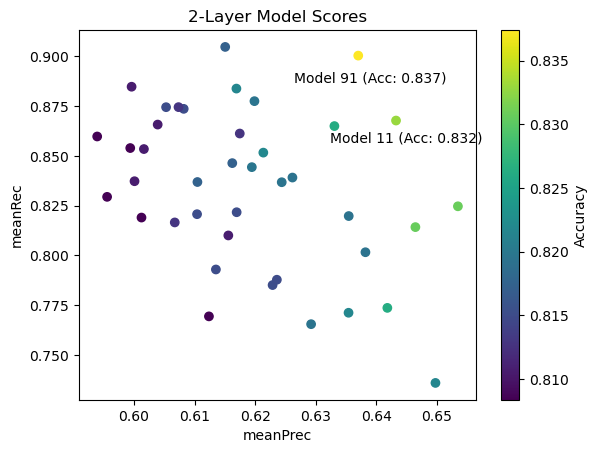

In [29]:
import matplotlib.pyplot as plt
plt.scatter(Scores_2Layered.meanPrec.head(40), Scores_2Layered.meanRec.head(40), c=Scores_2Layered.meanAcc.head(40))
plt.colorbar(label='Accuracy')
plt.xlabel("meanPrec")
plt.ylabel("meanRec")
plt.annotate("Model 91 (Acc: 0.837)", 
             (0.639, 0.88),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='center')  
plt.annotate("Model 11 (Acc: 0.832)", 
             (0.645, 0.85),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='center')  
plt.title("2-Layer Model Scores")
plt.show()

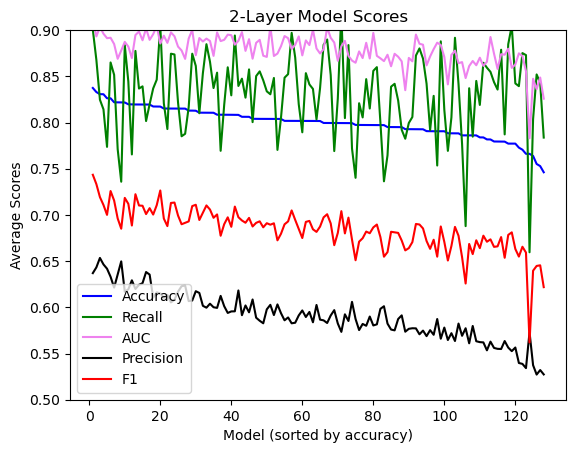

In [31]:
x=np.linspace(1, 128, 128, endpoint=True)
plt.plot(x, Scores_2Layered.meanAcc, color = 'blue', label = 'Accuracy')
plt.plot(x, Scores_2Layered.meanRec, color = 'green', label = 'Recall')
plt.plot(x, Scores_2Layered.meanAUC, color = 'violet', label = 'AUC')
plt.plot(x, Scores_2Layered.meanPrec, color = 'black', label = 'Precision')
plt.plot(x, Scores_2Layered.meanF1, color = 'red', label = 'F1')
plt.ylim(0.5,0.9)
plt.title("2-Layer Model Scores")
plt.xlabel("Model (sorted by accuracy)")
plt.ylabel("Average Scores")
plt.legend()
plt.show()

## Train the best deep network

In [ ]:
# include batch normalization, Relu and a kernel initializer and adam to avoid vanishing gradient problems 

In [ ]:
#Try one with 4 layers

In [9]:
from tensorflow.keras.layers import BatchNormalization

In [35]:
tf.random.set_seed(0)
seed(42)
def get_mlp_model3(hiddenLayerOne=24, hiddenLayerTwo=14,hiddenLayerThree=8, hiddenLayerFour=8,
    dropout=0.25, learnRate=0.002, regul = 0.011):
    # initialize a sequential model and add layer to flatten the
    # input data
    model = Sequential()
    model.add(Flatten())
    # add two stacks of FC => RELU => DROPOUT
    model.add(Dense(hiddenLayerOne, activation="relu",input_shape=(784,), activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerTwo, activation= "relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerThree, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerFour, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    # add a softmax layer on top
    model.add(Dense(1, activation="sigmoid"))
    # compile the model
    model.compile(optimizer=Adam(learning_rate=learnRate),loss="binary_crossentropy",metrics=["accuracy", tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
    # return compiled model
    return model

In [36]:
tf.random.set_seed(0)
seed(42)
def score_model3L(hiddenLayerOne, hiddenLayerTwo,hiddenLayerThree, hiddenLayerFour,
    dropout, learnRate, regul, epochs, batchs, cv=None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    if cv is None:
        cv = KFold(n_splits=5, random_state=42, shuffle = True)

    smoter = RandomOverSampler(sampling_strategy=1, random_state=42)
    
    scores = []

    for train_fold_index, val_fold_index in cv.split(X_train, y_train):
        # Get the training data
        X_train_fold, y_train_fold = X_train.iloc[train_fold_index,:], y_train.iloc[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X_train.iloc[val_fold_index,:], y_train.iloc[val_fold_index]

        # Upsample only the data in the training section
        X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,
                                                                           y_train_fold)
        # Fit the model on the upsampled training data
        model = get_mlp_model3(hiddenLayerOne=hiddenLayerOne, hiddenLayerTwo=hiddenLayerTwo, hiddenLayerThree=hiddenLayerThree, hiddenLayerFour=hiddenLayerFour, dropout=dropout, learnRate= learnRate, regul=regul)
        model_obj = model.fit(X_train_fold_upsample, y_train_fold_upsample, epochs = epochs, batch_size = batchs, verbose = 1)
        # Score the model on the (non-upsampled) validation data
        score = model.evaluate(X_val_fold, y_val_fold)
        model_proba = model.predict(X_val_fold)
        model_trues = pd.DataFrame(tf.greater(model_proba, 0.5))
        model_preds = model_trues.astype(int)
        model_F1 = f1_score(y_val_fold, model_preds)
        score.append(model_F1)
        scores.append(score)
    return np.array(scores)

# Example of the model in action




In [37]:
grid3L = dict(
    hiddenLayerOne=[4,3],
    hiddenLayerThree=[4, 3],
    hiddenLayerFour=[4, 3],
    learnRate=[0.007],
    hiddenLayerTwo=[6, 4],
    dropout=[0.0, 0.1],
    epochs=[10,20],
    regul = [0.0, 0.05], 
    batchs = [16, 32]
)

In [38]:
tf.random.set_seed(0)
seed(42)
score_tracker3L = []
for n_nodes1 in grid3L['hiddenLayerOne']:
    for n_nodes2 in grid3L['hiddenLayerTwo']:
        for n_nodes3 in grid3L['hiddenLayerThree']:
            for learnings in grid3L['learnRate']:
                for dropts in grid3L['dropout']:
                    for reguls in grid3L['regul']:
                        for epochs in grid3L['epochs']: 
                            for batchs in grid3L['batchs']:
                                parameter_track = {'hiddenLayerOne': n_nodes1,
                                                   'learnRate': learnings,
                                                   'hiddenLayerTwo': n_nodes2,
                                                   'hiddenLayerThree': n_nodes3,
                                                   'hiddenLayerFour': n_nodes1,
                                                   'dropout': dropts,
                                                   'epochs': epochs,
                                                   'batchs':batchs,
                                                   'regul': reguls}
                                scores = score_model3L(hiddenLayerOne=n_nodes1, 
                                                       hiddenLayerTwo=n_nodes2,
                                                       hiddenLayerThree=n_nodes3,
                                                       hiddenLayerFour=n_nodes1,
                                                       dropout=dropts, 
                                                       learnRate=learnings, 
                                                       regul=reguls,
                                                       epochs=epochs,
                                                       batchs=batchs,
                                                       cv=None)
                                parameter_track['accuracy']= scores[:,1]
                                parameter_track['AUC']= scores[:,2]
                                parameter_track['recall']= scores[:,4]
                                parameter_track['precision']= scores[:,3]
                                parameter_track['F1']= scores[:,5]


                                score_tracker3L.append(parameter_track)


Epoch 1/10
33/33 [==============================] - 1s 15ms/step - loss: 0.6746 - accuracy: 0.5623 - auc_640: 0.7024 - precision_640: 0.5346 - recall_640: 0.9611
Epoch 2/10
33/33 [==============================] - 0s 14ms/step - loss: 0.5979 - accuracy: 0.7685 - auc_640: 0.8572 - precision_640: 0.6875 - recall_640: 0.9844
Epoch 3/10
33/33 [==============================] - 1s 16ms/step - loss: 0.5268 - accuracy: 0.8152 - auc_640: 0.9018 - precision_640: 0.7411 - recall_640: 0.9689
Epoch 4/10
33/33 [==============================] - 0s 13ms/step - loss: 0.4943 - accuracy: 0.8541 - auc_640: 0.9059 - precision_640: 0.7898 - recall_640: 0.9650
Epoch 5/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4550 - accuracy: 0.8599 - auc_640: 0.9139 - precision_640: 0.7994 - recall_640: 0.9611
Epoch 6/10
33/33 [==============================] - 1s 16ms/step - loss: 0.3263 - accuracy: 0.8735 - auc_640: 0.9328 - precision_640: 0.8200 - recall_640: 0.9572
Epoch 7/10
33/33 [==========

17/17 [==============================] - 0s 17ms/step - loss: 0.5956 - accuracy: 0.7748 - auc_649: 0.8252 - precision_649: 0.7647 - recall_649: 0.7939
Epoch 3/10
17/17 [==============================] - 0s 13ms/step - loss: 0.4995 - accuracy: 0.8053 - auc_649: 0.8659 - precision_649: 0.7920 - recall_649: 0.8282
Epoch 4/10
17/17 [==============================] - 0s 12ms/step - loss: 0.4112 - accuracy: 0.8187 - auc_649: 0.9015 - precision_649: 0.8014 - recall_649: 0.8473
Epoch 5/10
17/17 [==============================] - 0s 12ms/step - loss: 0.3586 - accuracy: 0.8531 - auc_649: 0.9182 - precision_649: 0.8315 - recall_649: 0.8855
Epoch 6/10
17/17 [==============================] - 0s 12ms/step - loss: 0.3138 - accuracy: 0.8683 - auc_649: 0.9377 - precision_649: 0.8294 - recall_649: 0.9275
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.2879 - accuracy: 0.8836 - auc_649: 0.9446 - precision_649: 0.8502 - recall_649: 0.9313
Epoch 8/10
17/17 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.2559 - accuracy: 0.8969 - auc_654: 0.9455 - precision_654: 0.8377 - recall_654: 0.9847
Epoch 8/20
33/33 [==============================] - 0s 13ms/step - loss: 0.2496 - accuracy: 0.9046 - auc_654: 0.9432 - precision_654: 0.8533 - recall_654: 0.9771
Epoch 9/20
33/33 [==============================] - 1s 17ms/step - loss: 0.2417 - accuracy: 0.9008 - auc_654: 0.9508 - precision_654: 0.8547 - recall_654: 0.9656
Epoch 10/20
33/33 [==============================] - 1s 16ms/step - loss: 0.2403 - accuracy: 0.9008 - auc_654: 0.9509 - precision_654: 0.8523 - recall_654: 0.9695
Epoch 11/20
33/33 [==============================] - 1s 16ms/step - loss: 0.2295 - accuracy: 0.9084 - auc_654: 0.9538 - precision_654: 0.8591 - recall_654: 0.9771
Epoch 12/20
33/33 [==============================] - 0s 12ms/step - loss: 0.2234 - accuracy: 0.9103 - auc_654: 0.9580 - precision_654: 0.8620 - recall_654: 0.9771
Epoch 13/20
33/33 [=================

17/17 [==============================] - 0s 18ms/step - loss: 0.5916 - accuracy: 0.7004 - auc_659: 0.7457 - precision_659: 0.6567 - recall_659: 0.8397
Epoch 3/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5496 - accuracy: 0.7710 - auc_659: 0.7901 - precision_659: 0.7088 - recall_659: 0.9198
Epoch 4/20
17/17 [==============================] - 0s 14ms/step - loss: 0.5120 - accuracy: 0.7844 - auc_659: 0.8239 - precision_659: 0.7395 - recall_659: 0.8779
Epoch 5/20
17/17 [==============================] - 0s 15ms/step - loss: 0.4770 - accuracy: 0.8092 - auc_659: 0.8496 - precision_659: 0.7682 - recall_659: 0.8855
Epoch 6/20
17/17 [==============================] - 0s 14ms/step - loss: 0.4370 - accuracy: 0.8302 - auc_659: 0.8700 - precision_659: 0.7874 - recall_659: 0.9046
Epoch 7/20
17/17 [==============================] - 0s 15ms/step - loss: 0.4008 - accuracy: 0.8702 - auc_659: 0.8942 - precision_659: 0.8170 - recall_659: 0.9542
Epoch 8/20
17/17 [=====================

18/18 [==============================] - 0s 14ms/step - loss: 0.7053 - accuracy: 0.4982 - auc_667: 0.4982 - precision_667: 0.0000e+00 - recall_667: 0.0000e+00
Epoch 5/10
18/18 [==============================] - 0s 13ms/step - loss: 0.6996 - accuracy: 0.5000 - auc_667: 0.5000 - precision_667: 0.0000e+00 - recall_667: 0.0000e+00
Epoch 6/10
18/18 [==============================] - 0s 13ms/step - loss: 0.6972 - accuracy: 0.5000 - auc_667: 0.5000 - precision_667: 0.0000e+00 - recall_667: 0.0000e+00
Epoch 7/10
18/18 [==============================] - 0s 12ms/step - loss: 0.6962 - accuracy: 0.5000 - auc_667: 0.5000 - precision_667: 0.0000e+00 - recall_667: 0.0000e+00
Epoch 8/10
18/18 [==============================] - 0s 13ms/step - loss: 0.6955 - accuracy: 0.5000 - auc_667: 0.5000 - precision_667: 0.0000e+00 - recall_667: 0.0000e+00
Epoch 9/10
18/18 [==============================] - 0s 13ms/step - loss: 0.6948 - accuracy: 0.5000 - auc_667: 0.5000 - precision_667: 0.0000e+00 - recall_667: 0.

33/33 [==============================] - 1s 21ms/step - loss: 0.4829 - accuracy: 0.8697 - auc_673: 0.8779 - precision_673: 0.7988 - recall_673: 0.9885
Epoch 8/20
33/33 [==============================] - 1s 26ms/step - loss: 0.4628 - accuracy: 0.8678 - auc_673: 0.8756 - precision_673: 0.7963 - recall_673: 0.9885
Epoch 9/20
33/33 [==============================] - 1s 27ms/step - loss: 0.4518 - accuracy: 0.8678 - auc_673: 0.8829 - precision_673: 0.8000 - recall_673: 0.9808
Epoch 10/20
33/33 [==============================] - 1s 28ms/step - loss: 0.4242 - accuracy: 0.8870 - auc_673: 0.9047 - precision_673: 0.8196 - recall_673: 0.9923
Epoch 11/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4129 - accuracy: 0.8831 - auc_673: 0.8918 - precision_673: 0.8145 - recall_673: 0.9923
Epoch 12/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4069 - accuracy: 0.8851 - auc_673: 0.8954 - precision_673: 0.8211 - recall_673: 0.9847
Epoch 13/20
33/33 [=================

17/17 [==============================] - 0s 12ms/step - loss: 0.8059 - accuracy: 0.5843 - auc_678: 0.6047 - precision_678: 0.5495 - recall_678: 0.9349
Epoch 3/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7595 - accuracy: 0.5613 - auc_678: 0.6052 - precision_678: 0.5336 - recall_678: 0.9732
Epoch 4/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7340 - accuracy: 0.5441 - auc_678: 0.5368 - precision_678: 0.5237 - recall_678: 0.9732
Epoch 5/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7180 - accuracy: 0.5441 - auc_678: 0.5426 - precision_678: 0.5231 - recall_678: 0.9962
Epoch 6/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7088 - accuracy: 0.5402 - auc_678: 0.5441 - precision_678: 0.5210 - recall_678: 1.0000
Epoch 7/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7037 - accuracy: 0.5326 - auc_678: 0.5326 - precision_678: 0.5168 - recall_678: 1.0000
Epoch 8/20
17/17 [=====================

17/17 [==============================] - 0s 13ms/step - loss: 0.5992 - accuracy: 0.7276 - auc_685: 0.7805 - precision_685: 0.7368 - recall_685: 0.7082
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5695 - accuracy: 0.7529 - auc_685: 0.7901 - precision_685: 0.7686 - recall_685: 0.7237
Epoch 8/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5608 - accuracy: 0.7490 - auc_685: 0.7977 - precision_685: 0.7645 - recall_685: 0.7198
Epoch 9/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5503 - accuracy: 0.7626 - auc_685: 0.8001 - precision_685: 0.7948 - recall_685: 0.7082
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.5344 - accuracy: 0.8444 - auc_685: 0.9321 - precision_685: 0.5714 - recall_685: 0.8889
Epoch 1/10
17/17 [==============================] - 1s 14ms/step - loss: 0.7080 - accuracy: 0.5095 - auc_686: 0.5237 - precision_686: 0.5058 - recall_686: 0.8251
Epoch 2/10
17/17 [======================

33/33 [==============================] - 0s 12ms/step - loss: 0.5761 - accuracy: 0.6693 - auc_690: 0.7633 - precision_690: 0.6465 - recall_690: 0.7471
Epoch 3/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4804 - accuracy: 0.7490 - auc_690: 0.8455 - precision_690: 0.7013 - recall_690: 0.8677
Epoch 4/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4623 - accuracy: 0.7899 - auc_690: 0.8616 - precision_690: 0.7596 - recall_690: 0.8482
Epoch 5/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4658 - accuracy: 0.7685 - auc_690: 0.8445 - precision_690: 0.7255 - recall_690: 0.8638
Epoch 6/20
33/33 [==============================] - 0s 14ms/step - loss: 0.4542 - accuracy: 0.7879 - auc_690: 0.8665 - precision_690: 0.7500 - recall_690: 0.8638
Epoch 7/20
33/33 [==============================] - 0s 14ms/step - loss: 0.4267 - accuracy: 0.7860 - auc_690: 0.8730 - precision_690: 0.7653 - recall_690: 0.8249
Epoch 8/20
33/33 [=====================

33/33 [==============================] - 0s 14ms/step - loss: 0.2475 - accuracy: 0.9103 - auc_694: 0.9254 - precision_694: 0.8571 - recall_694: 0.9847
Epoch 19/20
33/33 [==============================] - 0s 13ms/step - loss: 0.2644 - accuracy: 0.9027 - auc_694: 0.9266 - precision_694: 0.8482 - recall_694: 0.9809
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.5398 - accuracy: 0.7978 - auc_694: 0.8572 - precision_694: 0.5556 - recall_694: 0.9091
Epoch 1/20
17/17 [==============================] - 1s 14ms/step - loss: 0.6873 - accuracy: 0.5058 - auc_695: 0.5629 - precision_695: 0.5071 - recall_695: 0.4163
Epoch 2/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6655 - accuracy: 0.6012 - auc_695: 0.6231 - precision_695: 0.6083 - recall_695: 0.5681
Epoch 3/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6137 - accuracy: 0.6732 - auc_695: 0.7224 - precision_695: 0.6642 - recall_695: 0.7004
Epoch 4/20
17/17 [=====================

17/17 [==============================] - 0s 12ms/step - loss: 0.3102 - accuracy: 0.8779 - auc_699: 0.9045 - precision_699: 0.8214 - recall_699: 0.9656
Epoch 14/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3058 - accuracy: 0.8779 - auc_699: 0.9178 - precision_699: 0.8214 - recall_699: 0.9656
Epoch 15/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2896 - accuracy: 0.8855 - auc_699: 0.9219 - precision_699: 0.8237 - recall_699: 0.9809
Epoch 16/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3204 - accuracy: 0.8645 - auc_699: 0.9058 - precision_699: 0.8131 - recall_699: 0.9466
Epoch 17/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3147 - accuracy: 0.8760 - auc_699: 0.9022 - precision_699: 0.8188 - recall_699: 0.9656
Epoch 18/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2926 - accuracy: 0.8893 - auc_699: 0.9075 - precision_699: 0.8290 - recall_699: 0.9809
Epoch 19/20
17/17 [===============

17/17 [==============================] - 0s 14ms/step - loss: 0.7404 - accuracy: 0.4962 - auc_708: 0.4962 - precision_708: 0.0000e+00 - recall_708: 0.0000e+00
Epoch 5/10
17/17 [==============================] - 0s 14ms/step - loss: 0.7197 - accuracy: 0.4981 - auc_708: 0.4981 - precision_708: 0.0000e+00 - recall_708: 0.0000e+00
Epoch 6/10
17/17 [==============================] - 0s 15ms/step - loss: 0.7102 - accuracy: 0.5000 - auc_708: 0.5000 - precision_708: 0.0000e+00 - recall_708: 0.0000e+00
Epoch 7/10
17/17 [==============================] - 0s 14ms/step - loss: 0.7044 - accuracy: 0.5000 - auc_708: 0.5000 - precision_708: 0.0000e+00 - recall_708: 0.0000e+00
Epoch 8/10
17/17 [==============================] - 0s 14ms/step - loss: 0.7007 - accuracy: 0.5000 - auc_708: 0.5000 - precision_708: 0.0000e+00 - recall_708: 0.0000e+00
Epoch 9/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6982 - accuracy: 0.4981 - auc_708: 0.4981 - precision_708: 0.0000e+00 - recall_708: 0.

33/33 [==============================] - 0s 12ms/step - loss: 0.5465 - accuracy: 0.7682 - auc_713: 0.7805 - precision_713: 0.6862 - recall_713: 0.9885
Epoch 20/20
3/3 [==============================] - 1s 18ms/step - loss: 0.5093 - accuracy: 0.7556 - auc_713: 0.8456 - precision_713: 0.5000 - recall_713: 1.0000
Epoch 1/20
33/33 [==============================] - 1s 13ms/step - loss: 0.8689 - accuracy: 0.5153 - auc_714: 0.5275 - precision_714: 0.5435 - recall_714: 0.1908
Epoch 2/20
33/33 [==============================] - 0s 13ms/step - loss: 0.7310 - accuracy: 0.4943 - auc_714: 0.5133 - precision_714: 0.4921 - recall_714: 0.3550
Epoch 3/20
33/33 [==============================] - 0s 13ms/step - loss: 0.7076 - accuracy: 0.4809 - auc_714: 0.4692 - precision_714: 0.4872 - recall_714: 0.7252
Epoch 4/20
33/33 [==============================] - 0s 13ms/step - loss: 0.7003 - accuracy: 0.4733 - auc_714: 0.5000 - precision_714: 0.4852 - recall_714: 0.8779
Epoch 5/20
33/33 [======================

17/17 [==============================] - 0s 13ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_718: 0.5000 - precision_718: 0.0000e+00 - recall_718: 0.0000e+00
Epoch 14/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_718: 0.5000 - precision_718: 0.0000e+00 - recall_718: 0.0000e+00
Epoch 15/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_718: 0.5000 - precision_718: 0.0000e+00 - recall_718: 0.0000e+00
Epoch 16/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_718: 0.5000 - precision_718: 0.0000e+00 - recall_718: 0.0000e+00
Epoch 17/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_718: 0.5000 - precision_718: 0.0000e+00 - recall_718: 0.0000e+00
Epoch 18/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.4808 - auc_718: 0.5000 - precision_718: 0.4873 - recall_718: 0

17/17 [==============================] - 0s 11ms/step - loss: 0.3901 - accuracy: 0.8517 - auc_726: 0.9032 - precision_726: 0.8685 - recall_726: 0.8289
Epoch 6/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3584 - accuracy: 0.8384 - auc_726: 0.9210 - precision_726: 0.8248 - recall_726: 0.8593
Epoch 7/10
17/17 [==============================] - 0s 11ms/step - loss: 0.3307 - accuracy: 0.8688 - auc_726: 0.9323 - precision_726: 0.8593 - recall_726: 0.8821
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2959 - accuracy: 0.8764 - auc_726: 0.9459 - precision_726: 0.8898 - recall_726: 0.8593
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2635 - accuracy: 0.8954 - auc_726: 0.9550 - precision_726: 0.8611 - recall_726: 0.9430
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.3745 - accuracy: 0.8222 - auc_726: 0.9214 - precision_726: 0.6000 - recall_726: 1.0000
Epoch 1/10
18/18 [======================

35/35 [==============================] - 0s 11ms/step - loss: 0.1768 - accuracy: 0.9634 - auc_732: 0.9805 - precision_732: 0.9377 - recall_732: 0.9927
Epoch 20/20
3/3 [==============================] - 0s 15ms/step - loss: 1.2415 - accuracy: 0.7444 - auc_732: 0.7789 - precision_732: 0.6410 - recall_732: 0.7353
Epoch 1/20
33/33 [==============================] - 1s 12ms/step - loss: 0.6828 - accuracy: 0.6111 - auc_733: 0.6408 - precision_733: 0.5751 - recall_733: 0.8506
Epoch 2/20
33/33 [==============================] - 0s 11ms/step - loss: 0.6095 - accuracy: 0.7299 - auc_733: 0.8179 - precision_733: 0.7027 - recall_733: 0.7969
Epoch 3/20
33/33 [==============================] - 0s 11ms/step - loss: 0.5476 - accuracy: 0.7874 - auc_733: 0.8818 - precision_733: 0.7517 - recall_733: 0.8582
Epoch 4/20
33/33 [==============================] - 0s 12ms/step - loss: 0.5106 - accuracy: 0.8027 - auc_733: 0.8958 - precision_733: 0.8015 - recall_733: 0.8046
Epoch 5/20
33/33 [======================

18/18 [==============================] - 0s 11ms/step - loss: 0.1865 - accuracy: 0.9414 - auc_737: 0.9684 - precision_737: 0.9113 - recall_737: 0.9780
Epoch 15/20
18/18 [==============================] - 0s 11ms/step - loss: 0.1780 - accuracy: 0.9432 - auc_737: 0.9701 - precision_737: 0.8980 - recall_737: 1.0000
Epoch 16/20
18/18 [==============================] - 0s 11ms/step - loss: 0.1619 - accuracy: 0.9505 - auc_737: 0.9753 - precision_737: 0.9184 - recall_737: 0.9890
Epoch 17/20
18/18 [==============================] - 0s 12ms/step - loss: 0.1584 - accuracy: 0.9542 - auc_737: 0.9763 - precision_737: 0.9218 - recall_737: 0.9927
Epoch 18/20
18/18 [==============================] - 0s 13ms/step - loss: 0.1555 - accuracy: 0.9487 - auc_737: 0.9820 - precision_737: 0.9153 - recall_737: 0.9890
Epoch 19/20
18/18 [==============================] - 0s 11ms/step - loss: 0.1453 - accuracy: 0.9505 - auc_737: 0.9805 - precision_737: 0.9128 - recall_737: 0.9963
Epoch 20/20
3/3 [=================

33/33 [==============================] - 0s 12ms/step - loss: 0.7029 - accuracy: 0.4866 - auc_744: 0.5250 - precision_744: 0.4696 - recall_744: 0.2061
Epoch 7/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6996 - accuracy: 0.5229 - auc_744: 0.5290 - precision_744: 0.7500 - recall_744: 0.0687
Epoch 8/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6972 - accuracy: 0.5286 - auc_744: 0.5310 - precision_744: 0.8000 - recall_744: 0.0763
Epoch 9/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6989 - accuracy: 0.5153 - auc_744: 0.5180 - precision_744: 0.6429 - recall_744: 0.0687
Epoch 10/10
3/3 [==============================] - 0s 18ms/step - loss: 0.7025 - accuracy: 0.7640 - auc_744: 0.5706 - precision_744: 0.5714 - recall_744: 0.1818
Epoch 1/10
17/17 [==============================] - 1s 14ms/step - loss: 0.8313 - accuracy: 0.6498 - auc_745: 0.7214 - precision_745: 0.6410 - recall_745: 0.6809
Epoch 2/10
17/17 [======================

33/33 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.4962 - auc_751: 0.5000 - precision_751: 0.4971 - recall_751: 0.6616
Epoch 20/20
3/3 [==============================] - 0s 15ms/step - loss: 0.6959 - accuracy: 0.2667 - auc_751: 0.5000 - precision_751: 0.2667 - recall_751: 1.0000
Epoch 1/20
35/35 [==============================] - 1s 13ms/step - loss: 0.9289 - accuracy: 0.5659 - auc_752: 0.6057 - precision_752: 0.5732 - recall_752: 0.5165
Epoch 2/20
35/35 [==============================] - 0s 12ms/step - loss: 0.7455 - accuracy: 0.5256 - auc_752: 0.5353 - precision_752: 0.7188 - recall_752: 0.0842
Epoch 3/20
35/35 [==============================] - 0s 12ms/step - loss: 0.7191 - accuracy: 0.4982 - auc_752: 0.5055 - precision_752: 0.3333 - recall_752: 0.0037
Epoch 4/20
35/35 [==============================] - 0s 12ms/step - loss: 0.7060 - accuracy: 0.4982 - auc_752: 0.5073 - precision_752: 0.0000e+00 - recall_752: 0.0000e+00
Epoch 5/20
35/35 [==============

17/17 [==============================] - 0s 12ms/step - loss: 0.6938 - accuracy: 0.4848 - auc_756: 0.4620 - precision_756: 0.4919 - recall_756: 0.9240
Epoch 14/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_756: 0.5000 - precision_756: 0.5000 - recall_756: 1.0000
Epoch 15/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_756: 0.5000 - precision_756: 0.5000 - recall_756: 1.0000
Epoch 16/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6933 - accuracy: 0.4734 - auc_756: 0.5000 - precision_756: 0.4832 - recall_756: 0.7643
Epoch 17/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.4696 - auc_756: 0.5000 - precision_756: 0.4167 - recall_756: 0.1521
Epoch 18/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_756: 0.5000 - precision_756: 0.0000e+00 - recall_756: 0.0000e+00
Epoch 19/20
17/17 [=======

35/35 [==============================] - 0s 13ms/step - loss: 0.4539 - accuracy: 0.8205 - auc_762: 0.8435 - precision_762: 0.7709 - recall_762: 0.9121
Epoch 8/10
35/35 [==============================] - 0s 12ms/step - loss: 0.4088 - accuracy: 0.8462 - auc_762: 0.8750 - precision_762: 0.7962 - recall_762: 0.9304
Epoch 9/10
35/35 [==============================] - 0s 12ms/step - loss: 0.4215 - accuracy: 0.8608 - auc_762: 0.8829 - precision_762: 0.8147 - recall_762: 0.9341
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.6285 - accuracy: 0.7889 - auc_762: 0.8230 - precision_762: 0.6829 - recall_762: 0.8235
Epoch 1/10
33/33 [==============================] - 1s 13ms/step - loss: 0.6781 - accuracy: 0.5077 - auc_763: 0.6207 - precision_763: 0.5250 - recall_763: 0.1609
Epoch 2/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6059 - accuracy: 0.6494 - auc_763: 0.6959 - precision_763: 0.6309 - recall_763: 0.7203
Epoch 3/10
33/33 [======================

18/18 [==============================] - 0s 13ms/step - loss: 0.5433 - accuracy: 0.7344 - auc_767: 0.8143 - precision_767: 0.7481 - recall_767: 0.7070
Epoch 4/10
18/18 [==============================] - 0s 12ms/step - loss: 0.5072 - accuracy: 0.7747 - auc_767: 0.8467 - precision_767: 0.7863 - recall_767: 0.7546
Epoch 5/10
18/18 [==============================] - 0s 12ms/step - loss: 0.4621 - accuracy: 0.8168 - auc_767: 0.8368 - precision_767: 0.7598 - recall_767: 0.9267
Epoch 6/10
18/18 [==============================] - 0s 12ms/step - loss: 0.4527 - accuracy: 0.8022 - auc_767: 0.8386 - precision_767: 0.7419 - recall_767: 0.9267
Epoch 7/10
18/18 [==============================] - 0s 12ms/step - loss: 0.4383 - accuracy: 0.8168 - auc_767: 0.8415 - precision_767: 0.7522 - recall_767: 0.9451
Epoch 8/10
18/18 [==============================] - 0s 13ms/step - loss: 0.4340 - accuracy: 0.8132 - auc_767: 0.8433 - precision_767: 0.7522 - recall_767: 0.9341
Epoch 9/10
18/18 [=====================

33/33 [==============================] - 0s 12ms/step - loss: 0.5271 - accuracy: 0.7510 - auc_773: 0.7767 - precision_773: 0.8429 - recall_773: 0.6169
Epoch 8/20
33/33 [==============================] - 0s 12ms/step - loss: 0.5126 - accuracy: 0.7893 - auc_773: 0.8387 - precision_773: 0.8612 - recall_773: 0.6897
Epoch 9/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4945 - accuracy: 0.8008 - auc_773: 0.8639 - precision_773: 0.8720 - recall_773: 0.7050
Epoch 10/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4709 - accuracy: 0.7969 - auc_773: 0.8853 - precision_773: 0.8605 - recall_773: 0.7088
Epoch 11/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4203 - accuracy: 0.8161 - auc_773: 0.9060 - precision_773: 0.8571 - recall_773: 0.7586
Epoch 12/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4345 - accuracy: 0.8410 - auc_773: 0.8884 - precision_773: 0.8973 - recall_773: 0.7701
Epoch 13/20
33/33 [=================

17/17 [==============================] - 0s 14ms/step - loss: 0.6524 - accuracy: 0.6169 - auc_778: 0.6445 - precision_778: 0.5974 - recall_778: 0.7165
Epoch 3/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5947 - accuracy: 0.7107 - auc_778: 0.7747 - precision_778: 0.6571 - recall_778: 0.8812
Epoch 4/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5053 - accuracy: 0.7605 - auc_778: 0.8264 - precision_778: 0.7282 - recall_778: 0.8314
Epoch 5/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4668 - accuracy: 0.7529 - auc_778: 0.8434 - precision_778: 0.6908 - recall_778: 0.9157
Epoch 6/20
17/17 [==============================] - 0s 17ms/step - loss: 0.4531 - accuracy: 0.8065 - auc_778: 0.8690 - precision_778: 0.7632 - recall_778: 0.8889
Epoch 7/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4213 - accuracy: 0.8008 - auc_778: 0.8759 - precision_778: 0.7540 - recall_778: 0.8927
Epoch 8/20
17/17 [=====================

17/17 [==============================] - 0s 15ms/step - loss: 0.6693 - accuracy: 0.7160 - auc_785: 0.7336 - precision_785: 0.6412 - recall_785: 0.9805
Epoch 6/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6411 - accuracy: 0.7451 - auc_785: 0.7665 - precision_785: 0.6649 - recall_785: 0.9883
Epoch 7/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6295 - accuracy: 0.7412 - auc_785: 0.7698 - precision_785: 0.6623 - recall_785: 0.9844
Epoch 8/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6117 - accuracy: 0.7802 - auc_785: 0.7958 - precision_785: 0.6989 - recall_785: 0.9844
Epoch 9/10
17/17 [==============================] - 0s 15ms/step - loss: 0.5905 - accuracy: 0.7879 - auc_785: 0.8084 - precision_785: 0.7056 - recall_785: 0.9883
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.5556 - accuracy: 0.7889 - auc_785: 0.8877 - precision_785: 0.4857 - recall_785: 0.9444
Epoch 1/10
17/17 [======================

35/35 [==============================] - 0s 13ms/step - loss: 0.6941 - accuracy: 0.5000 - auc_792: 0.5000 - precision_792: 0.0000e+00 - recall_792: 0.0000e+00
Epoch 9/20
35/35 [==============================] - 0s 13ms/step - loss: 0.6939 - accuracy: 0.5000 - auc_792: 0.5000 - precision_792: 0.0000e+00 - recall_792: 0.0000e+00
Epoch 10/20
35/35 [==============================] - 0s 13ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_792: 0.5000 - precision_792: 0.0000e+00 - recall_792: 0.0000e+00
Epoch 11/20
35/35 [==============================] - 0s 13ms/step - loss: 0.6934 - accuracy: 0.4780 - auc_792: 0.5000 - precision_792: 0.4838 - recall_792: 0.6557
Epoch 12/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_792: 0.4927 - precision_792: 0.5000 - recall_792: 1.0000
Epoch 13/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_792: 0.5000 - precision_792: 0.5000 - recall_792: 1.0000
Epoch 14/20

18/18 [==============================] - 0s 16ms/step - loss: 0.7443 - accuracy: 0.5549 - auc_797: 0.5349 - precision_797: 0.5293 - recall_797: 0.9927
Epoch 3/20
18/18 [==============================] - 0s 13ms/step - loss: 0.7216 - accuracy: 0.5513 - auc_797: 0.5302 - precision_797: 0.5281 - recall_797: 0.9634
Epoch 4/20
18/18 [==============================] - 0s 12ms/step - loss: 0.7081 - accuracy: 0.5549 - auc_797: 0.5373 - precision_797: 0.5291 - recall_797: 1.0000
Epoch 5/20
18/18 [==============================] - 0s 12ms/step - loss: 0.7021 - accuracy: 0.5128 - auc_797: 0.5330 - precision_797: 0.5393 - recall_797: 0.1758
Epoch 6/20
18/18 [==============================] - 0s 13ms/step - loss: 0.6978 - accuracy: 0.5000 - auc_797: 0.5293 - precision_797: 0.0000e+00 - recall_797: 0.0000e+00
Epoch 7/20
18/18 [==============================] - 0s 13ms/step - loss: 0.6972 - accuracy: 0.5000 - auc_797: 0.5275 - precision_797: 0.0000e+00 - recall_797: 0.0000e+00
Epoch 8/20
18/18 [=====

33/33 [==============================] - 0s 11ms/step - loss: 0.3159 - accuracy: 0.8544 - auc_803: 0.9346 - precision_803: 0.8246 - recall_803: 0.9004
Epoch 6/10
33/33 [==============================] - 0s 11ms/step - loss: 0.3052 - accuracy: 0.8659 - auc_803: 0.9337 - precision_803: 0.8498 - recall_803: 0.8889
Epoch 7/10
33/33 [==============================] - 0s 11ms/step - loss: 0.2762 - accuracy: 0.8774 - auc_803: 0.9463 - precision_803: 0.8582 - recall_803: 0.9042
Epoch 8/10
33/33 [==============================] - 0s 11ms/step - loss: 0.2695 - accuracy: 0.8812 - auc_803: 0.9477 - precision_803: 0.8262 - recall_803: 0.9655
Epoch 9/10
33/33 [==============================] - 0s 11ms/step - loss: 0.2592 - accuracy: 0.8946 - auc_803: 0.9500 - precision_803: 0.8552 - recall_803: 0.9502
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.4162 - accuracy: 0.8111 - auc_803: 0.8870 - precision_803: 0.5926 - recall_803: 0.7273
Epoch 1/10
33/33 [======================

33/33 [==============================] - 0s 12ms/step - loss: 0.2927 - accuracy: 0.8783 - auc_811: 0.9255 - precision_811: 0.8100 - recall_811: 0.9886
Epoch 8/20
33/33 [==============================] - 0s 12ms/step - loss: 0.2688 - accuracy: 0.8992 - auc_811: 0.9370 - precision_811: 0.8454 - recall_811: 0.9772
Epoch 9/20
33/33 [==============================] - 0s 12ms/step - loss: 0.2514 - accuracy: 0.9087 - auc_811: 0.9432 - precision_811: 0.8479 - recall_811: 0.9962
Epoch 10/20
33/33 [==============================] - 0s 12ms/step - loss: 0.2427 - accuracy: 0.9068 - auc_811: 0.9482 - precision_811: 0.8591 - recall_811: 0.9734
Epoch 11/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2283 - accuracy: 0.9144 - auc_811: 0.9520 - precision_811: 0.8633 - recall_811: 0.9848
Epoch 12/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2230 - accuracy: 0.9163 - auc_811: 0.9541 - precision_811: 0.8687 - recall_811: 0.9810
Epoch 13/20
33/33 [=================

17/17 [==============================] - 0s 13ms/step - loss: 0.6757 - accuracy: 0.6084 - auc_816: 0.6999 - precision_816: 0.7143 - recall_816: 0.3612
Epoch 3/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5900 - accuracy: 0.7357 - auc_816: 0.8257 - precision_816: 0.8196 - recall_816: 0.6046
Epoch 4/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4869 - accuracy: 0.8099 - auc_816: 0.8772 - precision_816: 0.8196 - recall_816: 0.7947
Epoch 5/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4178 - accuracy: 0.8650 - auc_816: 0.9108 - precision_816: 0.8310 - recall_816: 0.9163
Epoch 6/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3853 - accuracy: 0.8821 - auc_816: 0.8925 - precision_816: 0.8252 - recall_816: 0.9696
Epoch 7/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3541 - accuracy: 0.8954 - auc_816: 0.9115 - precision_816: 0.8377 - recall_816: 0.9810
Epoch 8/20
17/17 [=====================

33/33 [==============================] - 0s 12ms/step - loss: 0.4882 - accuracy: 0.8669 - auc_821: 0.8678 - precision_821: 0.7915 - recall_821: 0.9962
Epoch 8/10
33/33 [==============================] - 0s 12ms/step - loss: 0.4702 - accuracy: 0.8631 - auc_821: 0.8694 - precision_821: 0.7938 - recall_821: 0.9810
Epoch 9/10
33/33 [==============================] - 0s 12ms/step - loss: 0.4652 - accuracy: 0.8669 - auc_821: 0.8708 - precision_821: 0.7951 - recall_821: 0.9886
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.4972 - accuracy: 0.8000 - auc_821: 0.9018 - precision_821: 0.5750 - recall_821: 0.9583
Epoch 1/10
35/35 [==============================] - 1s 13ms/step - loss: 1.1436 - accuracy: 0.5989 - auc_822: 0.5869 - precision_822: 0.5877 - recall_822: 0.6630
Epoch 2/10
35/35 [==============================] - 0s 13ms/step - loss: 0.7876 - accuracy: 0.5055 - auc_822: 0.5083 - precision_822: 0.5306 - recall_822: 0.0952
Epoch 3/10
35/35 [======================

33/33 [==============================] - 0s 12ms/step - loss: 0.6947 - accuracy: 0.5000 - auc_830: 0.5000 - precision_830: 0.5000 - recall_830: 1.0000
Epoch 8/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6942 - accuracy: 0.5000 - auc_830: 0.4728 - precision_830: 0.5000 - recall_830: 1.0000
Epoch 9/20
33/33 [==============================] - 0s 11ms/step - loss: 0.6939 - accuracy: 0.4650 - auc_830: 0.4767 - precision_830: 0.4785 - recall_830: 0.7782
Epoch 10/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6937 - accuracy: 0.5000 - auc_830: 0.5039 - precision_830: 0.5000 - recall_830: 1.0000
Epoch 11/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6939 - accuracy: 0.4650 - auc_830: 0.4805 - precision_830: 0.4062 - recall_830: 0.1518
Epoch 12/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_830: 0.5000 - precision_830: 0.0000e+00 - recall_830: 0.0000e+00
Epoch 13/20
33/33 [=========

17/17 [==============================] - 0s 12ms/step - loss: 0.8187 - accuracy: 0.5272 - auc_835: 0.5141 - precision_835: 0.6750 - recall_835: 0.1051
Epoch 3/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7689 - accuracy: 0.5195 - auc_835: 0.4977 - precision_835: 0.6923 - recall_835: 0.0700
Epoch 4/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7414 - accuracy: 0.4864 - auc_835: 0.4882 - precision_835: 0.2667 - recall_835: 0.0156
Epoch 5/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7253 - accuracy: 0.4981 - auc_835: 0.4981 - precision_835: 0.0000e+00 - recall_835: 0.0000e+00
Epoch 6/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7150 - accuracy: 0.5039 - auc_835: 0.5000 - precision_835: 1.0000 - recall_835: 0.0078   
Epoch 7/20
17/17 [==============================] - 0s 12ms/step - loss: 0.7084 - accuracy: 0.5000 - auc_835: 0.5350 - precision_835: 0.5000 - recall_835: 1.0000
Epoch 8/20
17/17 [==========

17/17 [==============================] - 0s 13ms/step - loss: 0.4229 - accuracy: 0.8855 - auc_839: 0.8773 - precision_839: 0.8137 - recall_839: 1.0000
Epoch 17/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4090 - accuracy: 0.8912 - auc_839: 0.8983 - precision_839: 0.8213 - recall_839: 1.0000
Epoch 18/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4053 - accuracy: 0.8950 - auc_839: 0.8965 - precision_839: 0.8265 - recall_839: 1.0000
Epoch 19/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4058 - accuracy: 0.8931 - auc_839: 0.9027 - precision_839: 0.8280 - recall_839: 0.9924
Epoch 20/20
3/3 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 0.6966 - auc_839: 0.7676 - precision_839: 0.4390 - recall_839: 0.8182
Epoch 1/10
33/33 [==============================] - 1s 14ms/step - loss: 0.7228 - accuracy: 0.5739 - auc_840: 0.6033 - precision_840: 0.5540 - recall_840: 0.7588
Epoch 2/10
33/33 [===================

Epoch 2/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6743 - accuracy: 0.5821 - auc_844: 0.6323 - precision_844: 0.5592 - recall_844: 0.7748
Epoch 3/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6527 - accuracy: 0.6279 - auc_844: 0.6789 - precision_844: 0.6077 - recall_844: 0.7214
Epoch 4/10
33/33 [==============================] - 0s 12ms/step - loss: 0.5782 - accuracy: 0.6622 - auc_844: 0.7646 - precision_844: 0.7053 - recall_844: 0.5573
Epoch 5/10
33/33 [==============================] - 0s 12ms/step - loss: 0.5016 - accuracy: 0.7061 - auc_844: 0.8118 - precision_844: 0.7647 - recall_844: 0.5954
Epoch 6/10
33/33 [==============================] - 0s 12ms/step - loss: 0.4371 - accuracy: 0.7309 - auc_844: 0.8537 - precision_844: 0.7354 - recall_844: 0.7214
Epoch 7/10
33/33 [==============================] - 0s 12ms/step - loss: 0.4193 - accuracy: 0.7481 - auc_844: 0.8718 - precision_844: 0.7579 - recall_844: 0.7290
Epoch 8/10
33/33 [==========

33/33 [==============================] - 0s 13ms/step - loss: 0.3401 - accuracy: 0.8574 - auc_851: 0.8824 - precision_851: 0.7866 - recall_851: 0.9810
Epoch 16/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3372 - accuracy: 0.8650 - auc_851: 0.8906 - precision_851: 0.7963 - recall_851: 0.9810
Epoch 17/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3420 - accuracy: 0.8612 - auc_851: 0.8799 - precision_851: 0.7896 - recall_851: 0.9848
Epoch 18/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3221 - accuracy: 0.8726 - auc_851: 0.9060 - precision_851: 0.8025 - recall_851: 0.9886
Epoch 19/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3209 - accuracy: 0.8650 - auc_851: 0.9076 - precision_851: 0.7963 - recall_851: 0.9810
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.3998 - accuracy: 0.7889 - auc_851: 0.8845 - precision_851: 0.5641 - recall_851: 0.9167
Epoch 1/20
35/35 [==================

17/17 [==============================] - 0s 12ms/step - loss: 0.3810 - accuracy: 0.8517 - auc_856: 0.8743 - precision_856: 0.7761 - recall_856: 0.9886
Epoch 11/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3490 - accuracy: 0.8726 - auc_856: 0.9013 - precision_856: 0.8082 - recall_856: 0.9772
Epoch 12/20
17/17 [==============================] - 0s 13ms/step - loss: 0.3446 - accuracy: 0.8745 - auc_856: 0.8796 - precision_856: 0.8069 - recall_856: 0.9848
Epoch 13/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3116 - accuracy: 0.8916 - auc_856: 0.9078 - precision_856: 0.8280 - recall_856: 0.9886
Epoch 14/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3009 - accuracy: 0.8897 - auc_856: 0.9114 - precision_856: 0.8317 - recall_856: 0.9772
Epoch 15/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3114 - accuracy: 0.8916 - auc_856: 0.8956 - precision_856: 0.8280 - recall_856: 0.9886
Epoch 16/20
17/17 [===============

35/35 [==============================] - 0s 13ms/step - loss: 0.6983 - accuracy: 0.4707 - auc_862: 0.4982 - precision_862: 0.4773 - recall_862: 0.6154
Epoch 5/10
35/35 [==============================] - 0s 14ms/step - loss: 0.6956 - accuracy: 0.5000 - auc_862: 0.5000 - precision_862: 0.0000e+00 - recall_862: 0.0000e+00
Epoch 6/10
35/35 [==============================] - 0s 14ms/step - loss: 0.6941 - accuracy: 0.5000 - auc_862: 0.5000 - precision_862: 0.0000e+00 - recall_862: 0.0000e+00
Epoch 7/10
35/35 [==============================] - 0s 14ms/step - loss: 0.6938 - accuracy: 0.5000 - auc_862: 0.5000 - precision_862: 0.0000e+00 - recall_862: 0.0000e+00
Epoch 8/10
35/35 [==============================] - 0s 14ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_862: 0.5000 - precision_862: 0.0000e+00 - recall_862: 0.0000e+00
Epoch 9/10
35/35 [==============================] - 0s 14ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_862: 0.5000 - precision_862: 0.0000e+00 - recall_862: 0.0000e+00

33/33 [==============================] - 0s 14ms/step - loss: 0.6268 - accuracy: 0.7140 - auc_870: 0.7242 - precision_870: 0.6382 - recall_870: 0.9883
Epoch 17/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6259 - accuracy: 0.6907 - auc_870: 0.6877 - precision_870: 0.6184 - recall_870: 0.9961
Epoch 18/20
33/33 [==============================] - 0s 15ms/step - loss: 0.6203 - accuracy: 0.6984 - auc_870: 0.6975 - precision_870: 0.6250 - recall_870: 0.9922
Epoch 19/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6038 - accuracy: 0.7140 - auc_870: 0.7192 - precision_870: 0.6396 - recall_870: 0.9805
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.5174 - accuracy: 0.7667 - auc_870: 0.8495 - precision_870: 0.4595 - recall_870: 0.9444
Epoch 1/20
33/33 [==============================] - 1s 14ms/step - loss: 0.8974 - accuracy: 0.5038 - auc_871: 0.5001 - precision_871: 0.5061 - recall_871: 0.3156
Epoch 2/20
33/33 [===================

17/17 [==============================] - 0s 13ms/step - loss: 0.6999 - accuracy: 0.5156 - auc_875: 0.5156 - precision_875: 0.5079 - recall_875: 1.0000
Epoch 11/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6984 - accuracy: 0.5175 - auc_875: 0.5175 - precision_875: 0.5089 - recall_875: 1.0000
Epoch 12/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6968 - accuracy: 0.5097 - auc_875: 0.4970 - precision_875: 0.5049 - recall_875: 1.0000
Epoch 13/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6969 - accuracy: 0.4961 - auc_875: 0.5058 - precision_875: 0.4688 - recall_875: 0.0584
Epoch 14/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6962 - accuracy: 0.5019 - auc_875: 0.5007 - precision_875: 0.5010 - recall_875: 0.9377
Epoch 15/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6951 - accuracy: 0.5117 - auc_875: 0.5117 - precision_875: 0.5059 - recall_875: 1.0000
Epoch 16/20
17/17 [===============

33/33 [==============================] - 0s 12ms/step - loss: 0.3393 - accuracy: 0.8677 - auc_880: 0.9051 - precision_880: 0.8058 - recall_880: 0.9689
Epoch 5/10
33/33 [==============================] - 0s 12ms/step - loss: 0.3063 - accuracy: 0.8833 - auc_880: 0.9185 - precision_880: 0.8167 - recall_880: 0.9883
Epoch 6/10
33/33 [==============================] - 0s 12ms/step - loss: 0.2823 - accuracy: 0.8949 - auc_880: 0.9358 - precision_880: 0.8372 - recall_880: 0.9805
Epoch 7/10
33/33 [==============================] - 0s 11ms/step - loss: 0.2762 - accuracy: 0.8969 - auc_880: 0.9303 - precision_880: 0.8469 - recall_880: 0.9689
Epoch 8/10
33/33 [==============================] - 0s 12ms/step - loss: 0.2615 - accuracy: 0.9008 - auc_880: 0.9413 - precision_880: 0.8433 - recall_880: 0.9844
Epoch 9/10
33/33 [==============================] - 0s 12ms/step - loss: 0.2586 - accuracy: 0.8969 - auc_880: 0.9423 - precision_880: 0.8493 - recall_880: 0.9650
Epoch 10/10
3/3 [======================

17/17 [==============================] - 0s 11ms/step - loss: 0.3421 - accuracy: 0.8798 - auc_889: 0.8780 - precision_889: 0.8220 - recall_889: 0.9695
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.3018 - accuracy: 0.8893 - auc_889: 0.8840 - precision_889: 0.8208 - recall_889: 0.9962
Epoch 8/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2882 - accuracy: 0.8931 - auc_889: 0.8962 - precision_889: 0.8259 - recall_889: 0.9962
Epoch 9/10
17/17 [==============================] - 0s 11ms/step - loss: 0.2801 - accuracy: 0.8989 - auc_889: 0.8985 - precision_889: 0.8382 - recall_889: 0.9885
Epoch 10/10
3/3 [==============================] - 0s 14ms/step - loss: 0.4037 - accuracy: 0.8202 - auc_889: 0.8813 - precision_889: 0.5789 - recall_889: 1.0000
Epoch 1/20
33/33 [==============================] - 1s 12ms/step - loss: 0.6296 - accuracy: 0.7101 - auc_890: 0.7564 - precision_890: 0.7328 - recall_890: 0.6615
Epoch 2/20
33/33 [======================

33/33 [==============================] - 0s 11ms/step - loss: 0.2403 - accuracy: 0.9237 - auc_894: 0.9233 - precision_894: 0.8700 - recall_894: 0.9962
Epoch 12/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2364 - accuracy: 0.9256 - auc_894: 0.9250 - precision_894: 0.8704 - recall_894: 1.0000
Epoch 13/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2321 - accuracy: 0.9237 - auc_894: 0.9304 - precision_894: 0.8700 - recall_894: 0.9962
Epoch 14/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2303 - accuracy: 0.9256 - auc_894: 0.9241 - precision_894: 0.8704 - recall_894: 1.0000
Epoch 15/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2252 - accuracy: 0.9275 - auc_894: 0.9272 - precision_894: 0.8733 - recall_894: 1.0000
Epoch 16/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2242 - accuracy: 0.9294 - auc_894: 0.9320 - precision_894: 0.8763 - recall_894: 1.0000
Epoch 17/20
33/33 [===============

17/17 [==============================] - 0s 12ms/step - loss: 0.3123 - accuracy: 0.8893 - auc_899: 0.9132 - precision_899: 0.8355 - recall_899: 0.9695
Epoch 7/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2840 - accuracy: 0.8989 - auc_899: 0.9289 - precision_899: 0.8519 - recall_899: 0.9656
Epoch 8/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2742 - accuracy: 0.9046 - auc_899: 0.9322 - precision_899: 0.8510 - recall_899: 0.9809
Epoch 9/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2557 - accuracy: 0.9122 - auc_899: 0.9409 - precision_899: 0.8624 - recall_899: 0.9809
Epoch 10/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2574 - accuracy: 0.9065 - auc_899: 0.9388 - precision_899: 0.8635 - recall_899: 0.9656
Epoch 11/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2480 - accuracy: 0.9027 - auc_899: 0.9465 - precision_899: 0.8482 - recall_899: 0.9809
Epoch 12/20
17/17 [==================

18/18 [==============================] - 0s 12ms/step - loss: 0.5687 - accuracy: 0.8736 - auc_907: 0.8774 - precision_907: 0.8036 - recall_907: 0.9890
Epoch 9/10
18/18 [==============================] - 0s 12ms/step - loss: 0.5472 - accuracy: 0.8736 - auc_907: 0.8982 - precision_907: 0.8091 - recall_907: 0.9780
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.7272 - accuracy: 0.7444 - auc_907: 0.8101 - precision_907: 0.6341 - recall_907: 0.7647
Epoch 1/10
17/17 [==============================] - 1s 13ms/step - loss: 0.8516 - accuracy: 0.4828 - auc_908: 0.4992 - precision_908: 0.2000 - recall_908: 0.0115
Epoch 2/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7442 - accuracy: 0.4674 - auc_908: 0.5134 - precision_908: 0.4656 - recall_908: 0.4406
Epoch 3/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7192 - accuracy: 0.4847 - auc_908: 0.5057 - precision_908: 0.4872 - recall_908: 0.5824
Epoch 4/10
17/17 [======================

33/33 [==============================] - 0s 12ms/step - loss: 0.7018 - accuracy: 0.4620 - auc_911: 0.5000 - precision_911: 0.4630 - recall_911: 0.4753
Epoch 5/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6983 - accuracy: 0.4772 - auc_911: 0.5000 - precision_911: 0.3750 - recall_911: 0.0684
Epoch 6/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6966 - accuracy: 0.4962 - auc_911: 0.4582 - precision_911: 0.4969 - recall_911: 0.6008
Epoch 7/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6961 - accuracy: 0.5000 - auc_911: 0.5000 - precision_911: 0.5000 - recall_911: 1.0000
Epoch 8/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6945 - accuracy: 0.5000 - auc_911: 0.4696 - precision_911: 0.5000 - recall_911: 0.8213
Epoch 9/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6945 - accuracy: 0.4544 - auc_911: 0.4468 - precision_911: 0.4686 - recall_911: 0.6806
Epoch 10/20
33/33 [====================

3/3 [==============================] - 0s 17ms/step - loss: 0.5341 - accuracy: 0.7778 - auc_915: 0.8773 - precision_915: 0.4688 - recall_915: 0.8333
Epoch 1/20
17/17 [==============================] - 1s 22ms/step - loss: 0.7990 - accuracy: 0.6635 - auc_916: 0.6896 - precision_916: 0.6257 - recall_916: 0.8137
Epoch 2/20
17/17 [==============================] - 0s 13ms/step - loss: 0.7250 - accuracy: 0.7376 - auc_916: 0.7698 - precision_916: 0.6607 - recall_916: 0.9772
Epoch 3/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6692 - accuracy: 0.7985 - auc_916: 0.8338 - precision_916: 0.7163 - recall_916: 0.9886
Epoch 4/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6115 - accuracy: 0.8403 - auc_916: 0.8646 - precision_916: 0.7640 - recall_916: 0.9848
Epoch 5/20
17/17 [==============================] - 0s 14ms/step - loss: 0.5584 - accuracy: 0.8555 - auc_916: 0.9022 - precision_916: 0.7877 - recall_916: 0.9734
Epoch 6/20
17/17 [=======================

33/33 [==============================] - 1s 20ms/step - loss: 0.6766 - accuracy: 0.5456 - auc_921: 0.5522 - precision_921: 0.6818 - recall_921: 0.1711
Epoch 4/10
33/33 [==============================] - 1s 20ms/step - loss: 0.6647 - accuracy: 0.5722 - auc_921: 0.6119 - precision_921: 0.6827 - recall_921: 0.2700
Epoch 5/10
33/33 [==============================] - 1s 20ms/step - loss: 0.6539 - accuracy: 0.6046 - auc_921: 0.6444 - precision_921: 0.7391 - recall_921: 0.3232
Epoch 6/10
33/33 [==============================] - 1s 20ms/step - loss: 0.6189 - accuracy: 0.6673 - auc_921: 0.7293 - precision_921: 0.7075 - recall_921: 0.5703
Epoch 7/10
33/33 [==============================] - 1s 20ms/step - loss: 0.5650 - accuracy: 0.7167 - auc_921: 0.7849 - precision_921: 0.7262 - recall_921: 0.6958
Epoch 8/10
33/33 [==============================] - 1s 20ms/step - loss: 0.5508 - accuracy: 0.7452 - auc_921: 0.8057 - precision_921: 0.7768 - recall_921: 0.6882
Epoch 9/10
33/33 [=====================

33/33 [==============================] - 0s 12ms/step - loss: 0.4359 - accuracy: 0.8288 - auc_930: 0.8620 - precision_930: 0.7584 - recall_930: 0.9650
Epoch 6/20
33/33 [==============================] - 0s 12ms/step - loss: 0.3995 - accuracy: 0.8521 - auc_930: 0.8814 - precision_930: 0.7785 - recall_930: 0.9844
Epoch 7/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3642 - accuracy: 0.8638 - auc_930: 0.8995 - precision_930: 0.7913 - recall_930: 0.9883
Epoch 8/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3669 - accuracy: 0.8658 - auc_930: 0.8749 - precision_930: 0.7956 - recall_930: 0.9844
Epoch 9/20
33/33 [==============================] - 0s 12ms/step - loss: 0.3615 - accuracy: 0.8599 - auc_930: 0.8770 - precision_930: 0.7846 - recall_930: 0.9922
Epoch 10/20
33/33 [==============================] - 0s 12ms/step - loss: 0.3381 - accuracy: 0.8599 - auc_930: 0.8776 - precision_930: 0.7955 - recall_930: 0.9689
Epoch 11/20
33/33 [===================

3/3 [==============================] - 0s 16ms/step - loss: 0.5422 - accuracy: 0.7865 - auc_934: 0.8365 - precision_934: 0.5429 - recall_934: 0.8636
Epoch 1/20
17/17 [==============================] - 1s 15ms/step - loss: 0.6905 - accuracy: 0.5272 - auc_935: 0.5414 - precision_935: 0.5347 - recall_935: 0.4202
Epoch 2/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6727 - accuracy: 0.5661 - auc_935: 0.6182 - precision_935: 0.5739 - recall_935: 0.5136
Epoch 3/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6431 - accuracy: 0.6051 - auc_935: 0.6653 - precision_935: 0.6007 - recall_935: 0.6265
Epoch 4/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5846 - accuracy: 0.7393 - auc_935: 0.7740 - precision_935: 0.6952 - recall_935: 0.8521
Epoch 5/20
17/17 [==============================] - 0s 14ms/step - loss: 0.5335 - accuracy: 0.7821 - auc_935: 0.8083 - precision_935: 0.7177 - recall_935: 0.9300
Epoch 6/20
17/17 [=======================

17/17 [==============================] - 0s 13ms/step - loss: 0.3993 - accuracy: 0.7634 - auc_939: 0.9004 - precision_939: 0.6816 - recall_939: 0.9885
Epoch 17/20
17/17 [==============================] - 0s 13ms/step - loss: 0.3541 - accuracy: 0.8130 - auc_939: 0.9229 - precision_939: 0.7356 - recall_939: 0.9771
Epoch 18/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3706 - accuracy: 0.8053 - auc_939: 0.9030 - precision_939: 0.7424 - recall_939: 0.9351
Epoch 19/20
17/17 [==============================] - 0s 13ms/step - loss: 0.3415 - accuracy: 0.8359 - auc_939: 0.9213 - precision_939: 0.7821 - recall_939: 0.9313
Epoch 20/20
3/3 [==============================] - 0s 13ms/step - loss: 0.8721 - accuracy: 0.7528 - auc_939: 0.8484 - precision_939: 0.5000 - recall_939: 0.9545
Epoch 1/10
33/33 [==============================] - 1s 14ms/step - loss: 0.8655 - accuracy: 0.4825 - auc_940: 0.4935 - precision_940: 0.4746 - recall_940: 0.3268
Epoch 2/10
33/33 [===================

17/17 [==============================] - 0s 13ms/step - loss: 0.6957 - accuracy: 0.5000 - auc_948: 0.5000 - precision_948: 0.0000e+00 - recall_948: 0.0000e+00
Epoch 8/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6946 - accuracy: 0.5000 - auc_948: 0.5000 - precision_948: 0.0000e+00 - recall_948: 0.0000e+00
Epoch 9/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6940 - accuracy: 0.5000 - auc_948: 0.5000 - precision_948: 0.0000e+00 - recall_948: 0.0000e+00
Epoch 10/10
3/3 [==============================] - 0s 15ms/step - loss: 0.6950 - accuracy: 0.7556 - auc_948: 0.5000 - precision_948: 0.0000e+00 - recall_948: 0.0000e+00
Epoch 1/10
17/17 [==============================] - 1s 16ms/step - loss: 0.8922 - accuracy: 0.5420 - auc_949: 0.5525 - precision_949: 0.5382 - recall_949: 0.5916
Epoch 2/10
17/17 [==============================] - 0s 15ms/step - loss: 0.7537 - accuracy: 0.5973 - auc_949: 0.5948 - precision_949: 0.5573 - recall_949: 0.9466
Epoch 3/

33/33 [==============================] - 3s 33ms/step - loss: 0.9823 - accuracy: 0.6469 - auc_954: 0.6953 - precision_954: 0.6421 - recall_954: 0.6641
Epoch 2/20
33/33 [==============================] - 1s 21ms/step - loss: 0.7490 - accuracy: 0.6355 - auc_954: 0.6528 - precision_954: 0.5805 - recall_954: 0.9771
Epoch 3/20
33/33 [==============================] - 1s 21ms/step - loss: 0.6952 - accuracy: 0.6489 - auc_954: 0.6680 - precision_954: 0.5886 - recall_954: 0.9885
Epoch 4/20
33/33 [==============================] - 1s 22ms/step - loss: 0.6769 - accuracy: 0.6889 - auc_954: 0.6984 - precision_954: 0.6170 - recall_954: 0.9962
Epoch 5/20
33/33 [==============================] - 1s 22ms/step - loss: 0.6625 - accuracy: 0.7080 - auc_954: 0.7238 - precision_954: 0.6346 - recall_954: 0.9809
Epoch 6/20
33/33 [==============================] - 1s 21ms/step - loss: 0.6538 - accuracy: 0.7156 - auc_954: 0.7363 - precision_954: 0.6388 - recall_954: 0.9924
Epoch 7/20
33/33 [=====================

17/17 [==============================] - 0s 14ms/step - loss: 0.5880 - accuracy: 0.7318 - auc_958: 0.7582 - precision_958: 0.6547 - recall_958: 0.9808
Epoch 18/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5891 - accuracy: 0.7433 - auc_958: 0.7541 - precision_958: 0.6616 - recall_958: 0.9962
Epoch 19/20
17/17 [==============================] - 0s 14ms/step - loss: 0.5688 - accuracy: 0.7586 - auc_958: 0.7758 - precision_958: 0.6753 - recall_958: 0.9962
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.5423 - accuracy: 0.7111 - auc_958: 0.8316 - precision_958: 0.4545 - recall_958: 0.9091
Epoch 1/20
17/17 [==============================] - 1s 14ms/step - loss: 0.8039 - accuracy: 0.4981 - auc_959: 0.5439 - precision_959: 0.4933 - recall_959: 0.1412
Epoch 2/20
17/17 [==============================] - 0s 13ms/step - loss: 0.7494 - accuracy: 0.5401 - auc_959: 0.5247 - precision_959: 0.5244 - recall_959: 0.8626
Epoch 3/20
17/17 [====================

17/17 [==============================] - 0s 11ms/step - loss: 0.3014 - accuracy: 0.8897 - auc_966: 0.9139 - precision_966: 0.8275 - recall_966: 0.9848
Epoch 10/10
3/3 [==============================] - 0s 15ms/step - loss: 0.3233 - accuracy: 0.8556 - auc_966: 0.9062 - precision_966: 0.6486 - recall_966: 1.0000
Epoch 1/10
18/18 [==============================] - 1s 13ms/step - loss: 0.6971 - accuracy: 0.5018 - auc_967: 0.5018 - precision_967: 0.5019 - recall_967: 0.4799
Epoch 2/10
18/18 [==============================] - 0s 12ms/step - loss: 0.6121 - accuracy: 0.7051 - auc_967: 0.8007 - precision_967: 0.6986 - recall_967: 0.7216
Epoch 3/10
18/18 [==============================] - 0s 12ms/step - loss: 0.4629 - accuracy: 0.8095 - auc_967: 0.8682 - precision_967: 0.7522 - recall_967: 0.9231
Epoch 4/10
18/18 [==============================] - 0s 11ms/step - loss: 0.3338 - accuracy: 0.8773 - auc_967: 0.9154 - precision_967: 0.8219 - recall_967: 0.9634
Epoch 5/10
18/18 [======================

33/33 [==============================] - 0s 12ms/step - loss: 0.4927 - accuracy: 0.7567 - auc_973: 0.8506 - precision_973: 0.7746 - recall_973: 0.7241
Epoch 3/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4032 - accuracy: 0.8027 - auc_973: 0.8875 - precision_973: 0.7821 - recall_973: 0.8391
Epoch 4/20
33/33 [==============================] - 0s 11ms/step - loss: 0.3558 - accuracy: 0.8582 - auc_973: 0.9060 - precision_973: 0.7950 - recall_973: 0.9655
Epoch 5/20
33/33 [==============================] - 0s 12ms/step - loss: 0.3251 - accuracy: 0.8736 - auc_973: 0.9167 - precision_973: 0.8056 - recall_973: 0.9847
Epoch 6/20
33/33 [==============================] - 0s 12ms/step - loss: 0.3040 - accuracy: 0.8793 - auc_973: 0.9301 - precision_973: 0.8214 - recall_973: 0.9693
Epoch 7/20
33/33 [==============================] - 0s 12ms/step - loss: 0.2902 - accuracy: 0.8908 - auc_973: 0.9270 - precision_973: 0.8269 - recall_973: 0.9885
Epoch 8/20
33/33 [=====================

18/18 [==============================] - 0s 11ms/step - loss: 0.1826 - accuracy: 0.9560 - auc_977: 0.9563 - precision_977: 0.9220 - recall_977: 0.9963
Epoch 19/20
18/18 [==============================] - 0s 11ms/step - loss: 0.1779 - accuracy: 0.9542 - auc_977: 0.9571 - precision_977: 0.9161 - recall_977: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 16ms/step - loss: 2.0860 - accuracy: 0.8111 - auc_977: 0.8154 - precision_977: 0.7429 - recall_977: 0.7647
Epoch 1/20
17/17 [==============================] - 1s 13ms/step - loss: 0.6941 - accuracy: 0.4943 - auc_978: 0.5062 - precision_978: 0.4909 - recall_978: 0.3103
Epoch 2/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6852 - accuracy: 0.6456 - auc_978: 0.6466 - precision_978: 0.6520 - recall_978: 0.6245
Epoch 3/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6322 - accuracy: 0.7471 - auc_978: 0.8251 - precision_978: 0.6684 - recall_978: 0.9808
Epoch 4/20
17/17 [=====================

3/3 [==============================] - 0s 18ms/step - loss: 0.7395 - accuracy: 0.7079 - auc_984: 0.8158 - precision_984: 0.4474 - recall_984: 0.7727
Epoch 1/10
17/17 [==============================] - 1s 14ms/step - loss: 0.8108 - accuracy: 0.5000 - auc_985: 0.4805 - precision_985: 0.5000 - recall_985: 0.9377
Epoch 2/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7433 - accuracy: 0.5039 - auc_985: 0.5000 - precision_985: 0.5104 - recall_985: 0.1907
Epoch 3/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7180 - accuracy: 0.5000 - auc_985: 0.5000 - precision_985: 0.0000e+00 - recall_985: 0.0000e+00
Epoch 4/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7058 - accuracy: 0.5000 - auc_985: 0.5000 - precision_985: 0.0000e+00 - recall_985: 0.0000e+00
Epoch 5/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7004 - accuracy: 0.4844 - auc_985: 0.5000 - precision_985: 0.4887 - recall_985: 0.6732
Epoch 6/10
17/17 [=======

35/35 [==============================] - 0s 11ms/step - loss: 0.7062 - accuracy: 0.6484 - auc_992: 0.6492 - precision_992: 0.5882 - recall_992: 0.9890
Epoch 4/20
35/35 [==============================] - 0s 12ms/step - loss: 0.6858 - accuracy: 0.7033 - auc_992: 0.7088 - precision_992: 0.6306 - recall_992: 0.9817
Epoch 5/20
35/35 [==============================] - 0s 12ms/step - loss: 0.6550 - accuracy: 0.7766 - auc_992: 0.8022 - precision_992: 0.6961 - recall_992: 0.9817
Epoch 6/20
35/35 [==============================] - 0s 12ms/step - loss: 0.6153 - accuracy: 0.8242 - auc_992: 0.8501 - precision_992: 0.7465 - recall_992: 0.9817
Epoch 7/20
35/35 [==============================] - 0s 12ms/step - loss: 0.5780 - accuracy: 0.8480 - auc_992: 0.8662 - precision_992: 0.7811 - recall_992: 0.9670
Epoch 8/20
35/35 [==============================] - 0s 12ms/step - loss: 0.5346 - accuracy: 0.8681 - auc_992: 0.9075 - precision_992: 0.8018 - recall_992: 0.9780
Epoch 9/20
35/35 [=====================

Epoch 11/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.4885 - auc_994: 0.5038 - precision_994: 0.4758 - recall_994: 0.2252 
Epoch 12/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.5038 - auc_994: 0.5038 - precision_994: 0.5019 - recall_994: 1.0000
Epoch 13/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.4809 - auc_994: 0.5038 - precision_994: 0.4716 - recall_994: 0.3168
Epoch 14/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6933 - accuracy: 0.4847 - auc_994: 0.4725 - precision_994: 0.4881 - recall_994: 0.6260
Epoch 15/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6931 - accuracy: 0.4828 - auc_994: 0.5057 - precision_994: 0.4400 - recall_994: 0.1260
Epoch 16/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6733 - accuracy: 0.6412 - auc_994: 0.6382 - precision_994: 0.5853 - recall_994: 0.9695
Epoch 17/20
33/33 [==

17/17 [==============================] - 0s 13ms/step - loss: 0.5736 - accuracy: 0.8378 - auc_999: 0.8666 - precision_999: 0.7757 - recall_999: 0.9504
Epoch 7/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5336 - accuracy: 0.8664 - auc_999: 0.8854 - precision_999: 0.8137 - recall_999: 0.9504
Epoch 8/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5067 - accuracy: 0.8550 - auc_999: 0.8894 - precision_999: 0.7981 - recall_999: 0.9504
Epoch 9/20
17/17 [==============================] - 0s 13ms/step - loss: 0.4797 - accuracy: 0.8931 - auc_999: 0.9157 - precision_999: 0.8366 - recall_999: 0.9771
Epoch 10/20
17/17 [==============================] - 0s 13ms/step - loss: 0.4610 - accuracy: 0.8893 - auc_999: 0.9142 - precision_999: 0.8355 - recall_999: 0.9695
Epoch 11/20
17/17 [==============================] - 0s 13ms/step - loss: 0.4350 - accuracy: 0.9065 - auc_999: 0.9177 - precision_999: 0.8492 - recall_999: 0.9885
Epoch 12/20
17/17 [==================

18/18 [==============================] - 0s 12ms/step - loss: 0.3014 - accuracy: 0.8901 - auc_1007: 0.9084 - precision_1007: 0.8257 - recall_1007: 0.9890
Epoch 9/10
18/18 [==============================] - 0s 13ms/step - loss: 0.2810 - accuracy: 0.9066 - auc_1007: 0.9099 - precision_1007: 0.8469 - recall_1007: 0.9927
Epoch 10/10
3/3 [==============================] - 1s 15ms/step - loss: 0.8868 - accuracy: 0.7778 - auc_1007: 0.8162 - precision_1007: 0.6750 - recall_1007: 0.7941
Epoch 1/10
17/17 [==============================] - 1s 14ms/step - loss: 0.6940 - accuracy: 0.4885 - auc_1008: 0.4940 - precision_1008: 0.4167 - recall_1008: 0.0575
Epoch 2/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6880 - accuracy: 0.5077 - auc_1008: 0.5619 - precision_1008: 0.5714 - recall_1008: 0.0613
Epoch 3/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6564 - accuracy: 0.5172 - auc_1008: 0.6348 - precision_1008: 0.5474 - recall_1008: 0.1992
Epoch 4/10
17/17 [====

33/33 [==============================] - 0s 13ms/step - loss: 0.3920 - accuracy: 0.8027 - auc_1013: 0.8839 - precision_1013: 0.7633 - recall_1013: 0.8774
Epoch 11/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3694 - accuracy: 0.8142 - auc_1013: 0.9004 - precision_1013: 0.7752 - recall_1013: 0.8851
Epoch 12/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3525 - accuracy: 0.8199 - auc_1013: 0.9142 - precision_1013: 0.7738 - recall_1013: 0.9042
Epoch 13/20
33/33 [==============================] - 0s 14ms/step - loss: 0.3713 - accuracy: 0.8142 - auc_1013: 0.9031 - precision_1013: 0.7715 - recall_1013: 0.8927
Epoch 14/20
33/33 [==============================] - 1s 16ms/step - loss: 0.3879 - accuracy: 0.7969 - auc_1013: 0.8858 - precision_1013: 0.7558 - recall_1013: 0.8774
Epoch 15/20
33/33 [==============================] - 0s 14ms/step - loss: 0.3703 - accuracy: 0.7950 - auc_1013: 0.8976 - precision_1013: 0.7500 - recall_1013: 0.8851
Epoch 16/20
33/3

17/17 [==============================] - 0s 14ms/step - loss: 0.5922 - accuracy: 0.6973 - auc_1018: 0.7697 - precision_1018: 0.7373 - recall_1018: 0.6130
Epoch 4/20
17/17 [==============================] - 0s 14ms/step - loss: 0.5103 - accuracy: 0.7184 - auc_1018: 0.8226 - precision_1018: 0.7522 - recall_1018: 0.6513
Epoch 5/20
17/17 [==============================] - 0s 17ms/step - loss: 0.4881 - accuracy: 0.7625 - auc_1018: 0.8388 - precision_1018: 0.7819 - recall_1018: 0.7280
Epoch 6/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4893 - accuracy: 0.7510 - auc_1018: 0.8386 - precision_1018: 0.7695 - recall_1018: 0.7165
Epoch 7/20
17/17 [==============================] - 0s 13ms/step - loss: 0.4531 - accuracy: 0.7759 - auc_1018: 0.8533 - precision_1018: 0.7748 - recall_1018: 0.7778
Epoch 8/20
17/17 [==============================] - 0s 17ms/step - loss: 0.4320 - accuracy: 0.7835 - auc_1018: 0.8621 - precision_1018: 0.7803 - recall_1018: 0.7893
Epoch 9/20
17/17 [===

17/17 [==============================] - 0s 13ms/step - loss: 0.7324 - accuracy: 0.4942 - auc_1025: 0.5000 - precision_1025: 0.0000e+00 - recall_1025: 0.0000e+00
Epoch 5/10
17/17 [==============================] - 0s 14ms/step - loss: 0.7147 - accuracy: 0.4981 - auc_1025: 0.5000 - precision_1025: 0.0000e+00 - recall_1025: 0.0000e+00
Epoch 6/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7066 - accuracy: 0.5136 - auc_1025: 0.5150 - precision_1025: 0.5084 - recall_1025: 0.8249
Epoch 7/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7024 - accuracy: 0.5039 - auc_1025: 0.5039 - precision_1025: 0.5020 - recall_1025: 1.0000
Epoch 8/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7004 - accuracy: 0.5019 - auc_1025: 0.5019 - precision_1025: 0.5010 - recall_1025: 1.0000
Epoch 9/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6973 - accuracy: 0.5000 - auc_1025: 0.4883 - precision_1025: 0.5000 - recall_1025: 1.0000
Epoch

35/35 [==============================] - 1s 15ms/step - loss: 0.6991 - accuracy: 0.5000 - auc_1032: 0.5037 - precision_1032: 0.0000e+00 - recall_1032: 0.0000e+00
Epoch 6/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6971 - accuracy: 0.5000 - auc_1032: 0.5018 - precision_1032: 0.0000e+00 - recall_1032: 0.0000e+00
Epoch 7/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6953 - accuracy: 0.5000 - auc_1032: 0.5018 - precision_1032: 0.0000e+00 - recall_1032: 0.0000e+00
Epoch 8/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6943 - accuracy: 0.5000 - auc_1032: 0.5018 - precision_1032: 0.0000e+00 - recall_1032: 0.0000e+00
Epoch 9/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6938 - accuracy: 0.5000 - auc_1032: 0.5000 - precision_1032: 0.0000e+00 - recall_1032: 0.0000e+00
Epoch 10/20
35/35 [==============================] - 0s 14ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_1032: 0.5000 - precision_1032: 0.0000e+0

17/17 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_1036: 0.5000 - precision_1036: 0.0000e+00 - recall_1036: 0.0000e+00
Epoch 19/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.5038 - auc_1036: 0.5000 - precision_1036: 0.5022 - recall_1036: 0.8821
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.6963 - accuracy: 0.2667 - auc_1036: 0.5000 - precision_1036: 0.2667 - recall_1036: 1.0000
Epoch 1/20
18/18 [==============================] - 1s 16ms/step - loss: 0.8326 - accuracy: 0.5348 - auc_1037: 0.5758 - precision_1037: 0.5394 - recall_1037: 0.4762
Epoch 2/20
18/18 [==============================] - 0s 14ms/step - loss: 0.7489 - accuracy: 0.6026 - auc_1037: 0.5683 - precision_1037: 0.5581 - recall_1037: 0.9853
Epoch 3/20
18/18 [==============================] - 0s 14ms/step - loss: 0.7197 - accuracy: 0.5824 - auc_1037: 0.5864 - precision_1037: 0.5455 - recall_1037: 0.9890
Epoch 4/20
18

35/35 [==============================] - 0s 13ms/step - loss: 0.2372 - accuracy: 0.9322 - auc_1042: 0.9421 - precision_1042: 0.8856 - recall_1042: 0.9927
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 1.4344 - accuracy: 0.7444 - auc_1042: 0.7954 - precision_1042: 0.6486 - recall_1042: 0.7059
Epoch 1/10
33/33 [==============================] - 1s 13ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_1043: 0.5000 - precision_1043: 0.0000e+00 - recall_1043: 0.0000e+00
Epoch 2/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6937 - accuracy: 0.4195 - auc_1043: 0.5000 - precision_1043: 0.4037 - recall_1043: 0.3372
Epoch 3/10
33/33 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.4655 - auc_1043: 0.5000 - precision_1043: 0.4732 - recall_1043: 0.6092
Epoch 4/10
33/33 [==============================] - 0s 13ms/step - loss: 0.6935 - accuracy: 0.4655 - auc_1043: 0.5000 - precision_1043: 0.4000 - recall_1043: 0.1379
Epoch 5/10
33/

33/33 [==============================] - 0s 11ms/step - loss: 0.1812 - accuracy: 0.9553 - auc_1050: 0.9747 - precision_1050: 0.9432 - recall_1050: 0.9689
Epoch 20/20
3/3 [==============================] - 0s 15ms/step - loss: 0.4462 - accuracy: 0.8778 - auc_1050: 0.8329 - precision_1050: 0.7059 - recall_1050: 0.6667
Epoch 1/20
33/33 [==============================] - 1s 13ms/step - loss: 0.6913 - accuracy: 0.5057 - auc_1051: 0.5067 - precision_1051: 0.5029 - recall_1051: 0.9924
Epoch 2/20
33/33 [==============================] - 0s 11ms/step - loss: 0.6625 - accuracy: 0.6768 - auc_1051: 0.8084 - precision_1051: 0.6189 - recall_1051: 0.9202
Epoch 3/20
33/33 [==============================] - 0s 11ms/step - loss: 0.5859 - accuracy: 0.7928 - auc_1051: 0.8686 - precision_1051: 0.7852 - recall_1051: 0.8061
Epoch 4/20
33/33 [==============================] - 0s 12ms/step - loss: 0.5402 - accuracy: 0.8175 - auc_1051: 0.8817 - precision_1051: 0.8081 - recall_1051: 0.8327
Epoch 5/20
33/33 [====

17/17 [==============================] - 0s 13ms/step - loss: 0.2641 - accuracy: 0.9047 - auc_1055: 0.9496 - precision_1055: 0.8586 - recall_1055: 0.9689
Epoch 13/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2568 - accuracy: 0.9105 - auc_1055: 0.9497 - precision_1055: 0.8728 - recall_1055: 0.9611
Epoch 14/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2524 - accuracy: 0.9125 - auc_1055: 0.9514 - precision_1055: 0.8706 - recall_1055: 0.9689
Epoch 15/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2487 - accuracy: 0.9125 - auc_1055: 0.9533 - precision_1055: 0.8759 - recall_1055: 0.9611
Epoch 16/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2442 - accuracy: 0.9105 - auc_1055: 0.9537 - precision_1055: 0.8676 - recall_1055: 0.9689
Epoch 17/20
17/17 [==============================] - 0s 13ms/step - loss: 0.2415 - accuracy: 0.9125 - auc_1055: 0.9559 - precision_1055: 0.8706 - recall_1055: 0.9689
Epoch 18/20
17/1

33/33 [==============================] - 0s 12ms/step - loss: 0.6988 - accuracy: 0.4844 - auc_1060: 0.4767 - precision_1060: 0.4896 - recall_1060: 0.7354
Epoch 6/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6973 - accuracy: 0.5000 - auc_1060: 0.4611 - precision_1060: 0.5000 - recall_1060: 1.0000
Epoch 7/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6964 - accuracy: 0.5000 - auc_1060: 0.5000 - precision_1060: 0.5000 - recall_1060: 1.0000
Epoch 8/10
33/33 [==============================] - 0s 12ms/step - loss: 0.6955 - accuracy: 0.5000 - auc_1060: 0.4844 - precision_1060: 0.5000 - recall_1060: 1.0000
Epoch 9/10
33/33 [==============================] - 0s 11ms/step - loss: 0.6949 - accuracy: 0.4805 - auc_1060: 0.4767 - precision_1060: 0.4893 - recall_1060: 0.8872
Epoch 10/10
3/3 [==============================] - 0s 19ms/step - loss: 0.7024 - accuracy: 0.2000 - auc_1060: 0.5000 - precision_1060: 0.2000 - recall_1060: 1.0000
Epoch 1/10
33/33 [====

17/17 [==============================] - 0s 12ms/step - loss: 0.7086 - accuracy: 0.5000 - auc_1069: 0.4981 - precision_1069: 0.5000 - recall_1069: 1.0000
Epoch 5/10
17/17 [==============================] - 0s 12ms/step - loss: 0.7019 - accuracy: 0.4809 - auc_1069: 0.5000 - precision_1069: 0.4826 - recall_1069: 0.5305
Epoch 6/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6985 - accuracy: 0.4733 - auc_1069: 0.4504 - precision_1069: 0.4848 - recall_1069: 0.8511
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6964 - accuracy: 0.5019 - auc_1069: 0.5000 - precision_1069: 0.5010 - recall_1069: 1.0000
Epoch 8/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6953 - accuracy: 0.5095 - auc_1069: 0.4981 - precision_1069: 0.5155 - recall_1069: 0.3168
Epoch 9/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6946 - accuracy: 0.5000 - auc_1069: 0.5000 - precision_1069: 0.0000e+00 - recall_1069: 0.0000e+00
Epoch 10/10
3

33/33 [==============================] - 0s 12ms/step - loss: 0.4988 - accuracy: 0.8454 - auc_1074: 0.8526 - precision_1074: 0.7701 - recall_1074: 0.9847
Epoch 8/20
33/33 [==============================] - 0s 14ms/step - loss: 0.4773 - accuracy: 0.8492 - auc_1074: 0.8641 - precision_1074: 0.7764 - recall_1074: 0.9809
Epoch 9/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4473 - accuracy: 0.8664 - auc_1074: 0.8635 - precision_1074: 0.7945 - recall_1074: 0.9885
Epoch 10/20
33/33 [==============================] - 0s 12ms/step - loss: 0.4335 - accuracy: 0.8607 - auc_1074: 0.8958 - precision_1074: 0.7944 - recall_1074: 0.9733
Epoch 11/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4383 - accuracy: 0.8683 - auc_1074: 0.8751 - precision_1074: 0.8006 - recall_1074: 0.9809
Epoch 12/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4333 - accuracy: 0.8683 - auc_1074: 0.8758 - precision_1074: 0.7969 - recall_1074: 0.9885
Epoch 13/20
33/33 

3/3 [==============================] - 1s 16ms/step - loss: 0.4556 - accuracy: 0.8111 - auc_1078: 0.8763 - precision_1078: 0.5641 - recall_1078: 1.0000
Epoch 1/20
17/17 [==============================] - 1s 14ms/step - loss: 0.8164 - accuracy: 0.4695 - auc_1079: 0.4986 - precision_1079: 0.4070 - recall_1079: 0.1336
Epoch 2/20
17/17 [==============================] - 0s 13ms/step - loss: 0.7374 - accuracy: 0.4943 - auc_1079: 0.5420 - precision_1079: 0.4882 - recall_1079: 0.2366 
Epoch 3/20
17/17 [==============================] - 0s 13ms/step - loss: 0.7144 - accuracy: 0.5515 - auc_1079: 0.4941 - precision_1079: 0.5272 - recall_1079: 1.0000
Epoch 4/20
17/17 [==============================] - 0s 13ms/step - loss: 0.7045 - accuracy: 0.5172 - auc_1079: 0.4702 - precision_1079: 0.5087 - recall_1079: 1.0000
Epoch 5/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6996 - accuracy: 0.5115 - auc_1079: 0.5057 - precision_1079: 0.5058 - recall_1079: 1.0000
Epoch 6/20
17/17 [====

18/18 [==============================] - 1s 16ms/step - loss: 0.7243 - accuracy: 0.4780 - auc_1087: 0.4710 - precision_1087: 0.4730 - recall_1087: 0.3846
Epoch 2/10
18/18 [==============================] - 0s 14ms/step - loss: 0.6968 - accuracy: 0.5256 - auc_1087: 0.5160 - precision_1087: 0.5946 - recall_1087: 0.1612
Epoch 3/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6903 - accuracy: 0.5366 - auc_1087: 0.5269 - precision_1087: 0.6613 - recall_1087: 0.1502
Epoch 4/10
18/18 [==============================] - 0s 18ms/step - loss: 0.6859 - accuracy: 0.5476 - auc_1087: 0.5423 - precision_1087: 0.6512 - recall_1087: 0.2051
Epoch 5/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6804 - accuracy: 0.5678 - auc_1087: 0.5819 - precision_1087: 0.7681 - recall_1087: 0.1941
Epoch 6/10
18/18 [==============================] - 0s 17ms/step - loss: 0.6667 - accuracy: 0.6282 - auc_1087: 0.6282 - precision_1087: 0.7966 - recall_1087: 0.3443
Epoch 7/10
18/18 [===

33/33 [==============================] - 0s 12ms/step - loss: 0.6211 - accuracy: 0.7586 - auc_1093: 0.7905 - precision_1093: 0.7872 - recall_1093: 0.7088
Epoch 4/20
33/33 [==============================] - 0s 12ms/step - loss: 0.5512 - accuracy: 0.7625 - auc_1093: 0.8018 - precision_1093: 0.7890 - recall_1093: 0.7165
Epoch 5/20
33/33 [==============================] - 0s 13ms/step - loss: 0.5406 - accuracy: 0.7720 - auc_1093: 0.7902 - precision_1093: 0.7958 - recall_1093: 0.7318
Epoch 6/20
33/33 [==============================] - 0s 13ms/step - loss: 0.5693 - accuracy: 0.7414 - auc_1093: 0.7596 - precision_1093: 0.8000 - recall_1093: 0.6437
Epoch 7/20
33/33 [==============================] - 0s 13ms/step - loss: 0.5390 - accuracy: 0.7663 - auc_1093: 0.7866 - precision_1093: 0.8203 - recall_1093: 0.6820
Epoch 8/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4762 - accuracy: 0.8046 - auc_1093: 0.8391 - precision_1093: 0.8442 - recall_1093: 0.7471
Epoch 9/20
33/33 [===

18/18 [==============================] - 0s 13ms/step - loss: 0.3881 - accuracy: 0.8462 - auc_1097: 0.9072 - precision_1097: 0.8436 - recall_1097: 0.8498
Epoch 18/20
18/18 [==============================] - 0s 12ms/step - loss: 0.3600 - accuracy: 0.8700 - auc_1097: 0.9256 - precision_1097: 0.8885 - recall_1097: 0.8462
Epoch 19/20
18/18 [==============================] - 0s 12ms/step - loss: 0.3525 - accuracy: 0.8846 - auc_1097: 0.9200 - precision_1097: 0.8571 - recall_1097: 0.9231
Epoch 20/20
3/3 [==============================] - 0s 16ms/step - loss: 0.5641 - accuracy: 0.7667 - auc_1097: 0.8353 - precision_1097: 0.6585 - recall_1097: 0.7941
Epoch 1/20
17/17 [==============================] - 1s 15ms/step - loss: 0.6852 - accuracy: 0.5881 - auc_1098: 0.5865 - precision_1098: 0.6264 - recall_1098: 0.4368
Epoch 2/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6250 - accuracy: 0.7011 - auc_1098: 0.7768 - precision_1098: 0.6615 - recall_1098: 0.8238
Epoch 3/20
17/17 [==

33/33 [==============================] - 0s 14ms/step - loss: 0.5395 - accuracy: 0.8206 - auc_1104: 0.8493 - precision_1104: 0.7442 - recall_1104: 0.9771
Epoch 9/10
33/33 [==============================] - 0s 14ms/step - loss: 0.5713 - accuracy: 0.7939 - auc_1104: 0.7977 - precision_1104: 0.7139 - recall_1104: 0.9809
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.6580 - accuracy: 0.6742 - auc_1104: 0.8250 - precision_1104: 0.4286 - recall_1104: 0.9545
Epoch 1/10
17/17 [==============================] - 1s 15ms/step - loss: 0.8920 - accuracy: 0.4767 - auc_1105: 0.4881 - precision_1105: 0.3421 - recall_1105: 0.0506
Epoch 2/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7829 - accuracy: 0.4961 - auc_1105: 0.4942 - precision_1105: 0.2500 - recall_1105: 0.0039
Epoch 3/10
17/17 [==============================] - 0s 14ms/step - loss: 0.7366 - accuracy: 0.4961 - auc_1105: 0.4961 - precision_1105: 0.0000e+00 - recall_1105: 0.0000e+00
Epoch 4/10
17/

33/33 [==============================] - 0s 13ms/step - loss: 0.5117 - accuracy: 0.8270 - auc_1111: 0.8383 - precision_1111: 0.7486 - recall_1111: 0.9848
Epoch 20/20
3/3 [==============================] - 0s 16ms/step - loss: 0.5848 - accuracy: 0.7889 - auc_1111: 0.8311 - precision_1111: 0.5676 - recall_1111: 0.8750
Epoch 1/20
35/35 [==============================] - 1s 15ms/step - loss: 0.8015 - accuracy: 0.4744 - auc_1112: 0.4794 - precision_1112: 0.4757 - recall_1112: 0.5018
Epoch 2/20
35/35 [==============================] - 1s 16ms/step - loss: 0.7266 - accuracy: 0.4780 - auc_1112: 0.5092 - precision_1112: 0.4778 - recall_1112: 0.4725
Epoch 3/20
35/35 [==============================] - 1s 15ms/step - loss: 0.7110 - accuracy: 0.5073 - auc_1112: 0.4793 - precision_1112: 0.5037 - recall_1112: 1.0000
Epoch 4/20
35/35 [==============================] - 0s 14ms/step - loss: 0.7024 - accuracy: 0.4927 - auc_1112: 0.5073 - precision_1112: 0.4962 - recall_1112: 0.9524
Epoch 5/20
35/35 [====

17/17 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1116: 0.5000 - precision_1116: 0.0000e+00 - recall_1116: 0.0000e+00
Epoch 13/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6935 - accuracy: 0.4848 - auc_1116: 0.4620 - precision_1116: 0.4919 - recall_1116: 0.9240
Epoch 14/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1116: 0.5000 - precision_1116: 0.5000 - recall_1116: 1.0000
Epoch 15/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_1116: 0.5000 - precision_1116: 0.5000 - recall_1116: 1.0000
Epoch 16/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.4734 - auc_1116: 0.5000 - precision_1116: 0.4832 - recall_1116: 0.7643
Epoch 17/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6932 - accuracy: 0.4696 - auc_1116: 0.5000 - precision_1116: 0.4167 - recall_1116: 0.1521
Epoch 18

35/35 [==============================] - 0s 11ms/step - loss: 0.3543 - accuracy: 0.8645 - auc_1122: 0.9074 - precision_1122: 0.8024 - recall_1122: 0.9670
Epoch 5/10
35/35 [==============================] - 0s 11ms/step - loss: 0.3017 - accuracy: 0.8810 - auc_1122: 0.9214 - precision_1122: 0.8355 - recall_1122: 0.9487
Epoch 6/10
35/35 [==============================] - 0s 11ms/step - loss: 0.2639 - accuracy: 0.8993 - auc_1122: 0.9205 - precision_1122: 0.8471 - recall_1122: 0.9744
Epoch 7/10
35/35 [==============================] - 0s 11ms/step - loss: 0.2482 - accuracy: 0.9084 - auc_1122: 0.9341 - precision_1122: 0.8632 - recall_1122: 0.9707
Epoch 8/10
35/35 [==============================] - 0s 11ms/step - loss: 0.2279 - accuracy: 0.9212 - auc_1122: 0.9466 - precision_1122: 0.8783 - recall_1122: 0.9780
Epoch 9/10
35/35 [==============================] - 0s 11ms/step - loss: 0.2207 - accuracy: 0.9176 - auc_1122: 0.9382 - precision_1122: 0.8677 - recall_1122: 0.9853
Epoch 10/10
3/3 [====

3/3 [==============================] - 0s 15ms/step - loss: 0.3395 - accuracy: 0.8556 - auc_1126: 0.8766 - precision_1126: 0.6571 - recall_1126: 0.9583
Epoch 1/10
18/18 [==============================] - 1s 13ms/step - loss: 0.6934 - accuracy: 0.4377 - auc_1127: 0.5000 - precision_1127: 0.4520 - recall_1127: 0.5861
Epoch 2/10
18/18 [==============================] - 0s 11ms/step - loss: 0.6932 - accuracy: 0.4817 - auc_1127: 0.5000 - precision_1127: 0.4219 - recall_1127: 0.0989
Epoch 3/10
18/18 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.4963 - auc_1127: 0.5000 - precision_1127: 0.4979 - recall_1127: 0.8791
Epoch 4/10
18/18 [==============================] - 0s 11ms/step - loss: 0.6932 - accuracy: 0.4817 - auc_1127: 0.5000 - precision_1127: 0.4903 - recall_1127: 0.9231
Epoch 5/10
18/18 [==============================] - 0s 11ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1127: 0.5000 - precision_1127: 0.0000e+00 - recall_1127: 0.0000e+00
Epoch 6/10
18/1

33/33 [==============================] - 1s 12ms/step - loss: 0.6054 - accuracy: 0.6705 - auc_1133: 0.7952 - precision_1133: 0.7633 - recall_1133: 0.4943
Epoch 2/20
33/33 [==============================] - 0s 11ms/step - loss: 0.4824 - accuracy: 0.8314 - auc_1133: 0.8705 - precision_1133: 0.7993 - recall_1133: 0.8851
Epoch 3/20
33/33 [==============================] - 0s 11ms/step - loss: 0.4010 - accuracy: 0.8678 - auc_1133: 0.8937 - precision_1133: 0.8117 - recall_1133: 0.9579
Epoch 4/20
33/33 [==============================] - 0s 11ms/step - loss: 0.3619 - accuracy: 0.8736 - auc_1133: 0.8975 - precision_1133: 0.8261 - recall_1133: 0.9464
Epoch 5/20
33/33 [==============================] - 0s 11ms/step - loss: 0.3296 - accuracy: 0.8908 - auc_1133: 0.9043 - precision_1133: 0.8290 - recall_1133: 0.9847
Epoch 6/20
33/33 [==============================] - 0s 11ms/step - loss: 0.3091 - accuracy: 0.8985 - auc_1133: 0.9162 - precision_1133: 0.8399 - recall_1133: 0.9847
Epoch 7/20
33/33 [===

18/18 [==============================] - 0s 12ms/step - loss: 0.2398 - accuracy: 0.9322 - auc_1137: 0.9424 - precision_1137: 0.8882 - recall_1137: 0.9890
Epoch 16/20
18/18 [==============================] - 0s 12ms/step - loss: 0.2286 - accuracy: 0.9377 - auc_1137: 0.9436 - precision_1137: 0.8918 - recall_1137: 0.9963
Epoch 17/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2208 - accuracy: 0.9396 - auc_1137: 0.9442 - precision_1137: 0.8922 - recall_1137: 1.0000
Epoch 18/20
18/18 [==============================] - 0s 11ms/step - loss: 0.2151 - accuracy: 0.9396 - auc_1137: 0.9424 - precision_1137: 0.8947 - recall_1137: 0.9963
Epoch 19/20
18/18 [==============================] - 0s 12ms/step - loss: 0.2106 - accuracy: 0.9414 - auc_1137: 0.9458 - precision_1137: 0.8951 - recall_1137: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 18ms/step - loss: 1.2246 - accuracy: 0.7778 - auc_1137: 0.8049 - precision_1137: 0.6667 - recall_1137: 0.8235
Epoch 1/20
17/17 [

33/33 [==============================] - 0s 13ms/step - loss: 0.6952 - accuracy: 0.4828 - auc_1144: 0.4453 - precision_1144: 0.4901 - recall_1144: 0.8511
Epoch 7/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6943 - accuracy: 0.4924 - auc_1144: 0.4857 - precision_1144: 0.4959 - recall_1144: 0.9275
Epoch 8/10
33/33 [==============================] - 0s 13ms/step - loss: 0.6937 - accuracy: 0.5038 - auc_1144: 0.5019 - precision_1144: 0.5035 - recall_1144: 0.5496
Epoch 9/10
33/33 [==============================] - 1s 15ms/step - loss: 0.6936 - accuracy: 0.4885 - auc_1144: 0.5019 - precision_1144: 0.4318 - recall_1144: 0.0725 
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.7178 - accuracy: 0.7528 - auc_1144: 0.5224 - precision_1144: 0.0000e+00 - recall_1144: 0.0000e+00
Epoch 1/10
17/17 [==============================] - 1s 16ms/step - loss: 0.8738 - accuracy: 0.5389 - auc_1145: 0.5306 - precision_1145: 0.5407 - recall_1145: 0.5175
Epoch 2/10
17

33/33 [==============================] - 0s 12ms/step - loss: 0.6934 - accuracy: 0.4848 - auc_1151: 0.5000 - precision_1151: 0.3750 - recall_1151: 0.0456
Epoch 18/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_1151: 0.5000 - precision_1151: 0.0000e+00 - recall_1151: 0.0000e+00
Epoch 19/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.4962 - auc_1151: 0.5000 - precision_1151: 0.4971 - recall_1151: 0.6616
Epoch 20/20
3/3 [==============================] - 0s 21ms/step - loss: 0.6962 - accuracy: 0.2667 - auc_1151: 0.5000 - precision_1151: 0.2667 - recall_1151: 1.0000
Epoch 1/20
35/35 [==============================] - 1s 12ms/step - loss: 0.7537 - accuracy: 0.4725 - auc_1152: 0.4948 - precision_1152: 0.4645 - recall_1152: 0.3590
Epoch 2/20
35/35 [==============================] - 0s 12ms/step - loss: 0.7128 - accuracy: 0.4982 - auc_1152: 0.4982 - precision_1152: 0.0000e+00 - recall_1152: 0.0000e+00
Epoc

17/17 [==============================] - 0s 13ms/step - loss: 0.6939 - accuracy: 0.5000 - auc_1156: 0.5019 - precision_1156: 0.0000e+00 - recall_1156: 0.0000e+00
Epoch 11/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6937 - accuracy: 0.5000 - auc_1156: 0.5019 - precision_1156: 0.0000e+00 - recall_1156: 0.0000e+00
Epoch 12/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_1156: 0.5019 - precision_1156: 0.0000e+00 - recall_1156: 0.0000e+00
Epoch 13/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6937 - accuracy: 0.5038 - auc_1156: 0.4645 - precision_1156: 0.5019 - recall_1156: 1.0000
Epoch 14/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6934 - accuracy: 0.5019 - auc_1156: 0.5019 - precision_1156: 0.5010 - recall_1156: 1.0000
Epoch 15/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5019 - auc_1156: 0.5000 - precision_1156: 0.5010 - recall_1156:

35/35 [==============================] - 0s 13ms/step - loss: 0.6491 - accuracy: 0.6648 - auc_1162: 0.7072 - precision_1162: 0.7027 - recall_1162: 0.5714
Epoch 3/10
35/35 [==============================] - 0s 13ms/step - loss: 0.5563 - accuracy: 0.7125 - auc_1162: 0.7849 - precision_1162: 0.7871 - recall_1162: 0.5824
Epoch 4/10
35/35 [==============================] - 0s 13ms/step - loss: 0.4987 - accuracy: 0.7161 - auc_1162: 0.8299 - precision_1162: 0.7950 - recall_1162: 0.5824
Epoch 5/10
35/35 [==============================] - 0s 12ms/step - loss: 0.4889 - accuracy: 0.7161 - auc_1162: 0.8208 - precision_1162: 0.7950 - recall_1162: 0.5824
Epoch 6/10
35/35 [==============================] - 0s 12ms/step - loss: 0.4527 - accuracy: 0.7363 - auc_1162: 0.8561 - precision_1162: 0.8209 - recall_1162: 0.6044
Epoch 7/10
35/35 [==============================] - 0s 12ms/step - loss: 0.4554 - accuracy: 0.7088 - auc_1162: 0.8337 - precision_1162: 0.7740 - recall_1162: 0.5897
Epoch 8/10
35/35 [===

17/17 [==============================] - 0s 12ms/step - loss: 0.4531 - accuracy: 0.8042 - auc_1166: 0.8526 - precision_1166: 0.7597 - recall_1166: 0.8897
Epoch 9/10
17/17 [==============================] - 0s 13ms/step - loss: 0.4723 - accuracy: 0.7890 - auc_1166: 0.8445 - precision_1166: 0.7500 - recall_1166: 0.8669
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.2851 - accuracy: 0.8667 - auc_1166: 0.9485 - precision_1166: 0.6667 - recall_1166: 1.0000
Epoch 1/10
18/18 [==============================] - 1s 15ms/step - loss: 0.6768 - accuracy: 0.5934 - auc_1167: 0.6329 - precision_1167: 0.5695 - recall_1167: 0.7656
Epoch 2/10
18/18 [==============================] - 0s 14ms/step - loss: 0.5981 - accuracy: 0.6960 - auc_1167: 0.7571 - precision_1167: 0.6390 - recall_1167: 0.9011
Epoch 3/10
18/18 [==============================] - 0s 13ms/step - loss: 0.5193 - accuracy: 0.7784 - auc_1167: 0.8192 - precision_1167: 0.7159 - recall_1167: 0.9231
Epoch 4/10
18/18 [====

3/3 [==============================] - 1s 16ms/step - loss: 0.6951 - accuracy: 0.7444 - auc_1172: 0.8332 - precision_1172: 0.6341 - recall_1172: 0.7647
Epoch 1/20
33/33 [==============================] - 1s 13ms/step - loss: 0.7084 - accuracy: 0.5345 - auc_1173: 0.5526 - precision_1173: 0.5643 - recall_1173: 0.3027
Epoch 2/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6294 - accuracy: 0.6801 - auc_1173: 0.7302 - precision_1173: 0.7136 - recall_1173: 0.6015
Epoch 3/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6014 - accuracy: 0.7299 - auc_1173: 0.7787 - precision_1173: 0.7752 - recall_1173: 0.6475
Epoch 4/20
33/33 [==============================] - 0s 13ms/step - loss: 0.5431 - accuracy: 0.7510 - auc_1173: 0.8136 - precision_1173: 0.8075 - recall_1173: 0.6590
Epoch 5/20
33/33 [==============================] - 0s 12ms/step - loss: 0.5215 - accuracy: 0.7874 - auc_1173: 0.8376 - precision_1173: 0.8233 - recall_1173: 0.7318
Epoch 6/20
33/33 [=====

18/18 [==============================] - 0s 13ms/step - loss: 0.3767 - accuracy: 0.8407 - auc_1177: 0.8545 - precision_1177: 0.7598 - recall_1177: 0.9963
Epoch 14/20
18/18 [==============================] - 0s 13ms/step - loss: 0.3496 - accuracy: 0.8571 - auc_1177: 0.8821 - precision_1177: 0.7778 - recall_1177: 1.0000
Epoch 15/20
18/18 [==============================] - 0s 13ms/step - loss: 0.3466 - accuracy: 0.8516 - auc_1177: 0.8849 - precision_1177: 0.7743 - recall_1177: 0.9927
Epoch 16/20
18/18 [==============================] - 0s 13ms/step - loss: 0.3502 - accuracy: 0.8498 - auc_1177: 0.8774 - precision_1177: 0.7817 - recall_1177: 0.9707
Epoch 17/20
18/18 [==============================] - 0s 12ms/step - loss: 0.3541 - accuracy: 0.8498 - auc_1177: 0.8652 - precision_1177: 0.7705 - recall_1177: 0.9963
Epoch 18/20
18/18 [==============================] - 0s 12ms/step - loss: 0.3498 - accuracy: 0.8480 - auc_1177: 0.8695 - precision_1177: 0.7730 - recall_1177: 0.9853
Epoch 19/20
18/1

33/33 [==============================] - 0s 14ms/step - loss: 0.7025 - accuracy: 0.5000 - auc_1184: 0.5000 - precision_1184: 0.0000e+00 - recall_1184: 0.0000e+00
Epoch 5/10
33/33 [==============================] - 0s 14ms/step - loss: 0.6978 - accuracy: 0.5000 - auc_1184: 0.5000 - precision_1184: 0.0000e+00 - recall_1184: 0.0000e+00
Epoch 6/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6961 - accuracy: 0.4427 - auc_1184: 0.4504 - precision_1184: 0.4449 - recall_1184: 0.4618
Epoch 7/10
33/33 [==============================] - 0s 14ms/step - loss: 0.6944 - accuracy: 0.4580 - auc_1184: 0.5000 - precision_1184: 0.4698 - recall_1184: 0.6527
Epoch 8/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6939 - accuracy: 0.4962 - auc_1184: 0.5000 - precision_1184: 0.4792 - recall_1184: 0.0878
Epoch 9/10
33/33 [==============================] - 0s 14ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_1184: 0.5000 - precision_1184: 0.0000e+00 - recall_1184: 0.0000e+

33/33 [==============================] - 0s 14ms/step - loss: 0.6920 - accuracy: 0.4734 - auc_1191: 0.5057 - precision_1191: 0.4657 - recall_1191: 0.3612
Epoch 16/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6923 - accuracy: 0.4943 - auc_1191: 0.5038 - precision_1191: 0.4971 - recall_1191: 0.9620
Epoch 17/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6922 - accuracy: 0.4829 - auc_1191: 0.5038 - precision_1191: 0.4843 - recall_1191: 0.5285
Epoch 18/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6944 - accuracy: 0.4430 - auc_1191: 0.5000 - precision_1191: 0.4414 - recall_1191: 0.4297
Epoch 19/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6931 - accuracy: 0.4829 - auc_1191: 0.5019 - precision_1191: 0.4895 - recall_1191: 0.7985
Epoch 20/20
3/3 [==============================] - 0s 18ms/step - loss: 0.6951 - accuracy: 0.2667 - auc_1191: 0.5000 - precision_1191: 0.2667 - recall_1191: 1.0000
Epoch 1/20
35/35 [

17/17 [==============================] - 0s 13ms/step - loss: 0.6946 - accuracy: 0.5114 - auc_1196: 0.5000 - precision_1196: 0.5094 - recall_1196: 0.6198
Epoch 9/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6942 - accuracy: 0.4354 - auc_1196: 0.5000 - precision_1196: 0.4115 - recall_1196: 0.3004
Epoch 10/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_1196: 0.5000 - precision_1196: 0.0000e+00 - recall_1196: 0.0000e+00
Epoch 11/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_1196: 0.5000 - precision_1196: 0.0000e+00 - recall_1196: 0.0000e+00
Epoch 12/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1196: 0.5000 - precision_1196: 0.0000e+00 - recall_1196: 0.0000e+00
Epoch 13/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6935 - accuracy: 0.4848 - auc_1196: 0.4620 - precision_1196: 0.4919 - recall_1196: 

3/3 [==============================] - 0s 15ms/step - loss: 0.4319 - accuracy: 0.8111 - auc_1201: 0.9381 - precision_1201: 0.5946 - recall_1201: 0.9167
Epoch 1/10
35/35 [==============================] - 1s 12ms/step - loss: 0.6937 - accuracy: 0.4377 - auc_1202: 0.4597 - precision_1202: 0.4497 - recall_1202: 0.5568
Epoch 2/10
35/35 [==============================] - 0s 11ms/step - loss: 0.6933 - accuracy: 0.4560 - auc_1202: 0.5000 - precision_1202: 0.4167 - recall_1202: 0.2198
Epoch 3/10
35/35 [==============================] - 0s 11ms/step - loss: 0.6933 - accuracy: 0.4817 - auc_1202: 0.4927 - precision_1202: 0.4906 - recall_1202: 0.9524
Epoch 4/10
35/35 [==============================] - 0s 11ms/step - loss: 0.6933 - accuracy: 0.4890 - auc_1202: 0.5000 - precision_1202: 0.4928 - recall_1202: 0.7509
Epoch 5/10
35/35 [==============================] - 0s 12ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_1202: 0.5000 - precision_1202: 0.0000e+00 - recall_1202: 0.0000e+00
Epoch 6/10
35/3

33/33 [==============================] - 0s 11ms/step - loss: 0.2824 - accuracy: 0.8930 - auc_1210: 0.9325 - precision_1210: 0.8344 - recall_1210: 0.9805
Epoch 11/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2653 - accuracy: 0.9008 - auc_1210: 0.9419 - precision_1210: 0.8433 - recall_1210: 0.9844
Epoch 12/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2670 - accuracy: 0.8988 - auc_1210: 0.9412 - precision_1210: 0.8383 - recall_1210: 0.9883
Epoch 13/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2522 - accuracy: 0.9027 - auc_1210: 0.9464 - precision_1210: 0.8462 - recall_1210: 0.9844
Epoch 14/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2545 - accuracy: 0.9066 - auc_1210: 0.9436 - precision_1210: 0.8542 - recall_1210: 0.9805
Epoch 15/20
33/33 [==============================] - 0s 11ms/step - loss: 0.2697 - accuracy: 0.8949 - auc_1210: 0.9404 - precision_1210: 0.8537 - recall_1210: 0.9533
Epoch 16/20
33/3

17/17 [==============================] - 0s 13ms/step - loss: 0.4835 - accuracy: 0.8191 - auc_1215: 0.8628 - precision_1215: 0.7971 - recall_1215: 0.8560
Epoch 4/20
17/17 [==============================] - 0s 13ms/step - loss: 0.4261 - accuracy: 0.8599 - auc_1215: 0.8929 - precision_1215: 0.8114 - recall_1215: 0.9377
Epoch 5/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3757 - accuracy: 0.8813 - auc_1215: 0.9035 - precision_1215: 0.8311 - recall_1215: 0.9572
Epoch 6/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3377 - accuracy: 0.8949 - auc_1215: 0.9148 - precision_1215: 0.8350 - recall_1215: 0.9844
Epoch 7/20
17/17 [==============================] - 0s 13ms/step - loss: 0.3178 - accuracy: 0.8949 - auc_1215: 0.9170 - precision_1215: 0.8328 - recall_1215: 0.9883
Epoch 8/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2960 - accuracy: 0.9027 - auc_1215: 0.9111 - precision_1215: 0.8416 - recall_1215: 0.9922
Epoch 9/20
17/17 [===

17/17 [==============================] - 0s 12ms/step - loss: 0.3086 - accuracy: 0.9160 - auc_1219: 0.9506 - precision_1219: 0.8978 - recall_1219: 0.9389
Epoch 18/20
17/17 [==============================] - 0s 12ms/step - loss: 0.3058 - accuracy: 0.9065 - auc_1219: 0.9491 - precision_1219: 0.8790 - recall_1219: 0.9427
Epoch 19/20
17/17 [==============================] - 0s 12ms/step - loss: 0.2818 - accuracy: 0.9198 - auc_1219: 0.9525 - precision_1219: 0.8986 - recall_1219: 0.9466
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.8329 - accuracy: 0.7416 - auc_1219: 0.8528 - precision_1219: 0.4865 - recall_1219: 0.8182
Epoch 1/10
33/33 [==============================] - 1s 13ms/step - loss: 0.7991 - accuracy: 0.4922 - auc_1220: 0.4942 - precision_1220: 0.4958 - recall_1220: 0.9222
Epoch 2/10
33/33 [==============================] - 0s 12ms/step - loss: 0.7211 - accuracy: 0.5039 - auc_1220: 0.5000 - precision_1220: 0.5312 - recall_1220: 0.0661
Epoch 3/10
33/33 [==

17/17 [==============================] - 0s 13ms/step - loss: 0.6840 - accuracy: 0.7356 - auc_1228: 0.8116 - precision_1228: 0.8187 - recall_1228: 0.6054
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6608 - accuracy: 0.7835 - auc_1228: 0.8289 - precision_1228: 0.8274 - recall_1228: 0.7165
Epoch 8/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6382 - accuracy: 0.7893 - auc_1228: 0.8438 - precision_1228: 0.8268 - recall_1228: 0.7318
Epoch 9/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6194 - accuracy: 0.7969 - auc_1228: 0.8513 - precision_1228: 0.8444 - recall_1228: 0.7280
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.6231 - accuracy: 0.8222 - auc_1228: 0.8245 - precision_1228: 0.6154 - recall_1228: 0.7273
Epoch 1/10
17/17 [==============================] - 1s 14ms/step - loss: 0.8782 - accuracy: 0.5324 - auc_1229: 0.5011 - precision_1229: 0.5328 - recall_1229: 0.5267
Epoch 2/10
17/17 [====

33/33 [==============================] - 0s 12ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_1233: 0.4732 - precision_1233: 0.5000 - recall_1233: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.7556 - auc_1233: 0.5000 - precision_1233: 0.0000e+00 - recall_1233: 0.0000e+00
Epoch 1/20
33/33 [==============================] - 1s 12ms/step - loss: 0.8069 - accuracy: 0.6412 - auc_1234: 0.6757 - precision_1234: 0.6285 - recall_1234: 0.6908
Epoch 2/20
33/33 [==============================] - 0s 11ms/step - loss: 0.6845 - accuracy: 0.7195 - auc_1234: 0.7168 - precision_1234: 0.6420 - recall_1234: 0.9924
Epoch 3/20
33/33 [==============================] - 0s 12ms/step - loss: 0.6308 - accuracy: 0.7882 - auc_1234: 0.8160 - precision_1234: 0.7115 - recall_1234: 0.9695
Epoch 4/20
33/33 [==============================] - 0s 12ms/step - loss: 0.5854 - accuracy: 0.8206 - auc_1234: 0.8461 - precision_1234: 0.7386 - recall_1234: 0.9924
Epoch 5/20
33/

17/17 [==============================] - 0s 12ms/step - loss: 0.6944 - accuracy: 0.4425 - auc_1238: 0.5019 - precision_1238: 0.4219 - recall_1238: 0.3103
Epoch 12/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6940 - accuracy: 0.5000 - auc_1238: 0.5019 - precision_1238: 0.0000e+00 - recall_1238: 0.0000e+00
Epoch 13/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6938 - accuracy: 0.5000 - auc_1238: 0.5019 - precision_1238: 0.0000e+00 - recall_1238: 0.0000e+00
Epoch 14/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_1238: 0.5019 - precision_1238: 0.0000e+00 - recall_1238: 0.0000e+00
Epoch 15/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_1238: 0.5019 - precision_1238: 0.0000e+00 - recall_1238: 0.0000e+00
Epoch 16/20
17/17 [==============================] - 0s 12ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_1238: 0.5000 - precision_1238: 0.0000e+00 - 

17/17 [==============================] - 0s 12ms/step - loss: 0.6253 - accuracy: 0.6559 - auc_1246: 0.6918 - precision_1246: 0.6171 - recall_1246: 0.8213
Epoch 3/10
17/17 [==============================] - 0s 12ms/step - loss: 0.6093 - accuracy: 0.6578 - auc_1246: 0.6863 - precision_1246: 0.6176 - recall_1246: 0.8289
Epoch 4/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5726 - accuracy: 0.7300 - auc_1246: 0.7686 - precision_1246: 0.6685 - recall_1246: 0.9125
Epoch 5/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5200 - accuracy: 0.7586 - auc_1246: 0.8148 - precision_1246: 0.6932 - recall_1246: 0.9278
Epoch 6/10
17/17 [==============================] - 0s 12ms/step - loss: 0.5050 - accuracy: 0.7490 - auc_1246: 0.8126 - precision_1246: 0.6814 - recall_1246: 0.9354
Epoch 7/10
17/17 [==============================] - 0s 12ms/step - loss: 0.4678 - accuracy: 0.7662 - auc_1246: 0.8361 - precision_1246: 0.6902 - recall_1246: 0.9658
Epoch 8/10
17/17 [===

33/33 [==============================] - 0s 14ms/step - loss: 0.4385 - accuracy: 0.7957 - auc_1250: 0.8048 - precision_1250: 0.7171 - recall_1250: 0.9767
Epoch 9/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4101 - accuracy: 0.8191 - auc_1250: 0.8193 - precision_1250: 0.7412 - recall_1250: 0.9805
Epoch 10/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4153 - accuracy: 0.8113 - auc_1250: 0.8194 - precision_1250: 0.7273 - recall_1250: 0.9961
Epoch 11/20
33/33 [==============================] - 0s 13ms/step - loss: 0.4354 - accuracy: 0.8035 - auc_1250: 0.8419 - precision_1250: 0.7254 - recall_1250: 0.9767
Epoch 12/20
33/33 [==============================] - 0s 13ms/step - loss: 0.3939 - accuracy: 0.8327 - auc_1250: 0.8542 - precision_1250: 0.7507 - recall_1250: 0.9961
Epoch 13/20
33/33 [==============================] - 0s 14ms/step - loss: 0.3650 - accuracy: 0.8541 - auc_1250: 0.8879 - precision_1250: 0.7774 - recall_1250: 0.9922
Epoch 14/20
33/33

17/17 [==============================] - 1s 15ms/step - loss: 1.3707 - accuracy: 0.5778 - auc_1255: 0.5945 - precision_1255: 0.5781 - recall_1255: 0.5759
Epoch 2/20
17/17 [==============================] - 0s 14ms/step - loss: 0.8353 - accuracy: 0.6459 - auc_1255: 0.6464 - precision_1255: 0.7219 - recall_1255: 0.4747
Epoch 3/20
17/17 [==============================] - 0s 14ms/step - loss: 0.7471 - accuracy: 0.6304 - auc_1255: 0.6321 - precision_1255: 0.7445 - recall_1255: 0.3969
Epoch 4/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6903 - accuracy: 0.6323 - auc_1255: 0.6257 - precision_1255: 0.7656 - recall_1255: 0.3813
Epoch 5/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6108 - accuracy: 0.6576 - auc_1255: 0.6749 - precision_1255: 0.8140 - recall_1255: 0.4086
Epoch 6/20
17/17 [==============================] - 0s 13ms/step - loss: 0.6089 - accuracy: 0.6576 - auc_1255: 0.6771 - precision_1255: 0.8189 - recall_1255: 0.4047
Epoch 7/20
17/17 [===

17/17 [==============================] - 0s 13ms/step - loss: 0.5175 - accuracy: 0.7824 - auc_1259: 0.7976 - precision_1259: 0.8776 - recall_1259: 0.6565
Epoch 16/20
17/17 [==============================] - 0s 12ms/step - loss: 0.5323 - accuracy: 0.7672 - auc_1259: 0.7984 - precision_1259: 0.8465 - recall_1259: 0.6527
Epoch 17/20
17/17 [==============================] - 0s 13ms/step - loss: 0.5084 - accuracy: 0.7805 - auc_1259: 0.8288 - precision_1259: 0.8483 - recall_1259: 0.6832
Epoch 18/20
17/17 [==============================] - 0s 12ms/step - loss: 0.4854 - accuracy: 0.7805 - auc_1259: 0.8271 - precision_1259: 0.8483 - recall_1259: 0.6832
Epoch 19/20
17/17 [==============================] - 0s 12ms/step - loss: 0.5224 - accuracy: 0.7462 - auc_1259: 0.8087 - precision_1259: 0.8274 - recall_1259: 0.6221
Epoch 20/20
3/3 [==============================] - 0s 14ms/step - loss: 0.6161 - accuracy: 0.7978 - auc_1259: 0.9026 - precision_1259: 0.5588 - recall_1259: 0.8636
Epoch 1/10
33/33 [

17/17 [==============================] - 0s 13ms/step - loss: 0.7163 - accuracy: 0.4904 - auc_1268: 0.4904 - precision_1268: 0.0000e+00 - recall_1268: 0.0000e+00
Epoch 5/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7092 - accuracy: 0.4943 - auc_1268: 0.4943 - precision_1268: 0.0000e+00 - recall_1268: 0.0000e+00
Epoch 6/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7051 - accuracy: 0.4981 - auc_1268: 0.4981 - precision_1268: 0.0000e+00 - recall_1268: 0.0000e+00
Epoch 7/10
17/17 [==============================] - 0s 13ms/step - loss: 0.7012 - accuracy: 0.5000 - auc_1268: 0.5000 - precision_1268: 0.0000e+00 - recall_1268: 0.0000e+00
Epoch 8/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6993 - accuracy: 0.4962 - auc_1268: 0.4962 - precision_1268: 0.0000e+00 - recall_1268: 0.0000e+00
Epoch 9/10
17/17 [==============================] - 0s 13ms/step - loss: 0.6971 - accuracy: 0.4981 - auc_1268: 0.4981 - precision_1268: 0.0000e+00

33/33 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1273: 0.5000 - precision_1273: 0.0000e+00 - recall_1273: 0.0000e+00
Epoch 17/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1273: 0.5000 - precision_1273: 0.0000e+00 - recall_1273: 0.0000e+00
Epoch 18/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1273: 0.5000 - precision_1273: 0.5000 - recall_1273: 0.8774
Epoch 19/20
33/33 [==============================] - 0s 13ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_1273: 0.4732 - precision_1273: 0.5000 - recall_1273: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 16ms/step - loss: 0.6942 - accuracy: 0.7556 - auc_1273: 0.5000 - precision_1273: 0.0000e+00 - recall_1273: 0.0000e+00
Epoch 1/20
33/33 [==============================] - 1s 13ms/step - loss: 0.7791 - accuracy: 0.4847 - auc_1274: 0.4865 - precision_1274: 0.4375 - recall_1274: 0.

17/17 [==============================] - 0s 15ms/step - loss: 0.6998 - accuracy: 0.4981 - auc_1278: 0.5000 - precision_1278: 0.0000e+00 - recall_1278: 0.0000e+00
Epoch 9/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6973 - accuracy: 0.5000 - auc_1278: 0.5000 - precision_1278: 0.0000e+00 - recall_1278: 0.0000e+00
Epoch 10/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6963 - accuracy: 0.5000 - auc_1278: 0.5000 - precision_1278: 0.0000e+00 - recall_1278: 0.0000e+00
Epoch 11/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6958 - accuracy: 0.4981 - auc_1278: 0.4981 - precision_1278: 0.0000e+00 - recall_1278: 0.0000e+00
Epoch 12/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6948 - accuracy: 0.5000 - auc_1278: 0.5000 - precision_1278: 0.0000e+00 - recall_1278: 0.0000e+00
Epoch 13/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6945 - accuracy: 0.5000 - auc_1278: 0.5000 - precision_1278: 0.0000

In [49]:
score_tracker3L

[{'hiddenLayerOne': 4,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'hiddenLayerThree': 4,
  'hiddenLayerFour': 4,
  'dropout': 0.0,
  'epochs': 10,
  'batchs': 16,
  'regul': 0.0,
  'accuracy': array([0.84444445, 0.90000004, 0.73333335, 0.81111115, 0.74157304]),
  'AUC': array([0.89158952, 0.90972221, 0.84637594, 0.86965239, 0.82327008]),
  'recall': array([0.72222221, 0.91666669, 0.7647059 , 0.86363637, 0.86363637]),
  'precision': array([0.59090912, 0.75862068, 0.61904764, 0.57575762, 0.48717949]),
  'F1': array([0.65      , 0.83018868, 0.68421053, 0.69090909, 0.62295082])},
 {'hiddenLayerOne': 4,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'hiddenLayerThree': 4,
  'hiddenLayerFour': 4,
  'dropout': 0.0,
  'epochs': 10,
  'batchs': 32,
  'regul': 0.0,
  'accuracy': array([0.86666667, 0.85555559, 0.77777779, 0.80000001, 0.70786518]),
  'AUC': array([0.91705251, 0.91919196, 0.84978998, 0.87065506, 0.84192681]),
  'recall': array([0.72222221, 0.875     , 0.85294116, 0.90909094, 0.

In [40]:
DF_4Lay_scores = pd.DataFrame(score_tracker3L)

In [41]:
avgs = []
for i in DF_4Lay_scores.recall:
    avg = i.mean()
    avgs.append(avg)
DF_4Lay_scores['meanRec'] = avgs


In [42]:
avgs = []
for i in DF_4Lay_scores.accuracy:
    avg = i.mean()
    avgs.append(avg)
DF_4Lay_scores['meanAcc'] = avgs



In [43]:
avgs = []
for i in DF_4Lay_scores.precision:
    avg = i.mean()
    avgs.append(avg)
DF_4Lay_scores['meanPrec'] = avgs



In [44]:
avgs = []
for i in DF_4Lay_scores.AUC:
    avg = i.mean()
    avgs.append(avg)
DF_4Lay_scores['meanAUC'] = avgs

In [45]:
avgs = []
for i in DF_4Lay_scores.F1:
    avg = i.mean()
    avgs.append(avg)
DF_4Lay_scores['meanF1'] = avgs

In [50]:
DF_4Lay_scores

,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,dropout,epochs,batchs,regul,accuracy,AUC,recall,precision,F1,meanRec,meanAcc,meanPrec,meanAUC,meanF1
0,4,0.007,6,4,4,0.0,10,16,0.00,"[0.8444444537162781, 0.9000000357627869, 0.733...","[0.8915895223617554, 0.9097222089767456, 0.846...","[0.7222222089767456, 0.9166666865348816, 0.764...","[0.5909091234207153, 0.7586206793785095, 0.619...","[0.65, 0.830188679245283, 0.6842105263157895, ...",0.826174,0.806092,0.606303,0.868122,0.695652
1,4,0.007,6,4,4,0.0,10,32,0.00,"[0.8666666746139526, 0.8555555939674377, 0.777...","[0.9170525074005127, 0.9191919565200806, 0.849...","[0.7222222089767456, 0.875, 0.8529411554336548...","[0.6500000357627869, 0.6774193048477173, 0.659...","[0.6842105263157895, 0.7636363636363636, 0.743...",0.844578,0.801573,0.598889,0.879723,0.694968
2,4,0.007,6,4,4,0.0,20,16,0.00,"[0.8666666746139526, 0.8444444537162781, 0.755...","[0.8888888359069824, 0.9100379347801208, 0.832...","[0.7222222089767456, 0.875, 0.7058823704719543...","[0.6500000357627869, 0.65625, 0.66666668653488...","[0.6842105263157895, 0.75, 0.6857142857142857,...",0.842439,0.810612,0.613631,0.877906,0.701836
3,4,0.007,6,4,4,0.0,20,32,0.00,"[0.7888889312744141, 0.7777777910232544, 0.766...","[0.8317901492118835, 0.8342803716659546, 0.820...","[0.6666666865348816, 0.7916666865348816, 0.794...","[0.47999998927116394, 0.5588235259056091, 0.65...","[0.5581395348837209, 0.6551724137931034, 0.72,...",0.805036,0.801748,0.588563,0.848092,0.679110
4,4,0.007,6,4,4,0.0,10,16,0.05,"[0.21111111342906952, 0.7333333492279053, 0.76...","[0.5069444179534912, 0.5075757503509521, 0.814...","[1.0, 0.0, 0.7352941036224365, 0.0, 0.0]","[0.20224718749523163, 0.0, 0.6756756901741028,...","[0.3364485981308411, 0.0, 0.7042253521126761, ...",0.347059,0.643895,0.175585,0.565772,0.208135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,3,0.007,4,3,3,0.1,20,32,0.00,"[0.7777777910232544, 0.8555555939674377, 0.766...","[0.7970679402351379, 0.9277145862579346, 0.806...","[0.5555555820465088, 1.0, 0.8529411554336548, ...","[0.4545454680919647, 0.6486486792564392, 0.644...","[0.5, 0.7868852459016393, 0.7341772151898734, ...",0.845336,0.799551,0.571819,0.863530,0.679927
124,3,0.007,4,3,3,0.1,10,16,0.05,"[0.7333333492279053, 0.7333333492279053, 0.622...","[0.8290895223617554, 0.5, 0.5, 0.5, 0.5]","[0.8888888955116272, 0.0, 0.0, 0.0, 0.0]","[0.42105263471603394, 0.0, 0.0, 0.0, 0.0]","[0.5714285714285714, 0.0, 0.0, 0.0, 0.0]",0.177778,0.719451,0.084211,0.565818,0.114286
125,3,0.007,4,3,3,0.1,10,32,0.05,"[0.20000000298023224, 0.8111111521720886, 0.64...","[0.5, 0.7828283309936523, 0.7011555433273315, ...","[1.0, 0.625, 0.6470588445663452, 0.0, 0.0]","[0.20000000298023224, 0.6521739363670349, 0.52...","[0.33333333333333337, 0.6382978723404256, 0.57...",0.454412,0.632784,0.275197,0.604259,0.310116
126,3,0.007,4,3,3,0.1,20,16,0.05,"[0.8333333730697632, 0.8111111521720886, 0.622...","[0.8815586566925049, 0.9179292917251587, 0.5, ...","[0.944444477558136, 1.0, 0.0, 0.0, 1.0]","[0.5483870506286621, 0.585365891456604, 0.0, 0...","[0.6938775510204082, 0.7384615384615384, 0.0, ...",0.588889,0.653883,0.276189,0.659898,0.365747


In [20]:
DF_4Lay_scores_sorted = DF_4Lay_scores.sort_values(["meanAcc"], ascending = False)

NameError: name 'DF_4Lay_scores' is not defined

In [46]:
DF_4Lay_scores_sorted.head(40)

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,dropout,epochs,batchs,regul,accuracy,AUC,recall,precision,F1,meanRec,meanAcc,meanPrec,meanAUC,meanF1
0,65,3,0.007,6,4,3,0.0,10,32,0.0,[0.86666667 0.85555559 0.73333335 0.84444445 0...,[0.85223758 0.90625 0.77074581 0.88903743 0...,[0.77777779 1. 0.67647058 0.9545455 0...,[0.63636363 0.64864868 0.6388889 0.61764705 0...,[0.7 0.78688525 0.65714286 0.75 0...,0.863577,0.826292,0.629522,0.866422,0.724260
1,58,4,0.007,4,3,4,0.1,20,16,0.0,[0.86666667 0.84444445 0.76666671 0.86666667 0...,[0.82908952 0.87089652 0.81197476 0.93850267 0...,[0.66666669 0.83333337 0.79411763 0.81818187 0...,[0.66666669 0.66666669 0.65853661 0.69230771 0...,[0.66666667 0.74074074 0.72 0.75 0...,0.795187,0.826192,0.645407,0.857393,0.708815
2,42,4,0.007,4,4,4,0.1,20,16,0.0,[0.90000004 0.78888893 0.77777779 0.85555559 0...,[0.90547842 0.88446969 0.8075105 0.89772731 0...,[0.77777779 0.91666669 0.82352942 0.86363637 1...,[0.7368421 0.56410259 0.66666669 0.65517241 0...,[0.75675676 0.6984127 0.73684211 0.74509804 0...,0.876322,0.821748,0.631874,0.874682,0.727104
3,9,4,0.007,6,4,4,0.1,10,32,0.0,[0.84444445 0.86666667 0.82222223 0.78888893 0...,[0.93209881 0.92803031 0.88103986 0.8773396 0...,[0.8888889 1. 0.85294116 0.86363637 0...,[0.5714286 0.66666669 0.72500002 0.54285717 0...,[0.69565217 0.8 0.78378378 0.66666667 0...,0.893821,0.819501,0.606746,0.894869,0.720255
4,67,3,0.007,6,4,3,0.0,20,32,0.0,[0.85555559 0.84444445 0.81111115 0.82222223 0...,[0.7283951 0.91982329 0.81538868 0.88903749 0...,[0.44444445 0.875 0.7647059 0.86363637 0...,[0.72727275 0.65625 0.74285716 0.59375 0...,[0.55172414 0.75 0.75362319 0.7037037 0...,0.771376,0.819476,0.646590,0.833215,0.682958
5,32,4,0.007,4,4,4,0.0,10,16,0.0,[0.86666667 0.8888889 0.77777779 0.81111115 0...,[0.92554009 0.94949502 0.83613443 0.88703215 0...,[0.66666669 0.91666669 0.70588237 0.72727275 0...,[0.66666669 0.73333335 0.70588237 0.5925926 0...,[0.66666667 0.81481481 0.70588235 0.65306122 0...,0.603298,0.819451,0.539695,0.819640,0.568085
6,27,4,0.007,6,3,4,0.1,20,32,0.0,[0.80000001 0.83333337 0.77777779 0.82222223 0...,[0.81327158 0.90909088 0.78939074 0.90307492 0...,[0.55555558 0.875 0.79411763 0.9545455 0...,[0.5 0.63636363 0.67500001 0.58333331 0...,[0.52631579 0.73684211 0.72972973 0.72413793 0...,0.799480,0.815206,0.607511,0.862816,0.687405
7,10,4,0.007,6,4,4,0.1,20,16,0.0,[0.83333337 0.85555559 0.78888893 0.80000001 0...,[0.89120364 0.89709604 0.83665967 0.89906424 0...,[0.6111111 0.95833337 0.85294116 0.86363637 0...,[0.57894737 0.65714288 0.67441863 0.55882353 0...,[0.59459459 0.77966102 0.75324675 0.67857143 0...,0.839023,0.815106,0.604978,0.876243,0.699146
8,8,4,0.007,6,4,4,0.1,10,16,0.0,[0.82222223 0.82222223 0.76666671 0.82222223 0...,[0.90470678 0.91161615 0.83140755 0.89772719 0...,[0.6111111 0.91666669 0.79411763 0.9545455 1...,[0.55000001 0.6111111 0.65853661 0.58333331 0...,[0.57894737 0.73333333 0.72 0.72413793 0...,0.855288,0.812959,0.599515,0.888739,0.700436
9,114,3,0.007,4,3,3,0.0,20,16,0.0,[0.86666667 0.84444445 0.75555557 0.82222223 0...,[0.87770057 0.88257581 0.78308821 0.82453215 0...,[0.66666669 0.79166669 0.7647059 0.77272731 1...,[0.66666669 0.67857146 0.65000004 0.60714287 0...,[0.66666667 0.73076923 0.7027027 0.68 0...,0.799153,0.812834,0.625238,0.854990,0.693528


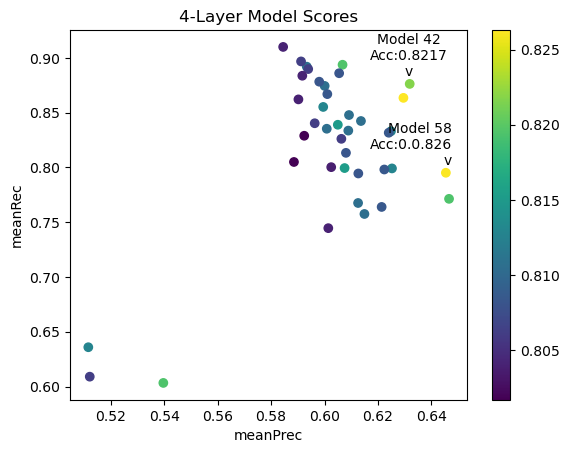

In [47]:
import matplotlib.pyplot as plt
plt.scatter(DF_4Lay_scores_sorted.meanPrec.head(40), DF_4Lay_scores_sorted.meanRec.head(40), c=DF_4Lay_scores_sorted.meanAcc.head(40))
plt.colorbar()
plt.xlabel("meanPrec")
plt.ylabel("meanRec")
plt.annotate("Model 42" "\n" "Acc:0.8217" "\n" "v", 
             (0.631624, 0.870638),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='center')
plt.annotate("Model 58" "\n" "Acc:0.0.826" "\n" "v", 
             (0.647624, 0.78938),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='right')

plt.title("4-Layer Model Scores")
             
plt.show()

In [60]:
avg_scores4 = pd.DataFrame(DF_4Lay_scores_sorted.iloc[:,15:20].mean())
avg_scores4 = avg_scores4.rename(columns={0: 'avg. scores'}).transpose()
avg_scores4

,meanRec,meanAcc,meanPrec,meanAUC,meanF1
avg. scores,0.690763,0.719274,0.432871,0.746943,0.51435


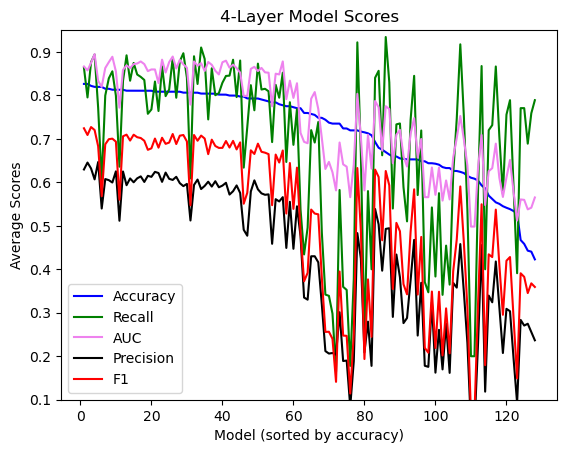

In [37]:
x=np.linspace(1, 128, 128, endpoint=True)
plt.plot(x, DF_4Lay_scores_sorted.meanAcc, color = 'blue', label = 'Accuracy')
plt.plot(x, DF_4Lay_scores_sorted.meanRec, color = 'green', label = 'Recall')
plt.plot(x, DF_4Lay_scores_sorted.meanAUC, color = 'violet', label = 'AUC')
plt.plot(x, DF_4Lay_scores_sorted.meanPrec, color = 'black', label = 'Precision')
plt.plot(x, DF_4Lay_scores_sorted.meanF1, color = 'red', label = 'F1')
plt.ylim(0.1,0.95)
plt.legend()
plt.title("4-Layer Model Scores")
plt.xlabel("Model (sorted by accuracy)")
plt.ylabel("Average Scores")
plt.show()

In [32]:
#DF_4Lay_scores_sorted.to_csv('DF_4Lay_scores_sorted24_10.csv')#the final df showing the results
DF_4Lay_scores_sorted = pd.read_csv('DF_4Lay_scores_sorted24_10.csv')

In [24]:
DF_4Lay_scores_sorted.iloc[1]

Unnamed: 0                                                         41
hiddenLayerOne                                                      4
learnRate                                                       0.007
hiddenLayerTwo                                                      6
hiddenLayerThree                                                    4
hiddenLayerFour                                                     4
dropout                                                          0.05
epochs                                                             20
batchs                                                             32
regul                                                             0.0
accuracy            [0.81333333 0.78000003 0.81333333 0.78000003 0...
AUC                 [0.82937407 0.82751501 0.8585003  0.85963655 0...
recall              [0.76595747 0.85106385 0.74468088 0.76595747 0...
precision           [0.67924529 0.60606062 0.68627453 0.62068963 0...
meanRec             

In [ ]:
## train one with 10 layers

In [57]:
tf.random.set_seed(0)
seed(42)
def get_mlp_model10(hiddenLayerOne=24, hiddenLayerTwo=14,hiddenLayerThree=8, hiddenLayerFour=8,hiddenLayerFive=24, hiddenLayerSix=14,hiddenLayerSeven=8, hiddenLayerEight=8,hiddenLayerNine=8, hiddenLayerTen=8,
    dropout=0.25, learnRate=0.002, regul = 0.011):
    # initialize a sequential model and add layer to flatten the
    # input data
    model = Sequential()
    model.add(Flatten())
    # add two stacks of FC => RELU => DROPOUT
    model.add(Dense(hiddenLayerOne, activation="relu",input_shape=(784,), activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    BatchNormalization(),
    model.add(Dense(hiddenLayerTwo, activation= "relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerThree, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerFour, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerFive, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerSix, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerSeven, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerEight, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerNine, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerTen, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    BatchNormalization(),
    # add a softmax layer on top
    model.add(Dense(1, activation="sigmoid"))
    # compile the model
    model.compile(optimizer=Adam(learning_rate=learnRate),loss="binary_crossentropy",metrics=["accuracy", tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
    # return compiled model
    return model

In [58]:
tf.random.set_seed(0)
seed(42)
def score_model10L(hiddenLayerOne, hiddenLayerTwo,hiddenLayerThree, hiddenLayerFour,hiddenLayerFive, hiddenLayerSix,hiddenLayerSeven, hiddenLayerEight,hiddenLayerNine, hiddenLayerTen, 
    dropout, learnRate, regul, epochs, batchs, cv=None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    if cv is None:
        cv = KFold(n_splits=5, random_state=42, shuffle = True)

    smoter = RandomOverSampler(sampling_strategy=1, random_state=42)
    
    scores = []

    for train_fold_index, val_fold_index in cv.split(X_train, y_train):
        # Get the training data
        X_train_fold, y_train_fold = X_train.iloc[train_fold_index,:], y_train.iloc[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X_train.iloc[val_fold_index,:], y_train.iloc[val_fold_index]

        # Upsample only the data in the training section
        X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,
                                                                           y_train_fold)
        # Fit the model on the upsampled training data
        model = get_mlp_model10(hiddenLayerOne=hiddenLayerOne, hiddenLayerTwo=hiddenLayerTwo, hiddenLayerThree=hiddenLayerThree, hiddenLayerFour=hiddenLayerFour, hiddenLayerFive=hiddenLayerFive, hiddenLayerSix=hiddenLayerSix, hiddenLayerSeven=hiddenLayerSeven, hiddenLayerEight=hiddenLayerEight,hiddenLayerNine=hiddenLayerNine,hiddenLayerTen=hiddenLayerTen, dropout=dropout, learnRate= learnRate, regul=regul)
        model_obj = model.fit(X_train_fold_upsample, y_train_fold_upsample, epochs = epochs, batch_size = batchs, verbose = 1)
        # Score the model on the (non-upsampled) validation data
        score = model.evaluate(X_val_fold, y_val_fold)
        model_proba = model.predict(X_val_fold)
        model_trues = pd.DataFrame(tf.greater(model_proba, 0.5))
        model_preds = model_trues.astype(int)
        model_F1 = f1_score(y_val_fold, model_preds)
        score.append(model_F1)
        scores.append(score)
    return np.array(scores)

# Example of the model in action






In [59]:
#10 Layer Grid: 

grid10L = dict(
    hiddenLayerOne=[2,3],
    hiddenLayerThree=[4, 5],
    hiddenLayerFour=[4, 5],
    hiddenLayerFive=[4, 5],
    hiddenLayerSix=[4, 5],
    hiddenLayerSeven=[4, 5],
    hiddenLayerEight=[4, 5],
    hiddenLayerNine=[4, 5],
    hiddenLayerTen=[2, 3],
    learnRate=[0.007,0.004],
    hiddenLayerTwo=[4, 5],
    dropout=[0.0, 0.1],
    epochs=[10, 20],
    regul = [0.0], 
    batchs = [16, 32]
)

In [ ]:
tf.random.set_seed(0)
seed(42)
score_tracker10L = []
for n_nodes1 in grid10L['hiddenLayerOne']:
    for n_nodes2 in grid10L['hiddenLayerTwo']:    
        for learnings in grid10L['learnRate']:
            for dropts in grid10L['dropout']:
                for reguls in grid10L['regul']:
                    for epochs in grid10L['epochs']: 
                        for batchs in grid10L['batchs']:
                            parameter_track = {'hiddenLayerOne': n_nodes1,
                                               'learnRate': learnings,
                                               'hiddenLayerTwo': n_nodes2,
                                               'hiddenLayerThree': n_nodes2,
                                               'hiddenLayerFour': n_nodes2,
                                               'hiddenLayerFive': n_nodes2,
                                               'hiddenLayerSix': n_nodes2,
                                               'hiddenLayerSeven': n_nodes2,
                                               'hiddenLayerEight': n_nodes2,
                                               'hiddenLayerNine': n_nodes2,
                                               'hiddenLayerTen': n_nodes1,
                                               'dropout': dropts,
                                               'epochs': epochs,
                                               'batchs':batchs,
                                               'regul': reguls}
                            scores = score_model10L(hiddenLayerOne=n_nodes1, 
                                                    hiddenLayerTwo=n_nodes2,
                                                    hiddenLayerThree=n_nodes2,
                                                    hiddenLayerFour=n_nodes2,
                                                    hiddenLayerFive=n_nodes2, 
                                                    hiddenLayerSix=n_nodes2,
                                                    hiddenLayerSeven=n_nodes2,
                                                    hiddenLayerEight=n_nodes2,
                                                    hiddenLayerNine=n_nodes2, 
                                                    hiddenLayerTen=n_nodes1,
                                                    dropout=dropts, 
                                                    learnRate=learnings, 
                                                    regul=reguls,
                                                    epochs=epochs,
                                                    batchs=batchs,
                                                    cv=None)
                            parameter_track['accuracy']= scores[:,1]
                            parameter_track['AUC']= scores[:,2]
                            parameter_track['recall']= scores[:,4]
                            parameter_track['precision']= scores[:,3]
                            parameter_track['F1']= scores[:,5]

                            score_tracker10L.append(parameter_track)




Epoch 1/10
33/33 [==============================] - 2s 19ms/step - loss: 0.6946 - accuracy: 0.4533 - auc_1748: 0.4851 - precision_1748: 0.4651 - recall_1748: 0.6226
Epoch 2/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6921 - accuracy: 0.5039 - auc_1748: 0.5022 - precision_1748: 0.5625 - recall_1748: 0.0350
Epoch 3/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6870 - accuracy: 0.5545 - auc_1748: 0.5480 - precision_1748: 0.6556 - recall_1748: 0.2296
Epoch 4/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6306 - accuracy: 0.7490 - auc_1748: 0.8115 - precision_1748: 0.6808 - recall_1748: 0.9377
Epoch 5/10
33/33 [==============================] - 1s 16ms/step - loss: 0.5430 - accuracy: 0.8405 - auc_1748: 0.8856 - precision_1748: 0.7676 - recall_1748: 0.9767
Epoch 6/10
33/33 [==============================] - 1s 16ms/step - loss: 0.4907 - accuracy: 0.8677 - auc_1748: 0.9082 - precision_1748: 0.7981 - recall_1748: 0.9844
Epoch 7/10

3/3 [==============================] - 0s 20ms/step - loss: 0.4492 - accuracy: 0.8000 - auc_1756: 0.8559 - precision_1756: 0.5625 - recall_1756: 0.8182
Epoch 1/10
17/17 [==============================] - 2s 21ms/step - loss: 0.6938 - accuracy: 0.4676 - auc_1757: 0.4789 - precision_1757: 0.3731 - recall_1757: 0.0954
Epoch 2/10
17/17 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.4733 - auc_1757: 0.5000 - precision_1757: 0.4500 - recall_1757: 0.2405
Epoch 3/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1757: 0.4771 - precision_1757: 0.5000 - recall_1757: 1.0000
Epoch 4/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_1757: 0.5000 - precision_1757: 0.5000 - recall_1757: 1.0000
Epoch 5/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.4809 - auc_1757: 0.5000 - precision_1757: 0.4858 - recall_1757: 0.6527
Epoch 6/10
17/17 [=====

33/33 [==============================] - 1s 15ms/step - loss: 0.6933 - accuracy: 0.4924 - auc_1762: 0.5000 - precision_1762: 0.4902 - recall_1762: 0.3817
Epoch 3/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6935 - accuracy: 0.4695 - auc_1762: 0.4656 - precision_1762: 0.4798 - recall_1762: 0.7252
Epoch 4/20
33/33 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.4580 - auc_1762: 0.5000 - precision_1762: 0.4752 - recall_1762: 0.8053
Epoch 5/20
33/33 [==============================] - 0s 15ms/step - loss: 0.6934 - accuracy: 0.4504 - auc_1762: 0.5000 - precision_1762: 0.3984 - recall_1762: 0.1947
Epoch 6/20
33/33 [==============================] - 0s 15ms/step - loss: 0.6938 - accuracy: 0.4733 - auc_1762: 0.4389 - precision_1762: 0.4848 - recall_1762: 0.8511
Epoch 7/20
33/33 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_1762: 0.4771 - precision_1762: 0.5000 - recall_1762: 1.0000
Epoch 8/20
33/33 [===

17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_1766: 0.5000 - precision_1766: 0.0000e+00 - recall_1766: 0.0000e+00
Epoch 16/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_1766: 0.5000 - precision_1766: 0.0000e+00 - recall_1766: 0.0000e+00
Epoch 17/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_1766: 0.5000 - precision_1766: 0.0000e+00 - recall_1766: 0.0000e+00
Epoch 18/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.4808 - auc_1766: 0.5000 - precision_1766: 0.4873 - recall_1766: 0.7356
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_1766: 0.4808 - precision_1766: 0.5000 - recall_1766: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 22ms/step - loss: 0.6964 - accuracy: 0.2444 - auc_1766: 0.5000 - precision_1766: 0.2444 - recall_1766: 1

17/17 [==============================] - 0s 18ms/step - loss: 0.4710 - accuracy: 0.7814 - auc_1774: 0.8004 - precision_1774: 0.6958 - recall_1774: 1.0000
Epoch 6/10
17/17 [==============================] - 0s 18ms/step - loss: 0.4755 - accuracy: 0.7776 - auc_1774: 0.7666 - precision_1774: 0.6995 - recall_1774: 0.9734
Epoch 7/10
17/17 [==============================] - 0s 18ms/step - loss: 0.4813 - accuracy: 0.7567 - auc_1774: 0.7557 - precision_1774: 0.6726 - recall_1774: 1.0000
Epoch 8/10
17/17 [==============================] - 0s 18ms/step - loss: 0.4348 - accuracy: 0.7966 - auc_1774: 0.8068 - precision_1774: 0.7131 - recall_1774: 0.9924
Epoch 9/10
17/17 [==============================] - 0s 18ms/step - loss: 0.4289 - accuracy: 0.8023 - auc_1774: 0.7923 - precision_1774: 0.7214 - recall_1774: 0.9848
Epoch 10/10
3/3 [==============================] - 0s 18ms/step - loss: 0.5599 - accuracy: 0.7778 - auc_1774: 0.8444 - precision_1774: 0.5500 - recall_1774: 0.9167
Epoch 1/10
18/18 [====

In [48]:
 sorted(score_tracker10L, key=lambda x: x['accuracy'].mean(), reverse=True)

[{'hiddenLayerOne': 3,
  'learnRate': 0.007,
  'hiddenLayerTwo': 4,
  'hiddenLayerThree': 4,
  'hiddenLayerFour': 4,
  'hiddenLayerFive': 4,
  'hiddenLayerSix': 4,
  'hiddenLayerSeven': 4,
  'hiddenLayerEight': 4,
  'hiddenLayerNine': 4,
  'hiddenLayerTen': 3,
  'dropout': 0.1,
  'epochs': 20,
  'batchs': 32,
  'regul': 0.0,
  'accuracy': array([0.81111115, 0.87777781, 0.76666671, 0.76666671, 0.83146065]),
  'AUC': array([0.87577158, 0.90183085, 0.80252099, 0.80815512, 0.77272737]),
  'recall': array([0.72222221, 0.83333337, 0.7647059 , 0.77272731, 0.59090912]),
  'precision': array([0.51999998, 0.74074078, 0.66666669, 0.5151515 , 0.68421054]),
  'F1': array([0.60465116, 0.78431373, 0.71232877, 0.61818182, 0.63414634])},
 {'hiddenLayerOne': 3,
  'learnRate': 0.004,
  'hiddenLayerTwo': 5,
  'hiddenLayerThree': 5,
  'hiddenLayerFour': 5,
  'hiddenLayerFive': 5,
  'hiddenLayerSix': 5,
  'hiddenLayerSeven': 5,
  'hiddenLayerEight': 5,
  'hiddenLayerNine': 5,
  'hiddenLayerTen': 3,
  'dropo

In [49]:
DF_10Lay_scores = pd.DataFrame(score_tracker10L)

In [50]:
avgs = []
for i in DF_10Lay_scores.recall:
    avg = i.mean()
    avgs.append(avg)
DF_10Lay_scores['meanRec'] = avgs

In [51]:
avgs = []
for i in DF_10Lay_scores.accuracy:
    avg = i.mean()
    avgs.append(avg)
DF_10Lay_scores['meanAcc'] = avgs

In [52]:
avgs = []
for i in DF_10Lay_scores.precision:
    avg = i.mean()
    avgs.append(avg)
DF_10Lay_scores['meanPrec'] = avgs

In [53]:
avgs = []
for i in DF_10Lay_scores.AUC:
    avg = i.mean()
    avgs.append(avg)
DF_10Lay_scores['meanAUC'] = avgs

In [54]:
avgs = []
for i in DF_10Lay_scores.F1:
    avg = i.mean()
    avgs.append(avg)
DF_10Lay_scores['meanF1'] = avgs

In [55]:
DF_10Lay_scores_sorted = DF_10Lay_scores.sort_values(["meanAcc"], ascending = False)

In [48]:
DF_10Lay_scores_sorted.head(20)

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven,hiddenLayerEight,...,accuracy,AUC,recall,precision,F1,meanRec,meanAcc,meanPrec,meanAUC,meanF1
0,39,3,0.007,4,4,4,4,4,4,4,...,[0.81111115 0.87777781 0.76666671 0.76666671 0...,[0.87577158 0.90183085 0.80252099 0.80815512 0...,[0.72222221 0.83333337 0.7647059 0.77272731 0...,[0.51999998 0.74074078 0.66666669 0.5151515 0...,[0.60465116 0.78431373 0.71232877 0.61818182 0...,0.736780,0.810737,0.625354,0.832201,0.670724
1,62,3,0.004,5,5,5,5,5,5,5,...,[0.77777779 0.76666671 0.77777779 0.82222223 0...,[0.86612654 0.83396465 0.77652305 0.87399733 0...,[0.66666669 0.95833337 0.67647058 0.9545455 1...,[0.46153849 0.53488374 0.71875 0.58333331 0...,[0.54545455 0.68656716 0.6969697 0.72413793 0...,0.851203,0.795181,0.578620,0.849227,0.679778
2,55,3,0.007,5,5,5,5,5,5,5,...,[0.80000001 0.81111115 0.78888893 0.76666671 0...,[0.5 0.86647725 0.81932777 0.84558821 0...,[0. 0.79166669 0.7647059 1. 0...,[0. 0.61290324 0.7027027 0.51162791 0...,[0. 0.69090909 0.73239437 0.67692308 0...,0.693093,0.786142,0.468011,0.770254,0.551193
3,54,3,0.007,5,5,5,5,5,5,5,...,[0.80000001 0.82222223 0.77777779 0.75555557 0...,[0.81250006 0.8888889 0.77547264 0.5 0...,[0.5 0.95833337 0.7352941 0. 0...,[0.5 0.60526317 0.69444448 0. 0...,[0.5 0.74193548 0.71428571 0. 0...,0.438725,0.781673,0.359942,0.695372,0.391244
4,31,2,0.004,5,5,5,5,5,5,5,...,[0.80000001 0.83333337 0.74444449 0.78888893 0...,[0.5 0.82323229 0.77179629 0.85862297 0...,[0. 0.66666669 0.79411763 0.68181819 0...,[0. 0.69565219 0.62790698 0.55555558 0...,[0. 0.68085106 0.7012987 0.6122449 0...,0.592157,0.781648,0.473120,0.753553,0.520913
5,56,3,0.004,5,5,5,5,5,5,5,...,[0.86666667 0.83333337 0.62222224 0.84444445 0...,[0.86882716 0.88636363 0.5 0.89037436 0...,[0.72222221 1. 0. 1. 0...,[0.65000004 0.61538464 0. 0.6111111 0...,[0.68421053 0.76190476 0. 0.75862069 0...,0.708081,0.781648,0.472596,0.789832,0.562981
6,9,2,0.004,4,4,4,4,4,4,4,...,[0.78888893 0.83333337 0.76666671 0.75555557 0...,[0.77507716 0.91792929 0.82536769 0.5 0...,[0.66666669 1. 0.82352942 0. 0...,[0.47999999 0.61538464 0.6511628 0. 0...,[0.55813953 0.76190476 0.72727273 0. 0...,0.498039,0.779451,0.349309,0.703675,0.409463
7,48,3,0.007,5,5,5,5,5,5,5,...,[0.86666667 0.73333335 0.77777779 0.75555557 0...,[0.89081788 0.5 0.84112394 0.5 0...,[0.8888889 0. 0.79411763 0. 0...,[0.61538464 0. 0.67500001 0. 0...,[0.72727273 0. 0.72972973 0. 0...,0.336601,0.777228,0.258077,0.646388,0.291400
8,17,2,0.007,5,5,5,5,5,5,5,...,[0.84444445 0.73333335 0.80000001 0.75555557 0...,[0.88425934 0.5 0.83981091 0.5 0...,[0.94444448 0. 0.85294116 0. 0...,[0.56666672 0. 0.69047618 0. 0...,[0.70833333 0. 0.76315789 0. 0...,0.359477,0.777228,0.251429,0.644814,0.294298
9,25,2,0.004,5,5,5,5,5,5,5,...,[0.83333337 0.85555559 0.62222224 0.81111115 0...,[0.82716048 0.93023992 0.5 0.81751341 0...,[0.55555558 0.95833337 0. 0.86363637 0...,[0.58823532 0.65714288 0. 0.57575762 0...,[0.57142857 0.77966102 0. 0.69090909 0...,0.475505,0.775006,0.364227,0.714983,0.408400


In [38]:
#DF_10Lay_scores_sorted.to_csv('DF_10Lay_scores_sortedBigger22_10.csv')#the final df showing the results
DF_10Lay_scores_sorted = pd.read_csv('DF_10Lay_scores_sortedBigger22_10.csv')

In [39]:
DF_10Lay_scores_sorted

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven,hiddenLayerEight,...,accuracy,AUC,recall,precision,F1,meanRec,meanAcc,meanPrec,meanAUC,meanF1
0,39,3,0.007,4,4,4,4,4,4,4,...,[0.81111115 0.87777781 0.76666671 0.76666671 0...,[0.87577158 0.90183085 0.80252099 0.80815512 0...,[0.72222221 0.83333337 0.7647059 0.77272731 0...,[0.51999998 0.74074078 0.66666669 0.5151515 0...,[0.60465116 0.78431373 0.71232877 0.61818182 0...,0.736780,0.810737,0.625354,0.832201,0.670724
1,62,3,0.004,5,5,5,5,5,5,5,...,[0.77777779 0.76666671 0.77777779 0.82222223 0...,[0.86612654 0.83396465 0.77652305 0.87399733 0...,[0.66666669 0.95833337 0.67647058 0.9545455 1...,[0.46153849 0.53488374 0.71875 0.58333331 0...,[0.54545455 0.68656716 0.6969697 0.72413793 0...,0.851203,0.795181,0.578620,0.849227,0.679778
2,55,3,0.007,5,5,5,5,5,5,5,...,[0.80000001 0.81111115 0.78888893 0.76666671 0...,[0.5 0.86647725 0.81932777 0.84558821 0...,[0. 0.79166669 0.7647059 1. 0...,[0. 0.61290324 0.7027027 0.51162791 0...,[0. 0.69090909 0.73239437 0.67692308 0...,0.693093,0.786142,0.468011,0.770254,0.551193
3,54,3,0.007,5,5,5,5,5,5,5,...,[0.80000001 0.82222223 0.77777779 0.75555557 0...,[0.81250006 0.8888889 0.77547264 0.5 0...,[0.5 0.95833337 0.7352941 0. 0...,[0.5 0.60526317 0.69444448 0. 0...,[0.5 0.74193548 0.71428571 0. 0...,0.438725,0.781673,0.359942,0.695372,0.391244
4,31,2,0.004,5,5,5,5,5,5,5,...,[0.80000001 0.83333337 0.74444449 0.78888893 0...,[0.5 0.82323229 0.77179629 0.85862297 0...,[0. 0.66666669 0.79411763 0.68181819 0...,[0. 0.69565219 0.62790698 0.55555558 0...,[0. 0.68085106 0.7012987 0.6122449 0...,0.592157,0.781648,0.473120,0.753553,0.520913
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,15,2,0.004,4,4,4,4,4,4,4,...,[0.81111115 0.26666668 0.75555557 0.24444444 0...,[0.87229937 0.5 0.7904411 0.5 0...,[0.72222221 1. 0.88235295 1. 1...,[0.51999998 0.26666668 0.625 0.24444444 0...,[0.60465116 0.42105263 0.73170732 0.39285714 0...,0.920915,0.550387,0.417497,0.689265,0.550602
60,27,2,0.004,5,5,5,5,5,5,5,...,[0.80000001 0.26666668 0.62222224 0.81111115 0...,[0.5 0.5 0.5 0.86263371 0...,[0. 1. 0. 0.90909094 1...,[0. 0.26666668 0. 0.5714286 0...,[0. 0.42105263 0. 0.70175439 0...,0.581818,0.549438,0.217057,0.572527,0.303841
61,26,2,0.004,5,5,5,5,5,5,5,...,[0.81111115 0.26666668 0.62222224 0.75555557 0...,[0.88464504 0.5 0.5 0.8449198 0...,[0.72222221 1. 0. 0.9545455 1...,[0.51999998 0.26666668 0. 0.5 0...,[0.60465116 0.42105263 0. 0.65625 0...,0.735354,0.540549,0.306772,0.645913,0.415670
62,2,2,0.007,4,4,4,4,4,4,4,...,[0.80000001 0.26666668 0.62222224 0.75555557 0...,[0.5 0.5 0.5 0.5 0.5],[0. 1. 0. 0. 1.],[0. 0.26666668 0. 0. 0...,[0. 0.42105263 0. 0. 0...,0.400000,0.538327,0.102772,0.500000,0.163490


In [45]:
DF_10Lay_scores_sorted.iloc[:, 21:26].mean()

meanRec     0.647772
meanAcc     0.688438
meanPrec    0.376074
meanAUC     0.701621
meanF1      0.456395
dtype: float64

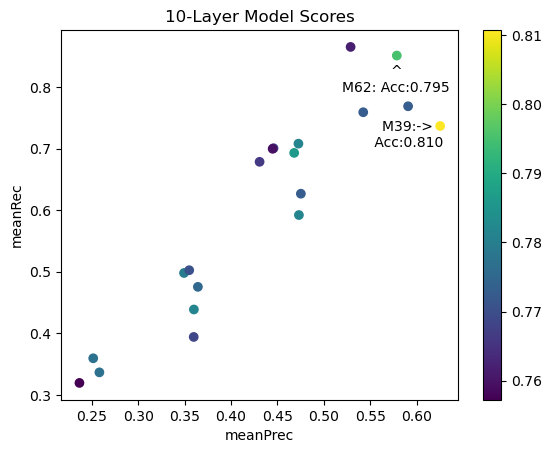

In [75]:
import matplotlib.pyplot as plt
plt.scatter(DF_10Lay_scores_sorted.meanPrec.head(20), DF_10Lay_scores_sorted.meanRec.head(20), c=DF_10Lay_scores_sorted.meanAcc.head(20))
plt.colorbar()
plt.xlabel("meanPrec")
plt.ylabel("meanRec")
plt.annotate("M39:-> \n Acc:0.810 ", 
             (0.592, 0.68045),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='center')
plt.annotate("^" "\n" "M62: Acc:0.795", 
             (0.578, 0.77),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='center')
plt.title("10-Layer Model Scores")
             
plt.show()

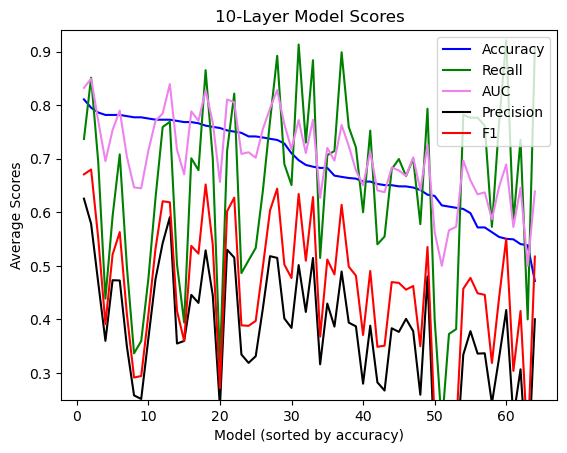

In [43]:
x=np.linspace(1, 64, 64, endpoint=True)
plt.plot(x, DF_10Lay_scores_sorted.meanAcc, color = 'blue', label = 'Accuracy')
plt.plot(x, DF_10Lay_scores_sorted.meanRec, color = 'green', label = 'Recall')
plt.plot(x, DF_10Lay_scores_sorted.meanAUC, color = 'violet', label = 'AUC')
plt.plot(x, DF_10Lay_scores_sorted.meanPrec, color = 'black', label = 'Precision')
plt.plot(x, DF_10Lay_scores_sorted.meanF1, color = 'red', label = 'F1')

plt.ylim(0.25,0.94)
plt.legend()
plt.title("10-Layer Model Scores")
plt.xlabel("Model (sorted by accuracy)")
plt.ylabel("Average Scores")
plt.show()

In [92]:
final19 = pd.DataFrame(DF_10Lay_scores_sorted.iloc[1,1:9]).transpose()
final10 = pd.DataFrame(DF_10Lay_scores_sorted.iloc[1,9:16]).transpose()
final19

,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven
1,3,0.004,5,5,5,5,5,5


In [93]:
final10

,hiddenLayerEight,hiddenLayerNine,hiddenLayerTen,dropout,epochs,batchs,regul
1,5,5,3,0.1,20,16,0.0


In [96]:
DF_10Lay_scores_sorted

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven,hiddenLayerEight,...,accuracy,AUC,recall,precision,F1,meanRec,meanAcc,meanPrec,meanAUC,meanF1
0,39,3,0.007,4,4,4,4,4,4,4,...,[0.81111115 0.87777781 0.76666671 0.76666671 0...,[0.87577158 0.90183085 0.80252099 0.80815512 0...,[0.72222221 0.83333337 0.7647059 0.77272731 0...,[0.51999998 0.74074078 0.66666669 0.5151515 0...,[0.60465116 0.78431373 0.71232877 0.61818182 0...,0.736780,0.810737,0.625354,0.832201,0.670724
1,62,3,0.004,5,5,5,5,5,5,5,...,[0.77777779 0.76666671 0.77777779 0.82222223 0...,[0.86612654 0.83396465 0.77652305 0.87399733 0...,[0.66666669 0.95833337 0.67647058 0.9545455 1...,[0.46153849 0.53488374 0.71875 0.58333331 0...,[0.54545455 0.68656716 0.6969697 0.72413793 0...,0.851203,0.795181,0.578620,0.849227,0.679778
2,55,3,0.007,5,5,5,5,5,5,5,...,[0.80000001 0.81111115 0.78888893 0.76666671 0...,[0.5 0.86647725 0.81932777 0.84558821 0...,[0. 0.79166669 0.7647059 1. 0...,[0. 0.61290324 0.7027027 0.51162791 0...,[0. 0.69090909 0.73239437 0.67692308 0...,0.693093,0.786142,0.468011,0.770254,0.551193
3,54,3,0.007,5,5,5,5,5,5,5,...,[0.80000001 0.82222223 0.77777779 0.75555557 0...,[0.81250006 0.8888889 0.77547264 0.5 0...,[0.5 0.95833337 0.7352941 0. 0...,[0.5 0.60526317 0.69444448 0. 0...,[0.5 0.74193548 0.71428571 0. 0...,0.438725,0.781673,0.359942,0.695372,0.391244
4,31,2,0.004,5,5,5,5,5,5,5,...,[0.80000001 0.83333337 0.74444449 0.78888893 0...,[0.5 0.82323229 0.77179629 0.85862297 0...,[0. 0.66666669 0.79411763 0.68181819 0...,[0. 0.69565219 0.62790698 0.55555558 0...,[0. 0.68085106 0.7012987 0.6122449 0...,0.592157,0.781648,0.473120,0.753553,0.520913
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,15,2,0.004,4,4,4,4,4,4,4,...,[0.81111115 0.26666668 0.75555557 0.24444444 0...,[0.87229937 0.5 0.7904411 0.5 0...,[0.72222221 1. 0.88235295 1. 1...,[0.51999998 0.26666668 0.625 0.24444444 0...,[0.60465116 0.42105263 0.73170732 0.39285714 0...,0.920915,0.550387,0.417497,0.689265,0.550602
60,27,2,0.004,5,5,5,5,5,5,5,...,[0.80000001 0.26666668 0.62222224 0.81111115 0...,[0.5 0.5 0.5 0.86263371 0...,[0. 1. 0. 0.90909094 1...,[0. 0.26666668 0. 0.5714286 0...,[0. 0.42105263 0. 0.70175439 0...,0.581818,0.549438,0.217057,0.572527,0.303841
61,26,2,0.004,5,5,5,5,5,5,5,...,[0.81111115 0.26666668 0.62222224 0.75555557 0...,[0.88464504 0.5 0.5 0.8449198 0...,[0.72222221 1. 0. 0.9545455 1...,[0.51999998 0.26666668 0. 0.5 0...,[0.60465116 0.42105263 0. 0.65625 0...,0.735354,0.540549,0.306772,0.645913,0.415670
62,2,2,0.007,4,4,4,4,4,4,4,...,[0.80000001 0.26666668 0.62222224 0.75555557 0...,[0.5 0.5 0.5 0.5 0.5],[0. 1. 0. 0. 1.],[0. 0.26666668 0. 0. 0...,[0. 0.42105263 0. 0. 0...,0.400000,0.538327,0.102772,0.500000,0.163490


In [115]:
avg_scores110 = pd.DataFrame(DF_10Lay_scores_sorted.iloc[:,21:26].mean())
avg_scores110 = avg_scores110.rename(columns={0: 'avg. scores'}).transpose()
avg_scores110

,meanRec,meanAcc,meanPrec,meanAUC,meanF1
avg. scores,0.647772,0.688438,0.376074,0.701621,0.456395


In [ ]:
## train 8L

In [126]:
tf.random.set_seed(44)
seed(42)
def get_mlp_model8(hiddenLayerOne=24, hiddenLayerTwo=14,hiddenLayerThree=8, hiddenLayerFour=8,hiddenLayerFive=24, hiddenLayerSix=14,hiddenLayerSeven=8, hiddenLayerEight=8,
    dropout=0.25, learnRate=0.002, regul = 0.011):
    # initialize a sequential model and add layer to flatten the
    # input data
    model = Sequential()
    model.add(Flatten())
    # add two stacks of FC => RELU => DROPOUT
    model.add(Dense(hiddenLayerOne, activation="relu",input_shape=(784,), activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    BatchNormalization(),
    model.add(Dense(hiddenLayerTwo, activation= "relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerThree, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerFour, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerFive, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerSix, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerSeven, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    model.add(Dropout(dropout))
    BatchNormalization(),
    model.add(Dense(hiddenLayerEight, activation="relu", activity_regularizer=regularizers.l1(regul), kernel_initializer="he_normal"))
    BatchNormalization(),
    # add a softmax layer on top
    model.add(Dense(1, activation="sigmoid"))
    # compile the model
    model.compile(optimizer=Adam(learning_rate=learnRate),loss="binary_crossentropy",metrics=["accuracy", tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
    # return compiled model
    return model

In [15]:
tf.random.set_seed(0)
seed(42)
def score_model8L(hiddenLayerOne, hiddenLayerTwo,hiddenLayerThree, hiddenLayerFour,hiddenLayerFive, hiddenLayerSix,hiddenLayerSeven, hiddenLayerEight,
    dropout, learnRate, regul, epochs, batchs, cv=None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    if cv is None:
        cv = KFold(n_splits=5, random_state=42, shuffle = True)

    smoter = RandomOverSampler(sampling_strategy=1, random_state=42)
    
    scores = []

    for train_fold_index, val_fold_index in cv.split(X_train, y_train):
        # Get the training data
        X_train_fold, y_train_fold = X_train.iloc[train_fold_index,:], y_train.iloc[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X_train.iloc[val_fold_index,:], y_train.iloc[val_fold_index]

        # Upsample only the data in the training section
        X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,
                                                                           y_train_fold)
        # Fit the model on the upsampled training data
        model = get_mlp_model8(hiddenLayerOne=hiddenLayerOne, hiddenLayerTwo=hiddenLayerTwo, hiddenLayerThree=hiddenLayerThree, hiddenLayerFour=hiddenLayerFour, hiddenLayerFive=hiddenLayerFive, hiddenLayerSix=hiddenLayerSix, hiddenLayerSeven=hiddenLayerSeven, hiddenLayerEight=hiddenLayerEight,dropout=dropout, learnRate= learnRate, regul=regul)
        model_obj = model.fit(X_train_fold_upsample, y_train_fold_upsample, epochs = epochs, batch_size = batchs, verbose = 1)
        # Score the model on the (non-upsampled) validation data
        score = model.evaluate(X_val_fold, y_val_fold)
        model_proba = model.predict(X_val_fold)
        model_trues = pd.DataFrame(tf.greater(model_proba, 0.5))
        model_preds = model_trues.astype(int)
        model_F1 = f1_score(y_val_fold, model_preds)
        score.append(model_F1)
        scores.append(score)
    return np.array(scores)

# Example of the model in action






In [16]:
#8 Layer Grid: 

grid8L = dict(
    hiddenLayerOne=[2,3],
    hiddenLayerThree=[4, 5],
    hiddenLayerFour=[4, 5],
    hiddenLayerFive=[4, 5],
    hiddenLayerSix=[4, 5],
    hiddenLayerSeven=[4, 5],
    hiddenLayerEight=[2,3],
    learnRate=[0.007, 0.004],
    hiddenLayerTwo=[5, 4],
    dropout=[0.0, 0.1],
    epochs=[10, 20],
    regul = [0.0, 0.05], 
    batchs = [16, 32]
)

In [17]:
tf.random.set_seed(0)
seed(42)
score_tracker8L = []
for n_nodes1 in grid8L['hiddenLayerOne']:
    for n_nodes2 in grid8L['hiddenLayerTwo']:
        for n_nodes3 in grid8L['hiddenLayerThree']:
            for learnings in grid8L['learnRate']:
                for dropts in grid8L['dropout']:
                    for reguls in grid8L['regul']:
                        for epochs in grid8L['epochs']: 
                            for batchs in grid8L['batchs']:
                                parameter_track = {'hiddenLayerOne': n_nodes1,
                                                   'learnRate': learnings,
                                                   'hiddenLayerTwo': n_nodes2,
                                                   'hiddenLayerThree': n_nodes3,
                                                   'hiddenLayerFour': n_nodes2,
                                                   'hiddenLayerFive': n_nodes3,
                                                   'hiddenLayerSix': n_nodes2,
                                                   'hiddenLayerSeven': n_nodes3,
                                                   'hiddenLayerEight': n_nodes1,
                                                   'dropout': dropts,
                                                   'epochs': epochs,
                                                   'batchs':batchs,
                                                   'regul': reguls}
                                scores= score_model8L(hiddenLayerOne=n_nodes1, 
                                                      hiddenLayerTwo=n_nodes2,
                                                      hiddenLayerThree=n_nodes3,
                                                      hiddenLayerFour=n_nodes2,
                                                      hiddenLayerFive=n_nodes3, 
                                                      hiddenLayerSix=n_nodes2,
                                                      hiddenLayerSeven=n_nodes3,
                                                      hiddenLayerEight=n_nodes1,
                                                      dropout=dropts, 
                                                      learnRate=learnings, 
                                                      regul=reguls,
                                                      epochs=epochs,
                                                      batchs=batchs,
                                                      cv=None)
                                parameter_track['accuracy']= scores[:,1]
                                parameter_track['AUC']= scores[:,2]
                                parameter_track['recall']= scores[:,4]
                                parameter_track['precision']= scores[:,3]
                                parameter_track['F1']= scores[:,5]

                                score_tracker8L.append(parameter_track)





Epoch 1/10
33/33 [==============================] - 1s 15ms/step - loss: 0.6790 - accuracy: 0.5506 - auc: 0.6008 - precision: 0.5793 - recall: 0.3696
Epoch 2/10
33/33 [==============================] - 0s 14ms/step - loss: 0.5808 - accuracy: 0.6323 - auc: 0.7930 - precision: 0.7361 - recall: 0.4125
Epoch 3/10
33/33 [==============================] - 0s 14ms/step - loss: 0.4834 - accuracy: 0.8346 - auc: 0.8401 - precision: 0.7654 - recall: 0.9650
Epoch 4/10
33/33 [==============================] - 0s 14ms/step - loss: 0.4281 - accuracy: 0.8502 - auc: 0.8751 - precision: 0.7866 - recall: 0.9611
Epoch 5/10
33/33 [==============================] - 0s 14ms/step - loss: 0.3918 - accuracy: 0.8521 - auc: 0.8697 - precision: 0.7819 - recall: 0.9767
Epoch 6/10
33/33 [==============================] - 0s 14ms/step - loss: 0.3620 - accuracy: 0.8677 - auc: 0.9004 - precision: 0.8019 - recall: 0.9767
Epoch 7/10
33/33 [==============================] - 0s 14ms/step - loss: 0.3641 - accuracy: 0.8580 -

18/18 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.5000 - auc_7: 0.5000 - precision_7: 0.0000e+00 - recall_7: 0.0000e+00
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.6907 - accuracy: 0.6222 - auc_7: 0.5000 - precision_7: 0.0000e+00 - recall_7: 0.0000e+00
Epoch 1/10
17/17 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_8: 0.5000 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00
Epoch 2/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_8: 0.5000 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00
Epoch 3/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_8: 0.5000 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00
Epoch 4/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_8: 0.5000 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00
Epoch 5/10
17/17 [==========

33/33 [==============================] - 1s 17ms/step - loss: 0.2915 - accuracy: 0.9023 - auc_13: 0.9176 - precision_13: 0.8547 - recall_13: 0.9693
Epoch 16/20
33/33 [==============================] - 1s 17ms/step - loss: 0.2840 - accuracy: 0.8966 - auc_13: 0.9205 - precision_13: 0.8581 - recall_13: 0.9502
Epoch 17/20
33/33 [==============================] - 1s 17ms/step - loss: 0.2932 - accuracy: 0.8966 - auc_13: 0.9292 - precision_13: 0.8532 - recall_13: 0.9579
Epoch 18/20
33/33 [==============================] - 1s 17ms/step - loss: 0.2729 - accuracy: 0.9157 - auc_13: 0.9243 - precision_13: 0.8729 - recall_13: 0.9732
Epoch 19/20
33/33 [==============================] - 1s 17ms/step - loss: 0.2737 - accuracy: 0.9042 - auc_13: 0.9255 - precision_13: 0.8651 - recall_13: 0.9579
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.3971 - accuracy: 0.8111 - auc_13: 0.8874 - precision_13: 0.5676 - recall_13: 0.9545
Epoch 1/20
33/33 [==============================] - 1s

17/17 [==============================] - 0s 14ms/step - loss: 0.3494 - accuracy: 0.8602 - auc_18: 0.8647 - precision_18: 0.7814 - recall_18: 1.0000
Epoch 13/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3464 - accuracy: 0.8602 - auc_18: 0.8626 - precision_18: 0.7831 - recall_18: 0.9962
Epoch 14/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3521 - accuracy: 0.8544 - auc_18: 0.8522 - precision_18: 0.7745 - recall_18: 1.0000
Epoch 15/20
17/17 [==============================] - 0s 15ms/step - loss: 0.3411 - accuracy: 0.8602 - auc_18: 0.8662 - precision_18: 0.7831 - recall_18: 0.9962
Epoch 16/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3324 - accuracy: 0.8678 - auc_18: 0.8735 - precision_18: 0.7927 - recall_18: 0.9962
Epoch 17/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3251 - accuracy: 0.8678 - auc_18: 0.8721 - precision_18: 0.7963 - recall_18: 0.9885
Epoch 18/20
17/17 [==============================] -

17/17 [==============================] - 0s 16ms/step - loss: 0.5736 - accuracy: 0.7605 - auc_26: 0.7806 - precision_26: 0.7438 - recall_26: 0.7947
Epoch 7/10
17/17 [==============================] - 0s 17ms/step - loss: 0.5326 - accuracy: 0.7985 - auc_26: 0.8143 - precision_26: 0.7591 - recall_26: 0.8745
Epoch 8/10
17/17 [==============================] - 0s 16ms/step - loss: 0.5382 - accuracy: 0.7833 - auc_26: 0.8027 - precision_26: 0.7459 - recall_26: 0.8593
Epoch 9/10
17/17 [==============================] - 0s 16ms/step - loss: 0.5291 - accuracy: 0.7985 - auc_26: 0.8146 - precision_26: 0.7591 - recall_26: 0.8745
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.4415 - accuracy: 0.7889 - auc_26: 0.8807 - precision_26: 0.5610 - recall_26: 0.9583
Epoch 1/10
18/18 [==============================] - 1s 18ms/step - loss: 0.6832 - accuracy: 0.5110 - auc_27: 0.5238 - precision_27: 0.5115 - recall_27: 0.4908
Epoch 2/10
18/18 [==============================] - 0s 17m

33/33 [==============================] - 1s 17ms/step - loss: 0.6950 - accuracy: 0.5287 - auc_33: 0.5658 - precision_33: 0.5773 - recall_33: 0.2146
Epoch 2/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6510 - accuracy: 0.6475 - auc_33: 0.7068 - precision_33: 0.6897 - recall_33: 0.5364
Epoch 3/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5596 - accuracy: 0.7471 - auc_33: 0.7856 - precision_33: 0.8274 - recall_33: 0.6245
Epoch 4/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5555 - accuracy: 0.7375 - auc_33: 0.8182 - precision_33: 0.8298 - recall_33: 0.5977
Epoch 5/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5107 - accuracy: 0.7854 - auc_33: 0.8355 - precision_33: 0.8143 - recall_33: 0.7395
Epoch 6/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4952 - accuracy: 0.7912 - auc_33: 0.8517 - precision_33: 0.8248 - recall_33: 0.7395
Epoch 7/20
33/33 [==============================] - 1s 16

18/18 [==============================] - 0s 16ms/step - loss: 0.4040 - accuracy: 0.8242 - auc_37: 0.8287 - precision_37: 0.7438 - recall_37: 0.9890
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 1.8800 - accuracy: 0.7444 - auc_37: 0.7718 - precision_37: 0.6279 - recall_37: 0.7941
Epoch 1/20
17/17 [==============================] - 1s 19ms/step - loss: 0.7013 - accuracy: 0.5038 - auc_38: 0.5149 - precision_38: 0.5038 - recall_38: 0.5057
Epoch 2/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6852 - accuracy: 0.5709 - auc_38: 0.5652 - precision_38: 0.5391 - recall_38: 0.9770
Epoch 3/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6624 - accuracy: 0.5996 - auc_38: 0.6422 - precision_38: 0.6074 - recall_38: 0.5632
Epoch 4/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6022 - accuracy: 0.7050 - auc_38: 0.7352 - precision_38: 0.6731 - recall_38: 0.7969
Epoch 5/20
17/17 [==============================] - 0s 17m

17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_45: 0.5000 - precision_45: 0.0000e+00 - recall_45: 0.0000e+00
Epoch 4/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_45: 0.5000 - precision_45: 0.0000e+00 - recall_45: 0.0000e+00
Epoch 5/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.4883 - auc_45: 0.5000 - precision_45: 0.4897 - recall_45: 0.5525
Epoch 6/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6931 - accuracy: 0.5000 - auc_45: 0.5272 - precision_45: 0.5000 - recall_45: 1.0000
Epoch 7/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_45: 0.5000 - precision_45: 0.5000 - recall_45: 1.0000
Epoch 8/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_45: 0.5000 - precision_45: 0.5000 - recall_45: 1.0000
Epoch 9/10
17/17 [=======================

35/35 [==============================] - 1s 15ms/step - loss: 0.3174 - accuracy: 0.9029 - auc_52: 0.9032 - precision_52: 0.8395 - recall_52: 0.9963
Epoch 9/20
35/35 [==============================] - 1s 15ms/step - loss: 0.3136 - accuracy: 0.8956 - auc_52: 0.8975 - precision_52: 0.8333 - recall_52: 0.9890
Epoch 10/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2977 - accuracy: 0.9048 - auc_52: 0.9029 - precision_52: 0.8442 - recall_52: 0.9927
Epoch 11/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2821 - accuracy: 0.9084 - auc_52: 0.9114 - precision_52: 0.8474 - recall_52: 0.9963
Epoch 12/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2761 - accuracy: 0.9103 - auc_52: 0.9103 - precision_52: 0.8478 - recall_52: 1.0000
Epoch 13/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2705 - accuracy: 0.9103 - auc_52: 0.9060 - precision_52: 0.8478 - recall_52: 1.0000
Epoch 14/20
35/35 [==============================] - 

18/18 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_57: 0.5000 - precision_57: 0.0000e+00 - recall_57: 0.0000e+00
Epoch 6/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_57: 0.5000 - precision_57: 0.0000e+00 - recall_57: 0.0000e+00
Epoch 7/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_57: 0.5000 - precision_57: 0.0000e+00 - recall_57: 0.0000e+00
Epoch 8/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_57: 0.5000 - precision_57: 0.0000e+00 - recall_57: 0.0000e+00
Epoch 9/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_57: 0.5000 - precision_57: 0.0000e+00 - recall_57: 0.0000e+00
Epoch 10/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_57: 0.5000 - precision_57: 0.0000e+00 - recall_57: 0.0000e+00
Epoch 11

3/3 [==============================] - 0s 17ms/step - loss: 0.3558 - accuracy: 0.8000 - auc_63: 0.8686 - precision_63: 0.5556 - recall_63: 0.9091
Epoch 1/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_64: 0.5000 - precision_64: 0.0000e+00 - recall_64: 0.0000e+00
Epoch 2/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4695 - auc_64: 0.5000 - precision_64: 0.4167 - recall_64: 0.1527
Epoch 3/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4656 - auc_64: 0.5000 - precision_64: 0.4706 - recall_64: 0.5496
Epoch 4/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6932 - accuracy: 0.4656 - auc_64: 0.5000 - precision_64: 0.4669 - recall_64: 0.4847
Epoch 5/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4580 - auc_64: 0.5000 - precision_64: 0.3625 - recall_64: 0.1107
Epoch 6/10
33/33 [==============================] -

33/33 [==============================] - 1s 16ms/step - loss: 0.5775 - accuracy: 0.6996 - auc_71: 0.7805 - precision_71: 0.8070 - recall_71: 0.5247
Epoch 15/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6153 - accuracy: 0.6920 - auc_71: 0.7686 - precision_71: 0.8137 - recall_71: 0.4981
Epoch 16/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5634 - accuracy: 0.7452 - auc_71: 0.7730 - precision_71: 0.8274 - recall_71: 0.6198
Epoch 17/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5740 - accuracy: 0.7376 - auc_71: 0.7770 - precision_71: 0.8109 - recall_71: 0.6198
Epoch 18/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5518 - accuracy: 0.7567 - auc_71: 0.7989 - precision_71: 0.8169 - recall_71: 0.6616
Epoch 19/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5594 - accuracy: 0.7624 - auc_71: 0.8221 - precision_71: 0.8317 - recall_71: 0.6578
Epoch 20/20
3/3 [==============================] - 1

17/17 [==============================] - 0s 17ms/step - loss: 0.6842 - accuracy: 0.5856 - auc_76: 0.5901 - precision_76: 0.6619 - recall_76: 0.3498
Epoch 12/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6689 - accuracy: 0.5570 - auc_76: 0.5982 - precision_76: 0.5728 - recall_76: 0.4487
Epoch 13/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6480 - accuracy: 0.6635 - auc_76: 0.6677 - precision_76: 0.7108 - recall_76: 0.5513
Epoch 14/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6715 - accuracy: 0.6540 - auc_76: 0.6779 - precision_76: 0.7613 - recall_76: 0.4487
Epoch 15/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6412 - accuracy: 0.6578 - auc_76: 0.6870 - precision_76: 0.7610 - recall_76: 0.4601
Epoch 16/20
17/17 [==============================] - 0s 18ms/step - loss: 0.6169 - accuracy: 0.6882 - auc_76: 0.7140 - precision_76: 0.7705 - recall_76: 0.5361
Epoch 17/20
17/17 [==============================] -

35/35 [==============================] - 0s 14ms/step - loss: 0.4016 - accuracy: 0.8681 - auc_82: 0.9091 - precision_82: 0.8681 - recall_82: 0.8681
Epoch 8/10
35/35 [==============================] - 0s 14ms/step - loss: 0.3649 - accuracy: 0.8883 - auc_82: 0.9236 - precision_82: 0.8557 - recall_82: 0.9341
Epoch 9/10
35/35 [==============================] - 1s 14ms/step - loss: 0.3556 - accuracy: 0.8938 - auc_82: 0.9262 - precision_82: 0.8720 - recall_82: 0.9231
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.6260 - accuracy: 0.7556 - auc_82: 0.7876 - precision_82: 0.6765 - recall_82: 0.6765
Epoch 1/10
33/33 [==============================] - 1s 15ms/step - loss: 0.8212 - accuracy: 0.7069 - auc_83: 0.7066 - precision_83: 0.7143 - recall_83: 0.6897
Epoch 2/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6362 - accuracy: 0.7759 - auc_83: 0.7897 - precision_83: 0.7707 - recall_83: 0.7854
Epoch 3/10
33/33 [==============================] - 0s 15m

3/3 [==============================] - 0s 17ms/step - loss: 0.6198 - accuracy: 0.7222 - auc_90: 0.7793 - precision_90: 0.4103 - recall_90: 0.8889
Epoch 1/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6941 - accuracy: 0.4924 - auc_91: 0.4720 - precision_91: 0.4961 - recall_91: 0.9696
Epoch 2/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_91: 0.4924 - precision_91: 0.5000 - recall_91: 1.0000
Epoch 3/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6934 - accuracy: 0.4202 - auc_91: 0.5000 - precision_91: 0.4340 - recall_91: 0.5247
Epoch 4/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6934 - accuracy: 0.4582 - auc_91: 0.5000 - precision_91: 0.4636 - recall_91: 0.5323
Epoch 5/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6936 - accuracy: 0.4772 - auc_91: 0.5000 - precision_91: 0.3750 - recall_91: 0.0684
Epoch 6/20
33/33 [==============================] - 0s 14ms

17/17 [==============================] - 0s 15ms/step - loss: 0.2914 - accuracy: 0.9047 - auc_95: 0.9132 - precision_95: 0.8421 - recall_95: 0.9961
Epoch 18/20
17/17 [==============================] - 0s 15ms/step - loss: 0.2877 - accuracy: 0.8988 - auc_95: 0.9090 - precision_95: 0.8428 - recall_95: 0.9805
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.2781 - accuracy: 0.9086 - auc_95: 0.9101 - precision_95: 0.8500 - recall_95: 0.9922
Epoch 20/20
3/3 [==============================] - 0s 18ms/step - loss: 0.5285 - accuracy: 0.8667 - auc_95: 0.8546 - precision_95: 0.6364 - recall_95: 0.7778
Epoch 1/20
17/17 [==============================] - 1s 17ms/step - loss: 0.6933 - accuracy: 0.4848 - auc_96: 0.4734 - precision_96: 0.4919 - recall_96: 0.9240
Epoch 2/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_96: 0.5038 - precision_96: 0.5000 - recall_96: 1.0000
Epoch 3/20
17/17 [==============================] - 0s 1

33/33 [==============================] - 1s 17ms/step - loss: 0.6921 - accuracy: 0.5076 - auc_101: 0.5095 - precision_101: 0.7000 - recall_101: 0.0266
Epoch 3/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6922 - accuracy: 0.5076 - auc_101: 0.5077 - precision_101: 0.6667 - recall_101: 0.0304
Epoch 4/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6916 - accuracy: 0.5076 - auc_101: 0.5077 - precision_101: 0.6429 - recall_101: 0.0342
Epoch 5/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6933 - accuracy: 0.5114 - auc_101: 0.5112 - precision_101: 0.7143 - recall_101: 0.0380
Epoch 6/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6924 - accuracy: 0.4753 - auc_101: 0.5135 - precision_101: 0.4381 - recall_101: 0.1749
Epoch 7/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6766 - accuracy: 0.4791 - auc_101: 0.5270 - precision_101: 0.4865 - recall_101: 0.7529
Epoch 8/10
33/33 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.5140 - accuracy: 0.7879 - auc_110: 0.8041 - precision_110: 0.7189 - recall_110: 0.9455
Epoch 5/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4644 - accuracy: 0.8113 - auc_110: 0.8284 - precision_110: 0.7395 - recall_110: 0.9611
Epoch 6/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4399 - accuracy: 0.8152 - auc_110: 0.8349 - precision_110: 0.7341 - recall_110: 0.9883
Epoch 7/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4141 - accuracy: 0.8152 - auc_110: 0.8333 - precision_110: 0.7355 - recall_110: 0.9844
Epoch 8/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4245 - accuracy: 0.8074 - auc_110: 0.8100 - precision_110: 0.7283 - recall_110: 0.9805
Epoch 9/20
33/33 [==============================] - 1s 16ms/step - loss: 0.3982 - accuracy: 0.8210 - auc_110: 0.8230 - precision_110: 0.7364 - recall_110: 1.0000
Epoch 10/20
33/33 [====================

3/3 [==============================] - 0s 16ms/step - loss: 0.4679 - accuracy: 0.7416 - auc_114: 0.8236 - precision_114: 0.4872 - recall_114: 0.8636
Epoch 1/20
17/17 [==============================] - 1s 17ms/step - loss: 0.7014 - accuracy: 0.4922 - auc_115: 0.4619 - precision_115: 0.4955 - recall_115: 0.8560
Epoch 2/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6968 - accuracy: 0.4864 - auc_115: 0.5255 - precision_115: 0.4888 - recall_115: 0.5953
Epoch 3/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5000 - auc_115: 0.5001 - precision_115: 0.0000e+00 - recall_115: 0.0000e+00
Epoch 4/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5000 - auc_115: 0.5039 - precision_115: 0.0000e+00 - recall_115: 0.0000e+00
Epoch 5/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.5058 - auc_115: 0.4873 - precision_115: 0.5034 - recall_115: 0.8677
Epoch 6/20
17/17 [=======

17/17 [==============================] - 0s 17ms/step - loss: 0.3488 - accuracy: 0.8588 - auc_119: 0.8802 - precision_119: 0.7814 - recall_119: 0.9962
Epoch 16/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3307 - accuracy: 0.8721 - auc_119: 0.8712 - precision_119: 0.7964 - recall_119: 1.0000
Epoch 17/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3265 - accuracy: 0.8721 - auc_119: 0.8785 - precision_119: 0.7982 - recall_119: 0.9962
Epoch 18/20
17/17 [==============================] - 0s 17ms/step - loss: 0.3123 - accuracy: 0.8798 - auc_119: 0.8843 - precision_119: 0.8062 - recall_119: 1.0000
Epoch 19/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3053 - accuracy: 0.8836 - auc_119: 0.8861 - precision_119: 0.8131 - recall_119: 0.9962
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.4312 - accuracy: 0.7528 - auc_119: 0.8358 - precision_119: 0.5000 - recall_119: 1.0000
Epoch 1/10
33/33 [==================

17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_128: 0.5000 - precision_128: 0.0000e+00 - recall_128: 0.0000e+00
Epoch 6/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_128: 0.5000 - precision_128: 0.0000e+00 - recall_128: 0.0000e+00
Epoch 7/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_128: 0.5000 - precision_128: 0.0000e+00 - recall_128: 0.0000e+00
Epoch 8/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_128: 0.5000 - precision_128: 0.0000e+00 - recall_128: 0.0000e+00
Epoch 9/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_128: 0.5000 - precision_128: 0.0000e+00 - recall_128: 0.0000e+00
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.7556 - auc_128: 0.5000 - precision_128: 0.0000e+00 - recall_128: 0.0

33/33 [==============================] - 0s 15ms/step - loss: 0.3262 - accuracy: 0.8678 - auc_133: 0.8678 - precision_133: 0.7909 - recall_133: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.3200 - accuracy: 0.8333 - auc_133: 0.8917 - precision_133: 0.6000 - recall_133: 0.9545
Epoch 1/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6912 - accuracy: 0.5000 - auc_134: 0.5441 - precision_134: 0.0000e+00 - recall_134: 0.0000e+00
Epoch 2/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6446 - accuracy: 0.6183 - auc_134: 0.7096 - precision_134: 0.6505 - recall_134: 0.5115
Epoch 3/20
33/33 [==============================] - 1s 15ms/step - loss: 0.5282 - accuracy: 0.7691 - auc_134: 0.8343 - precision_134: 0.7527 - recall_134: 0.8015
Epoch 4/20
33/33 [==============================] - 1s 15ms/step - loss: 0.4504 - accuracy: 0.8187 - auc_134: 0.8498 - precision_134: 0.7738 - recall_134: 0.9008
Epoch 5/20
33/33 [==============

17/17 [==============================] - 0s 14ms/step - loss: 0.3372 - accuracy: 0.8774 - auc_138: 0.8784 - precision_138: 0.8050 - recall_138: 0.9962
Epoch 15/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3396 - accuracy: 0.8755 - auc_138: 0.8759 - precision_138: 0.8025 - recall_138: 0.9962
Epoch 16/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3278 - accuracy: 0.8793 - auc_138: 0.8788 - precision_138: 0.8056 - recall_138: 1.0000
Epoch 17/20
17/17 [==============================] - 0s 15ms/step - loss: 0.3239 - accuracy: 0.8812 - auc_138: 0.8718 - precision_138: 0.8080 - recall_138: 1.0000
Epoch 18/20
17/17 [==============================] - 0s 14ms/step - loss: 0.3175 - accuracy: 0.8851 - auc_138: 0.8851 - precision_138: 0.8131 - recall_138: 1.0000
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.3148 - accuracy: 0.8812 - auc_138: 0.8861 - precision_138: 0.8100 - recall_138: 0.9962
Epoch 20/20
3/3 [=================

17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_146: 0.5000 - precision_146: 0.0000e+00 - recall_146: 0.0000e+00
Epoch 7/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.4582 - auc_146: 0.5000 - precision_146: 0.4671 - recall_146: 0.5932
Epoch 8/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.4886 - auc_146: 0.5000 - precision_146: 0.4688 - recall_146: 0.1711
Epoch 9/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.4354 - auc_146: 0.5000 - precision_146: 0.4115 - recall_146: 0.3004 
Epoch 10/10
3/3 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.7333 - auc_146: 0.5000 - precision_146: 0.0000e+00 - recall_146: 0.0000e+00
Epoch 1/10
18/18 [==============================] - 1s 19ms/step - loss: 0.6832 - accuracy: 0.4927 - auc_147: 0.5725 - precision_147: 0.4946 - recall_147: 0.6703
Epoch 2/10
18/18 [=====

3/3 [==============================] - 0s 17ms/step - loss: 1.5046 - accuracy: 0.7333 - auc_152: 0.7765 - precision_152: 0.6136 - recall_152: 0.7941
Epoch 1/20
33/33 [==============================] - 1s 17ms/step - loss: 0.6934 - accuracy: 0.4943 - auc_153: 0.4925 - precision_153: 0.4681 - recall_153: 0.0843
Epoch 2/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4923 - auc_153: 0.4942 - precision_153: 0.4231 - recall_153: 0.0421
Epoch 3/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6932 - accuracy: 0.4828 - auc_153: 0.5057 - precision_153: 0.4366 - recall_153: 0.1188
Epoch 4/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6936 - accuracy: 0.4943 - auc_153: 0.4962 - precision_153: 0.2857 - recall_153: 0.0077
Epoch 5/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6924 - accuracy: 0.4981 - auc_153: 0.5060 - precision_153: 0.4857 - recall_153: 0.0651
Epoch 6/20
33/33 [=======================

Epoch 15/20
18/18 [==============================] - 0s 16ms/step - loss: 0.3022 - accuracy: 0.8864 - auc_157: 0.8932 - precision_157: 0.8168 - recall_157: 0.9963
Epoch 16/20
18/18 [==============================] - 0s 16ms/step - loss: 0.2853 - accuracy: 0.8956 - auc_157: 0.9029 - precision_157: 0.8293 - recall_157: 0.9963
Epoch 17/20
18/18 [==============================] - 0s 16ms/step - loss: 0.2858 - accuracy: 0.8956 - auc_157: 0.9020 - precision_157: 0.8293 - recall_157: 0.9963
Epoch 18/20
18/18 [==============================] - 0s 16ms/step - loss: 0.2799 - accuracy: 0.9048 - auc_157: 0.8881 - precision_157: 0.8400 - recall_157: 1.0000
Epoch 19/20
18/18 [==============================] - 0s 16ms/step - loss: 0.2863 - accuracy: 0.8956 - auc_157: 0.8988 - precision_157: 0.8273 - recall_157: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 2.2232 - accuracy: 0.7667 - auc_157: 0.7836 - precision_157: 0.6444 - recall_157: 0.8529
Epoch 1/20
17/17 [======

33/33 [==============================] - 0s 14ms/step - loss: 0.4412 - accuracy: 0.8435 - auc_164: 0.8865 - precision_164: 0.8600 - recall_164: 0.8206
Epoch 9/10
33/33 [==============================] - 0s 14ms/step - loss: 0.4207 - accuracy: 0.8435 - auc_164: 0.8936 - precision_164: 0.8435 - recall_164: 0.8435
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.9343 - accuracy: 0.7528 - auc_164: 0.8613 - precision_164: 0.5000 - recall_164: 0.9091
Epoch 1/10
17/17 [==============================] - 1s 17ms/step - loss: 0.6927 - accuracy: 0.5331 - auc_165: 0.5000 - precision_165: 0.6049 - recall_165: 0.1907
Epoch 2/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6767 - accuracy: 0.5000 - auc_165: 0.7093 - precision_165: 0.0000e+00 - recall_165: 0.0000e+00
Epoch 3/10
17/17 [==============================] - 0s 16ms/step - loss: 0.5605 - accuracy: 0.6537 - auc_165: 0.8516 - precision_165: 0.7762 - recall_165: 0.4319
Epoch 4/10
17/17 [==============

3/3 [==============================] - 0s 17ms/step - loss: 0.6936 - accuracy: 0.2667 - auc_171: 0.5000 - precision_171: 0.2667 - recall_171: 1.0000
Epoch 1/20
35/35 [==============================] - 1s 15ms/step - loss: 0.6937 - accuracy: 0.4377 - auc_172: 0.4597 - precision_172: 0.4497 - recall_172: 0.5568
Epoch 2/20
35/35 [==============================] - 1s 15ms/step - loss: 0.6933 - accuracy: 0.4560 - auc_172: 0.5000 - precision_172: 0.4167 - recall_172: 0.2198
Epoch 3/20
35/35 [==============================] - 1s 15ms/step - loss: 0.6933 - accuracy: 0.4817 - auc_172: 0.4927 - precision_172: 0.4906 - recall_172: 0.9524
Epoch 4/20
35/35 [==============================] - 1s 15ms/step - loss: 0.6933 - accuracy: 0.4890 - auc_172: 0.5000 - precision_172: 0.4928 - recall_172: 0.7509
Epoch 5/20
35/35 [==============================] - 1s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_172: 0.5000 - precision_172: 0.0000e+00 - recall_172: 0.0000e+00
Epoch 6/20
35/35 [===============

17/17 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_176: 0.5000 - precision_176: 0.5000 - recall_176: 1.0000
Epoch 16/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4734 - auc_176: 0.5000 - precision_176: 0.4832 - recall_176: 0.7643
Epoch 17/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.4696 - auc_176: 0.5000 - precision_176: 0.4167 - recall_176: 0.1521
Epoch 18/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_176: 0.5000 - precision_176: 0.0000e+00 - recall_176: 0.0000e+00
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5038 - auc_176: 0.5000 - precision_176: 0.5022 - recall_176: 0.8821
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.6962 - accuracy: 0.2667 - auc_176: 0.5000 - precision_176: 0.2667 - recall_176: 1.0000
Epoch 1/20
18/18 [==========

35/35 [==============================] - 1s 16ms/step - loss: 0.5873 - accuracy: 0.7015 - auc_182: 0.7258 - precision_182: 0.8571 - recall_182: 0.4835
Epoch 9/10
35/35 [==============================] - 1s 15ms/step - loss: 0.5895 - accuracy: 0.7070 - auc_182: 0.7230 - precision_182: 0.8304 - recall_182: 0.5201
Epoch 10/10
3/3 [==============================] - 0s 20ms/step - loss: 0.6560 - accuracy: 0.7778 - auc_182: 0.8343 - precision_182: 0.6522 - recall_182: 0.8824
Epoch 1/10
33/33 [==============================] - 1s 17ms/step - loss: 0.7713 - accuracy: 0.4751 - auc_183: 0.4709 - precision_183: 0.4286 - recall_183: 0.1494
Epoch 2/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6983 - accuracy: 0.4904 - auc_183: 0.4905 - precision_183: 0.1429 - recall_183: 0.0038
Epoch 3/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6924 - accuracy: 0.5019 - auc_183: 0.5019 - precision_183: 1.0000 - recall_183: 0.0038
Epoch 4/10
33/33 [======================

3/3 [==============================] - 0s 17ms/step - loss: 0.6262 - accuracy: 0.7556 - auc_190: 0.7870 - precision_190: 0.4286 - recall_190: 0.6667
Epoch 1/20
33/33 [==============================] - 1s 17ms/step - loss: 0.6879 - accuracy: 0.4943 - auc_191: 0.5900 - precision_191: 0.4969 - recall_191: 0.9125
Epoch 2/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6246 - accuracy: 0.7034 - auc_191: 0.7765 - precision_191: 0.6688 - recall_191: 0.8061
Epoch 3/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5662 - accuracy: 0.7700 - auc_191: 0.8210 - precision_191: 0.7817 - recall_191: 0.7490
Epoch 4/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5311 - accuracy: 0.7852 - auc_191: 0.8207 - precision_191: 0.7863 - recall_191: 0.7833
Epoch 5/20
33/33 [==============================] - ETA: 0s - loss: 0.4588 - accuracy: 0.8320 - auc_191: 0.8714 - precision_191: 0.8251 - recall_191: 0.844 - 1s 16ms/step - loss: 0.4582 - accuracy: 0.832

17/17 [==============================] - 0s 16ms/step - loss: 0.4649 - accuracy: 0.7899 - auc_195: 0.8048 - precision_195: 0.7110 - recall_195: 0.9767
Epoch 16/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4359 - accuracy: 0.8035 - auc_195: 0.8185 - precision_195: 0.7267 - recall_195: 0.9728
Epoch 17/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4059 - accuracy: 0.8210 - auc_195: 0.8515 - precision_195: 0.7391 - recall_195: 0.9922
Epoch 18/20
17/17 [==============================] - 0s 15ms/step - loss: 0.4064 - accuracy: 0.8230 - auc_195: 0.8448 - precision_195: 0.7413 - recall_195: 0.9922
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.4064 - accuracy: 0.8152 - auc_195: 0.8353 - precision_195: 0.7341 - recall_195: 0.9883
Epoch 20/20
3/3 [==============================] - 0s 19ms/step - loss: 0.3605 - accuracy: 0.8444 - auc_195: 0.8912 - precision_195: 0.5667 - recall_195: 0.9444
Epoch 1/20
17/17 [==================

3/3 [==============================] - 0s 17ms/step - loss: 0.6971 - accuracy: 0.2000 - auc_200: 0.5000 - precision_200: 0.2000 - recall_200: 1.0000
Epoch 1/10
33/33 [==============================] - 1s 15ms/step - loss: 0.6923 - accuracy: 0.5000 - auc_201: 0.5185 - precision_201: 0.5000 - recall_201: 0.9924
Epoch 2/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6701 - accuracy: 0.6654 - auc_201: 0.7439 - precision_201: 0.6096 - recall_201: 0.9202
Epoch 3/10
33/33 [==============================] - 0s 14ms/step - loss: 0.6204 - accuracy: 0.7414 - auc_201: 0.8213 - precision_201: 0.6740 - recall_201: 0.9354
Epoch 4/10
33/33 [==============================] - 0s 15ms/step - loss: 0.5747 - accuracy: 0.7852 - auc_201: 0.8702 - precision_201: 0.7232 - recall_201: 0.9240
Epoch 5/10
33/33 [==============================] - 0s 14ms/step - loss: 0.5346 - accuracy: 0.8213 - auc_201: 0.8884 - precision_201: 0.7649 - recall_201: 0.9278
Epoch 6/10
33/33 [=======================

3/3 [==============================] - 0s 17ms/step - loss: 0.4077 - accuracy: 0.7191 - auc_209: 0.8674 - precision_209: 0.4681 - recall_209: 1.0000
Epoch 1/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6933 - accuracy: 0.4922 - auc_210: 0.5000 - precision_210: 0.4960 - recall_210: 0.9611
Epoch 2/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.4883 - auc_210: 0.5000 - precision_210: 0.4375 - recall_210: 0.0817
Epoch 3/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_210: 0.5000 - precision_210: 0.0000e+00 - recall_210: 0.0000e+00
Epoch 4/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_210: 0.5000 - precision_210: 0.0000e+00 - recall_210: 0.0000e+00
Epoch 5/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.4961 - auc_210: 0.5000 - precision_210: 0.4975 - recall_210: 0.7782
Epoch 6/20
33/33 [=======

33/33 [==============================] - 1s 15ms/step - loss: 0.3035 - accuracy: 0.8893 - auc_214: 0.9056 - precision_214: 0.8269 - recall_214: 0.9847
Epoch 16/20
33/33 [==============================] - 0s 15ms/step - loss: 0.2941 - accuracy: 0.8950 - auc_214: 0.8991 - precision_214: 0.8307 - recall_214: 0.9924
Epoch 17/20
33/33 [==============================] - 1s 15ms/step - loss: 0.2836 - accuracy: 0.8989 - auc_214: 0.9011 - precision_214: 0.8339 - recall_214: 0.9962
Epoch 18/20
33/33 [==============================] - 1s 15ms/step - loss: 0.2796 - accuracy: 0.9008 - auc_214: 0.9015 - precision_214: 0.8365 - recall_214: 0.9962
Epoch 19/20
33/33 [==============================] - 1s 15ms/step - loss: 0.2746 - accuracy: 0.9027 - auc_214: 0.9012 - precision_214: 0.8371 - recall_214: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.4558 - accuracy: 0.7640 - auc_214: 0.8497 - precision_214: 0.5128 - recall_214: 0.9091
Epoch 1/20
17/17 [==================

17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_219: 0.5000 - precision_219: 0.0000e+00 - recall_219: 0.0000e+00
Epoch 10/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_219: 0.5000 - precision_219: 0.0000e+00 - recall_219: 0.0000e+00
Epoch 11/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_219: 0.5000 - precision_219: 0.0000e+00 - recall_219: 0.0000e+00
Epoch 12/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_219: 0.5000 - precision_219: 0.0000e+00 - recall_219: 0.0000e+00
Epoch 13/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_219: 0.5000 - precision_219: 0.0000e+00 - recall_219: 0.0000e+00
Epoch 14/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_219: 0.5000 - precision_219: 0.0000e+00 - recall_21

3/3 [==============================] - 0s 17ms/step - loss: 0.7219 - accuracy: 0.7778 - auc_227: 0.8072 - precision_227: 0.6400 - recall_227: 0.9412
Epoch 1/10
17/17 [==============================] - 1s 18ms/step - loss: 0.6934 - accuracy: 0.4962 - auc_228: 0.4962 - precision_228: 0.4878 - recall_228: 0.1533
Epoch 2/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4981 - auc_228: 0.5019 - precision_228: 0.4444 - recall_228: 0.0153
Epoch 3/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.4923 - auc_228: 0.4923 - precision_228: 0.3333 - recall_228: 0.0153
Epoch 4/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_228: 0.5000 - precision_228: 0.5000 - recall_228: 0.0077
Epoch 5/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5057 - auc_228: 0.5077 - precision_228: 0.7143 - recall_228: 0.0192
Epoch 6/10
17/17 [=======================

33/33 [==============================] - 0s 15ms/step - loss: 0.3451 - accuracy: 0.8755 - auc_233: 0.8787 - precision_233: 0.8082 - recall_233: 0.9847
Epoch 16/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3507 - accuracy: 0.8621 - auc_233: 0.8613 - precision_233: 0.7838 - recall_233: 1.0000
Epoch 17/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3235 - accuracy: 0.8755 - auc_233: 0.8726 - precision_233: 0.8006 - recall_233: 1.0000
Epoch 18/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3437 - accuracy: 0.8563 - auc_233: 0.8610 - precision_233: 0.7784 - recall_233: 0.9962
Epoch 19/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3257 - accuracy: 0.8736 - auc_233: 0.8617 - precision_233: 0.7982 - recall_233: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 16ms/step - loss: 0.5389 - accuracy: 0.8000 - auc_233: 0.8519 - precision_233: 0.5526 - recall_233: 0.9545
Epoch 1/20
33/33 [==================

17/17 [==============================] - 0s 17ms/step - loss: 0.5819 - accuracy: 0.7874 - auc_238: 0.7893 - precision_238: 0.8125 - recall_238: 0.7471
Epoch 11/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5792 - accuracy: 0.7912 - auc_238: 0.7891 - precision_238: 0.8016 - recall_238: 0.7739
Epoch 12/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5442 - accuracy: 0.7989 - auc_238: 0.8268 - precision_238: 0.7847 - recall_238: 0.8238
Epoch 13/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5373 - accuracy: 0.8123 - auc_238: 0.8253 - precision_238: 0.8052 - recall_238: 0.8238
Epoch 14/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5365 - accuracy: 0.8084 - auc_238: 0.8175 - precision_238: 0.8157 - recall_238: 0.7969
Epoch 15/20
17/17 [==============================] - 0s 16ms/step - loss: 0.5543 - accuracy: 0.7874 - auc_238: 0.8033 - precision_238: 0.7953 - recall_238: 0.7739
Epoch 16/20
17/17 [===============

17/17 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_246: 0.5038 - precision_246: 0.5000 - recall_246: 1.0000
Epoch 3/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.4810 - auc_246: 0.5000 - precision_246: 0.4899 - recall_246: 0.9202
Epoch 4/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.4620 - auc_246: 0.5000 - precision_246: 0.4515 - recall_246: 0.3536
Epoch 5/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_246: 0.5000 - precision_246: 0.0000e+00 - recall_246: 0.0000e+00
Epoch 6/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_246: 0.5000 - precision_246: 0.0000e+00 - recall_246: 0.0000e+00
Epoch 7/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6934 - accuracy: 0.4544 - auc_246: 0.5000 - precision_246: 0.4672 - recall_246: 0.6502
Epoch 8/10
17/17 [=====

Epoch 8/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_250: 0.5000 - precision_250: 0.5000 - recall_250: 1.0000
Epoch 9/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_250: 0.4805 - precision_250: 0.5000 - recall_250: 1.0000
Epoch 10/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_250: 0.5039 - precision_250: 0.5000 - recall_250: 1.0000
Epoch 11/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6937 - accuracy: 0.4650 - auc_250: 0.4805 - precision_250: 0.4062 - recall_250: 0.1518
Epoch 12/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6934 - accuracy: 0.5000 - auc_250: 0.5000 - precision_250: 0.0000e+00 - recall_250: 0.0000e+00
Epoch 13/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_250: 0.5000 - precision_250: 0.0000e+00 - recall_250: 0.0000e+00
Epoch 14

17/17 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5039 - auc_255: 0.5000 - precision_255: 0.5312 - recall_255: 0.0661
Epoch 3/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_255: 0.5000 - precision_255: 0.0000e+00 - recall_255: 0.0000e+00
Epoch 4/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_255: 0.5000 - precision_255: 0.0000e+00 - recall_255: 0.0000e+00
Epoch 5/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.4844 - auc_255: 0.5000 - precision_255: 0.4876 - recall_255: 0.6109
Epoch 6/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6931 - accuracy: 0.5000 - auc_255: 0.5000 - precision_255: 0.5000 - recall_255: 1.0000
Epoch 7/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_255: 0.5000 - precision_255: 0.5000 - recall_255: 1.0000
Epoch 8/20
17/17 [=====

17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_259: 0.4771 - precision_259: 0.5000 - recall_259: 1.0000
Epoch 18/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_259: 0.5000 - precision_259: 0.5000 - recall_259: 1.0000
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_259: 0.5000 - precision_259: 0.5000 - recall_259: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.2472 - auc_259: 0.5000 - precision_259: 0.2472 - recall_259: 1.0000
Epoch 1/10
33/33 [==============================] - 1s 17ms/step - loss: 0.7203 - accuracy: 0.5039 - auc_260: 0.5083 - precision_260: 0.5023 - recall_260: 0.8444
Epoch 2/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6697 - accuracy: 0.5564 - auc_260: 0.5937 - precision_260: 0.5612 - recall_260: 0.5175
Epoch 3/10
33/33 [====================

17/17 [==============================] - 0s 16ms/step - loss: 0.6860 - accuracy: 0.5249 - auc_268: 0.5245 - precision_268: 0.5448 - recall_268: 0.3027
Epoch 9/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6714 - accuracy: 0.6284 - auc_268: 0.6840 - precision_268: 0.6588 - recall_268: 0.5326
Epoch 10/10
3/3 [==============================] - 0s 18ms/step - loss: 0.6694 - accuracy: 0.6222 - auc_268: 0.7380 - precision_268: 0.3800 - recall_268: 0.8636
Epoch 1/10
17/17 [==============================] - 1s 18ms/step - loss: 0.6938 - accuracy: 0.4656 - auc_269: 0.4962 - precision_269: 0.3594 - recall_269: 0.0878
Epoch 2/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.4733 - auc_269: 0.5000 - precision_269: 0.4500 - recall_269: 0.2405 
Epoch 3/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.4809 - auc_269: 0.4809 - precision_269: 0.4898 - recall_269: 0.9198
Epoch 4/10
17/17 [=====================

33/33 [==============================] - 1s 17ms/step - loss: 0.6855 - accuracy: 0.5420 - auc_274: 0.5572 - precision_274: 0.5309 - recall_274: 0.7214
Epoch 3/20
33/33 [==============================] - 1s 17ms/step - loss: 0.6043 - accuracy: 0.6851 - auc_274: 0.7228 - precision_274: 0.6570 - recall_274: 0.7748
Epoch 4/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5534 - accuracy: 0.7309 - auc_274: 0.7411 - precision_274: 0.6631 - recall_274: 0.9389
Epoch 5/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4940 - accuracy: 0.7786 - auc_274: 0.7833 - precision_274: 0.6973 - recall_274: 0.9847
Epoch 6/20
33/33 [==============================] - 1s 17ms/step - loss: 0.4549 - accuracy: 0.8034 - auc_274: 0.7995 - precision_274: 0.7252 - recall_274: 0.9771
Epoch 7/20
33/33 [==============================] - 1s 17ms/step - loss: 0.4213 - accuracy: 0.8111 - auc_274: 0.8151 - precision_274: 0.7283 - recall_274: 0.9924
Epoch 8/20
33/33 [=====================

17/17 [==============================] - 0s 17ms/step - loss: 0.4873 - accuracy: 0.8123 - auc_278: 0.8407 - precision_278: 0.8075 - recall_278: 0.8199
Epoch 19/20
17/17 [==============================] - 0s 17ms/step - loss: 0.4816 - accuracy: 0.8372 - auc_278: 0.8551 - precision_278: 0.8438 - recall_278: 0.8276
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.4284 - accuracy: 0.7889 - auc_278: 0.8977 - precision_278: 0.5405 - recall_278: 0.9091
Epoch 1/20
17/17 [==============================] - 1s 17ms/step - loss: 0.6942 - accuracy: 0.4580 - auc_279: 0.4924 - precision_279: 0.3333 - recall_279: 0.0840
Epoch 2/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.4771 - auc_279: 0.5000 - precision_279: 0.4559 - recall_279: 0.2366  
Epoch 3/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4866 - auc_279: 0.4790 - precision_279: 0.4927 - recall_279: 0.9046
Epoch 4/20
17/17 [===================

3/3 [==============================] - 0s 17ms/step - loss: 0.3687 - accuracy: 0.7778 - auc_286: 0.8614 - precision_286: 0.5714 - recall_286: 0.6667
Epoch 1/10
18/18 [==============================] - 1s 17ms/step - loss: 0.6933 - accuracy: 0.4377 - auc_287: 0.5000 - precision_287: 0.4520 - recall_287: 0.5861
Epoch 2/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4817 - auc_287: 0.5000 - precision_287: 0.4219 - recall_287: 0.0989
Epoch 3/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4890 - auc_287: 0.5000 - precision_287: 0.4942 - recall_287: 0.9304
Epoch 4/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_287: 0.5000 - precision_287: 0.5000 - recall_287: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_287: 0.5000 - precision_287: 0.0000e+00 - recall_287: 0.0000e+00
Epoch 6/10
18/18 [===============

33/33 [==============================] - 1s 16ms/step - loss: 0.6207 - accuracy: 0.6437 - auc_293: 0.7081 - precision_293: 0.6494 - recall_293: 0.6245
Epoch 2/20
33/33 [==============================] - 0s 15ms/step - loss: 0.5424 - accuracy: 0.7490 - auc_293: 0.7849 - precision_293: 0.6935 - recall_293: 0.8927
Epoch 3/20
33/33 [==============================] - 0s 15ms/step - loss: 0.4807 - accuracy: 0.7931 - auc_293: 0.7981 - precision_293: 0.7230 - recall_293: 0.9502
Epoch 4/20
33/33 [==============================] - 0s 15ms/step - loss: 0.4350 - accuracy: 0.8218 - auc_293: 0.8328 - precision_293: 0.7471 - recall_293: 0.9732
Epoch 5/20
33/33 [==============================] - 0s 15ms/step - loss: 0.4081 - accuracy: 0.8372 - auc_293: 0.8369 - precision_293: 0.7558 - recall_293: 0.9962
Epoch 6/20
33/33 [==============================] - 0s 15ms/step - loss: 0.4031 - accuracy: 0.8314 - auc_293: 0.8340 - precision_293: 0.7507 - recall_293: 0.9923
Epoch 7/20
33/33 [=====================

18/18 [==============================] - 0s 16ms/step - loss: 0.2519 - accuracy: 0.9322 - auc_297: 0.9284 - precision_297: 0.8806 - recall_297: 1.0000
Epoch 18/20
18/18 [==============================] - 0s 14ms/step - loss: 0.2479 - accuracy: 0.9322 - auc_297: 0.9354 - precision_297: 0.8806 - recall_297: 1.0000
Epoch 19/20
18/18 [==============================] - 0s 15ms/step - loss: 0.2799 - accuracy: 0.9158 - auc_297: 0.9250 - precision_297: 0.8673 - recall_297: 0.9817
Epoch 20/20
3/3 [==============================] - 0s 20ms/step - loss: 1.6768 - accuracy: 0.7667 - auc_297: 0.8104 - precision_297: 0.6757 - recall_297: 0.7353
Epoch 1/20
17/17 [==============================] - 1s 17ms/step - loss: 0.6937 - accuracy: 0.4923 - auc_298: 0.4962 - precision_298: 0.3571 - recall_298: 0.0192
Epoch 2/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.4521 - auc_298: 0.4943 - precision_298: 0.3913 - recall_298: 0.1724
Epoch 3/20
17/17 [====================

3/3 [==============================] - 0s 18ms/step - loss: 0.5531 - accuracy: 0.7640 - auc_304: 0.8915 - precision_304: 0.5122 - recall_304: 0.9545
Epoch 1/10
17/17 [==============================] - 1s 19ms/step - loss: 0.6860 - accuracy: 0.5156 - auc_305: 0.5413 - precision_305: 0.5131 - recall_305: 0.6109
Epoch 2/10
17/17 [==============================] - 0s 18ms/step - loss: 0.6555 - accuracy: 0.5837 - auc_305: 0.5926 - precision_305: 0.5516 - recall_305: 0.8949
Epoch 3/10
17/17 [==============================] - 0s 18ms/step - loss: 0.6326 - accuracy: 0.6265 - auc_305: 0.6332 - precision_305: 0.5768 - recall_305: 0.9494
Epoch 4/10
17/17 [==============================] - 0s 18ms/step - loss: 0.6215 - accuracy: 0.6342 - auc_305: 0.6408 - precision_305: 0.5844 - recall_305: 0.9300
Epoch 5/10
17/17 [==============================] - 0s 18ms/step - loss: 0.6026 - accuracy: 0.6498 - auc_305: 0.6604 - precision_305: 0.5946 - recall_305: 0.9416
Epoch 6/10
17/17 [=======================

35/35 [==============================] - 1s 17ms/step - loss: 0.6562 - accuracy: 0.5934 - auc_312: 0.6163 - precision_312: 0.5662 - recall_312: 0.7985
Epoch 3/20
35/35 [==============================] - 1s 17ms/step - loss: 0.5698 - accuracy: 0.7216 - auc_312: 0.7344 - precision_312: 0.6524 - recall_312: 0.9487
Epoch 4/20
35/35 [==============================] - 1s 17ms/step - loss: 0.5499 - accuracy: 0.7363 - auc_312: 0.7560 - precision_312: 0.6650 - recall_312: 0.9524
Epoch 5/20
35/35 [==============================] - 1s 17ms/step - loss: 0.4999 - accuracy: 0.7784 - auc_312: 0.7867 - precision_312: 0.6969 - recall_312: 0.9853
Epoch 6/20
35/35 [==============================] - 1s 17ms/step - loss: 0.4719 - accuracy: 0.7821 - auc_312: 0.7944 - precision_312: 0.7005 - recall_312: 0.9853
Epoch 7/20
35/35 [==============================] - 1s 17ms/step - loss: 0.4485 - accuracy: 0.7985 - auc_312: 0.8028 - precision_312: 0.7150 - recall_312: 0.9927
Epoch 8/20
35/35 [=====================

17/17 [==============================] - 0s 18ms/step - loss: 0.3335 - accuracy: 0.8745 - auc_316: 0.8785 - precision_316: 0.8031 - recall_316: 0.9924
Epoch 19/20
17/17 [==============================] - 0s 17ms/step - loss: 0.3200 - accuracy: 0.8840 - auc_316: 0.8840 - precision_316: 0.8117 - recall_316: 1.0000
Epoch 20/20
3/3 [==============================] - 0s 19ms/step - loss: 0.2825 - accuracy: 0.8556 - auc_316: 0.8974 - precision_316: 0.6486 - recall_316: 1.0000
Epoch 1/20
18/18 [==============================] - 1s 18ms/step - loss: 0.7076 - accuracy: 0.5000 - auc_317: 0.5157 - precision_317: 0.5000 - recall_317: 0.2967
Epoch 2/20
18/18 [==============================] - 0s 16ms/step - loss: 0.6884 - accuracy: 0.5495 - auc_317: 0.5455 - precision_317: 0.7547 - recall_317: 0.1465
Epoch 3/20
18/18 [==============================] - 0s 16ms/step - loss: 0.6846 - accuracy: 0.5531 - auc_317: 0.5588 - precision_317: 0.7458 - recall_317: 0.1612
Epoch 4/20
18/18 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.6931 - accuracy: 0.5115 - auc_323: 0.4980 - precision_323: 0.5153 - recall_323: 0.3870
Epoch 2/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6886 - accuracy: 0.5651 - auc_323: 0.5702 - precision_323: 0.5714 - recall_323: 0.5211
Epoch 3/10
33/33 [==============================] - 0s 15ms/step - loss: 0.6448 - accuracy: 0.6935 - auc_323: 0.7055 - precision_323: 0.7131 - recall_323: 0.6475
Epoch 4/10
33/33 [==============================] - 0s 15ms/step - loss: 0.5648 - accuracy: 0.7510 - auc_323: 0.7675 - precision_323: 0.7205 - recall_323: 0.8199
Epoch 5/10
33/33 [==============================] - 0s 15ms/step - loss: 0.4563 - accuracy: 0.7989 - auc_323: 0.8359 - precision_323: 0.7549 - recall_323: 0.8851
Epoch 6/10
33/33 [==============================] - 1s 15ms/step - loss: 0.4033 - accuracy: 0.8410 - auc_323: 0.8775 - precision_323: 0.8090 - recall_323: 0.8927
Epoch 7/10
33/33 [=====================

33/33 [==============================] - 1s 17ms/step - loss: 0.3832 - accuracy: 0.8726 - auc_331: 0.8865 - precision_331: 0.8006 - recall_331: 0.9924
Epoch 4/20
33/33 [==============================] - 1s 16ms/step - loss: 0.3513 - accuracy: 0.8764 - auc_331: 0.8764 - precision_331: 0.8056 - recall_331: 0.9924
Epoch 5/20
33/33 [==============================] - 1s 18ms/step - loss: 0.3321 - accuracy: 0.8783 - auc_331: 0.8925 - precision_331: 0.8100 - recall_331: 0.9886
Epoch 6/20
33/33 [==============================] - 0s 15ms/step - loss: 0.3296 - accuracy: 0.8783 - auc_331: 0.8754 - precision_331: 0.8062 - recall_331: 0.9962
Epoch 7/20
33/33 [==============================] - 1s 16ms/step - loss: 0.3153 - accuracy: 0.8821 - auc_331: 0.8836 - precision_331: 0.8111 - recall_331: 0.9962
Epoch 8/20
33/33 [==============================] - 1s 16ms/step - loss: 0.3163 - accuracy: 0.8745 - auc_331: 0.8679 - precision_331: 0.8050 - recall_331: 0.9886
Epoch 9/20
33/33 [=====================

17/17 [==============================] - 0s 15ms/step - loss: 0.3056 - accuracy: 0.9105 - auc_335: 0.9545 - precision_335: 0.8922 - recall_335: 0.9339
Epoch 20/20
3/3 [==============================] - 0s 18ms/step - loss: 0.4359 - accuracy: 0.8556 - auc_335: 0.8839 - precision_335: 0.6316 - recall_335: 0.6667
Epoch 1/20
17/17 [==============================] - 1s 16ms/step - loss: 0.6940 - accuracy: 0.5114 - auc_336: 0.5357 - precision_336: 0.5065 - recall_336: 0.8859
Epoch 2/20
17/17 [==============================] - 0s 15ms/step - loss: 0.6709 - accuracy: 0.6578 - auc_336: 0.6978 - precision_336: 0.6388 - recall_336: 0.7262
Epoch 3/20
17/17 [==============================] - 0s 14ms/step - loss: 0.6272 - accuracy: 0.7490 - auc_336: 0.8107 - precision_336: 0.7040 - recall_336: 0.8593
Epoch 4/20
17/17 [==============================] - 0s 14ms/step - loss: 0.5765 - accuracy: 0.8061 - auc_336: 0.8461 - precision_336: 0.7825 - recall_336: 0.8479
Epoch 5/20
17/17 [======================

33/33 [==============================] - 1s 17ms/step - loss: 0.6714 - accuracy: 0.6046 - auc_341: 0.6204 - precision_341: 0.6201 - recall_341: 0.5399
Epoch 4/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6372 - accuracy: 0.6787 - auc_341: 0.6926 - precision_341: 0.7217 - recall_341: 0.5817
Epoch 5/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6293 - accuracy: 0.6749 - auc_341: 0.6986 - precision_341: 0.7300 - recall_341: 0.5551
Epoch 6/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6086 - accuracy: 0.6920 - auc_341: 0.7320 - precision_341: 0.7463 - recall_341: 0.5817
Epoch 7/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6103 - accuracy: 0.6958 - auc_341: 0.7038 - precision_341: 0.7845 - recall_341: 0.5399
Epoch 8/10
33/33 [==============================] - 1s 17ms/step - loss: 0.5720 - accuracy: 0.7243 - auc_341: 0.7533 - precision_341: 0.8242 - recall_341: 0.5703
Epoch 9/10
33/33 [=====================

33/33 [==============================] - 1s 17ms/step - loss: 0.5993 - accuracy: 0.6732 - auc_350: 0.7622 - precision_350: 0.6960 - recall_350: 0.6148
Epoch 6/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5592 - accuracy: 0.7121 - auc_350: 0.7721 - precision_350: 0.7422 - recall_350: 0.6498
Epoch 7/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5957 - accuracy: 0.7276 - auc_350: 0.7989 - precision_350: 0.7600 - recall_350: 0.6654
Epoch 8/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5576 - accuracy: 0.6829 - auc_350: 0.7794 - precision_350: 0.7098 - recall_350: 0.6187
Epoch 9/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5211 - accuracy: 0.7160 - auc_350: 0.8223 - precision_350: 0.7160 - recall_350: 0.7160
Epoch 10/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5447 - accuracy: 0.7082 - auc_350: 0.7924 - precision_350: 0.7149 - recall_350: 0.6926
Epoch 11/20
33/33 [===================

3/3 [==============================] - 0s 17ms/step - loss: 1.1091 - accuracy: 0.7753 - auc_354: 0.7907 - precision_354: 0.5333 - recall_354: 0.7273
Epoch 1/20
17/17 [==============================] - 1s 18ms/step - loss: 0.6930 - accuracy: 0.5097 - auc_355: 0.4625 - precision_355: 0.5057 - recall_355: 0.8599
Epoch 2/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5136 - auc_355: 0.4999 - precision_355: 0.5304 - recall_355: 0.2374
Epoch 3/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6918 - accuracy: 0.5000 - auc_355: 0.5199 - precision_355: 0.0000e+00 - recall_355: 0.0000e+00
Epoch 4/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6703 - accuracy: 0.5097 - auc_355: 0.6191 - precision_355: 0.5397 - recall_355: 0.1323  
Epoch 5/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6136 - accuracy: 0.6926 - auc_355: 0.7047 - precision_355: 0.6356 - recall_355: 0.9027
Epoch 6/20
17/17 [=============

17/17 [==============================] - 0s 17ms/step - loss: 0.5346 - accuracy: 0.7595 - auc_359: 0.8269 - precision_359: 0.8400 - recall_359: 0.6412
Epoch 17/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5214 - accuracy: 0.7767 - auc_359: 0.8373 - precision_359: 0.8372 - recall_359: 0.6870
Epoch 18/20
17/17 [==============================] - 0s 16ms/step - loss: 0.5012 - accuracy: 0.7824 - auc_359: 0.8505 - precision_359: 0.8246 - recall_359: 0.7176
Epoch 19/20
17/17 [==============================] - 0s 17ms/step - loss: 0.5092 - accuracy: 0.7729 - auc_359: 0.8447 - precision_359: 0.8326 - recall_359: 0.6832
Epoch 20/20
3/3 [==============================] - 0s 20ms/step - loss: 0.6332 - accuracy: 0.7753 - auc_359: 0.8416 - precision_359: 0.5357 - recall_359: 0.6818
Epoch 1/10
33/33 [==============================] - 1s 15ms/step - loss: 0.7505 - accuracy: 0.4864 - auc_360: 0.4538 - precision_360: 0.4920 - recall_360: 0.8327
Epoch 2/10
33/33 [===================

17/17 [==============================] - 0s 15ms/step - loss: 0.4475 - accuracy: 0.7969 - auc_368: 0.8597 - precision_368: 0.7609 - recall_368: 0.8659
Epoch 8/10
17/17 [==============================] - 0s 14ms/step - loss: 0.4390 - accuracy: 0.7950 - auc_368: 0.8609 - precision_368: 0.7637 - recall_368: 0.8544
Epoch 9/10
17/17 [==============================] - 0s 13ms/step - loss: 0.4164 - accuracy: 0.8142 - auc_368: 0.8743 - precision_368: 0.7847 - recall_368: 0.8659
Epoch 10/10
3/3 [==============================] - 0s 18ms/step - loss: 0.4675 - accuracy: 0.7111 - auc_368: 0.8275 - precision_368: 0.4444 - recall_368: 0.7273
Epoch 1/10
17/17 [==============================] - 1s 17ms/step - loss: 0.6907 - accuracy: 0.4885 - auc_369: 0.5442 - precision_369: 0.3636 - recall_369: 0.0305
Epoch 2/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6625 - accuracy: 0.5038 - auc_369: 0.7160 - precision_369: 0.5833 - recall_369: 0.0267 
Epoch 3/10
17/17 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.6922 - accuracy: 0.4981 - auc_374: 0.5687 - precision_374: 0.0000e+00 - recall_374: 0.0000e+00
Epoch 2/20
33/33 [==============================] - 1s 15ms/step - loss: 0.6666 - accuracy: 0.6527 - auc_374: 0.7311 - precision_374: 0.6869 - recall_374: 0.5611
Epoch 3/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5469 - accuracy: 0.7634 - auc_374: 0.8183 - precision_374: 0.7379 - recall_374: 0.8168
Epoch 4/20
33/33 [==============================] - 0s 15ms/step - loss: 0.4001 - accuracy: 0.8302 - auc_374: 0.8487 - precision_374: 0.7645 - recall_374: 0.9542
Epoch 5/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3622 - accuracy: 0.8531 - auc_374: 0.8724 - precision_374: 0.7795 - recall_374: 0.9847
Epoch 6/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3754 - accuracy: 0.8492 - auc_374: 0.8834 - precision_374: 0.7850 - recall_374: 0.9618
Epoch 7/20
33/33 [=============

17/17 [==============================] - 0s 14ms/step - loss: 0.3558 - accuracy: 0.9080 - auc_378: 0.9368 - precision_378: 0.8930 - recall_378: 0.9272
Epoch 18/20
17/17 [==============================] - 0s 15ms/step - loss: 0.3381 - accuracy: 0.9042 - auc_378: 0.9354 - precision_378: 0.9073 - recall_378: 0.9004
Epoch 19/20
17/17 [==============================] - 0s 15ms/step - loss: 0.3114 - accuracy: 0.9080 - auc_378: 0.9409 - precision_378: 0.8959 - recall_378: 0.9234
Epoch 20/20
3/3 [==============================] - 0s 22ms/step - loss: 0.4488 - accuracy: 0.8444 - auc_378: 0.8536 - precision_378: 0.6667 - recall_378: 0.7273
Epoch 1/20
17/17 [==============================] - 1s 17ms/step - loss: 0.6974 - accuracy: 0.4943 - auc_379: 0.4741 - precision_379: 0.4954 - recall_379: 0.6107
Epoch 2/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.5420 - auc_379: 0.5656 - precision_379: 0.5331 - recall_379: 0.6756
Epoch 3/20
17/17 [====================

17/17 [==============================] - 0s 16ms/step - loss: 0.5294 - accuracy: 0.7548 - auc_386: 0.8084 - precision_386: 0.7538 - recall_386: 0.7567
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.3752 - accuracy: 0.8333 - auc_386: 0.8999 - precision_386: 0.6452 - recall_386: 0.8333
Epoch 1/10
18/18 [==============================] - 1s 18ms/step - loss: 0.6936 - accuracy: 0.4799 - auc_387: 0.5018 - precision_387: 0.4574 - recall_387: 0.2161
Epoch 2/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5165 - auc_387: 0.5018 - precision_387: 0.5115 - recall_387: 0.7363
Epoch 3/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4817 - auc_387: 0.5055 - precision_387: 0.4883 - recall_387: 0.7656
Epoch 4/10
18/18 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5256 - auc_387: 0.5001 - precision_387: 0.5148 - recall_387: 0.8901
Epoch 5/10
18/18 [======================

33/33 [==============================] - 1s 17ms/step - loss: 0.6798 - accuracy: 0.6130 - auc_393: 0.6384 - precision_393: 0.6097 - recall_393: 0.6284
Epoch 3/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6648 - accuracy: 0.6054 - auc_393: 0.6613 - precision_393: 0.5926 - recall_393: 0.6743
Epoch 4/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6316 - accuracy: 0.6897 - auc_393: 0.7189 - precision_393: 0.6800 - recall_393: 0.7165
Epoch 5/20
33/33 [==============================] - 1s 17ms/step - loss: 0.5575 - accuracy: 0.7797 - auc_393: 0.8043 - precision_393: 0.7684 - recall_393: 0.8008
Epoch 6/20
33/33 [==============================] - 1s 18ms/step - loss: 0.5455 - accuracy: 0.7682 - auc_393: 0.7806 - precision_393: 0.7414 - recall_393: 0.8238
Epoch 7/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5267 - accuracy: 0.7835 - auc_393: 0.7964 - precision_393: 0.7606 - recall_393: 0.8276
Epoch 8/20
33/33 [=====================

18/18 [==============================] - 0s 16ms/step - loss: 0.2725 - accuracy: 0.8993 - auc_397: 0.9215 - precision_397: 0.8323 - recall_397: 1.0000
Epoch 19/20
18/18 [==============================] - 0s 17ms/step - loss: 0.2703 - accuracy: 0.8974 - auc_397: 0.9211 - precision_397: 0.8318 - recall_397: 0.9963
Epoch 20/20
3/3 [==============================] - 0s 21ms/step - loss: 2.3765 - accuracy: 0.7778 - auc_397: 0.8036 - precision_397: 0.6750 - recall_397: 0.7941
Epoch 1/20
17/17 [==============================] - 1s 18ms/step - loss: 0.9679 - accuracy: 0.5613 - auc_398: 0.5695 - precision_398: 0.5482 - recall_398: 0.6973
Epoch 2/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6885 - accuracy: 0.5575 - auc_398: 0.5432 - precision_398: 0.5326 - recall_398: 0.9387
Epoch 3/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6676 - accuracy: 0.5728 - auc_398: 0.5519 - precision_398: 0.5401 - recall_398: 0.9808
Epoch 4/20
17/17 [=====================

3/3 [==============================] - 0s 17ms/step - loss: 0.4258 - accuracy: 0.7753 - auc_404: 0.8803 - precision_404: 0.5250 - recall_404: 0.9545
Epoch 1/10
17/17 [==============================] - 1s 17ms/step - loss: 0.6921 - accuracy: 0.4981 - auc_405: 0.5574 - precision_405: 0.4990 - recall_405: 0.9455
Epoch 2/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6849 - accuracy: 0.6187 - auc_405: 0.6248 - precision_405: 0.6151 - recall_405: 0.6342
Epoch 3/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6499 - accuracy: 0.6868 - auc_405: 0.8077 - precision_405: 0.6171 - recall_405: 0.9844
Epoch 4/10
17/17 [==============================] - 0s 16ms/step - loss: 0.5755 - accuracy: 0.8152 - auc_405: 0.8804 - precision_405: 0.7411 - recall_405: 0.9689
Epoch 5/10
17/17 [==============================] - 0s 16ms/step - loss: 0.5500 - accuracy: 0.8132 - auc_405: 0.8904 - precision_405: 0.7333 - recall_405: 0.9844
Epoch 6/10
17/17 [=======================

35/35 [==============================] - 1s 16ms/step - loss: 0.5723 - accuracy: 0.7784 - auc_412: 0.8361 - precision_412: 0.7533 - recall_412: 0.8278
Epoch 4/20
35/35 [==============================] - 1s 15ms/step - loss: 0.5108 - accuracy: 0.8242 - auc_412: 0.8566 - precision_412: 0.8315 - recall_412: 0.8132
Epoch 5/20
35/35 [==============================] - 1s 15ms/step - loss: 0.4657 - accuracy: 0.8223 - auc_412: 0.8657 - precision_412: 0.8284 - recall_412: 0.8132
Epoch 6/20
35/35 [==============================] - 1s 15ms/step - loss: 0.4324 - accuracy: 0.8388 - auc_412: 0.8746 - precision_412: 0.8364 - recall_412: 0.8425
Epoch 7/20
35/35 [==============================] - 1s 15ms/step - loss: 0.4598 - accuracy: 0.8150 - auc_412: 0.8756 - precision_412: 0.8468 - recall_412: 0.7692
Epoch 8/20
35/35 [==============================] - 1s 15ms/step - loss: 0.4096 - accuracy: 0.8626 - auc_412: 0.9032 - precision_412: 0.8613 - recall_412: 0.8645
Epoch 9/20
35/35 [=====================

17/17 [==============================] - 0s 14ms/step - loss: 0.3178 - accuracy: 0.8916 - auc_416: 0.9509 - precision_416: 0.8931 - recall_416: 0.8897
Epoch 20/20
3/3 [==============================] - 1s 18ms/step - loss: 0.4679 - accuracy: 0.8333 - auc_416: 0.8712 - precision_416: 0.6800 - recall_416: 0.7083
Epoch 1/20
18/18 [==============================] - 1s 16ms/step - loss: 0.6676 - accuracy: 0.6172 - auc_417: 0.7297 - precision_417: 0.5684 - recall_417: 0.9744
Epoch 2/20
18/18 [==============================] - 0s 14ms/step - loss: 0.6056 - accuracy: 0.7894 - auc_417: 0.8476 - precision_417: 0.7219 - recall_417: 0.9414
Epoch 3/20
18/18 [==============================] - 0s 14ms/step - loss: 0.5515 - accuracy: 0.8168 - auc_417: 0.8839 - precision_417: 0.7613 - recall_417: 0.9231
Epoch 4/20
18/18 [==============================] - 0s 15ms/step - loss: 0.5046 - accuracy: 0.8498 - auc_417: 0.9065 - precision_417: 0.7938 - recall_417: 0.9451
Epoch 5/20
18/18 [======================

33/33 [==============================] - 1s 17ms/step - loss: 0.6154 - accuracy: 0.6897 - auc_423: 0.7303 - precision_423: 0.6713 - recall_423: 0.7433
Epoch 3/10
33/33 [==============================] - 1s 17ms/step - loss: 0.5195 - accuracy: 0.7739 - auc_423: 0.7823 - precision_423: 0.7072 - recall_423: 0.9349
Epoch 4/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4653 - accuracy: 0.7969 - auc_423: 0.8244 - precision_423: 0.7300 - recall_423: 0.9425
Epoch 5/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4406 - accuracy: 0.8103 - auc_423: 0.8075 - precision_423: 0.7301 - recall_423: 0.9847
Epoch 6/10
33/33 [==============================] - 1s 17ms/step - loss: 0.3831 - accuracy: 0.8467 - auc_423: 0.8714 - precision_423: 0.7701 - recall_423: 0.9885
Epoch 7/10
33/33 [==============================] - 1s 17ms/step - loss: 0.3486 - accuracy: 0.8812 - auc_423: 0.9003 - precision_423: 0.8119 - recall_423: 0.9923
Epoch 8/10
33/33 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.6523 - accuracy: 0.6502 - auc_431: 0.6858 - precision_431: 0.6837 - recall_431: 0.5589
Epoch 5/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6560 - accuracy: 0.6768 - auc_431: 0.7034 - precision_431: 0.7688 - recall_431: 0.5057
Epoch 6/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6202 - accuracy: 0.7148 - auc_431: 0.7717 - precision_431: 0.7181 - recall_431: 0.7072
Epoch 7/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5814 - accuracy: 0.7605 - auc_431: 0.8172 - precision_431: 0.7566 - recall_431: 0.7681
Epoch 8/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5750 - accuracy: 0.7529 - auc_431: 0.8374 - precision_431: 0.7879 - recall_431: 0.6920
Epoch 9/20
33/33 [==============================] - 1s 16ms/step - loss: 0.5352 - accuracy: 0.7605 - auc_431: 0.8444 - precision_431: 0.7605 - recall_431: 0.7605
Epoch 10/20
33/33 [====================

33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_433: 0.5000 - precision_433: 0.0000e+00 - recall_433: 0.0000e+00
Epoch 13/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4540 - auc_433: 0.5000 - precision_433: 0.4618 - recall_433: 0.5556
Epoch 14/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6932 - accuracy: 0.4828 - auc_433: 0.5019 - precision_433: 0.4877 - recall_433: 0.6858
Epoch 15/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6931 - accuracy: 0.5000 - auc_433: 0.5019 - precision_433: 0.0000e+00 - recall_433: 0.0000e+00
Epoch 16/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_433: 0.5000 - precision_433: 0.0000e+00 - recall_433: 0.0000e+00
Epoch 17/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6941 - accuracy: 0.5000 - auc_433: 0.5000 - precision_433: 0.5000 - recall_433: 0.0038
Epoch 18/2

17/17 [==============================] - 0s 17ms/step - loss: 0.5829 - accuracy: 0.7605 - auc_438: 0.7762 - precision_438: 0.7857 - recall_438: 0.7165
Epoch 8/20
17/17 [==============================] - 0s 15ms/step - loss: 0.5525 - accuracy: 0.7835 - auc_438: 0.8029 - precision_438: 0.8304 - recall_438: 0.7126
Epoch 9/20
17/17 [==============================] - 0s 16ms/step - loss: 0.5860 - accuracy: 0.7452 - auc_438: 0.7704 - precision_438: 0.7883 - recall_438: 0.6705
Epoch 10/20
17/17 [==============================] - 0s 18ms/step - loss: 0.5260 - accuracy: 0.7931 - auc_438: 0.8266 - precision_438: 0.8201 - recall_438: 0.7510
Epoch 11/20
17/17 [==============================] - 0s 18ms/step - loss: 0.5219 - accuracy: 0.7835 - auc_438: 0.8206 - precision_438: 0.8083 - recall_438: 0.7433
Epoch 12/20
17/17 [==============================] - 0s 18ms/step - loss: 0.5457 - accuracy: 0.7739 - auc_438: 0.7890 - precision_438: 0.8265 - recall_438: 0.6935
Epoch 13/20
17/17 [=================

3/3 [==============================] - 0s 19ms/step - loss: 0.5880 - accuracy: 0.8444 - auc_445: 0.8846 - precision_445: 0.5769 - recall_445: 0.8333
Epoch 1/10
17/17 [==============================] - 1s 16ms/step - loss: 0.6932 - accuracy: 0.4848 - auc_446: 0.5000 - precision_446: 0.4919 - recall_446: 0.9240
Epoch 2/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_446: 0.5000 - precision_446: 0.5000 - recall_446: 1.0000
Epoch 3/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_446: 0.5000 - precision_446: 0.5000 - recall_446: 1.0000
Epoch 4/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.4620 - auc_446: 0.5000 - precision_446: 0.4749 - recall_446: 0.7186
Epoch 5/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.4810 - auc_446: 0.5000 - precision_446: 0.4219 - recall_446: 0.1027
Epoch 6/10
17/17 [=======================

35/35 [==============================] - 1s 16ms/step - loss: 0.2958 - accuracy: 0.8993 - auc_452: 0.8982 - precision_452: 0.8323 - recall_452: 1.0000
Epoch 14/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2802 - accuracy: 0.9048 - auc_452: 0.9085 - precision_452: 0.8400 - recall_452: 1.0000
Epoch 15/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2759 - accuracy: 0.9084 - auc_452: 0.9144 - precision_452: 0.8540 - recall_452: 0.9853
Epoch 16/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2678 - accuracy: 0.9066 - auc_452: 0.9079 - precision_452: 0.8491 - recall_452: 0.9890
Epoch 17/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2707 - accuracy: 0.9048 - auc_452: 0.9106 - precision_452: 0.8442 - recall_452: 0.9927
Epoch 18/20
35/35 [==============================] - 1s 15ms/step - loss: 0.2698 - accuracy: 0.9029 - auc_452: 0.9079 - precision_452: 0.8459 - recall_452: 0.9853
Epoch 19/20
35/35 [===============

18/18 [==============================] - 0s 16ms/step - loss: 0.3084 - accuracy: 0.8864 - auc_457: 0.9304 - precision_457: 0.8266 - recall_457: 0.9780
Epoch 9/20
18/18 [==============================] - 0s 16ms/step - loss: 0.3354 - accuracy: 0.8608 - auc_457: 0.9087 - precision_457: 0.7923 - recall_457: 0.9780
Epoch 10/20
18/18 [==============================] - 0s 15ms/step - loss: 0.2790 - accuracy: 0.8846 - auc_457: 0.9376 - precision_457: 0.8241 - recall_457: 0.9780
Epoch 11/20
18/18 [==============================] - 0s 16ms/step - loss: 0.2541 - accuracy: 0.9029 - auc_457: 0.9434 - precision_457: 0.8416 - recall_457: 0.9927
Epoch 12/20
18/18 [==============================] - 0s 15ms/step - loss: 0.2588 - accuracy: 0.8956 - auc_457: 0.9442 - precision_457: 0.8375 - recall_457: 0.9817
Epoch 13/20
18/18 [==============================] - 0s 15ms/step - loss: 0.2537 - accuracy: 0.9029 - auc_457: 0.9449 - precision_457: 0.8571 - recall_457: 0.9670
Epoch 14/20
18/18 [================

33/33 [==============================] - 1s 17ms/step - loss: 0.6937 - accuracy: 0.5000 - auc_464: 0.4981 - precision_464: 0.0000e+00 - recall_464: 0.0000e+00
Epoch 2/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6909 - accuracy: 0.4924 - auc_464: 0.5210 - precision_464: 0.4857 - recall_464: 0.2595
Epoch 3/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6332 - accuracy: 0.6355 - auc_464: 0.7183 - precision_464: 0.6592 - recall_464: 0.5611
Epoch 4/10
33/33 [==============================] - 1s 17ms/step - loss: 0.5615 - accuracy: 0.7576 - auc_464: 0.8014 - precision_464: 0.7129 - recall_464: 0.8626
Epoch 5/10
33/33 [==============================] - 1s 17ms/step - loss: 0.5048 - accuracy: 0.7729 - auc_464: 0.8048 - precision_464: 0.7061 - recall_464: 0.9351
Epoch 6/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4575 - accuracy: 0.8111 - auc_464: 0.8155 - precision_464: 0.7376 - recall_464: 0.9656
Epoch 7/10
33/33 [=============

33/33 [==============================] - 1s 16ms/step - loss: 0.4618 - accuracy: 0.7624 - auc_471: 0.8159 - precision_471: 0.6845 - recall_471: 0.9734
Epoch 15/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4641 - accuracy: 0.7586 - auc_471: 0.8295 - precision_471: 0.6809 - recall_471: 0.9734
Epoch 16/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4667 - accuracy: 0.7567 - auc_471: 0.8147 - precision_471: 0.6790 - recall_471: 0.9734
Epoch 17/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4434 - accuracy: 0.7681 - auc_471: 0.8356 - precision_471: 0.6870 - recall_471: 0.9848
Epoch 18/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4487 - accuracy: 0.7719 - auc_471: 0.8275 - precision_471: 0.6907 - recall_471: 0.9848
Epoch 19/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4471 - accuracy: 0.7643 - auc_471: 0.8224 - precision_471: 0.6844 - recall_471: 0.9810
Epoch 20/20
3/3 [=================

17/17 [==============================] - 0s 16ms/step - loss: 0.4139 - accuracy: 0.8289 - auc_476: 0.8309 - precision_476: 0.7464 - recall_476: 0.9962
Epoch 10/20
17/17 [==============================] - 0s 17ms/step - loss: 0.3811 - accuracy: 0.8422 - auc_476: 0.8483 - precision_476: 0.7647 - recall_476: 0.9886
Epoch 11/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3819 - accuracy: 0.8403 - auc_476: 0.8555 - precision_476: 0.7625 - recall_476: 0.9886
Epoch 12/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3701 - accuracy: 0.8536 - auc_476: 0.8622 - precision_476: 0.7768 - recall_476: 0.9924
Epoch 13/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3495 - accuracy: 0.8574 - auc_476: 0.8573 - precision_476: 0.7848 - recall_476: 0.9848
Epoch 14/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3618 - accuracy: 0.8536 - auc_476: 0.8635 - precision_476: 0.7818 - recall_476: 0.9810
Epoch 15/20
17/17 [===============

35/35 [==============================] - 1s 15ms/step - loss: 0.4860 - accuracy: 0.8608 - auc_482: 0.9183 - precision_482: 0.8107 - recall_482: 0.9414
Epoch 4/10
35/35 [==============================] - 1s 14ms/step - loss: 0.4423 - accuracy: 0.8846 - auc_482: 0.9289 - precision_482: 0.8697 - recall_482: 0.9048
Epoch 5/10
35/35 [==============================] - 0s 14ms/step - loss: 0.3992 - accuracy: 0.8883 - auc_482: 0.9360 - precision_482: 0.8655 - recall_482: 0.9194
Epoch 6/10
35/35 [==============================] - 1s 14ms/step - loss: 0.3723 - accuracy: 0.8938 - auc_482: 0.9381 - precision_482: 0.8669 - recall_482: 0.9304
Epoch 7/10
35/35 [==============================] - 1s 15ms/step - loss: 0.3717 - accuracy: 0.8755 - auc_482: 0.9333 - precision_482: 0.8782 - recall_482: 0.8718
Epoch 8/10
35/35 [==============================] - 0s 14ms/step - loss: 0.3477 - accuracy: 0.9048 - auc_482: 0.9349 - precision_482: 0.9018 - recall_482: 0.9084
Epoch 9/10
35/35 [=====================

33/33 [==============================] - 0s 14ms/step - loss: 0.6937 - accuracy: 0.5000 - auc_490: 0.4728 - precision_490: 0.5000 - recall_490: 1.0000
Epoch 16/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6936 - accuracy: 0.5078 - auc_490: 0.5039 - precision_490: 0.5208 - recall_490: 0.1946
Epoch 17/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_490: 0.4805 - precision_490: 0.5000 - recall_490: 0.5331
Epoch 18/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6931 - accuracy: 0.5117 - auc_490: 0.4961 - precision_490: 0.5234 - recall_490: 0.2607
Epoch 19/20
33/33 [==============================] - 0s 14ms/step - loss: 0.6936 - accuracy: 0.4611 - auc_490: 0.4611 - precision_490: 0.4689 - recall_490: 0.5875
Epoch 20/20
3/3 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.8000 - auc_490: 0.5000 - precision_490: 0.0000e+00 - recall_490: 0.0000e+00
Epoch 1/20
33/33 [==========

17/17 [==============================] - 0s 16ms/step - loss: 0.4221 - accuracy: 0.8735 - auc_495: 0.9067 - precision_495: 0.8429 - recall_495: 0.9183
Epoch 11/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4152 - accuracy: 0.8735 - auc_495: 0.9092 - precision_495: 0.8404 - recall_495: 0.9222
Epoch 12/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4020 - accuracy: 0.8755 - auc_495: 0.9051 - precision_495: 0.8535 - recall_495: 0.9066
Epoch 13/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3966 - accuracy: 0.8696 - auc_495: 0.8941 - precision_495: 0.8626 - recall_495: 0.8794
Epoch 14/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3741 - accuracy: 0.8891 - auc_495: 0.9083 - precision_495: 0.8876 - recall_495: 0.8911
Epoch 15/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3590 - accuracy: 0.8949 - auc_495: 0.9204 - precision_495: 0.8859 - recall_495: 0.9066
Epoch 16/20
17/17 [===============

33/33 [==============================] - 1s 17ms/step - loss: 0.4855 - accuracy: 0.7724 - auc_500: 0.7919 - precision_500: 0.6923 - recall_500: 0.9805
Epoch 6/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4918 - accuracy: 0.7685 - auc_500: 0.8348 - precision_500: 0.6865 - recall_500: 0.9883: 0s - loss: 0.4655 - accuracy: 0.7500 - auc_500: 0.8108 - precision_500: 0.6512 - recall_50
Epoch 7/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4546 - accuracy: 0.7743 - auc_500: 0.8190 - precision_500: 0.7009 - recall_500: 0.9572
Epoch 8/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4545 - accuracy: 0.8016 - auc_500: 0.8190 - precision_500: 0.7246 - recall_500: 0.9728
Epoch 9/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4266 - accuracy: 0.8054 - auc_500: 0.8477 - precision_500: 0.7461 - recall_500: 0.9261
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.2920 - accuracy: 0.8667 - auc_500: 

17/17 [==============================] - 0s 17ms/step - loss: 0.6569 - accuracy: 0.6603 - auc_509: 0.6728 - precision_509: 0.7442 - recall_509: 0.4885
Epoch 7/10
17/17 [==============================] - 0s 17ms/step - loss: 0.6343 - accuracy: 0.6508 - auc_509: 0.6900 - precision_509: 0.7842 - recall_509: 0.4160
Epoch 8/10
17/17 [==============================] - 0s 17ms/step - loss: 0.5853 - accuracy: 0.7023 - auc_509: 0.7478 - precision_509: 0.7978 - recall_509: 0.5420
Epoch 9/10
17/17 [==============================] - 0s 17ms/step - loss: 0.5825 - accuracy: 0.7366 - auc_509: 0.7530 - precision_509: 0.8444 - recall_509: 0.5802
Epoch 10/10
3/3 [==============================] - 0s 17ms/step - loss: 0.8841 - accuracy: 0.8315 - auc_509: 0.8680 - precision_509: 0.6129 - recall_509: 0.8636
Epoch 1/20
33/33 [==============================] - 1s 16ms/step - loss: 0.7393 - accuracy: 0.5856 - auc_510: 0.5718 - precision_510: 0.6122 - recall_510: 0.4669
Epoch 2/20
33/33 [======================

33/33 [==============================] - 1s 16ms/step - loss: 0.4232 - accuracy: 0.8053 - auc_514: 0.8151 - precision_514: 0.7210 - recall_514: 0.9962
Epoch 12/20
33/33 [==============================] - 1s 16ms/step - loss: 0.3943 - accuracy: 0.8244 - auc_514: 0.8214 - precision_514: 0.7415 - recall_514: 0.9962
Epoch 13/20
33/33 [==============================] - 1s 15ms/step - loss: 0.4142 - accuracy: 0.8206 - auc_514: 0.8231 - precision_514: 0.7373 - recall_514: 0.9962
Epoch 14/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4078 - accuracy: 0.8130 - auc_514: 0.8091 - precision_514: 0.7278 - recall_514: 1.0000
Epoch 15/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4028 - accuracy: 0.8130 - auc_514: 0.8286 - precision_514: 0.7291 - recall_514: 0.9962
Epoch 16/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4081 - accuracy: 0.8130 - auc_514: 0.8108 - precision_514: 0.7278 - recall_514: 1.0000
Epoch 17/20
33/33 [===============

17/17 [==============================] - 0s 17ms/step - loss: 0.5028 - accuracy: 0.7615 - auc_519: 0.7709 - precision_519: 0.6952 - recall_519: 0.9313
Epoch 7/20
17/17 [==============================] - 0s 17ms/step - loss: 0.4653 - accuracy: 0.7844 - auc_519: 0.8170 - precision_519: 0.7159 - recall_519: 0.9427
Epoch 8/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4481 - accuracy: 0.8282 - auc_519: 0.8452 - precision_519: 0.7590 - recall_519: 0.9618
Epoch 9/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4218 - accuracy: 0.8206 - auc_519: 0.8489 - precision_519: 0.7545 - recall_519: 0.9504
Epoch 10/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4077 - accuracy: 0.8168 - auc_519: 0.8525 - precision_519: 0.7594 - recall_519: 0.9275
Epoch 11/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4528 - accuracy: 0.8244 - auc_519: 0.8453 - precision_519: 0.7530 - recall_519: 0.9656
Epoch 12/20
17/17 [==================

18/18 [==============================] - 0s 15ms/step - loss: 0.4660 - accuracy: 0.8828 - auc_527: 0.9305 - precision_527: 0.8339 - recall_527: 0.9560
Epoch 9/10
18/18 [==============================] - 0s 15ms/step - loss: 0.4512 - accuracy: 0.8700 - auc_527: 0.9302 - precision_527: 0.8156 - recall_527: 0.9560
Epoch 10/10
3/3 [==============================] - 0s 18ms/step - loss: 0.5908 - accuracy: 0.7778 - auc_527: 0.8330 - precision_527: 0.6591 - recall_527: 0.8529
Epoch 1/10
17/17 [==============================] - 1s 16ms/step - loss: 0.6931 - accuracy: 0.5958 - auc_528: 0.5800 - precision_528: 0.5641 - recall_528: 0.8429
Epoch 2/10
17/17 [==============================] - 0s 14ms/step - loss: 0.6690 - accuracy: 0.6782 - auc_528: 0.7528 - precision_528: 0.6177 - recall_528: 0.9349
Epoch 3/10
17/17 [==============================] - 0s 15ms/step - loss: 0.6181 - accuracy: 0.7203 - auc_528: 0.7630 - precision_528: 0.6898 - recall_528: 0.8008
Epoch 4/10
17/17 [======================

33/33 [==============================] - 1s 15ms/step - loss: 0.4064 - accuracy: 0.8593 - auc_531: 0.8835 - precision_531: 0.8019 - recall_531: 0.9544
Epoch 5/20
33/33 [==============================] - 0s 15ms/step - loss: 0.3767 - accuracy: 0.8726 - auc_531: 0.8929 - precision_531: 0.7988 - recall_531: 0.9962
Epoch 6/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3674 - accuracy: 0.8726 - auc_531: 0.8677 - precision_531: 0.7988 - recall_531: 0.9962
Epoch 7/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3630 - accuracy: 0.8726 - auc_531: 0.8763 - precision_531: 0.8025 - recall_531: 0.9886
Epoch 8/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3536 - accuracy: 0.8650 - auc_531: 0.8677 - precision_531: 0.7945 - recall_531: 0.9848
Epoch 9/20
33/33 [==============================] - 1s 15ms/step - loss: 0.3338 - accuracy: 0.8764 - auc_531: 0.8715 - precision_531: 0.8056 - recall_531: 0.9924
Epoch 10/20
33/33 [====================

3/3 [==============================] - 0s 19ms/step - loss: 0.6916 - accuracy: 0.8000 - auc_535: 0.5000 - precision_535: 0.0000e+00 - recall_535: 0.0000e+00
Epoch 1/20
17/17 [==============================] - 1s 17ms/step - loss: 0.6639 - accuracy: 0.5760 - auc_536: 0.6816 - precision_536: 0.7174 - recall_536: 0.2510
Epoch 2/20
17/17 [==============================] - 0s 15ms/step - loss: 0.5794 - accuracy: 0.7148 - auc_536: 0.8081 - precision_536: 0.7756 - recall_536: 0.6046
Epoch 3/20
17/17 [==============================] - 0s 15ms/step - loss: 0.5019 - accuracy: 0.8061 - auc_536: 0.8722 - precision_536: 0.8061 - recall_536: 0.8061
Epoch 4/20
17/17 [==============================] - 0s 15ms/step - loss: 0.4660 - accuracy: 0.8327 - auc_536: 0.8800 - precision_536: 0.7986 - recall_536: 0.8897
Epoch 5/20
17/17 [==============================] - 0s 15ms/step - loss: 0.4400 - accuracy: 0.8498 - auc_536: 0.8769 - precision_536: 0.7968 - recall_536: 0.9392
Epoch 6/20
17/17 [===============

33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4544 - auc_541: 0.5000 - precision_541: 0.4657 - recall_541: 0.6198
Epoch 5/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4772 - auc_541: 0.5000 - precision_541: 0.4250 - recall_541: 0.1293
Epoch 6/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4962 - auc_541: 0.5000 - precision_541: 0.4969 - recall_541: 0.6008
Epoch 7/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6935 - accuracy: 0.5000 - auc_541: 0.4506 - precision_541: 0.5000 - recall_541: 1.0000
Epoch 8/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_541: 0.4924 - precision_541: 0.5000 - recall_541: 1.0000
Epoch 9/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6936 - accuracy: 0.4734 - auc_541: 0.4468 - precision_541: 0.4831 - recall_541: 0.7605
Epoch 10/10
3/3 [======================

33/33 [==============================] - 1s 17ms/step - loss: 0.6455 - accuracy: 0.6479 - auc_550: 0.6676 - precision_550: 0.7159 - recall_550: 0.4903
Epoch 6/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6149 - accuracy: 0.6887 - auc_550: 0.7209 - precision_550: 0.7803 - recall_550: 0.5253
Epoch 7/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6182 - accuracy: 0.6595 - auc_550: 0.6720 - precision_550: 0.7356 - recall_550: 0.4981
Epoch 8/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6367 - accuracy: 0.6440 - auc_550: 0.6652 - precision_550: 0.7403 - recall_550: 0.4436
Epoch 9/20
33/33 [==============================] - 1s 17ms/step - loss: 0.6115 - accuracy: 0.6829 - auc_550: 0.7128 - precision_550: 0.7901 - recall_550: 0.4981
Epoch 10/20
33/33 [==============================] - 1s 17ms/step - loss: 0.6159 - accuracy: 0.6907 - auc_550: 0.7066 - precision_550: 0.7849 - recall_550: 0.5253
Epoch 11/20
33/33 [===================

3/3 [==============================] - 0s 17ms/step - loss: 0.4353 - accuracy: 0.7416 - auc_554: 0.8399 - precision_554: 0.4884 - recall_554: 0.9545
Epoch 1/20
17/17 [==============================] - 1s 18ms/step - loss: 0.7282 - accuracy: 0.5175 - auc_555: 0.5199 - precision_555: 0.5148 - recall_555: 0.6109
Epoch 2/20
17/17 [==============================] - 0s 16ms/step - loss: 0.7066 - accuracy: 0.5506 - auc_555: 0.5140 - precision_555: 0.5956 - recall_555: 0.3152
Epoch 3/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.6284 - auc_555: 0.5963 - precision_555: 0.7012 - recall_555: 0.4475
Epoch 4/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6869 - accuracy: 0.6576 - auc_555: 0.6423 - precision_555: 0.6901 - recall_555: 0.5720
Epoch 5/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6901 - accuracy: 0.5467 - auc_555: 0.6113 - precision_555: 0.5306 - recall_555: 0.8093
Epoch 6/20
17/17 [=======================

17/17 [==============================] - 0s 16ms/step - loss: 0.4725 - accuracy: 0.8073 - auc_559: 0.8591 - precision_559: 0.8340 - recall_559: 0.7672
Epoch 16/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4564 - accuracy: 0.7901 - auc_559: 0.8738 - precision_559: 0.7754 - recall_559: 0.8168
Epoch 17/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4393 - accuracy: 0.8073 - auc_559: 0.8814 - precision_559: 0.8108 - recall_559: 0.8015
Epoch 18/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4669 - accuracy: 0.8244 - auc_559: 0.8648 - precision_559: 0.8400 - recall_559: 0.8015
Epoch 19/20
17/17 [==============================] - 0s 16ms/step - loss: 0.4389 - accuracy: 0.8187 - auc_559: 0.8872 - precision_559: 0.8327 - recall_559: 0.7977
Epoch 20/20
3/3 [==============================] - 0s 18ms/step - loss: 0.7137 - accuracy: 0.7079 - auc_559: 0.7907 - precision_559: 0.4524 - recall_559: 0.8636
Epoch 1/10
33/33 [==================

Epoch 1/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6940 - accuracy: 0.4943 - auc_564: 0.4943 - precision_564: 0.2857 - recall_564: 0.0076
Epoch 2/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4924 - auc_564: 0.5000 - precision_564: 0.4902 - recall_564: 0.3817
Epoch 3/10
33/33 [==============================] - 1s 15ms/step - loss: 0.6935 - accuracy: 0.4695 - auc_564: 0.4656 - precision_564: 0.4798 - recall_564: 0.7252
Epoch 4/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4580 - auc_564: 0.5000 - precision_564: 0.4752 - recall_564: 0.8053
Epoch 5/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4504 - auc_564: 0.5000 - precision_564: 0.3984 - recall_564: 0.1947
Epoch 6/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6938 - accuracy: 0.4733 - auc_564: 0.4389 - precision_564: 0.4848 - recall_564: 0.8511
Epoch 7/10
33/33 [==========

33/33 [==============================] - 0s 14ms/step - loss: 0.2377 - accuracy: 0.9221 - auc_571: 0.9247 - precision_571: 0.8700 - recall_571: 0.9924
Epoch 15/20
33/33 [==============================] - 0s 14ms/step - loss: 0.2240 - accuracy: 0.9259 - auc_571: 0.9177 - precision_571: 0.8709 - recall_571: 1.0000
Epoch 16/20
33/33 [==============================] - 0s 14ms/step - loss: 0.2253 - accuracy: 0.9240 - auc_571: 0.9146 - precision_571: 0.8704 - recall_571: 0.9962
Epoch 17/20
33/33 [==============================] - 0s 14ms/step - loss: 0.2270 - accuracy: 0.9240 - auc_571: 0.9143 - precision_571: 0.8680 - recall_571: 1.0000
Epoch 18/20
33/33 [==============================] - 0s 14ms/step - loss: 0.2317 - accuracy: 0.9202 - auc_571: 0.9125 - precision_571: 0.8647 - recall_571: 0.9962
Epoch 19/20
33/33 [==============================] - 0s 14ms/step - loss: 0.2579 - accuracy: 0.9163 - auc_571: 0.9141 - precision_571: 0.8614 - recall_571: 0.9924
Epoch 20/20
3/3 [=================

17/17 [==============================] - 0s 16ms/step - loss: 0.3863 - accuracy: 0.8954 - auc_576: 0.9508 - precision_576: 0.8514 - recall_576: 0.9582
Epoch 10/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3732 - accuracy: 0.9068 - auc_576: 0.9440 - precision_576: 0.8849 - recall_576: 0.9354
Epoch 11/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3412 - accuracy: 0.9202 - auc_576: 0.9500 - precision_576: 0.8932 - recall_576: 0.9544
Epoch 12/20
17/17 [==============================] - 0s 15ms/step - loss: 0.3190 - accuracy: 0.9297 - auc_576: 0.9633 - precision_576: 0.9036 - recall_576: 0.9620
Epoch 13/20
17/17 [==============================] - 0s 16ms/step - loss: 0.3109 - accuracy: 0.9202 - auc_576: 0.9640 - precision_576: 0.8905 - recall_576: 0.9582
Epoch 14/20
17/17 [==============================] - 0s 15ms/step - loss: 0.2935 - accuracy: 0.9125 - auc_576: 0.9642 - precision_576: 0.9222 - recall_576: 0.9011
Epoch 15/20
17/17 [===============

35/35 [==============================] - 1s 16ms/step - loss: 0.5881 - accuracy: 0.7619 - auc_582: 0.8148 - precision_582: 0.8069 - recall_582: 0.6886
Epoch 4/10
35/35 [==============================] - 1s 16ms/step - loss: 0.5879 - accuracy: 0.7711 - auc_582: 0.8163 - precision_582: 0.8274 - recall_582: 0.6850
Epoch 5/10
35/35 [==============================] - 1s 16ms/step - loss: 0.5718 - accuracy: 0.7070 - auc_582: 0.8318 - precision_582: 0.8229 - recall_582: 0.5275
Epoch 6/10
35/35 [==============================] - 1s 16ms/step - loss: 0.5134 - accuracy: 0.7967 - auc_582: 0.8687 - precision_582: 0.8320 - recall_582: 0.7436
Epoch 7/10
35/35 [==============================] - 1s 16ms/step - loss: 0.4977 - accuracy: 0.8077 - auc_582: 0.8719 - precision_582: 0.8684 - recall_582: 0.7253
Epoch 8/10
35/35 [==============================] - 1s 16ms/step - loss: 0.4882 - accuracy: 0.8059 - auc_582: 0.8887 - precision_582: 0.8778 - recall_582: 0.7106
Epoch 9/10
35/35 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.4244 - accuracy: 0.8054 - auc_590: 0.8437 - precision_590: 0.7302 - recall_590: 0.9689
Epoch 16/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4135 - accuracy: 0.8054 - auc_590: 0.8322 - precision_590: 0.7357 - recall_590: 0.9533
Epoch 17/20
33/33 [==============================] - 1s 16ms/step - loss: 0.4110 - accuracy: 0.7977 - auc_590: 0.8366 - precision_590: 0.7257 - recall_590: 0.9572
Epoch 18/20
33/33 [==============================] - 1s 33ms/step - loss: 0.3839 - accuracy: 0.8249 - auc_590: 0.8414 - precision_590: 0.7585 - recall_590: 0.9533
Epoch 19/20
33/33 [==============================] - 1s 35ms/step - loss: 0.3893 - accuracy: 0.8113 - auc_590: 0.8550 - precision_590: 0.7381 - recall_590: 0.9650
Epoch 20/20
3/3 [==============================] - 0s 22ms/step - loss: 0.3353 - accuracy: 0.8444 - auc_590: 0.8704 - precision_590: 0.5714 - recall_590: 0.8889
Epoch 1/20
33/33 [==================

17/17 [==============================] - 0s 16ms/step - loss: 0.6588 - accuracy: 0.5973 - auc_595: 0.6387 - precision_595: 0.6008 - recall_595: 0.5798
Epoch 11/20
17/17 [==============================] - 0s 21ms/step - loss: 0.6496 - accuracy: 0.6401 - auc_595: 0.6666 - precision_595: 0.6538 - recall_595: 0.5953
Epoch 12/20
17/17 [==============================] - 0s 18ms/step - loss: 0.6388 - accuracy: 0.6576 - auc_595: 0.6656 - precision_595: 0.6614 - recall_595: 0.6459
Epoch 13/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6297 - accuracy: 0.6673 - auc_595: 0.6967 - precision_595: 0.6693 - recall_595: 0.6615
Epoch 14/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6200 - accuracy: 0.6595 - auc_595: 0.7220 - precision_595: 0.6331 - recall_595: 0.7588
Epoch 15/20
17/17 [==============================] - 0s 16ms/step - loss: 0.6267 - accuracy: 0.6595 - auc_595: 0.6928 - precision_595: 0.6602 - recall_595: 0.6576
Epoch 16/20
17/17 [===============

33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.4961 - auc_600: 0.5000 - precision_600: 0.4975 - recall_600: 0.7782
Epoch 6/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6932 - accuracy: 0.5000 - auc_600: 0.4805 - precision_600: 0.5000 - recall_600: 1.0000
Epoch 7/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_600: 0.5000 - precision_600: 0.5000 - recall_600: 1.0000
Epoch 8/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_600: 0.4689 - precision_600: 0.5000 - recall_600: 1.0000
Epoch 9/10
33/33 [==============================] - 1s 16ms/step - loss: 0.6933 - accuracy: 0.5000 - auc_600: 0.4767 - precision_600: 0.5000 - recall_600: 1.0000
Epoch 10/10
3/3 [==============================] - 0s 18ms/step - loss: 0.6971 - accuracy: 0.2000 - auc_600: 0.5000 - precision_600: 0.2000 - recall_600: 1.0000
Epoch 1/10
33/33 [======================

17/17 [==============================] - 1s 18ms/step - loss: 0.6929 - accuracy: 0.5039 - auc_605: 0.5000 - precision_605: 0.5833 - recall_605: 0.0272
Epoch 2/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6878 - accuracy: 0.5000 - auc_605: 0.6271 - precision_605: 0.0000e+00 - recall_605: 0.0000e+00
Epoch 3/10
17/17 [==============================] - 0s 16ms/step - loss: 0.6617 - accuracy: 0.5000 - auc_605: 0.8235 - precision_605: 0.0000e+00 - recall_605: 0.0000e+00
Epoch 4/10
17/17 [==============================] - 0s 16ms/step - loss: 0.5792 - accuracy: 0.7802 - auc_605: 0.8623 - precision_605: 0.8273 - recall_605: 0.7082
Epoch 5/10
17/17 [==============================] - 0s 16ms/step - loss: 0.4902 - accuracy: 0.8521 - auc_605: 0.8919 - precision_605: 0.8315 - recall_605: 0.8833
Epoch 6/10
17/17 [==============================] - 0s 16ms/step - loss: 0.4523 - accuracy: 0.8541 - auc_605: 0.8864 - precision_605: 0.8204 - recall_605: 0.9066
Epoch 7/10
17/17 [=====

35/35 [==============================] - 1s 18ms/step - loss: 0.4160 - accuracy: 0.8223 - auc_612: 0.8619 - precision_612: 0.7733 - recall_612: 0.9121
Epoch 5/20
35/35 [==============================] - 1s 15ms/step - loss: 0.3789 - accuracy: 0.8553 - auc_612: 0.8818 - precision_612: 0.8012 - recall_612: 0.9451
Epoch 6/20
35/35 [==============================] - 1s 15ms/step - loss: 0.3601 - accuracy: 0.8516 - auc_612: 0.8947 - precision_612: 0.7927 - recall_612: 0.9524
Epoch 7/20
35/35 [==============================] - 1s 18ms/step - loss: 0.3231 - accuracy: 0.8773 - auc_612: 0.9113 - precision_612: 0.8179 - recall_612: 0.9707
Epoch 8/20
35/35 [==============================] - 1s 16ms/step - loss: 0.3012 - accuracy: 0.8883 - auc_612: 0.9193 - precision_612: 0.8292 - recall_612: 0.9780
Epoch 9/20
35/35 [==============================] - 1s 16ms/step - loss: 0.2960 - accuracy: 0.8864 - auc_612: 0.9208 - precision_612: 0.8307 - recall_612: 0.9707
Epoch 10/20
35/35 [====================

3/3 [==============================] - 0s 18ms/step - loss: 0.6951 - accuracy: 0.2667 - auc_616: 0.5000 - precision_616: 0.2667 - recall_616: 1.0000
Epoch 1/20
18/18 [==============================] - 1s 16ms/step - loss: 0.7936 - accuracy: 0.5495 - auc_617: 0.5586 - precision_617: 0.5418 - recall_617: 0.6410
Epoch 2/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6910 - accuracy: 0.5678 - auc_617: 0.5565 - precision_617: 0.7467 - recall_617: 0.2051
Epoch 3/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6749 - accuracy: 0.6319 - auc_617: 0.6270 - precision_617: 0.8000 - recall_617: 0.3516
Epoch 4/20
18/18 [==============================] - 0s 15ms/step - loss: 0.6067 - accuracy: 0.7546 - auc_617: 0.7869 - precision_617: 0.7509 - recall_617: 0.7619
Epoch 5/20
18/18 [==============================] - 0s 14ms/step - loss: 0.5732 - accuracy: 0.7619 - auc_617: 0.8159 - precision_617: 0.7581 - recall_617: 0.7692
Epoch 6/20
18/18 [=======================

33/33 [==============================] - 1s 18ms/step - loss: 0.6930 - accuracy: 0.4617 - auc_623: 0.4981 - precision_623: 0.4375 - recall_623: 0.2682
Epoch 3/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6856 - accuracy: 0.5077 - auc_623: 0.5731 - precision_623: 0.5286 - recall_623: 0.1418
Epoch 4/10
33/33 [==============================] - 1s 17ms/step - loss: 0.6120 - accuracy: 0.6073 - auc_623: 0.7134 - precision_623: 0.6386 - recall_623: 0.4943
Epoch 5/10
33/33 [==============================] - 1s 17ms/step - loss: 0.5940 - accuracy: 0.6935 - auc_623: 0.7047 - precision_623: 0.6312 - recall_623: 0.9310
Epoch 6/10
33/33 [==============================] - 1s 17ms/step - loss: 0.5356 - accuracy: 0.7625 - auc_623: 0.7867 - precision_623: 0.6986 - recall_623: 0.9234
Epoch 7/10
33/33 [==============================] - 1s 17ms/step - loss: 0.4966 - accuracy: 0.7854 - auc_623: 0.8049 - precision_623: 0.7147 - recall_623: 0.9502
Epoch 8/10
33/33 [=====================

33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4563 - auc_631: 0.4981 - precision_631: 0.4620 - recall_631: 0.5323
Epoch 5/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4772 - auc_631: 0.5000 - precision_631: 0.3750 - recall_631: 0.0684
Epoch 6/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6934 - accuracy: 0.4582 - auc_631: 0.4981 - precision_631: 0.4466 - recall_631: 0.3498
Epoch 7/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6936 - accuracy: 0.5000 - auc_631: 0.4506 - precision_631: 0.5000 - recall_631: 1.0000
Epoch 8/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6924 - accuracy: 0.4867 - auc_631: 0.4944 - precision_631: 0.4930 - recall_631: 0.9316
Epoch 9/20
33/33 [==============================] - 1s 16ms/step - loss: 0.6938 - accuracy: 0.4658 - auc_631: 0.4515 - precision_631: 0.4774 - recall_631: 0.7224
Epoch 10/20
33/33 [====================

3/3 [==============================] - 0s 21ms/step - loss: 0.6822 - accuracy: 0.8000 - auc_635: 0.5000 - precision_635: 0.0000e+00 - recall_635: 0.0000e+00
Epoch 1/20
17/17 [==============================] - 1s 19ms/step - loss: 0.7082 - accuracy: 0.5133 - auc_636: 0.5228 - precision_636: 0.5220 - recall_636: 0.3156
Epoch 2/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6867 - accuracy: 0.5475 - auc_636: 0.5665 - precision_636: 0.6761 - recall_636: 0.1825
Epoch 3/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6825 - accuracy: 0.5646 - auc_636: 0.5897 - precision_636: 0.6635 - recall_636: 0.2624
Epoch 4/20
17/17 [==============================] - 0s 17ms/step - loss: 0.6876 - accuracy: 0.5760 - auc_636: 0.5996 - precision_636: 0.6613 - recall_636: 0.3118
Epoch 5/20
17/17 [==============================] - 0s 18ms/step - loss: 0.6650 - accuracy: 0.6008 - auc_636: 0.6393 - precision_636: 0.7304 - recall_636: 0.3194
Epoch 6/20
17/17 [===============

In [18]:
 sorted(score_tracker8L, key=lambda x: x['recall'].mean(), reverse=True)

[{'hiddenLayerOne': 2,
  'learnRate': 0.007,
  'hiddenLayerTwo': 5,
  'hiddenLayerThree': 5,
  'hiddenLayerFour': 5,
  'hiddenLayerFive': 5,
  'hiddenLayerSix': 5,
  'hiddenLayerSeven': 5,
  'hiddenLayerEight': 2,
  'dropout': 0.1,
  'epochs': 20,
  'batchs': 32,
  'regul': 0.0,
  'accuracy': array([0.76666671, 0.26666668, 0.76666671, 0.75555557, 0.75280899]),
  'AUC': array([0.83487654, 0.5       , 0.80856085, 0.82219255, 0.83582091]),
  'recall': array([0.83333331, 1.        , 0.85294116, 0.9545455 , 1.        ]),
  'precision': array([0.45454547, 0.26666668, 0.64444447, 0.5       , 0.5       ]),
  'F1': array([0.58823529, 0.42105263, 0.73417722, 0.65625   , 0.66666667])},
 {'hiddenLayerOne': 2,
  'learnRate': 0.007,
  'hiddenLayerTwo': 5,
  'hiddenLayerThree': 5,
  'hiddenLayerFour': 5,
  'hiddenLayerFive': 5,
  'hiddenLayerSix': 5,
  'hiddenLayerSeven': 5,
  'hiddenLayerEight': 2,
  'dropout': 0.1,
  'epochs': 10,
  'batchs': 32,
  'regul': 0.0,
  'accuracy': array([0.2       , 0.7

In [19]:
DF_8Lay_scores = pd.DataFrame(score_tracker8L)

In [20]:
avgs = []
for i in DF_8Lay_scores.recall:
    avg = i.mean()
    avgs.append(avg)
DF_8Lay_scores['meanRec'] = avgs

In [21]:
avgs = []
for i in DF_8Lay_scores.accuracy:
    avg = i.mean()
    avgs.append(avg)
DF_8Lay_scores['meanAcc'] = avgs

In [22]:
avgs = []
for i in DF_8Lay_scores.precision:
    avg = i.mean()
    avgs.append(avg)
DF_8Lay_scores['meanPrec'] = avgs

In [23]:
avgs = []
for i in DF_8Lay_scores.AUC:
    avg = i.mean()
    avgs.append(avg)
DF_8Lay_scores['meanAUC'] = avgs

In [24]:
avgs = []
for i in DF_8Lay_scores.F1:
    avg = i.mean()
    avgs.append(avg)
DF_8Lay_scores['meanF1'] = avgs

In [25]:
DF_8Lay_scores_sorted = DF_8Lay_scores.sort_values(["meanAcc"], ascending = False)

In [99]:
#DF_8Lay_scores_sorted.to_csv('DF_8Lay_scores_sorted23_10.csv')#the final df showing the results
DF_8Lay_scores_sorted = pd.read_csv('DF_8Lay_scores_sorted23_10.csv')

In [109]:
DF_8Lay_scores_sorted.head(20)

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven,hiddenLayerEight,...,accuracy,AUC,recall,precision,F1,meanRec,meanAcc,meanPrec,meanAUC,meanF1
0,95,3,0.004,5,5,5,5,5,5,3,...,[0.87777781 0.87777781 0.78888893 0.83333337 0...,[0.89197528 0.90972221 0.81460088 0.88569516 0...,[0.77777779 1. 0.64705884 0.9545455 1...,[0.66666669 0.6857143 0.75862068 0.60000002 0...,[0.71794872 0.81355932 0.6984127 0.73684211 0...,0.875876,0.835106,0.652200,0.875026,0.735288
1,62,2,0.004,4,5,4,5,4,5,2,...,[0.82222223 0.82222223 0.80000001 0.84444445 0...,[0.85841048 0.88541669 0.81959033 0.88402408 0...,[0.72222221 0.875 0.85294116 0.90909094 0...,[0.54166669 0.61764705 0.69047618 0.625 0...,[0.61904762 0.72413793 0.76315789 0.74074074 0...,0.835487,0.819576,0.611087,0.855703,0.705266
2,87,3,0.007,5,5,5,5,5,5,3,...,[0.80000001 0.84444445 0.78888893 0.82222223 0...,[0.85108024 0.92992425 0.83377099 0.86062837 0...,[0.6111111 1. 0.82352942 0.81818187 0...,[0.5 0.63157892 0.68292683 0.60000002 0...,[0.55 0.77419355 0.74666667 0.69230769 0...,0.823292,0.810662,0.594666,0.866994,0.688348
3,15,2,0.004,5,4,5,4,5,4,2,...,[0.80000001 0.85555559 0.83333337 0.78888893 0...,[0.5 0.8791036 0.84558821 0.82553488 0...,[0. 0.79166669 0.91176468 0.72727275 0...,[0. 0.7037037 0.72093022 0.55172414 0...,[0. 0.74509804 0.80519481 0.62745098 0...,0.667959,0.810612,0.500535,0.777956,0.568882
4,12,2,0.004,5,4,5,4,5,4,2,...,[0.82222223 0.87777781 0.78888893 0.80000001 0...,[0.86458325 0.93592179 0.79569328 0.86864966 0...,[0.8888889 0.95833337 0.79411763 0.90909094 0...,[0.53333336 0.69696975 0.69230771 0.55555558 0...,[0.66666667 0.80701754 0.73972603 0.68965517 0...,0.710086,0.808340,0.495633,0.792970,0.580613
5,89,3,0.004,5,5,5,5,5,5,3,...,[0.84444445 0.73333335 0.78888893 0.85555559 0...,[0.88464504 0.5 0.79910719 0.77640373 0...,[0.83333331 0. 0.7647059 0.63636363 0...,[0.57692307 0. 0.7027027 0.7368421 0...,[0.68181818 0. 0.73239437 0.68292683 0...,0.619608,0.806242,0.518445,0.756821,0.557610
6,121,3,0.004,4,5,4,5,4,5,3,...,[0.81111115 0.82222223 0.76666671 0.85555559 0...,[0.87847227 0.87373745 0.85346633 0.91276741 0...,[0.77777779 1. 0.88235295 0.9545455 0...,[0.51851851 0.60000002 0.63829792 0.63636363 0...,[0.62222222 0.75 0.74074074 0.76363636 0...,0.913844,0.806167,0.583636,0.872481,0.710804
7,46,2,0.004,4,4,4,4,4,4,2,...,[0.86666667 0.82222223 0.78888893 0.80000001 0...,[0.88348758 0.86489904 0.86449575 0.85193849 0...,[0.83333331 0.91666669 0.91176468 0.9545455 0...,[0.625 0.6111111 0.65957451 0.55263156 0...,[0.71428571 0.73333333 0.7654321 0.7 0...,0.914171,0.806117,0.589663,0.858025,0.713860
8,94,3,0.004,5,5,5,5,5,5,3,...,[0.78888893 0.82222223 0.78888893 0.84444445 0...,[0.79668212 0.88352275 0.83167017 0.88435835 0...,[0.55555558 0.91666669 0.88235295 0.86363637 0...,[0.47619048 0.6111111 0.66666669 0.63333338 0...,[0.51282051 0.73333333 0.75949367 0.73076923 0...,0.816370,0.803945,0.583016,0.842272,0.678318
9,84,3,0.007,5,5,5,5,5,5,3,...,[0.83333337 0.85555559 0.78888893 0.77777779 0...,[0.8815586 0.93308079 0.82956928 0.8556149 0...,[0.83333331 0.91666669 0.7647059 0.90909094 0...,[0.55555558 0.66666669 0.7027027 0.52631581 0...,[0.66666667 0.77192982 0.73239437 0.66666667 0...,0.857487,0.803920,0.592951,0.870928,0.696345


In [114]:
pd.DataFrame(DF_8Lay_scores_sorted.iloc[0,0:14]).transpose()

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,hiddenLayerThree,hiddenLayerFour,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven,hiddenLayerEight,dropout,epochs,batchs,regul
0,95,3,0.004,5,5,5,5,5,5,3,0.1,20,32,0.0


In [102]:
avg_scores80 = pd.DataFrame(DF_8Lay_scores_sorted.iloc[:,18:26].mean())
avg_scores80 = avg_scores80.rename(columns={0: 'avg. scores'}).transpose()
avg_scores80

<ipython-input-102-bc14bcaf6f89>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  avg_scores80 = pd.DataFrame(DF_8Lay_scores_sorted.iloc[:,18:26].mean())


,meanRec,meanAcc,meanPrec,meanAUC,meanF1
avg. scores,0.706379,0.730974,0.442773,0.752325,0.530195


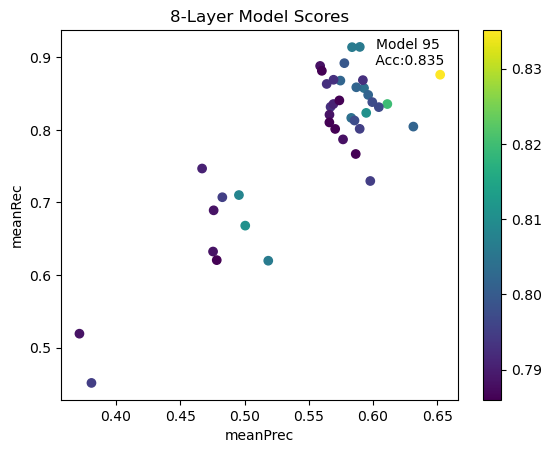

In [91]:
import matplotlib.pyplot as plt
plt.scatter(DF_8Lay_scores_sorted.meanPrec.head(40), DF_8Lay_scores_sorted.meanRec.head(40), c=DF_8Lay_scores_sorted.meanAcc.head(40))
plt.colorbar()
plt.xlabel("meanPrec")
plt.ylabel("meanRec")
plt.annotate("Model 95 \n Acc:0.835", 
             (0.655121, 0.87000),
             textcoords="offset points", # how to position the text
             xytext=(0,10), # distance from text to points (x,y)
             ha='right')
plt.title("8-Layer Model Scores")
             
plt.show()

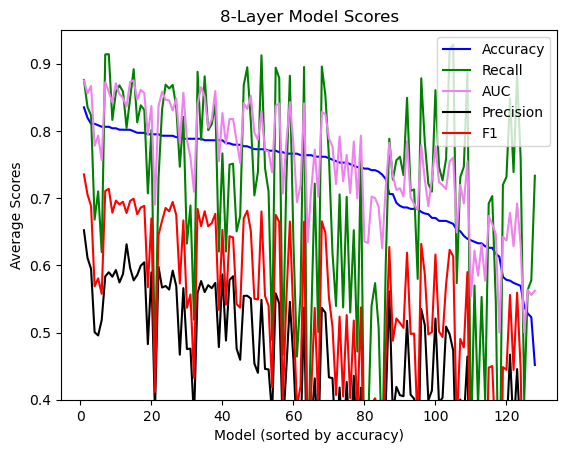

In [107]:
x=np.linspace(1, 128, 128, endpoint=True)
plt.plot(x, DF_8Lay_scores_sorted.meanAcc, color = 'blue', label = 'Accuracy')
plt.plot(x, DF_8Lay_scores_sorted.meanRec, color = 'green', label = 'Recall')
plt.plot(x, DF_8Lay_scores_sorted.meanAUC, color = 'violet', label = 'AUC')
plt.plot(x, DF_8Lay_scores_sorted.meanPrec, color = 'black', label = 'Precision')
plt.plot(x, DF_8Lay_scores_sorted.meanF1, color = 'red', label = 'F1')
plt.ylim(0.4,0.95)
plt.legend()
plt.title("8-Layer Model Scores")
plt.xlabel("Model (sorted by accuracy)")
plt.ylabel("Average Scores")
plt.show()

### Compare the Best model for each Architecture

In [66]:
scores = pd.DataFrame([Scores_2Layered.iloc[0, :],
DF_4Lay_scores_sorted.iloc[2, :],
DF_8Lay_scores_sorted.iloc[0, :],
DF_10Lay_scores_sorted.iloc[1, :]])
scores

,Unnamed: 0,hiddenLayerOne,learnRate,hiddenLayerTwo,dropout,epochs,regul,batch,accuracy,AUC,...,meanF1,hiddenLayerThree,hiddenLayerFour,batchs,hiddenLayerFive,hiddenLayerSix,hiddenLayerSeven,hiddenLayerEight,hiddenLayerNine,hiddenLayerTen
91,91,5,0.004,6,0.05,20,0.0,64.0,[0.86666667 0.84444445 0.80000001 0.84444445 0...,[0.9375 0.92013896 0.87683821 0.88903749 0...,...,0.743448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,42,4,0.007,4,0.10,20,0.0,NaN,[0.90000004 0.78888893 0.77777779 0.85555559 0...,[0.90547842 0.88446969 0.8075105 0.89772731 0...,...,0.727104,4.0,4.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN
0,95,3,0.004,5,0.10,20,0.0,NaN,[0.87777781 0.87777781 0.78888893 0.83333337 0...,[0.89197528 0.90972221 0.81460088 0.88569516 0...,...,0.735288,5.0,5.0,32.0,5.0,5.0,5.0,3.0,NaN,NaN
1,62,3,0.004,5,0.10,20,0.0,NaN,[0.77777779 0.76666671 0.77777779 0.82222223 0...,[0.86612654 0.83396465 0.77652305 0.87399733 0...,...,0.679778,5.0,5.0,16.0,5.0,5.0,5.0,5.0,5.0,3.0


In [117]:
scores.iloc[:, 10:20]

,recall,precision,F1,meanAcc,meanRec,meanAUC,meanPrec,meanF1,hiddenLayerThree,hiddenLayerFour
91,[0.77777779 0.91666669 0.85294116 1. 0...,[0.63636363 0.64705884 0.69047618 0.6111111 0...,[0.7 0.75862069 0.76315789 0.75862069 0...,0.837403,0.900386,0.910456,0.637002,0.743448,NaN,NaN
2,[0.77777779 0.91666669 0.82352942 0.86363637 1...,[0.7368421 0.56410259 0.66666669 0.65517241 0...,[0.75675676 0.6984127 0.73684211 0.74509804 0...,0.821748,0.876322,0.874682,0.631874,0.727104,4.0,4.0
0,[0.77777779 1. 0.64705884 0.9545455 1...,[0.66666669 0.6857143 0.75862068 0.60000002 0...,[0.71794872 0.81355932 0.6984127 0.73684211 0...,0.835106,0.875876,0.875026,0.652200,0.735288,5.0,5.0
1,[0.66666669 0.95833337 0.67647058 0.9545455 1...,[0.46153849 0.53488374 0.71875 0.58333331 0...,[0.54545455 0.68656716 0.6969697 0.72413793 0...,0.795181,0.851203,0.849227,0.578620,0.679778,5.0,5.0


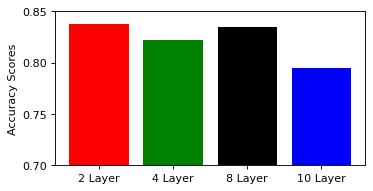

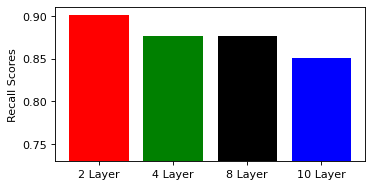

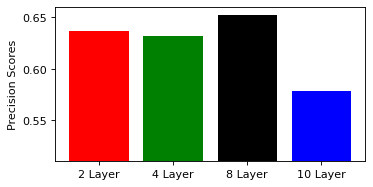

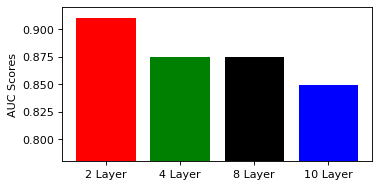

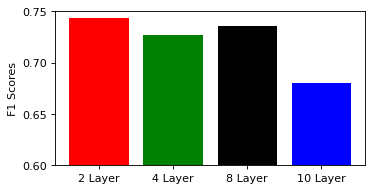

In [67]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]

names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.meanAcc, width = 0.8, color = colors)
plt.ylim(0.70,0.85)
plt.xticks(positions, names)
plt.ylabel("Accuracy Scores")

             
plt.show()

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.meanRec, width = 0.8, color = colors)
plt.ylim(0.73,0.91)
plt.xticks(positions, names)
plt.ylabel("Recall Scores")         
plt.show()

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.meanPrec, width = 0.8, color = colors)
plt.ylim(0.51,0.66)
plt.xticks(positions, names)
plt.ylabel("Precision Scores")             
plt.show()

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.meanAUC, width = 0.8, color = colors)
plt.ylim(0.78,0.92)
plt.xticks(positions, names)
plt.ylabel("AUC Scores")

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.meanF1, width = 0.8, color = colors)
plt.ylim(0.6,0.75)
plt.xticks(positions, names)
plt.ylabel("F1 Scores")

             
plt.show()



## Train the best models for each architecture on the whole training set

### Best 8 Layer Model

In [127]:
tf.random.set_seed(44)
seed(1)
best_M_8 = get_mlp_model8(hiddenLayerOne=3, hiddenLayerTwo=5, hiddenLayerThree=5, hiddenLayerFour=5,hiddenLayerFive=5, hiddenLayerSix=5,hiddenLayerSeven=5, hiddenLayerEight=3,
    dropout=0.1, learnRate=0.004, regul=0.0)
best8 = best_M_8.fit(X_train_upsample, y_train_upsample, epochs = 20, batch_size = 32, verbose = 1)

Epoch 1/20
21/21 [==============================] - 1s 17ms/step - loss: 0.6902 - accuracy: 0.5122 - auc: 0.5161 - precision: 0.5114 - recall: 0.5441
Epoch 2/20
21/21 [==============================] - 0s 15ms/step - loss: 0.6926 - accuracy: 0.5198 - auc: 0.5473 - precision: 0.5143 - recall: 0.7082
Epoch 3/20
21/21 [==============================] - 0s 15ms/step - loss: 0.6644 - accuracy: 0.5988 - auc: 0.6861 - precision: 0.6265 - recall: 0.4894
Epoch 4/20
21/21 [==============================] - 0s 15ms/step - loss: 0.5967 - accuracy: 0.7052 - auc: 0.7171 - precision: 0.6573 - recall: 0.8571
Epoch 5/20
21/21 [==============================] - 0s 15ms/step - loss: 0.5715 - accuracy: 0.7249 - auc: 0.7629 - precision: 0.6652 - recall: 0.9058
Epoch 6/20
21/21 [==============================] - 0s 15ms/step - loss: 0.4965 - accuracy: 0.7751 - auc: 0.7973 - precision: 0.7080 - recall: 0.9362
Epoch 7/20
21/21 [==============================] - 0s 15ms/step - loss: 0.4609 - accuracy: 0.7903 -

In [128]:
score8 = best_M_8.evaluate(X_test, y_test)
print("Loss:", score8[0])
print("Test accuracy:", score8[1])
print("Test AUC:", score8[2])
print("Test Precision:", score8[3])
print("Test Recall:", score8[4])

5/5 [==============================] - 0s 14ms/step - loss: 1.1059 - accuracy: 0.8200 - auc: 0.8238 - precision: 0.6724 - recall: 0.8298
Loss: 1.1058984994888306
Test accuracy: 0.8199999928474426
Test AUC: 0.823796808719635
Test Precision: 0.6724137663841248
Test Recall: 0.8297872543334961


In [129]:
best_M_8.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 47)                0         
_________________________________________________________________
dense (Dense)                (None, 3)                 144       
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 20        
_________________________________________________________________
dropout (Dropout)            (None, 5)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 30        
_________________________________________________________________
dropout_1 (Dropout)          (None, 5)                 0         
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 3

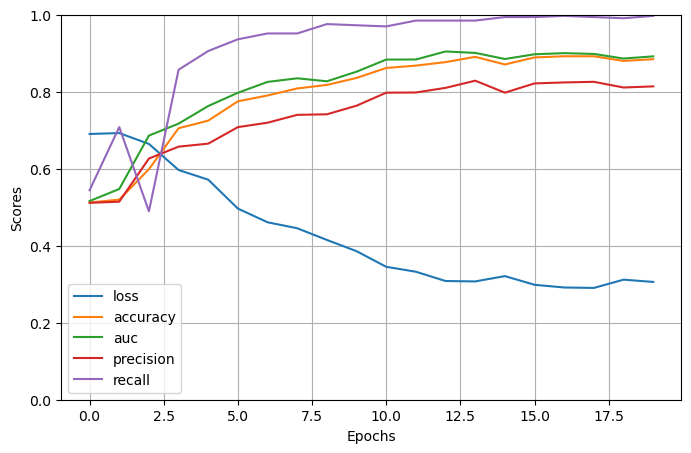

In [130]:
import pandas as pd
import matplotlib.pyplot as plt
pd.DataFrame(best8.history).plot(figsize=(8, 5)) 
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.xlabel("Epochs")
plt.ylabel("Scores")
plt.show()# set the vertical range to [0-1] plt.show()

### Best 2 Layer Model

In [134]:
tf.random.set_seed(44)
seed(1)
best_m_2 = get_mlp_model
Best2 = best_m_2.fit(X_train_upsample, y_train_upsample, epochs = 20, batch_size = 64, verbose = 1)

Epoch 1/20
11/11 [==============================] - 1s 13ms/step - loss: 0.6904 - accuracy: 0.5441 - auc_1: 0.6161 - precision_1: 0.6058 - recall_1: 0.2523 
Epoch 2/20
11/11 [==============================] - 0s 10ms/step - loss: 0.6130 - accuracy: 0.7158 - auc_1: 0.7880 - precision_1: 0.7101 - recall_1: 0.7295
Epoch 3/20
11/11 [==============================] - 0s 12ms/step - loss: 0.5724 - accuracy: 0.7736 - auc_1: 0.8332 - precision_1: 0.7250 - recall_1: 0.8815
Epoch 4/20
11/11 [==============================] - 0s 11ms/step - loss: 0.5341 - accuracy: 0.7720 - auc_1: 0.8470 - precision_1: 0.7146 - recall_1: 0.9058
Epoch 5/20
11/11 [==============================] - 0s 11ms/step - loss: 0.4822 - accuracy: 0.8237 - auc_1: 0.8675 - precision_1: 0.7617 - recall_1: 0.9422
Epoch 6/20
11/11 [==============================] - 0s 11ms/step - loss: 0.4494 - accuracy: 0.8222 - auc_1: 0.8693 - precision_1: 0.7624 - recall_1: 0.9362
Epoch 7/20
11/11 [==============================] - 0s 12ms/ste

In [135]:
score2 = best_m_2.evaluate(X_test, y_test)
print("Loss:", score2[0])
print("Test accuracy:", score2[1])
print("Test AUC:", score2[2])
print("Test Precision:", score2[3])
print("Test Recall:", score2[4])

5/5 [==============================] - 0s 11ms/step - loss: 4.3027 - accuracy: 0.8133 - auc_1: 0.8556 - precision_1: 0.6667 - recall_1: 0.8085
Loss: 4.30274772644043
Test accuracy: 0.8133333325386047
Test AUC: 0.8556084632873535
Test Precision: 0.6666666865348816
Test Recall: 0.8085106611251831


In [136]:
best_m_2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 47)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 5)                 240       
_________________________________________________________________
dropout_6 (Dropout)          (None, 5)                 0         
_________________________________________________________________
dense_10 (Dense)             (None, 6)                 36        
_________________________________________________________________
dropout_7 (Dropout)          (None, 6)                 0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 7         
Total params: 283
Trainable params: 283
Non-trainable params: 0
________________________________________________________

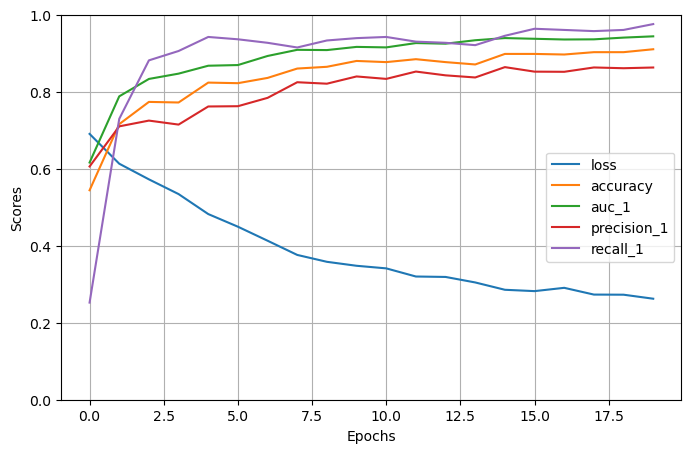

In [137]:
import pandas as pd
import matplotlib.pyplot as plt
pd.DataFrame(Best2.history).plot(figsize=(8, 5)) 
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.xlabel("Epochs")
plt.ylabel("Scores")
plt.show()# set the vertical range to [0-1] plt.show()

### compare generalization performance of the best 2 models

In [140]:
from sklearn.metrics import f1_score
model_proba8 = best_M_8.predict(X_test)
model_trues8 = pd.DataFrame(tf.greater(model_proba8, .5))
model_preds8 = model_trues8.astype(int) #https://keras.io/api/metrics/classification_metrics/ default thre
model_preds8
model_F1_8 = f1_score(y_test, model_preds8)


model_proba2 = best_m_2.predict(X_test)
model_trues2 = pd.DataFrame(tf.greater(model_proba2, .5))
model_preds2 = model_trues2.astype(int) #https://keras.io/api/metrics/classification_metrics/ default thre
model_F1_2 = f1_score(y_test, model_preds2)

F1Scores = [model_F1_2, model_F1_8]


test_scores = pd.DataFrame([score2, score8])
test_scores = test_scores.rename(columns={0: "Loss", 1: "Accuracy", 2: "AUC", 3: "Precision", 4: "Recall"})
test_scores = test_scores.rename(index={0: "2 Layer", 1: "8 Layer"})

test_scores= test_scores.assign(F1 = F1Scores)
test_scores

,Loss,Accuracy,AUC,Precision,Recall,F1
2 Layer,4.302748,0.813333,0.855608,0.666667,0.808511,0.730769
8 Layer,1.105898,0.820000,0.823797,0.672414,0.829787,0.742857


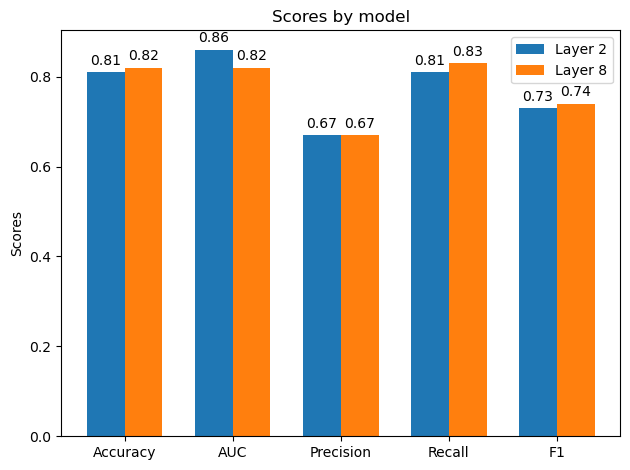

In [188]:
import matplotlib.pyplot as plt
import numpy as np


labels = ['Accuracy', 'AUC', 'Precision', 'Recall', 'F1']
testScores_2 = np.around(test_scores.iloc[0, 1:6].tolist(), 2)
testScores_8 = np.around(test_scores.iloc[1, 1:6].tolist(), 2)

x = np.arange(5)  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, testScores_2, width, label='Layer 2')
rects2 = ax.bar(x + width/2, testScores_8, width, label='Layer 8')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Scores by model')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

/Users/Kenneth/miniforge3/envs/tensorflow/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:430: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/Kenneth/miniforge3/envs/tensorflow/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:430: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


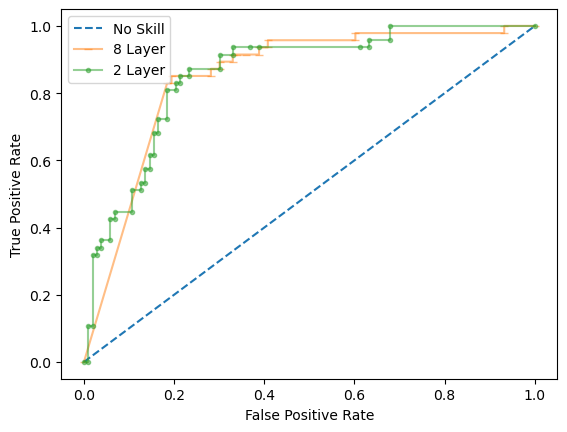

In [189]:
from sklearn.metrics import roc_curve
# predict probabilities
model_probs8 = best_M_8.predict_proba(X_test)
model_probs2 = best_m_2.predict_proba(X_test)
ns_probs = [0 for i in range(len(y_test))]
# calculate roc curves
ns_fpr, ns_tpr, i = roc_curve(y_test, ns_probs)
model8_fpr, model8_tpr, i = roc_curve(y_test, model_probs8)
model2_fpr, model2_tpr, i = roc_curve(y_test, model_probs2)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(model8_fpr, model8_tpr, marker='_', label='8 Layer', alpha = 0.5)
plt.plot(model2_fpr, model2_tpr, marker='.', label='2 Layer', alpha = 0.5)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()

/Users/Kenneth/miniforge3/envs/tensorflow/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:430: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/Users/Kenneth/miniforge3/envs/tensorflow/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:430: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


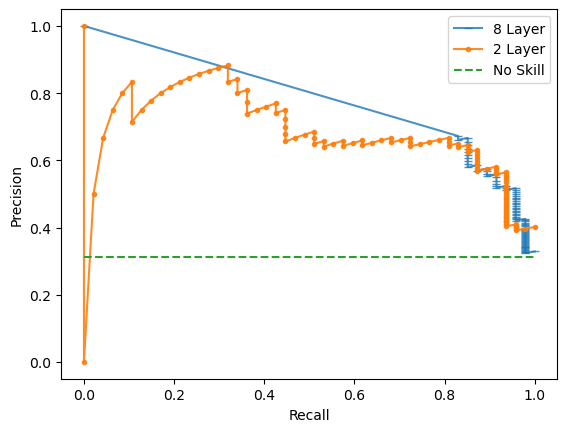

In [191]:
from sklearn.metrics import precision_recall_curve
# predict probabilities
model_probs8 = best_M_8.predict_proba(X_test)
model_probs2 = best_m_2.predict_proba(X_test)
no_skill = len(y_test.loc[y_test["sow_estimated_net_worth_value"]==1]) / len(y_test)
# calculate roc curves
model8_prec, model8_rec, i = precision_recall_curve(y_test, model_probs8)
model2_prec, model2_rec, i = precision_recall_curve(y_test, model_probs2)

# plot t roc curve for the model
plt.plot(model8_rec, model8_prec, marker='_', label='8 Layer', alpha = 0.8)
plt.plot(model2_rec, model2_prec, marker='.', label='2 Layer', alpha = 0.9)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

In [118]:
len(y_test.loc[y_test["sow_estimated_net_worth_value"]==1]) / len(y_test)

0.31333333333333335

In [120]:
model_probs8 = best_M_8.predict_proba(X_test)
model_probs2 = best_m_2.predict_proba(X_test)
model_probs2

NameError: name 'best_M_8' is not defined

## Backup

### Best 10 Layer Model

In [234]:
tf.random.set_seed(44)
seed(1)
bestm_10 = get_mlp_model10(hiddenLayerOne=3, hiddenLayerTwo=5, hiddenLayerThree=5, hiddenLayerFour=5,hiddenLayerFive=5, hiddenLayerSix=5,hiddenLayerSeven=5, hiddenLayerEight=5,  hiddenLayerNine=5, hiddenLayerTen=3,
    dropout=0.1, learnRate=0.004, regul=0.0)
Best_10 = bestm_10.fit(X_train_upsample, y_train_upsample, epochs = 20, batch_size = 32, verbose = 1)

Epoch 1/20
21/21 [==============================] - 1s 19ms/step - loss: 0.6927 - accuracy: 0.5091 - auc_31: 0.5347 - precision_31: 0.5070 - recall_31: 0.6565
Epoch 2/20
21/21 [==============================] - 0s 17ms/step - loss: 0.6884 - accuracy: 0.5638 - auc_31: 0.5721 - precision_31: 0.5629 - recall_31: 0.5714
Epoch 3/20
21/21 [==============================] - 0s 17ms/step - loss: 0.6718 - accuracy: 0.6185 - auc_31: 0.6354 - precision_31: 0.6189 - recall_31: 0.6170
Epoch 4/20
21/21 [==============================] - 0s 17ms/step - loss: 0.6778 - accuracy: 0.5927 - auc_31: 0.6289 - precision_31: 0.5910 - recall_31: 0.6018
Epoch 5/20
21/21 [==============================] - 0s 17ms/step - loss: 0.6619 - accuracy: 0.6307 - auc_31: 0.6417 - precision_31: 0.7416 - recall_31: 0.4012
Epoch 6/20
21/21 [==============================] - 0s 17ms/step - loss: 0.6264 - accuracy: 0.6763 - auc_31: 0.7339 - precision_31: 0.6921 - recall_31: 0.6353
Epoch 7/20
21/21 [============================

In [235]:
score_10 = bestm_10.evaluate(X_test, y_test)
print("Loss:", score_10[0])
print("Test accuracy:", score_10[1])
print("Test AUC:", score_10[2])
print("Test Precision:", score_10[3])
print("Test Recall:", score_10[4])

5/5 [==============================] - 0s 14ms/step - loss: 2.6259 - accuracy: 0.8400 - auc_31: 0.8254 - precision_31: 0.7447 - recall_31: 0.7447
Loss: 2.6258740425109863
Test accuracy: 0.8400000333786011
Test AUC: 0.8254493474960327
Test Precision: 0.7446808815002441
Test Recall: 0.7446808815002441


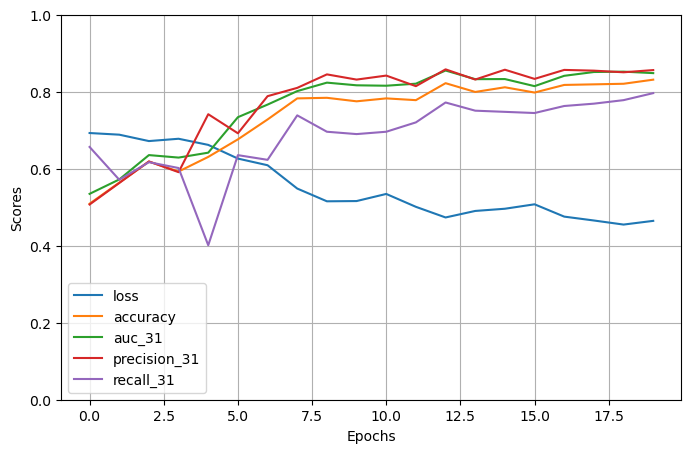

In [236]:
import pandas as pd
import matplotlib.pyplot as plt
pd.DataFrame(Best_10.history).plot(figsize=(8, 5)) 
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.xlabel("Epochs")
plt.ylabel("Scores")
plt.show()# set the vertical range to [0-1] plt.show()

### Best 4 layered model

In [237]:
score_model3L

<function __main__.score_model3L(hiddenLayerOne, hiddenLayerTwo, hiddenLayerThree, hiddenLayerFour, dropout, learnRate, regul, epochs, batchs, cv=None)>

In [238]:
tf.random.set_seed(44)
seed(1)
best_m_4 = get_mlp_model3(hiddenLayerOne=4, hiddenLayerTwo=6, hiddenLayerThree=4, hiddenLayerFour=4,
    dropout=0.05, learnRate=0.007, regul=0.0)
Best4 = best_m_4.fit(X_train_upsample, y_train_upsample, epochs = 20, batch_size = 32, verbose = 1)

Epoch 1/20
21/21 [==============================] - 1s 13ms/step - loss: 0.6691 - accuracy: 0.5836 - auc_32: 0.6085 - precision_32: 0.5758 - recall_32: 0.6353
Epoch 2/20
21/21 [==============================] - 0s 12ms/step - loss: 0.5762 - accuracy: 0.7492 - auc_32: 0.7833 - precision_32: 0.6872 - recall_32: 0.9149
Epoch 3/20
21/21 [==============================] - 0s 13ms/step - loss: 0.4983 - accuracy: 0.8009 - auc_32: 0.8368 - precision_32: 0.7463 - recall_32: 0.9119
Epoch 4/20
21/21 [==============================] - 0s 13ms/step - loss: 0.4608 - accuracy: 0.8085 - auc_32: 0.8374 - precision_32: 0.7544 - recall_32: 0.9149
Epoch 5/20
21/21 [==============================] - 0s 13ms/step - loss: 0.4296 - accuracy: 0.8024 - auc_32: 0.8405 - precision_32: 0.7319 - recall_32: 0.9544
Epoch 6/20
21/21 [==============================] - 0s 13ms/step - loss: 0.3846 - accuracy: 0.8222 - auc_32: 0.8775 - precision_32: 0.7560 - recall_32: 0.9514
Epoch 7/20
21/21 [============================

In [239]:
score4 = best_m_4.evaluate(X_test, y_test)
print("Loss:", score4[0])
print("Test accuracy:", score4[1])
print("Test AUC:", score4[2])
print("Test Precision:", score4[3])
print("Test Recall:", score4[4])

5/5 [==============================] - 0s 11ms/step - loss: 1.1793 - accuracy: 0.7733 - auc_32: 0.7883 - precision_32: 0.6102 - recall_32: 0.7660
Loss: 1.179337739944458
Test accuracy: 0.7733333706855774
Test AUC: 0.7882668972015381
Test Precision: 0.6101694703102112
Test Recall: 0.7659574747085571


In [240]:
best_m_4.summary()

Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_32 (Flatten)         (None, 47)                0         
_________________________________________________________________
dense_222 (Dense)            (None, 4)                 192       
_________________________________________________________________
dropout_158 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_223 (Dense)            (None, 6)                 30        
_________________________________________________________________
dropout_159 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_224 (Dense)            (None, 4)                 28        
_________________________________________________________________
dropout_160 (Dropout)        (None, 4)               

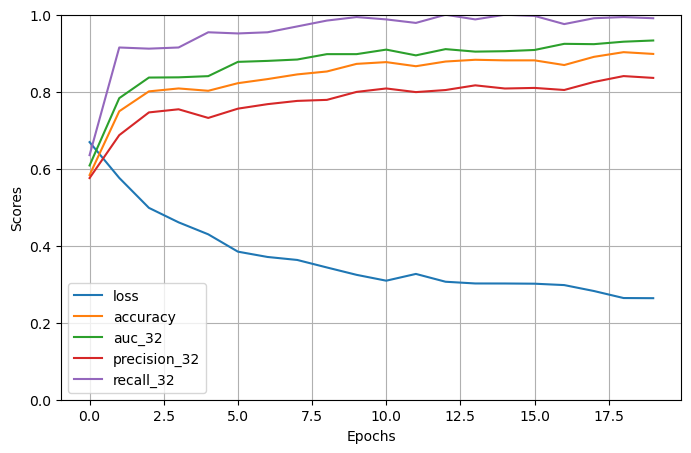

In [241]:
import pandas as pd
import matplotlib.pyplot as plt
pd.DataFrame(Best4.history).plot(figsize=(8, 5)) 
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.xlabel("Epochs")
plt.ylabel("Scores")
plt.show()# set the vertical range to [0-1] plt.show()

### Best 2 layered model

In [242]:
tf.random.set_seed(44)
seed(1)
best_m_2 = get_mlp_model(hiddenLayerOne=5, hiddenLayerTwo=6,
    dropout=0.05, learnRate=0.004, regul=0.0)
Best2 = best_m_2.fit(X_train_upsample, y_train_upsample, epochs = 20, batch_size = 64, verbose = 1)

Epoch 1/40
11/11 [==============================] - 1s 12ms/step - loss: 0.6669 - accuracy: 0.5897 - auc_33: 0.6674 - precision_33: 0.6497 - recall_33: 0.3891
Epoch 2/40
11/11 [==============================] - 0s 11ms/step - loss: 0.5691 - accuracy: 0.7477 - auc_33: 0.8204 - precision_33: 0.6945 - recall_33: 0.8845
Epoch 3/40
11/11 [==============================] - 0s 11ms/step - loss: 0.4944 - accuracy: 0.8085 - auc_33: 0.8687 - precision_33: 0.7494 - recall_33: 0.9271
Epoch 4/40
11/11 [==============================] - 0s 11ms/step - loss: 0.4441 - accuracy: 0.8252 - auc_33: 0.8740 - precision_33: 0.7649 - recall_33: 0.9392
Epoch 5/40
11/11 [==============================] - 0s 11ms/step - loss: 0.3897 - accuracy: 0.8571 - auc_33: 0.8956 - precision_33: 0.8068 - recall_33: 0.9392
Epoch 6/40
11/11 [==============================] - 0s 11ms/step - loss: 0.3751 - accuracy: 0.8617 - auc_33: 0.8951 - precision_33: 0.8148 - recall_33: 0.9362
Epoch 7/40
11/11 [============================

In [243]:
score2 = best_m_2.evaluate(X_test, y_test)
print("Loss:", score2[0])
print("Test accuracy:", score2[1])
print("Test AUC:", score2[2])
print("Test Precision:", score2[3])
print("Test Recall:", score2[4])

5/5 [==============================] - 0s 12ms/step - loss: 6.9486 - accuracy: 0.7733 - auc_33: 0.8201 - precision_33: 0.6275 - recall_33: 0.6809
Loss: 6.948602199554443
Test accuracy: 0.7733333706855774
Test AUC: 0.8200784921646118
Test Precision: 0.6274510025978088
Test Recall: 0.6808511018753052


In [244]:
best_m_2.summary()

Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_33 (Flatten)         (None, 47)                0         
_________________________________________________________________
dense_227 (Dense)            (None, 5)                 240       
_________________________________________________________________
dropout_162 (Dropout)        (None, 5)                 0         
_________________________________________________________________
dense_228 (Dense)            (None, 6)                 36        
_________________________________________________________________
dropout_163 (Dropout)        (None, 6)                 0         
_________________________________________________________________
dense_229 (Dense)            (None, 1)                 7         
Total params: 283
Trainable params: 283
Non-trainable params: 0
_______________________________________________________

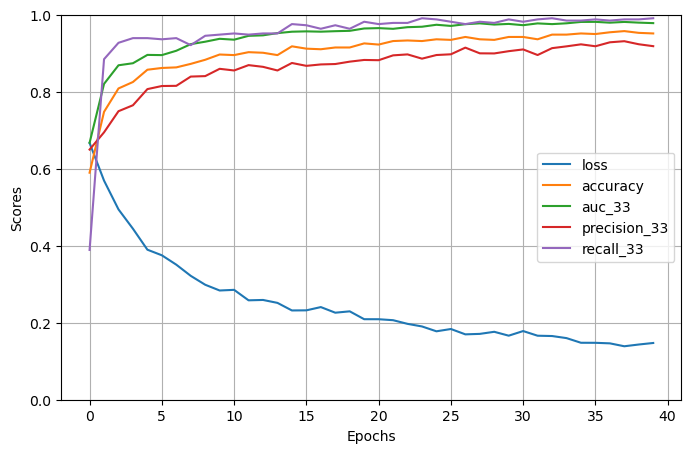

In [245]:
import pandas as pd
import matplotlib.pyplot as plt
pd.DataFrame(Best2.history).plot(figsize=(8, 5)) 
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.xlabel("Epochs")
plt.ylabel("Scores")
plt.show()# set the vertical range to [0-1] plt.show()

In [246]:
from sklearn.metrics import f1_score
model_proba8 = best_M_8.predict(X_test)
model_trues8 = pd.DataFrame(tf.greater(model_proba8, .5))
model_preds8 = model_trues8.astype(int) #https://keras.io/api/metrics/classification_metrics/ default thre
model_preds8
model_F1_8 = f1_score(y_test, model_preds8)


model_proba10 = bestm_10.predict(X_test)
model_trues10 = pd.DataFrame(tf.greater(model_proba10, .5))
model_preds10 = model_trues10.astype(int) #https://keras.io/api/metrics/classification_metrics/ default thre
model_preds10
model_F1_10 = f1_score(y_test, model_preds10)


model_proba4 = best_m_4.predict(X_test)
model_trues4 = pd.DataFrame(tf.greater(model_proba4, .5))
model_preds4 = model_trues4.astype(int) #https://keras.io/api/metrics/classification_metrics/ default thre
model_F1_4 = f1_score(y_test, model_preds4)


model_proba2 = best_m_2.predict(X_test)
model_trues2 = pd.DataFrame(tf.greater(model_proba2, .5))
model_preds2 = model_trues2.astype(int) #https://keras.io/api/metrics/classification_metrics/ default thre
model_F1_2 = f1_score(y_test, model_preds2)


In [247]:
F1Scores = [model_F1_2, model_F1_4, model_F1_8, model_F1_10]

In [248]:
F1Scores

[0.6530612244897959, 0.679245283018868, 0.7368421052631579, 0.7446808510638298]

In [249]:
scores = pd.DataFrame([score2, score4, score8, score_10])

In [250]:
scores = scores.rename(columns={0: "Loss", 1: "Accuracy", 2: "AUC", 3: "Precision", 4: "Recall"})
scores = scores.rename(index={0: "2 Layer", 1: "4 Layer", 2: "8 Layer", 3: "10 Layer"})



In [251]:
scores= scores.assign(F1 = F1Scores)
scores

,Loss,Accuracy,AUC,Precision,Recall,F1
2 Layer,6.948602,0.773333,0.820078,0.627451,0.680851,0.653061
4 Layer,1.179338,0.773333,0.788267,0.610169,0.765957,0.679245
8 Layer,5.582530,0.833333,0.827102,0.729167,0.744681,0.736842
10 Layer,2.625874,0.840000,0.825449,0.744681,0.744681,0.744681


### compare best models

In [137]:
scores.index.name = "model"

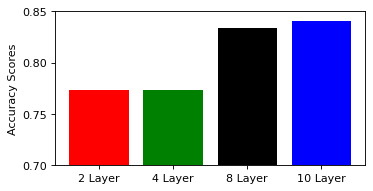

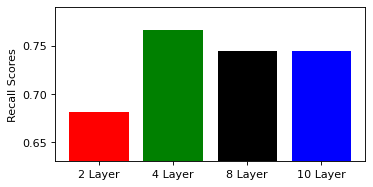

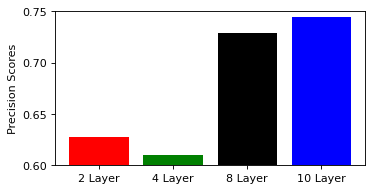

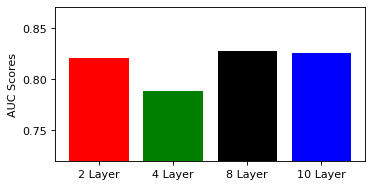

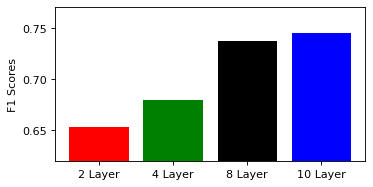

In [207]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]

names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.Accuracy, width = 0.8, color = colors)
plt.ylim(0.70,0.85)
plt.xticks(positions, names)
plt.ylabel("Accuracy Scores")

             
plt.show()

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.Recall, width = 0.8, color = colors)
plt.ylim(0.63,0.79)
plt.xticks(positions, names)
plt.ylabel("Recall Scores")         
plt.show()

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.Precision, width = 0.8, color = colors)
plt.ylim(0.6,0.75)
plt.xticks(positions, names)
plt.ylabel("Precision Scores")             
plt.show()

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.AUC, width = 0.8, color = colors)
plt.ylim(0.72,0.87)
plt.xticks(positions, names)
plt.ylabel("AUC Scores")

figure(figsize=(5, 2.5), dpi=80)
positions = [1,2,3,4]
names = ["2 Layer", "4 Layer", "8 Layer", "10 Layer"]
colors = ["red", "green", "black", "blue"]
plt.bar(positions, scores.F1, width = 0.8, color = colors)
plt.ylim(0.62,0.77)
plt.xticks(positions, names)
plt.ylabel("F1 Scores")

             
plt.show()


### Compare the best Models with the ROC curve

In [712]:
model_probs2

array([[9.2438084e-01],
       [2.8508829e-04],
       [3.4498712e-22],
       [3.3765450e-06],
       [9.6258855e-01],
       [2.5685567e-23],
       [9.8563367e-01],
       [4.1640288e-08],
       [1.0500631e-04],
       [3.7645127e-11],
       [6.9390275e-08],
       [3.9192852e-07],
       [3.0559583e-15],
       [4.4579994e-20],
       [1.8887741e-29],
       [1.4171042e-12],
       [7.6383621e-01],
       [9.2889124e-01],
       [5.0688589e-01],
       [5.8779023e-07],
       [9.0546322e-01],
       [9.3541336e-01],
       [4.8565354e-02],
       [8.2763267e-01],
       [7.3155916e-01],
       [2.2599299e-12],
       [2.1692227e-04],
       [4.5740332e-09],
       [1.4958601e-10],
       [2.1532880e-08],
       [3.3892601e-17],
       [4.9775127e-01],
       [9.6441942e-01],
       [1.1965977e-07],
       [7.0429295e-01],
       [3.0872134e-09],
       [1.5215083e-15],
       [4.5491713e-03],
       [1.2406562e-21],
       [9.4317079e-01],
       [3.2558502e-12],
       [1.817715

If the Baseline Classifier classifies all observations as positives, a Recall Value of 1 is reached at a Precision level of 31.33%, leading to a baseline AUC of 0.3133. Thus, if a model yields a higher AUC under the Precision-Recall-Curve it can be considered skillful. 

In [709]:
no_skill

0.31333333333333335

In [710]:
model8_tpr

array([1.        , 0.9787234 , 0.9787234 , 0.9787234 , 0.95744681,
       0.95744681, 0.95744681, 0.95744681, 0.95744681, 0.95744681,
       0.95744681, 0.95744681, 0.95744681, 0.95744681, 0.95744681,
       0.95744681, 0.95744681, 0.95744681, 0.95744681, 0.93617021,
       0.93617021, 0.93617021, 0.93617021, 0.93617021, 0.93617021,
       0.91489362, 0.91489362, 0.91489362, 0.91489362, 0.91489362,
       0.91489362, 0.91489362, 0.91489362, 0.91489362, 0.89361702,
       0.89361702, 0.89361702, 0.89361702, 0.89361702, 0.87234043,
       0.87234043, 0.87234043, 0.        ])

In [95]:
#best model for parameters
model_deep_final = get_mlp_model3(hiddenLayerOne=4, hiddenLayerTwo=6, hiddenLayerThree=6, hiddenLayerFour=4,
    dropout=0.0, learnRate=0.007, regul=0.0)
model_deep_final.fit(X_train_upsample, y_train_upsample, epochs = 20, batch_size = 16, verbose = 1)
model_deep_final.evaluate(X_test, y_test)

Epoch 1/20
42/42 [==============================] - 1s 13ms/step - loss: 0.6123 - accuracy: 0.6915 - auc_6: 0.7316 - precision_6: 0.6591 - recall_6: 0.7933
Epoch 2/20
42/42 [==============================] - 0s 11ms/step - loss: 0.4686 - accuracy: 0.8009 - auc_6: 0.8732 - precision_6: 0.7357 - recall_6: 0.9392
Epoch 3/20
42/42 [==============================] - 0s 12ms/step - loss: 0.3462 - accuracy: 0.8617 - auc_6: 0.9155 - precision_6: 0.8199 - recall_6: 0.9271
Epoch 4/20
42/42 [==============================] - 0s 11ms/step - loss: 0.3032 - accuracy: 0.8632 - auc_6: 0.9301 - precision_6: 0.8256 - recall_6: 0.9210
Epoch 5/20
42/42 [==============================] - 1s 12ms/step - loss: 0.2808 - accuracy: 0.8845 - auc_6: 0.9377 - precision_6: 0.8646 - recall_6: 0.9119
Epoch 6/20
42/42 [==============================] - 0s 12ms/step - loss: 0.2542 - accuracy: 0.9027 - auc_6: 0.9494 - precision_6: 0.8732 - recall_6: 0.9422
Epoch 7/20
42/42 [==============================] - 1s 12ms/step

[1.078803539276123,
 0.8133333325386047,
 0.834744930267334,
 0.6666666865348816,
 0.8085106611251831]

#best model for plot
model_deep_final = get_mlp_model3(hiddenLayerOne=3, hiddenLayerTwo=6, hiddenLayerThree=6, hiddenLayerFour=3,
    dropout=0.01, learnRate=0.007, regul=0.0)
model_deep_final.fit(X_train_upsample, y_train_upsample, epochs = 50, batch_size = 16, validation_data=(X_test, y_test), verbose = 1)
model_deep_final.evaluate(X_test, y_test)

#plot model convergence: 
pd.DataFrame(model_deep_final.history).plot(figsize=(8,5))
plt.show()

In [90]:
#ecreate predictions
y_pred = model_deep_final.predict_classes(X_test, verbose=1)

5/5 [==============================] - 0s 4ms/step


/Users/Kenneth/miniforge3/envs/tensorflow/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


In [96]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_test, y_pred)

array([[87, 16],
       [14, 33]])

In [97]:
#f1 score
from sklearn.metrics import f1_score
f1_score(y_test, y_pred)

0.6875000000000001

In [76]:
#plot model convergence
import matplotlib.pyplot as plt

# summarize history for accuracy
plt.plot(model_deep_final.history['accuracy'])
plt.plot(model_deep_final.history['loss'])
plt.plot(model_deep_final.history['precision'])
plt.plot(model_deep_final.history['recall'])
plt.title('model convergence')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['accuracy', 'loss', 'predicion', 'recall'], loc='upper left')
plt.show()

TypeError: 'History' object is not subscriptable

TypeError: 'Sequential' object is not subscriptable

In [ ]:
#print ROC
from sklearn import metrics
metrics.plot_roc_curve(model_deep_final, X_test, y_test) #wegen class imbalance schauen, wie man false positive rate mit specificity austauschen kann

In [159]:
model = get_mlp_model3(hiddenLayerOne=3, hiddenLayerTwo=6, hiddenLayerThree=6, hiddenLayerFour=3,
    dropout=0.01, learnRate=0.007, regul=0.0)
model.fit(X_train, y_train, epochs = 50, verbose = 1, batch_size = 16)
model.evaluate(X_test, y_test)

Epoch 1/50
29/29 [==============================] - 1s 9ms/step - loss: 0.9834 - accuracy: 0.3920
Epoch 2/50
29/29 [==============================] - 0s 8ms/step - loss: 0.8345 - accuracy: 0.4922
Epoch 3/50
29/29 [==============================] - 0s 8ms/step - loss: 0.7562 - accuracy: 0.5835
Epoch 4/50
29/29 [==============================] - 0s 8ms/step - loss: 0.7022 - accuracy: 0.6771
Epoch 5/50
29/29 [==============================] - 0s 8ms/step - loss: 0.6783 - accuracy: 0.7194
Epoch 6/50
29/29 [==============================] - 0s 8ms/step - loss: 0.6718 - accuracy: 0.7216
Epoch 7/50
29/29 [==============================] - 0s 8ms/step - loss: 0.6638 - accuracy: 0.7283
Epoch 8/50
29/29 [==============================] - 0s 8ms/step - loss: 0.6566 - accuracy: 0.7372
Epoch 9/50
29/29 [==============================] - 0s 9ms/step - loss: 0.6546 - accuracy: 0.7305
Epoch 10/50
29/29 [==============================] - 0s 10ms/step - loss: 0.6481 - accuracy: 0.7372
Epoch 11/50
29/29 

[11.415307998657227, 0.800000011920929]

In [154]:
grid_3L = dict(
    hiddenLayerOne=[6, 12],
    learnRate=[0.003, 0.007],
    hiddenLayerTwo=[4,10],
    hiddenLayerThree=[4,10],
    dropout=[0.3],
    epochs=[40],
    regul = [0.025, 0.015]
)

In [155]:
score_tracker_3l = []
for n_nodes1 in grid_3L['hiddenLayerOne']:
    for n_nodes2 in grid_3L['hiddenLayerTwo']:
        for n_nodes3 in grid_3L['hiddenLayerThree']:
            for learnings in grid_3L['learnRate']:
                for dropts in grid_3L['dropout']:
                    for reguls in grid_3L['regul']:
                        for epochs in grid_3L['epochs']:
                            parameter_track = {'hiddenLayerOne': n_nodes1,
                                               'learnRate': learnings,
                                               'hiddenLayerTwo': n_nodes2,
                                               'hiddenLayerThree': n_nodes3,
                                               'dropout': dropts,
                                               'epochs': epochs,
                                               'regul': reguls}
                            parameter_track["accuracy"]= score_model3(hiddenLayerOne=n_nodes1, 
                                                                     hiddenLayerTwo=n_nodes2,
                                                                     hiddenLayerThree=n_nodes3,
                                                                     dropout=dropts, 
                                                                     learnRate=learnings, 
                                                                     regul=reguls, 
                                                                     epochs=epochs,
                                                                     cv=None)
                            score_tracker_3l.append(parameter_track)


Epoch 1/40
17/17 [==============================] - 0s 8ms/step - loss: 0.7994 - accuracy: 0.5623
Epoch 2/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7500 - accuracy: 0.6089
Epoch 3/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7229 - accuracy: 0.6615
Epoch 4/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7064 - accuracy: 0.6634
Epoch 5/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6930 - accuracy: 0.6848
Epoch 6/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6793 - accuracy: 0.6926
Epoch 7/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6504 - accuracy: 0.7257
Epoch 8/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6406 - accuracy: 0.7354
Epoch 9/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6274 - accuracy: 0.7607
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6221 - accuracy: 0.7374
Epoch 11/40
17/17 [

Epoch 3/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7137 - accuracy: 0.6336
Epoch 4/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6991 - accuracy: 0.6469
Epoch 5/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6897 - accuracy: 0.6775
Epoch 6/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6743 - accuracy: 0.6889
Epoch 7/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6594 - accuracy: 0.7366
Epoch 8/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6455 - accuracy: 0.7214
Epoch 9/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6288 - accuracy: 0.7443
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6211 - accuracy: 0.7385
Epoch 11/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6195 - accuracy: 0.7462
Epoch 12/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5780 - accuracy: 0.7977
Epoch 13/40
17/17

17/17 [==============================] - 0s 7ms/step - loss: 0.7101 - accuracy: 0.6379
Epoch 6/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7034 - accuracy: 0.6073
Epoch 7/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6875 - accuracy: 0.6628
Epoch 8/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6888 - accuracy: 0.6475
Epoch 9/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6707 - accuracy: 0.6839
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6697 - accuracy: 0.6552
Epoch 11/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6466 - accuracy: 0.6916
Epoch 12/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6427 - accuracy: 0.7011
Epoch 13/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6292 - accuracy: 0.7107
Epoch 14/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6263 - accuracy: 0.7146
Epoch 15/40
17/17 [=======

18/18 [==============================] - 0s 7ms/step - loss: 0.6353 - accuracy: 0.6227
Epoch 8/40
18/18 [==============================] - 0s 7ms/step - loss: 0.6284 - accuracy: 0.6190
Epoch 9/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5935 - accuracy: 0.7033
Epoch 10/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5786 - accuracy: 0.6941
Epoch 11/40
18/18 [==============================] - 0s 7ms/step - loss: 0.6064 - accuracy: 0.6703
Epoch 12/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5837 - accuracy: 0.7161
Epoch 13/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5646 - accuracy: 0.7381
Epoch 14/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5719 - accuracy: 0.6978
Epoch 15/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5440 - accuracy: 0.7308
Epoch 16/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5377 - accuracy: 0.7381
Epoch 17/40
18/18 [=====

17/17 [==============================] - 0s 7ms/step - loss: 0.6238 - accuracy: 0.7129
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6076 - accuracy: 0.6939
Epoch 11/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5744 - accuracy: 0.7129
Epoch 12/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5606 - accuracy: 0.7414
Epoch 13/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5421 - accuracy: 0.7357
Epoch 14/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5472 - accuracy: 0.7624
Epoch 15/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5588 - accuracy: 0.7814
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5108 - accuracy: 0.7890
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4862 - accuracy: 0.8137
Epoch 18/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5176 - accuracy: 0.8156
Epoch 19/40
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.6301 - accuracy: 0.7607
Epoch 12/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6167 - accuracy: 0.7782
Epoch 13/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6104 - accuracy: 0.7879
Epoch 14/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6010 - accuracy: 0.7782
Epoch 15/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5996 - accuracy: 0.7685
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5825 - accuracy: 0.7802
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5760 - accuracy: 0.7840
Epoch 18/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5716 - accuracy: 0.7860
Epoch 19/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5664 - accuracy: 0.7957
Epoch 20/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5561 - accuracy: 0.8035
Epoch 21/40
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5670 - accuracy: 0.7882
Epoch 14/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5374 - accuracy: 0.8225
Epoch 15/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5285 - accuracy: 0.8168
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5519 - accuracy: 0.7958
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5217 - accuracy: 0.8168
Epoch 18/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5032 - accuracy: 0.8473
Epoch 19/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4952 - accuracy: 0.8416
Epoch 20/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4886 - accuracy: 0.8435
Epoch 21/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5024 - accuracy: 0.8416
Epoch 22/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4779 - accuracy: 0.8435
Epoch 23/40
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4794 - accuracy: 0.8544
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4820 - accuracy: 0.8391
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4887 - accuracy: 0.8352
Epoch 18/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4655 - accuracy: 0.8678
Epoch 19/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4667 - accuracy: 0.8525
Epoch 20/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4767 - accuracy: 0.8429
Epoch 21/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4363 - accuracy: 0.8755
Epoch 22/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4359 - accuracy: 0.8697
Epoch 23/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4421 - accuracy: 0.8736
Epoch 24/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4415 - accuracy: 0.8697
Epoch 25/40
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.4329 - accuracy: 0.8901
Epoch 18/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4365 - accuracy: 0.8864
Epoch 19/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4197 - accuracy: 0.8993
Epoch 20/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4343 - accuracy: 0.8700
Epoch 21/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4191 - accuracy: 0.8846
Epoch 22/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4347 - accuracy: 0.8718
Epoch 23/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4006 - accuracy: 0.9029
Epoch 24/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4014 - accuracy: 0.9011
Epoch 25/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4166 - accuracy: 0.8736
Epoch 26/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3895 - accuracy: 0.8993
Epoch 27/40
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4043 - accuracy: 0.8821
Epoch 20/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4051 - accuracy: 0.8878
Epoch 21/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3828 - accuracy: 0.8935
Epoch 22/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3971 - accuracy: 0.8859
Epoch 23/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3643 - accuracy: 0.9030
Epoch 24/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3979 - accuracy: 0.9030
Epoch 25/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3670 - accuracy: 0.9011
Epoch 26/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3763 - accuracy: 0.8973
Epoch 27/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3571 - accuracy: 0.9087
Epoch 28/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3537 - accuracy: 0.9202
Epoch 29/40
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5250 - accuracy: 0.8424
Epoch 22/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5226 - accuracy: 0.8385
Epoch 23/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5289 - accuracy: 0.8346
Epoch 24/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5223 - accuracy: 0.8288
Epoch 25/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4950 - accuracy: 0.8541
Epoch 26/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5020 - accuracy: 0.8405
Epoch 27/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5020 - accuracy: 0.8346
Epoch 28/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4796 - accuracy: 0.8638
Epoch 29/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4824 - accuracy: 0.8541
Epoch 30/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5007 - accuracy: 0.8288
Epoch 31/40
17/17 [===

Epoch 23/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4638 - accuracy: 0.8683
Epoch 24/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4506 - accuracy: 0.8798
Epoch 25/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4236 - accuracy: 0.9103
Epoch 26/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4302 - accuracy: 0.8969
Epoch 27/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4551 - accuracy: 0.8702
Epoch 28/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4344 - accuracy: 0.8855
Epoch 29/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4296 - accuracy: 0.8855
Epoch 30/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4220 - accuracy: 0.8836
Epoch 31/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4117 - accuracy: 0.8893
Epoch 32/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4272 - accuracy: 0.8798
Epoch 33/4

17/17 [==============================] - 0s 8ms/step - loss: 0.5519 - accuracy: 0.7835
Epoch 26/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5303 - accuracy: 0.7816
Epoch 27/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5257 - accuracy: 0.8161
Epoch 28/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5411 - accuracy: 0.8065
Epoch 29/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5357 - accuracy: 0.7835
Epoch 30/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5240 - accuracy: 0.8046
Epoch 31/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5130 - accuracy: 0.8314
Epoch 32/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5199 - accuracy: 0.7989
Epoch 33/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5438 - accuracy: 0.7989
Epoch 34/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5106 - accuracy: 0.8065
Epoch 35/40
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.4012 - accuracy: 0.9103
Epoch 28/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4077 - accuracy: 0.8956
Epoch 29/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3861 - accuracy: 0.9048
Epoch 30/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3700 - accuracy: 0.9194
Epoch 31/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3871 - accuracy: 0.9011
Epoch 32/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3635 - accuracy: 0.9249
Epoch 33/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3854 - accuracy: 0.9066
Epoch 34/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3853 - accuracy: 0.9084
Epoch 35/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3724 - accuracy: 0.9158
Epoch 36/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3671 - accuracy: 0.9103
Epoch 37/40
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3524 - accuracy: 0.9030
Epoch 30/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3514 - accuracy: 0.8840
Epoch 31/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3513 - accuracy: 0.8954
Epoch 32/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3472 - accuracy: 0.8859
Epoch 33/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3591 - accuracy: 0.8821
Epoch 34/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3541 - accuracy: 0.8859
Epoch 35/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3777 - accuracy: 0.8783
Epoch 36/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3646 - accuracy: 0.8783
Epoch 37/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3518 - accuracy: 0.8859
Epoch 38/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3543 - accuracy: 0.8821
Epoch 39/40
17/17 [===

17/17 [==============================] - 0s 9ms/step - loss: 0.4618 - accuracy: 0.8735
Epoch 31/40
17/17 [==============================] - 0s 10ms/step - loss: 0.4551 - accuracy: 0.8755
Epoch 32/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4443 - accuracy: 0.8911
Epoch 33/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4366 - accuracy: 0.8891
Epoch 34/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4496 - accuracy: 0.8696
Epoch 35/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4360 - accuracy: 0.8813
Epoch 36/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4364 - accuracy: 0.8735
Epoch 37/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4312 - accuracy: 0.8988
Epoch 38/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4225 - accuracy: 0.9008
Epoch 39/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4109 - accuracy: 0.9047
Epoch 40/40
5/5 [====

17/17 [==============================] - 0s 7ms/step - loss: 0.3685 - accuracy: 0.9198
Epoch 33/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3843 - accuracy: 0.9103
Epoch 34/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4059 - accuracy: 0.8912
Epoch 35/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3668 - accuracy: 0.9275
Epoch 36/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3758 - accuracy: 0.9179
Epoch 37/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3986 - accuracy: 0.8969
Epoch 38/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3852 - accuracy: 0.9160
Epoch 39/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3594 - accuracy: 0.9256
Epoch 40/40
5/5 [==============================] - 0s 6ms/step - loss: 0.7015 - accuracy: 0.8133
Epoch 1/40
17/17 [==============================] - 1s 8ms/step - loss: 0.8333 - accuracy: 0.4981
Epoch 2/40
17/17 [=======

17/17 [==============================] - 0s 7ms/step - loss: 0.3453 - accuracy: 0.9253
Epoch 35/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3209 - accuracy: 0.9368
Epoch 36/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3199 - accuracy: 0.9291
Epoch 37/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3491 - accuracy: 0.9234
Epoch 38/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3124 - accuracy: 0.9330
Epoch 39/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3350 - accuracy: 0.9176
Epoch 40/40
5/5 [==============================] - 0s 5ms/step - loss: 0.7309 - accuracy: 0.7867
Epoch 1/40
17/17 [==============================] - 0s 7ms/step - loss: 0.8844 - accuracy: 0.5248
Epoch 2/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7885 - accuracy: 0.5095
Epoch 3/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7293 - accuracy: 0.5477
Epoch 4/40
17/17 [=========

18/18 [==============================] - 0s 8ms/step - loss: 0.3715 - accuracy: 0.9158
Epoch 37/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3921 - accuracy: 0.8901
Epoch 38/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3738 - accuracy: 0.9084
Epoch 39/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3966 - accuracy: 0.8956
Epoch 40/40
5/5 [==============================] - 0s 5ms/step - loss: 0.6708 - accuracy: 0.7933
Epoch 1/40
17/17 [==============================] - 0s 7ms/step - loss: 0.9052 - accuracy: 0.4693
Epoch 2/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7750 - accuracy: 0.5479
Epoch 3/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7086 - accuracy: 0.6801
Epoch 4/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6879 - accuracy: 0.6897
Epoch 5/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6371 - accuracy: 0.7682
Epoch 6/40
17/17 [===========

17/17 [==============================] - 0s 8ms/step - loss: 0.3237 - accuracy: 0.9202
Epoch 39/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3467 - accuracy: 0.9030
Epoch 40/40
5/5 [==============================] - 0s 5ms/step - loss: 4.2557 - accuracy: 0.7867
Epoch 1/40
18/18 [==============================] - 0s 7ms/step - loss: 0.8416 - accuracy: 0.5183
Epoch 2/40
18/18 [==============================] - 0s 7ms/step - loss: 0.7601 - accuracy: 0.5513
Epoch 3/40
18/18 [==============================] - 0s 7ms/step - loss: 0.7147 - accuracy: 0.5934
Epoch 4/40
18/18 [==============================] - 0s 7ms/step - loss: 0.6962 - accuracy: 0.6245
Epoch 5/40
18/18 [==============================] - 0s 7ms/step - loss: 0.6473 - accuracy: 0.6630
Epoch 6/40
18/18 [==============================] - 0s 7ms/step - loss: 0.6198 - accuracy: 0.7326
Epoch 7/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5755 - accuracy: 0.7509
Epoch 8/40
18/18 [=============

5/5 [==============================] - 0s 6ms/step - loss: 0.7926 - accuracy: 0.7933
Epoch 1/40
17/17 [==============================] - 0s 8ms/step - loss: 0.8431 - accuracy: 0.5456
Epoch 2/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7833 - accuracy: 0.6388
Epoch 3/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7506 - accuracy: 0.6882
Epoch 4/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7199 - accuracy: 0.6958
Epoch 5/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6990 - accuracy: 0.7357
Epoch 6/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6822 - accuracy: 0.7186
Epoch 7/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6644 - accuracy: 0.7167
Epoch 8/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6476 - accuracy: 0.7490
Epoch 9/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6299 - accuracy: 0.7529
Epoch 10/40
17/17 [==============

17/17 [==============================] - 0s 8ms/step - loss: 0.9258 - accuracy: 0.5545
Epoch 2/40
17/17 [==============================] - 0s 7ms/step - loss: 0.8688 - accuracy: 0.5000
Epoch 3/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7944 - accuracy: 0.5447
Epoch 4/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7677 - accuracy: 0.5389
Epoch 5/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7446 - accuracy: 0.6051
Epoch 6/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7323 - accuracy: 0.6381
Epoch 7/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7098 - accuracy: 0.6342
Epoch 8/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6943 - accuracy: 0.6576
Epoch 9/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6699 - accuracy: 0.7004
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6644 - accuracy: 0.6965
Epoch 11/40
17/17 [===========

17/17 [==============================] - 0s 8ms/step - loss: 0.7605 - accuracy: 0.5840
Epoch 4/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7301 - accuracy: 0.6355
Epoch 5/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7142 - accuracy: 0.6603
Epoch 6/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6971 - accuracy: 0.6813
Epoch 7/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6890 - accuracy: 0.6832
Epoch 8/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6546 - accuracy: 0.7099
Epoch 9/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6499 - accuracy: 0.7176
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6293 - accuracy: 0.7538
Epoch 11/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6014 - accuracy: 0.7691
Epoch 12/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5859 - accuracy: 0.7672
Epoch 13/40
17/17 [=========

17/17 [==============================] - 0s 8ms/step - loss: 0.7334 - accuracy: 0.6360
Epoch 6/40
17/17 [==============================] - 0s 9ms/step - loss: 0.7216 - accuracy: 0.6628
Epoch 7/40
17/17 [==============================] - 0s 9ms/step - loss: 0.7046 - accuracy: 0.6590
Epoch 8/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6918 - accuracy: 0.7069
Epoch 9/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6753 - accuracy: 0.7280
Epoch 10/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6550 - accuracy: 0.7625
Epoch 11/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6413 - accuracy: 0.7720
Epoch 12/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6174 - accuracy: 0.7950
Epoch 13/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6178 - accuracy: 0.7912
Epoch 14/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5875 - accuracy: 0.8027
Epoch 15/40
17/17 [=======

18/18 [==============================] - 0s 8ms/step - loss: 0.5610 - accuracy: 0.7106
Epoch 8/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5453 - accuracy: 0.7711
Epoch 9/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5477 - accuracy: 0.8004
Epoch 10/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5298 - accuracy: 0.8132
Epoch 11/40
18/18 [==============================] - 0s 7ms/step - loss: 0.5123 - accuracy: 0.8223
Epoch 12/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4936 - accuracy: 0.7674
Epoch 13/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4608 - accuracy: 0.7949
Epoch 14/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4609 - accuracy: 0.7711
Epoch 15/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4298 - accuracy: 0.8004
Epoch 16/40
18/18 [==============================] - 0s 7ms/step - loss: 0.4550 - accuracy: 0.7564
Epoch 17/40
18/18 [=====

17/17 [==============================] - 0s 7ms/step - loss: 0.7282 - accuracy: 0.5779
Epoch 10/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7172 - accuracy: 0.6559
Epoch 11/40
17/17 [==============================] - 0s 7ms/step - loss: 0.7087 - accuracy: 0.6806
Epoch 12/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6999 - accuracy: 0.6977
Epoch 13/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7262
Epoch 14/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6720 - accuracy: 0.7510
Epoch 15/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6481 - accuracy: 0.7719
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6320 - accuracy: 0.7871
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6094 - accuracy: 0.8137
Epoch 18/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6107 - accuracy: 0.8004
Epoch 19/40
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.6419 - accuracy: 0.7840
Epoch 12/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6645 - accuracy: 0.7743
Epoch 13/40
17/17 [==============================] - 0s 7ms/step - loss: 0.6147 - accuracy: 0.8074
Epoch 14/40
17/17 [==============================] - 0s 8ms/step - loss: 0.6106 - accuracy: 0.7996
Epoch 15/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5679 - accuracy: 0.8405
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5451 - accuracy: 0.8482
Epoch 17/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5370 - accuracy: 0.8346
Epoch 18/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5216 - accuracy: 0.8521
Epoch 19/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5374 - accuracy: 0.8327
Epoch 20/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5032 - accuracy: 0.8560
Epoch 21/40
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5316 - accuracy: 0.8473
Epoch 14/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5183 - accuracy: 0.8416
Epoch 15/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5153 - accuracy: 0.8473
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.5077 - accuracy: 0.8359
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4722 - accuracy: 0.8569
Epoch 18/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4581 - accuracy: 0.8683
Epoch 19/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4551 - accuracy: 0.8721
Epoch 20/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4489 - accuracy: 0.8760
Epoch 21/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4365 - accuracy: 0.8817
Epoch 22/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4334 - accuracy: 0.8893
Epoch 23/40
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4412 - accuracy: 0.8793
Epoch 16/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4524 - accuracy: 0.8755
Epoch 17/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4553 - accuracy: 0.8659
Epoch 18/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4194 - accuracy: 0.9004
Epoch 19/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4228 - accuracy: 0.8889
Epoch 20/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4226 - accuracy: 0.8793
Epoch 21/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4179 - accuracy: 0.9080
Epoch 22/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4063 - accuracy: 0.8985
Epoch 23/40
17/17 [==============================] - 0s 7ms/step - loss: 0.4060 - accuracy: 0.8966
Epoch 24/40
17/17 [==============================] - 0s 7ms/step - loss: 0.3868 - accuracy: 0.9119
Epoch 25/40
17/17 [===

18/18 [==============================] - 0s 8ms/step - loss: 0.4301 - accuracy: 0.8462
Epoch 17/40
18/18 [==============================] - 0s 8ms/step - loss: 0.4161 - accuracy: 0.8571
Epoch 18/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3893 - accuracy: 0.8773
Epoch 19/40
18/18 [==============================] - 0s 8ms/step - loss: 0.4126 - accuracy: 0.8608
Epoch 20/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3667 - accuracy: 0.8883
Epoch 21/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3800 - accuracy: 0.8791
Epoch 22/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3573 - accuracy: 0.8974
Epoch 23/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3875 - accuracy: 0.8956
Epoch 24/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3688 - accuracy: 0.8864
Epoch 25/40
18/18 [==============================] - 0s 7ms/step - loss: 0.3703 - accuracy: 0.9011
Epoch 26/40
18/18 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.5993 - accuracy: 0.7662
Epoch 19/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5791 - accuracy: 0.7833
Epoch 20/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5667 - accuracy: 0.7852
Epoch 21/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5843 - accuracy: 0.7681
Epoch 22/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5770 - accuracy: 0.7681
Epoch 23/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5651 - accuracy: 0.7700
Epoch 24/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5581 - accuracy: 0.7776
Epoch 25/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5607 - accuracy: 0.7795
Epoch 26/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5425 - accuracy: 0.7928
Epoch 27/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5338 - accuracy: 0.8061
Epoch 28/40
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.5973 - accuracy: 0.7432
Epoch 21/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5866 - accuracy: 0.7198
Epoch 22/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5554 - accuracy: 0.7626
Epoch 23/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5515 - accuracy: 0.7646
Epoch 24/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5546 - accuracy: 0.7743
Epoch 25/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5472 - accuracy: 0.7704
Epoch 26/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5496 - accuracy: 0.7724
Epoch 27/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5459 - accuracy: 0.7704
Epoch 28/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5469 - accuracy: 0.7763
Epoch 29/40
17/17 [==============================] - 0s 8ms/step - loss: 0.5127 - accuracy: 0.8152
Epoch 30/40
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.4627 - accuracy: 0.8473
Epoch 23/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4298 - accuracy: 0.8683
Epoch 24/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4503 - accuracy: 0.8607
Epoch 25/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4314 - accuracy: 0.8550
Epoch 26/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4428 - accuracy: 0.8607
Epoch 27/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3934 - accuracy: 0.8912
Epoch 28/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4092 - accuracy: 0.8836
Epoch 29/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3882 - accuracy: 0.8874
Epoch 30/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4020 - accuracy: 0.8626
Epoch 31/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3991 - accuracy: 0.8760
Epoch 32/40
17/17 [===

17/17 [==============================] - 0s 9ms/step - loss: 0.4105 - accuracy: 0.8946
Epoch 25/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3848 - accuracy: 0.9080
Epoch 26/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3978 - accuracy: 0.9023
Epoch 27/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4118 - accuracy: 0.8774
Epoch 28/40
17/17 [==============================] - 0s 9ms/step - loss: 0.4069 - accuracy: 0.8908
Epoch 29/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3845 - accuracy: 0.8985
Epoch 30/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3891 - accuracy: 0.9061
Epoch 31/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3848 - accuracy: 0.8985
Epoch 32/40
17/17 [==============================] - 0s 11ms/step - loss: 0.3957 - accuracy: 0.8908
Epoch 33/40
17/17 [==============================] - 0s 11ms/step - loss: 0.3876 - accuracy: 0.9004
Epoch 34/40
17/17 [=

18/18 [==============================] - 0s 8ms/step - loss: 0.3393 - accuracy: 0.9505
Epoch 26/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3302 - accuracy: 0.9414
Epoch 27/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3231 - accuracy: 0.9432
Epoch 28/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3480 - accuracy: 0.9359
Epoch 29/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3318 - accuracy: 0.9304
Epoch 30/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3228 - accuracy: 0.9396
Epoch 31/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3024 - accuracy: 0.9505
Epoch 32/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3148 - accuracy: 0.9505
Epoch 33/40
18/18 [==============================] - 0s 8ms/step - loss: 0.2835 - accuracy: 0.9560
Epoch 34/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3093 - accuracy: 0.9414
Epoch 35/40
18/18 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.3894 - accuracy: 0.9297
Epoch 28/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3606 - accuracy: 0.9411
Epoch 29/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3621 - accuracy: 0.9411
Epoch 30/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3581 - accuracy: 0.9468
Epoch 31/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3941 - accuracy: 0.9297
Epoch 32/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3524 - accuracy: 0.9544
Epoch 33/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3800 - accuracy: 0.9354
Epoch 34/40
17/17 [==============================] - 0s 8ms/step - loss: 0.4264 - accuracy: 0.9106
Epoch 35/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3715 - accuracy: 0.9354
Epoch 36/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3611 - accuracy: 0.9335
Epoch 37/40
17/17 [===

17/17 [==============================] - 0s 9ms/step - loss: 0.3795 - accuracy: 0.8988
Epoch 30/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3894 - accuracy: 0.8949
Epoch 31/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3635 - accuracy: 0.9066
Epoch 32/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3851 - accuracy: 0.8794
Epoch 33/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3843 - accuracy: 0.8794
Epoch 34/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3494 - accuracy: 0.9105
Epoch 35/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3504 - accuracy: 0.9066
Epoch 36/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3670 - accuracy: 0.8755
Epoch 37/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3361 - accuracy: 0.8988
Epoch 38/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3587 - accuracy: 0.8988
Epoch 39/40
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.3570 - accuracy: 0.9027
Epoch 32/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3460 - accuracy: 0.9141
Epoch 33/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3279 - accuracy: 0.9103
Epoch 34/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3460 - accuracy: 0.9065
Epoch 35/40
17/17 [==============================] - 0s 8ms/step - loss: 0.2976 - accuracy: 0.9427
Epoch 36/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3238 - accuracy: 0.9237
Epoch 37/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3318 - accuracy: 0.9084
Epoch 38/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3035 - accuracy: 0.9179
Epoch 39/40
17/17 [==============================] - 0s 8ms/step - loss: 0.2993 - accuracy: 0.9332
Epoch 40/40
5/5 [==============================] - 0s 6ms/step - loss: 0.7812 - accuracy: 0.8200
Epoch 1/40
17/17 [======

17/17 [==============================] - 0s 10ms/step - loss: 0.3190 - accuracy: 0.9330
Epoch 33/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3375 - accuracy: 0.9253
Epoch 34/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3061 - accuracy: 0.9444
Epoch 35/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3039 - accuracy: 0.9406
Epoch 36/40
17/17 [==============================] - 0s 8ms/step - loss: 0.3440 - accuracy: 0.9100
Epoch 37/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3837 - accuracy: 0.9119
Epoch 38/40
17/17 [==============================] - 0s 9ms/step - loss: 0.3742 - accuracy: 0.9195
Epoch 39/40
17/17 [==============================] - 0s 10ms/step - loss: 0.3463 - accuracy: 0.9234
Epoch 40/40
5/5 [==============================] - 0s 8ms/step - loss: 4.5745 - accuracy: 0.7733
Epoch 1/40
17/17 [==============================] - 0s 10ms/step - loss: 0.9568 - accuracy: 0.5363
Epoch 2/40
17/17 [====

18/18 [==============================] - 0s 9ms/step - loss: 0.2943 - accuracy: 0.9414
Epoch 35/40
18/18 [==============================] - 0s 8ms/step - loss: 0.2604 - accuracy: 0.9542
Epoch 36/40
18/18 [==============================] - 0s 8ms/step - loss: 0.2512 - accuracy: 0.9652
Epoch 37/40
18/18 [==============================] - 0s 8ms/step - loss: 0.3042 - accuracy: 0.9487
Epoch 38/40
18/18 [==============================] - 0s 8ms/step - loss: 0.2578 - accuracy: 0.9670
Epoch 39/40
18/18 [==============================] - 0s 8ms/step - loss: 0.2564 - accuracy: 0.9634
Epoch 40/40
5/5 [==============================] - 0s 6ms/step - loss: 0.7576 - accuracy: 0.8200
Epoch 1/40
17/17 [==============================] - 0s 9ms/step - loss: 0.8456 - accuracy: 0.5632
Epoch 2/40
17/17 [==============================] - 0s 8ms/step - loss: 0.7417 - accuracy: 0.6322
Epoch 3/40
17/17 [==============================] - 0s 8ms/step - loss: 0.7075 - accuracy: 0.6762
Epoch 4/40
17/17 [=========

In [156]:
sorted(score_tracker_3l, key=lambda x: x['accuracy'].mean(), reverse=True)

[{'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 4,
  'hiddenLayerThree': 4,
  'dropout': 0.3,
  'epochs': 40,
  'regul': 0.015,
  'accuracy': array([0.81999999, 0.77333337, 0.80666667, 0.81333333, 0.85333335])},
 {'hiddenLayerOne': 12,
  'learnRate': 0.007,
  'hiddenLayerTwo': 4,
  'hiddenLayerThree': 10,
  'dropout': 0.3,
  'epochs': 40,
  'regul': 0.015,
  'accuracy': array([0.82666671, 0.82666671, 0.80666667, 0.76666671, 0.80666667])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 10,
  'hiddenLayerThree': 10,
  'dropout': 0.3,
  'epochs': 40,
  'regul': 0.025,
  'accuracy': array([0.78666669, 0.82666671, 0.79333335, 0.80000001, 0.81999999])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.003,
  'hiddenLayerTwo': 10,
  'hiddenLayerThree': 10,
  'dropout': 0.3,
  'epochs': 40,
  'regul': 0.025,
  'accuracy': array([0.79333335, 0.80000001, 0.78666669, 0.82666671, 0.81333333])},
 {'hiddenLayerOne': 12,
  'learnRate': 0.003,
  'hiddenLayerTwo': 4,
  'hidden

In [157]:
np.array([0.81999999, 0.77333337, 0.80666667, 0.81333333, 0.85333335]).mean()

0.813333342

Sveral models have been trained with a 5-fold crossvalidation grid-search technique that made sure that only the data used for training and not so the hold-out data set was oversampled in order to solve the problem of imbalanced classes. 
Out of 4 gridsearches, whereby 3 were conducted on a 2-layer network and one was conducted on a 3 layer network, the best mean accuracy was always around 81 percent. Following the rational of Ockham`s Razor, the number of layers is therefore kept at 2 in order to minimize the resources needed for computation. In terms of number of nodes less parameters seem to fit the problem at hand better as a 2-layer network with 6 nodes each achieved the best results. Consequently the following grid-searches will focus around this number of nodes and pair it with different batch sizes, epochs, learning rates, and regularization techniques. 

The best parameter were: 
{'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'dropout': 0.3,
  'epochs': 55,
  'regul': 0.025,
  
Out of : 
grid2 = dict(
    hiddenLayerOne=[6,8],
    learnRate=[0.007, 0.003],
    hiddenLayerTwo=[6,8],
    dropout=[0.2, 0.3],
    epochs=[40, 50],
    regul = [0.05, 0.025]
)

In [159]:
hiddenLayerOne = [4,6]
hiddenLayerTwo = [4,6]
learnRate = [0.05, 0.007]
dropout = [0.4, 0.3]
epochs = [45, 55]
regul = [0.025,  0.01]

In [160]:
grid5 = dict(
    hiddenLayerOne=hiddenLayerOne,
    learnRate=learnRate,
    hiddenLayerTwo=hiddenLayerTwo,
    dropout=dropout,
    epochs=epochs,
    regul = regul
)

In [161]:
score_tracker5 = []
for n_nodes1 in grid5['hiddenLayerOne']:
    for n_nodes2 in grid5['hiddenLayerTwo']:
        for learnings in grid5['learnRate']:
            for dropts in grid5['dropout']:
                for reguls in grid5['regul']:
                    for epochs in grid5['epochs']:
                        parameter_track = {'hiddenLayerOne': n_nodes1,
                                           'learnRate': learnings,
                                           'hiddenLayerTwo': n_nodes2,
                                           'dropout': dropts,
                                           'epochs': epochs,
                                           'regul': reguls}
                        parameter_track["accuracy"]= score_model(hiddenLayerOne=n_nodes1, 
                                                                 hiddenLayerTwo=n_nodes2,
                                                                 dropout=dropts, 
                                                                 learnRate=learnings, 
                                                                 regul=reguls, 
                                                                 epochs=epochs,
                                                                 cv=None)
                        score_tracker5.append(parameter_track)
        

Epoch 1/45
17/17 [==============================] - 0s 8ms/step - loss: 0.7499 - accuracy: 0.5778
Epoch 2/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7014 - accuracy: 0.6498
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6508 - accuracy: 0.6887
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6341 - accuracy: 0.6926
Epoch 5/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6236 - accuracy: 0.7198
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6146 - accuracy: 0.7198
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6187 - accuracy: 0.7062
Epoch 8/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6144 - accuracy: 0.7198
Epoch 9/45
17/17 [==============================] - 0s 8ms/step - loss: 0.6052 - accuracy: 0.7451
Epoch 10/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5713 - accuracy: 0.7549
Epoch 11/45
17/17 [

17/17 [==============================] - 0s 7ms/step - loss: 0.5881 - accuracy: 0.7110
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5873 - accuracy: 0.7072
Epoch 40/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5897 - accuracy: 0.7053
Epoch 41/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5807 - accuracy: 0.7072
Epoch 42/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5993 - accuracy: 0.6730
Epoch 43/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5857 - accuracy: 0.6939
Epoch 44/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5963 - accuracy: 0.6749
Epoch 45/45
5/5 [==============================] - 0s 6ms/step - loss: 0.6051 - accuracy: 0.6600
Epoch 1/45
18/18 [==============================] - 0s 7ms/step - loss: 0.7837 - accuracy: 0.6154
Epoch 2/45
18/18 [==============================] - 0s 7ms/step - loss: 0.7126 - accuracy: 0.6612
Epoch 3/45
18/18 [========

17/17 [==============================] - 0s 7ms/step - loss: 0.6264 - accuracy: 0.6907
Epoch 21/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6168 - accuracy: 0.7179
Epoch 22/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6530 - accuracy: 0.6868
Epoch 23/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6567 - accuracy: 0.6732
Epoch 24/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6674 - accuracy: 0.6537
Epoch 25/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6396 - accuracy: 0.6556
Epoch 26/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6431 - accuracy: 0.6518
Epoch 27/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6739 - accuracy: 0.6304
Epoch 28/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.6226
Epoch 29/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6436 - accuracy: 0.6907
Epoch 30/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.6583 - accuracy: 0.6274
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6439 - accuracy: 0.6407
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6574 - accuracy: 0.6274
Epoch 50/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6389 - accuracy: 0.6445
Epoch 51/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6480 - accuracy: 0.6236
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6421 - accuracy: 0.6179
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6439 - accuracy: 0.6198
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6305 - accuracy: 0.6369
Epoch 55/55
5/5 [==============================] - 0s 5ms/step - loss: 0.5419 - accuracy: 0.6733
Epoch 1/55
18/18 [==============================] - 0s 7ms/step - loss: 0.7330 - accuracy: 0.5916
Epoch 2/55
18/18 [=======

17/17 [==============================] - 0s 7ms/step - loss: 0.6504 - accuracy: 0.6202
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6368 - accuracy: 0.6374
Epoch 47/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6323 - accuracy: 0.6412
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6545 - accuracy: 0.6050
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6362 - accuracy: 0.6202
Epoch 50/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6484 - accuracy: 0.6164
Epoch 51/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6435 - accuracy: 0.6412
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.6508
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7092 - accuracy: 0.5553
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6740 - accuracy: 0.6011
Epoch 55/55
5/5 [=====

17/17 [==============================] - 0s 7ms/step - loss: 0.4940 - accuracy: 0.7912
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5196 - accuracy: 0.7701
Epoch 19/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5180 - accuracy: 0.7816
Epoch 20/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4908 - accuracy: 0.7912
Epoch 21/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5283 - accuracy: 0.7797
Epoch 22/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5055 - accuracy: 0.7931
Epoch 23/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5395 - accuracy: 0.7605
Epoch 24/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5204 - accuracy: 0.7835
Epoch 25/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5121 - accuracy: 0.7835
Epoch 26/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5376 - accuracy: 0.7605
Epoch 27/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5659 - accuracy: 0.7452
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5825 - accuracy: 0.7129
Epoch 37/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5147 - accuracy: 0.7833
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5666 - accuracy: 0.7395
Epoch 39/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5623 - accuracy: 0.7681
Epoch 40/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5280 - accuracy: 0.7814
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6167 - accuracy: 0.7167
Epoch 42/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5663 - accuracy: 0.7319
Epoch 43/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5553 - accuracy: 0.7433
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5322 - accuracy: 0.7529
Epoch 45/55
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.5374 - accuracy: 0.7481
Epoch 34/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5298 - accuracy: 0.7767
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5967 - accuracy: 0.7405
Epoch 36/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5691 - accuracy: 0.7328
Epoch 37/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5876 - accuracy: 0.7710
Epoch 38/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6004 - accuracy: 0.7557
Epoch 39/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5636 - accuracy: 0.7729
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5617 - accuracy: 0.8073
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5730 - accuracy: 0.7824
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5590 - accuracy: 0.7920
Epoch 43/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5804 - accuracy: 0.6877
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6565 - accuracy: 0.6724
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6144 - accuracy: 0.6935
Epoch 8/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6154 - accuracy: 0.6648
Epoch 9/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5840 - accuracy: 0.6897
Epoch 10/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5839 - accuracy: 0.6858
Epoch 11/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5959 - accuracy: 0.6954
Epoch 12/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5604 - accuracy: 0.6916
Epoch 13/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5563 - accuracy: 0.6935
Epoch 14/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5597 - accuracy: 0.7050
Epoch 15/45
17/17 [=======

17/17 [==============================] - 0s 7ms/step - loss: 0.6065 - accuracy: 0.6958
Epoch 24/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5811 - accuracy: 0.6882
Epoch 25/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5607 - accuracy: 0.7186
Epoch 26/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5736 - accuracy: 0.7110
Epoch 27/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5661 - accuracy: 0.7243
Epoch 28/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5619 - accuracy: 0.7281
Epoch 29/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5850 - accuracy: 0.6977
Epoch 30/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5925 - accuracy: 0.7186
Epoch 31/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5860 - accuracy: 0.7224
Epoch 32/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5497 - accuracy: 0.7414
Epoch 33/55
17/17 [===

18/18 [==============================] - 0s 6ms/step - loss: 0.4875 - accuracy: 0.8333
Epoch 51/55
18/18 [==============================] - 0s 6ms/step - loss: 0.4969 - accuracy: 0.8205
Epoch 52/55
18/18 [==============================] - 0s 6ms/step - loss: 0.5321 - accuracy: 0.8205
Epoch 53/55
18/18 [==============================] - 0s 6ms/step - loss: 0.5587 - accuracy: 0.7857
Epoch 54/55
18/18 [==============================] - 0s 6ms/step - loss: 0.5114 - accuracy: 0.8205
Epoch 55/55
5/5 [==============================] - 0s 5ms/step - loss: 0.8131 - accuracy: 0.7400
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7492 - accuracy: 0.6073
Epoch 2/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.6475
Epoch 3/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6263 - accuracy: 0.7011
Epoch 4/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6143 - accuracy: 0.6954
Epoch 5/55
17/17 [==========

17/17 [==============================] - 0s 6ms/step - loss: 0.6414 - accuracy: 0.6654
Epoch 3/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5722 - accuracy: 0.7205
Epoch 4/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5239 - accuracy: 0.7738
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5656 - accuracy: 0.7871
Epoch 6/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5398 - accuracy: 0.7643
Epoch 7/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4944 - accuracy: 0.8042
Epoch 8/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5021 - accuracy: 0.8156
Epoch 9/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4752 - accuracy: 0.8289
Epoch 10/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5005 - accuracy: 0.7985
Epoch 11/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4873 - accuracy: 0.8061
Epoch 12/45
17/17 [==========

17/17 [==============================] - 0s 6ms/step - loss: 0.4861 - accuracy: 0.7939
Epoch 31/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4966 - accuracy: 0.7767
Epoch 32/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4688 - accuracy: 0.8015
Epoch 33/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5052 - accuracy: 0.7805
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5007 - accuracy: 0.7958
Epoch 35/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4937 - accuracy: 0.8111
Epoch 36/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4851 - accuracy: 0.7958
Epoch 37/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4782 - accuracy: 0.8187
Epoch 38/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4791 - accuracy: 0.8015
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4761 - accuracy: 0.8149
Epoch 40/45
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.4297 - accuracy: 0.8498
Epoch 39/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4425 - accuracy: 0.8095
Epoch 40/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4336 - accuracy: 0.8407
Epoch 41/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4266 - accuracy: 0.8480
Epoch 42/55
18/18 [==============================] - 0s 7ms/step - loss: 0.3926 - accuracy: 0.8773
Epoch 43/55
18/18 [==============================] - 0s 8ms/step - loss: 0.3943 - accuracy: 0.8755
Epoch 44/55
18/18 [==============================] - 0s 7ms/step - loss: 0.3787 - accuracy: 0.8846
Epoch 45/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4076 - accuracy: 0.8571
Epoch 46/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4064 - accuracy: 0.8590
Epoch 47/55
18/18 [==============================] - 0s 7ms/step - loss: 0.3870 - accuracy: 0.8755
Epoch 48/55
18/18 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.5332 - accuracy: 0.7704
Epoch 37/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5047 - accuracy: 0.7782
Epoch 38/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4942 - accuracy: 0.7899
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5014 - accuracy: 0.7724
Epoch 40/45
17/17 [==============================] - 0s 11ms/step - loss: 0.5019 - accuracy: 0.7743
Epoch 41/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4887 - accuracy: 0.8054
Epoch 42/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5074 - accuracy: 0.7782
Epoch 43/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5121 - accuracy: 0.7899
Epoch 44/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5037 - accuracy: 0.7879
Epoch 45/45
5/5 [==============================] - 0s 6ms/step - loss: 12.2808 - accuracy: 0.8000
Epoch 1/45
17/17 [====

17/17 [==============================] - 0s 7ms/step - loss: 0.5252 - accuracy: 0.7958
Epoch 19/45
17/17 [==============================] - 0s 8ms/step - loss: 0.5579 - accuracy: 0.7672
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5180 - accuracy: 0.7844
Epoch 21/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5224 - accuracy: 0.7500
Epoch 22/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5115 - accuracy: 0.7844
Epoch 23/45
17/17 [==============================] - 0s 9ms/step - loss: 0.5298 - accuracy: 0.7443
Epoch 24/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5294 - accuracy: 0.7615
Epoch 25/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5198 - accuracy: 0.7424
Epoch 26/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5173 - accuracy: 0.7786
Epoch 27/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5048 - accuracy: 0.7595
Epoch 28/45
17/17 [===

5/5 [==============================] - 0s 6ms/step - loss: 0.5266 - accuracy: 0.7600
Epoch 1/55
17/17 [==============================] - 0s 8ms/step - loss: 0.8408 - accuracy: 0.5361
Epoch 2/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7133 - accuracy: 0.6141
Epoch 3/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6731 - accuracy: 0.6559
Epoch 4/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6403 - accuracy: 0.6996
Epoch 5/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6308 - accuracy: 0.7072
Epoch 6/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6128 - accuracy: 0.7091
Epoch 7/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6025 - accuracy: 0.7338
Epoch 8/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5799 - accuracy: 0.7510
Epoch 9/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5755 - accuracy: 0.7662
Epoch 10/55
17/17 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.5213 - accuracy: 0.6839
Epoch 54/55
17/17 [==============================] - 0s 8ms/step - loss: 0.5465 - accuracy: 0.6858
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 7.9813 - accuracy: 0.7733
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.9325 - accuracy: 0.4237
Epoch 2/55
17/17 [==============================] - 0s 6ms/step - loss: 0.7449 - accuracy: 0.5095
Epoch 3/55
17/17 [==============================] - 0s 6ms/step - loss: 0.7162 - accuracy: 0.5382
Epoch 4/55
17/17 [==============================] - 0s 8ms/step - loss: 0.6949 - accuracy: 0.5916
Epoch 5/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6571 - accuracy: 0.6565
Epoch 6/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6608 - accuracy: 0.6164
Epoch 7/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6436 - accuracy: 0.6393
Epoch 8/55
17/17 [=============

18/18 [==============================] - 0s 7ms/step - loss: 0.4426 - accuracy: 0.8114
Epoch 16/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4682 - accuracy: 0.7894
Epoch 17/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4247 - accuracy: 0.8223
Epoch 18/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4590 - accuracy: 0.7985
Epoch 19/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4550 - accuracy: 0.7930
Epoch 20/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4293 - accuracy: 0.8150
Epoch 21/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4303 - accuracy: 0.8205
Epoch 22/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4282 - accuracy: 0.8223
Epoch 23/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4083 - accuracy: 0.8333
Epoch 24/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4213 - accuracy: 0.8187
Epoch 25/45
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3595 - accuracy: 0.8813
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3693 - accuracy: 0.8794
Epoch 45/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3528 - accuracy: 0.8911
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3651 - accuracy: 0.8794
Epoch 47/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3542 - accuracy: 0.8872
Epoch 48/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3642 - accuracy: 0.8833
Epoch 49/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3824 - accuracy: 0.8696
Epoch 50/55
17/17 [==============================] - 0s 14ms/step - loss: 0.3657 - accuracy: 0.8794
Epoch 51/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3633 - accuracy: 0.8677
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3671 - accuracy: 0.8891
Epoch 53/55
17/17 [==

17/17 [==============================] - 0s 7ms/step - loss: 0.4896 - accuracy: 0.8142
Epoch 42/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4864 - accuracy: 0.8180
Epoch 43/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4683 - accuracy: 0.8199
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4882 - accuracy: 0.8084
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4385 - accuracy: 0.8410
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4843 - accuracy: 0.8372
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4750 - accuracy: 0.8161
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4454 - accuracy: 0.8391
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5059 - accuracy: 0.7969
Epoch 50/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4902 - accuracy: 0.7989
Epoch 51/55
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.6305 - accuracy: 0.7509
Epoch 4/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5878 - accuracy: 0.7857
Epoch 5/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5330 - accuracy: 0.8297
Epoch 6/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5225 - accuracy: 0.8242
Epoch 7/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5043 - accuracy: 0.8333
Epoch 8/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5053 - accuracy: 0.8242
Epoch 9/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4845 - accuracy: 0.8297
Epoch 10/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4759 - accuracy: 0.8425
Epoch 11/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4646 - accuracy: 0.8498
Epoch 12/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4729 - accuracy: 0.8370
Epoch 13/45
18/18 [=========

17/17 [==============================] - 0s 8ms/step - loss: 0.5313 - accuracy: 0.7510
Epoch 32/55
17/17 [==============================] - 0s 8ms/step - loss: 0.5328 - accuracy: 0.7646
Epoch 33/55
17/17 [==============================] - 0s 10ms/step - loss: 0.5473 - accuracy: 0.7451
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5162 - accuracy: 0.7724
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5206 - accuracy: 0.7665
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5176 - accuracy: 0.7743
Epoch 37/55
17/17 [==============================] - 0s 8ms/step - loss: 0.5206 - accuracy: 0.7607
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5306 - accuracy: 0.7549
Epoch 39/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5178 - accuracy: 0.7685
Epoch 40/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4935 - accuracy: 0.7899
Epoch 41/55
17/17 [==

17/17 [==============================] - 0s 7ms/step - loss: 0.3894 - accuracy: 0.8793
Epoch 30/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4406 - accuracy: 0.8391
Epoch 31/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4032 - accuracy: 0.8946
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4170 - accuracy: 0.8448
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3930 - accuracy: 0.8755
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4085 - accuracy: 0.8582
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4460 - accuracy: 0.8429
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4070 - accuracy: 0.8582
Epoch 37/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4107 - accuracy: 0.8678
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3696 - accuracy: 0.8908
Epoch 39/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3479 - accuracy: 0.8536
Epoch 38/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3544 - accuracy: 0.8479
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3485 - accuracy: 0.8555
Epoch 40/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3615 - accuracy: 0.8403
Epoch 41/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3481 - accuracy: 0.8498
Epoch 42/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3343 - accuracy: 0.8555
Epoch 43/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3414 - accuracy: 0.8479
Epoch 44/45
17/17 [==============================] - 0s 8ms/step - loss: 0.3280 - accuracy: 0.8593
Epoch 45/45
5/5 [==============================] - 0s 6ms/step - loss: 8.7320 - accuracy: 0.7467
Epoch 1/45
18/18 [==============================] - 0s 7ms/step - loss: 0.7656 - accuracy: 0.6447
Epoch 2/45
18/18 [=======

17/17 [==============================] - 0s 7ms/step - loss: 0.4053 - accuracy: 0.8482
Epoch 19/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3832 - accuracy: 0.8521
Epoch 20/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3901 - accuracy: 0.8560
Epoch 21/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4052 - accuracy: 0.8599
Epoch 22/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3829 - accuracy: 0.8541
Epoch 23/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4077 - accuracy: 0.8288
Epoch 24/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3708 - accuracy: 0.8619
Epoch 25/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3679 - accuracy: 0.8716
Epoch 26/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3870 - accuracy: 0.8521
Epoch 27/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3775 - accuracy: 0.8424
Epoch 28/55
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.3760 - accuracy: 0.8327
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3838 - accuracy: 0.8289
Epoch 47/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3882 - accuracy: 0.8194
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3633 - accuracy: 0.8365
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3669 - accuracy: 0.8384
Epoch 50/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4057 - accuracy: 0.8023
Epoch 51/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3615 - accuracy: 0.8479
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3910 - accuracy: 0.8289
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3670 - accuracy: 0.8536
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3742 - accuracy: 0.8422
Epoch 55/55
5/5 [=====

17/17 [==============================] - 0s 7ms/step - loss: 0.3701 - accuracy: 0.8454
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3401 - accuracy: 0.8798
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3533 - accuracy: 0.8683
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3581 - accuracy: 0.8435
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3619 - accuracy: 0.8378
Epoch 48/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3601 - accuracy: 0.8683
Epoch 49/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3381 - accuracy: 0.8779
Epoch 50/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3009 - accuracy: 0.8798
Epoch 51/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3643 - accuracy: 0.8702
Epoch 52/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3238 - accuracy: 0.8702
Epoch 53/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.6083 - accuracy: 0.7356
Epoch 16/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5892 - accuracy: 0.7395
Epoch 17/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5814 - accuracy: 0.7490
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5922 - accuracy: 0.7222
Epoch 19/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5681 - accuracy: 0.7529
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5862 - accuracy: 0.7356
Epoch 21/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5790 - accuracy: 0.7337
Epoch 22/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5668 - accuracy: 0.7471
Epoch 23/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5716 - accuracy: 0.7529
Epoch 24/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7272 - accuracy: 0.6820
Epoch 25/45
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.6302 - accuracy: 0.7186
Epoch 34/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6182 - accuracy: 0.7129
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6269 - accuracy: 0.7015
Epoch 36/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6311 - accuracy: 0.6863
Epoch 37/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6183 - accuracy: 0.7148
Epoch 38/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6217 - accuracy: 0.7281
Epoch 39/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6055 - accuracy: 0.7205
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5935 - accuracy: 0.7357
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6066 - accuracy: 0.7281
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6003 - accuracy: 0.7224
Epoch 43/55
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.5810 - accuracy: 0.7557
Epoch 32/55
17/17 [==============================] - 0s 8ms/step - loss: 0.5671 - accuracy: 0.7462
Epoch 33/55
17/17 [==============================] - 0s 8ms/step - loss: 0.5933 - accuracy: 0.7347
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5878 - accuracy: 0.7653
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6187 - accuracy: 0.7557
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6070 - accuracy: 0.7233
Epoch 37/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6076 - accuracy: 0.7042
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6103 - accuracy: 0.7233
Epoch 39/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6088 - accuracy: 0.7481
Epoch 40/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6329 - accuracy: 0.7290
Epoch 41/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.6972 - accuracy: 0.6916
Epoch 4/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6576 - accuracy: 0.6935
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6483 - accuracy: 0.7165
Epoch 6/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6529 - accuracy: 0.6897
Epoch 7/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6200 - accuracy: 0.7126
Epoch 8/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5719 - accuracy: 0.7567
Epoch 9/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5859 - accuracy: 0.7299
Epoch 10/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6126 - accuracy: 0.7241
Epoch 11/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5951 - accuracy: 0.7567
Epoch 12/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6039 - accuracy: 0.7069
Epoch 13/45
17/17 [=========

17/17 [==============================] - 0s 7ms/step - loss: 0.5404 - accuracy: 0.7529
Epoch 22/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5193 - accuracy: 0.7719
Epoch 23/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5136 - accuracy: 0.7776
Epoch 24/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5113 - accuracy: 0.7776
Epoch 25/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5458 - accuracy: 0.7510
Epoch 26/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5339 - accuracy: 0.7643
Epoch 27/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5494 - accuracy: 0.7567
Epoch 28/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5336 - accuracy: 0.7643
Epoch 29/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5437 - accuracy: 0.7433
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5275 - accuracy: 0.7605
Epoch 31/55
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.5598 - accuracy: 0.7436
Epoch 49/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5470 - accuracy: 0.7619
Epoch 50/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6189 - accuracy: 0.7198
Epoch 51/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5853 - accuracy: 0.7289
Epoch 52/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5332 - accuracy: 0.7711
Epoch 53/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5348 - accuracy: 0.7564
Epoch 54/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5431 - accuracy: 0.7527
Epoch 55/55
5/5 [==============================] - 0s 5ms/step - loss: 0.5189 - accuracy: 0.7400
Epoch 1/55
17/17 [==============================] - 0s 15ms/step - loss: 0.8467 - accuracy: 0.5594
Epoch 2/55
17/17 [==============================] - 0s 8ms/step - loss: 0.6630 - accuracy: 0.6303
Epoch 3/55
17/17 [=======

5/5 [==============================] - 0s 7ms/step - loss: 11.0661 - accuracy: 0.8000
Epoch 1/45
17/17 [==============================] - 0s 8ms/step - loss: 0.7139 - accuracy: 0.6179
Epoch 2/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6048 - accuracy: 0.8023
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5658 - accuracy: 0.7909
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5669 - accuracy: 0.7814
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5222 - accuracy: 0.8213
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5080 - accuracy: 0.8270
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4989 - accuracy: 0.8327
Epoch 8/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5147 - accuracy: 0.8270
Epoch 9/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5052 - accuracy: 0.8384
Epoch 10/45
17/17 [=============

17/17 [==============================] - 0s 7ms/step - loss: 0.5668 - accuracy: 0.7805
Epoch 29/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5310 - accuracy: 0.8168
Epoch 30/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5502 - accuracy: 0.8073
Epoch 31/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5336 - accuracy: 0.8111
Epoch 32/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5164 - accuracy: 0.8225
Epoch 33/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5210 - accuracy: 0.8130
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5361 - accuracy: 0.8015
Epoch 35/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5232 - accuracy: 0.8034
Epoch 36/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5144 - accuracy: 0.8111
Epoch 37/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4834 - accuracy: 0.8321
Epoch 38/45
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.5778 - accuracy: 0.7033
Epoch 37/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5896 - accuracy: 0.6777
Epoch 38/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5783 - accuracy: 0.6813
Epoch 39/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5994 - accuracy: 0.6813
Epoch 40/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5562 - accuracy: 0.7216
Epoch 41/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5476 - accuracy: 0.7125
Epoch 42/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5602 - accuracy: 0.6685
Epoch 43/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5415 - accuracy: 0.7198
Epoch 44/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5242 - accuracy: 0.7088
Epoch 45/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5514 - accuracy: 0.7015
Epoch 46/55
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4371 - accuracy: 0.8268
Epoch 35/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4317 - accuracy: 0.8327
Epoch 36/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4379 - accuracy: 0.8288
Epoch 37/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4602 - accuracy: 0.7996
Epoch 38/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4222 - accuracy: 0.8268
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4503 - accuracy: 0.8093
Epoch 40/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4211 - accuracy: 0.8307
Epoch 41/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4613 - accuracy: 0.8210
Epoch 42/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4871 - accuracy: 0.7918
Epoch 43/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5518 - accuracy: 0.8074
Epoch 44/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4152 - accuracy: 0.8263
Epoch 17/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4304 - accuracy: 0.8130
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4351 - accuracy: 0.8034
Epoch 19/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5098 - accuracy: 0.7424
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5320 - accuracy: 0.6908
Epoch 21/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4979 - accuracy: 0.7443
Epoch 22/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5053 - accuracy: 0.7233
Epoch 23/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4648 - accuracy: 0.7615
Epoch 24/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4644 - accuracy: 0.7805
Epoch 25/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4358 - accuracy: 0.7939
Epoch 26/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4534 - accuracy: 0.8113
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4141 - accuracy: 0.8424
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 4.6365 - accuracy: 0.8000
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7529 - accuracy: 0.5837
Epoch 2/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6990 - accuracy: 0.6084
Epoch 3/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6315 - accuracy: 0.6749
Epoch 4/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5836 - accuracy: 0.7091
Epoch 5/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5718 - accuracy: 0.7110
Epoch 6/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5501 - accuracy: 0.7433
Epoch 7/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5132 - accuracy: 0.7624
Epoch 8/55
17/17 [=============

17/17 [==============================] - 0s 7ms/step - loss: 0.4358 - accuracy: 0.7759
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4501 - accuracy: 0.7797
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4282 - accuracy: 0.8065
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4824 - accuracy: 0.7778
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 6.3117 - accuracy: 0.7667
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6910 - accuracy: 0.5859
Epoch 2/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6040 - accuracy: 0.7004
Epoch 3/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5350 - accuracy: 0.7653
Epoch 4/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4867 - accuracy: 0.8111
Epoch 5/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4916 - accuracy: 0.8073
Epoch 6/55
17/17 [===========

18/18 [==============================] - 0s 6ms/step - loss: 0.5228 - accuracy: 0.7930
Epoch 14/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5175 - accuracy: 0.7985
Epoch 15/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5046 - accuracy: 0.7985
Epoch 16/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5239 - accuracy: 0.7875
Epoch 17/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5213 - accuracy: 0.7875
Epoch 18/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5086 - accuracy: 0.8004
Epoch 19/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4685 - accuracy: 0.8407
Epoch 20/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4755 - accuracy: 0.8132
Epoch 21/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4704 - accuracy: 0.8205
Epoch 22/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4667 - accuracy: 0.8333
Epoch 23/45
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4366 - accuracy: 0.8560
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4367 - accuracy: 0.8599
Epoch 43/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4469 - accuracy: 0.8463
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4166 - accuracy: 0.8638
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4460 - accuracy: 0.8482
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4432 - accuracy: 0.8521
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4581 - accuracy: 0.8405
Epoch 48/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4311 - accuracy: 0.8677
Epoch 49/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4645 - accuracy: 0.8307
Epoch 50/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4444 - accuracy: 0.8405
Epoch 51/55
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.4505 - accuracy: 0.7931
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4475 - accuracy: 0.7893
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4586 - accuracy: 0.7893
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4703 - accuracy: 0.7739
Epoch 43/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4646 - accuracy: 0.7835
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4517 - accuracy: 0.8142
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4586 - accuracy: 0.7854
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4387 - accuracy: 0.8218
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4627 - accuracy: 0.7950
Epoch 48/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4418 - accuracy: 0.8008
Epoch 49/55
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.7616 - accuracy: 0.5934
Epoch 2/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6690 - accuracy: 0.6593
Epoch 3/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6322 - accuracy: 0.7106
Epoch 4/45
18/18 [==============================] - 0s 7ms/step - loss: 0.6085 - accuracy: 0.7289
Epoch 5/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5958 - accuracy: 0.7381
Epoch 6/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5550 - accuracy: 0.7601
Epoch 7/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5428 - accuracy: 0.7546
Epoch 8/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5153 - accuracy: 0.7729
Epoch 9/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4967 - accuracy: 0.7766
Epoch 10/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5143 - accuracy: 0.7601
Epoch 11/45
18/18 [===========

17/17 [==============================] - 0s 7ms/step - loss: 0.4671 - accuracy: 0.7996
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4469 - accuracy: 0.8171
Epoch 31/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4407 - accuracy: 0.8210
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4305 - accuracy: 0.8327
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4258 - accuracy: 0.8268
Epoch 34/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4336 - accuracy: 0.8307
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4224 - accuracy: 0.8346
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3927 - accuracy: 0.8502
Epoch 37/55
17/17 [==============================] - 0s 9ms/step - loss: 0.4209 - accuracy: 0.8307
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4052 - accuracy: 0.8482
Epoch 39/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4790 - accuracy: 0.7586
Epoch 28/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4535 - accuracy: 0.7318
Epoch 29/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4522 - accuracy: 0.7433
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4646 - accuracy: 0.7395
Epoch 31/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4708 - accuracy: 0.7241
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4572 - accuracy: 0.7586
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4315 - accuracy: 0.7874
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4229 - accuracy: 0.7510
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4360 - accuracy: 0.7701
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4191 - accuracy: 0.7893
Epoch 37/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3678 - accuracy: 0.8836
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 0.6165 - accuracy: 0.8133
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7714 - accuracy: 0.5856
Epoch 2/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7043 - accuracy: 0.6770
Epoch 3/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6750 - accuracy: 0.6984
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6377 - accuracy: 0.7374
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6041 - accuracy: 0.7510
Epoch 6/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6033 - accuracy: 0.7374
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5645 - accuracy: 0.7607
Epoch 8/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5479 - accuracy: 0.7860
Epoch 9/45
17/17 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.4355 - accuracy: 0.8582
Epoch 27/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4465 - accuracy: 0.8525
Epoch 28/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4278 - accuracy: 0.8544
Epoch 29/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4327 - accuracy: 0.8506
Epoch 30/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4172 - accuracy: 0.8544
Epoch 31/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4323 - accuracy: 0.8333
Epoch 32/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4271 - accuracy: 0.8544
Epoch 33/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4253 - accuracy: 0.8487
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4233 - accuracy: 0.8544
Epoch 35/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4192 - accuracy: 0.8506
Epoch 36/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3652 - accuracy: 0.8707
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3472 - accuracy: 0.8840
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3791 - accuracy: 0.8460
Epoch 47/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3515 - accuracy: 0.8688
Epoch 48/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3523 - accuracy: 0.8726
Epoch 49/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3471 - accuracy: 0.8669
Epoch 50/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3718 - accuracy: 0.8555
Epoch 51/55
17/17 [==============================] - 0s 11ms/step - loss: 0.4075 - accuracy: 0.8213
Epoch 52/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3900 - accuracy: 0.8517
Epoch 53/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3785 - accuracy: 0.8517
Epoch 54/55
17/17 [==

17/17 [==============================] - 0s 7ms/step - loss: 0.3597 - accuracy: 0.8874
Epoch 43/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3353 - accuracy: 0.9084
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3466 - accuracy: 0.9008
Epoch 45/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3538 - accuracy: 0.8931
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3622 - accuracy: 0.8893
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3726 - accuracy: 0.8836
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3392 - accuracy: 0.9046
Epoch 49/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3429 - accuracy: 0.8989
Epoch 50/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3543 - accuracy: 0.8874
Epoch 51/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3448 - accuracy: 0.8969
Epoch 52/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3756 - accuracy: 0.8487
Epoch 15/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3608 - accuracy: 0.8544
Epoch 16/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3596 - accuracy: 0.8678
Epoch 17/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3369 - accuracy: 0.8659
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3247 - accuracy: 0.8812
Epoch 19/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3477 - accuracy: 0.8678
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3388 - accuracy: 0.8755
Epoch 21/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3467 - accuracy: 0.8582
Epoch 22/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3486 - accuracy: 0.8563
Epoch 23/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3304 - accuracy: 0.8697
Epoch 24/45
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.3309 - accuracy: 0.8232
Epoch 33/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3318 - accuracy: 0.8384
Epoch 34/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3269 - accuracy: 0.8365
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3589 - accuracy: 0.8441
Epoch 36/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3327 - accuracy: 0.8441
Epoch 37/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3481 - accuracy: 0.8213
Epoch 38/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3516 - accuracy: 0.8213
Epoch 39/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3509 - accuracy: 0.8346
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3643 - accuracy: 0.8175
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3443 - accuracy: 0.8194
Epoch 42/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3332 - accuracy: 0.8931
Epoch 31/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3299 - accuracy: 0.8969
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3143 - accuracy: 0.9103
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3135 - accuracy: 0.8989
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3217 - accuracy: 0.8931
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3023 - accuracy: 0.9084
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3083 - accuracy: 0.9065
Epoch 37/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3068 - accuracy: 0.9008
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3033 - accuracy: 0.9122
Epoch 39/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3470 - accuracy: 0.8760
Epoch 40/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.7521 - accuracy: 0.5900
Epoch 3/45
17/17 [==============================] - 0s 6ms/step - loss: 0.7238 - accuracy: 0.5556
Epoch 4/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6979 - accuracy: 0.5728
Epoch 5/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7048 - accuracy: 0.5460
Epoch 6/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.5939
Epoch 7/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6976 - accuracy: 0.5651
Epoch 8/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6667 - accuracy: 0.6111
Epoch 9/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6837 - accuracy: 0.5977
Epoch 10/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6534 - accuracy: 0.6149
Epoch 11/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6996 - accuracy: 0.5881
Epoch 12/45
17/17 [==========

17/17 [==============================] - 0s 7ms/step - loss: 0.5940 - accuracy: 0.7205
Epoch 21/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5745 - accuracy: 0.7224
Epoch 22/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5764 - accuracy: 0.7319
Epoch 23/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5848 - accuracy: 0.7357
Epoch 24/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5906 - accuracy: 0.7281
Epoch 25/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5908 - accuracy: 0.7357
Epoch 26/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6129 - accuracy: 0.7452
Epoch 27/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6024 - accuracy: 0.7300
Epoch 28/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6355 - accuracy: 0.7186
Epoch 29/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6264 - accuracy: 0.7091
Epoch 30/55
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.6707 - accuracy: 0.6282
Epoch 48/55
18/18 [==============================] - 0s 7ms/step - loss: 0.6743 - accuracy: 0.6282
Epoch 49/55
18/18 [==============================] - 0s 7ms/step - loss: 0.6703 - accuracy: 0.6081
Epoch 50/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6527 - accuracy: 0.6484
Epoch 51/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6434 - accuracy: 0.6593
Epoch 52/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6246 - accuracy: 0.6777
Epoch 53/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6464 - accuracy: 0.6502
Epoch 54/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6803 - accuracy: 0.6264
Epoch 55/55
5/5 [==============================] - 0s 5ms/step - loss: 0.6582 - accuracy: 0.6933
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7888 - accuracy: 0.5785
Epoch 2/55
17/17 [=======

5/5 [==============================] - 0s 6ms/step - loss: 0.9307 - accuracy: 0.7400
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7208 - accuracy: 0.5779
Epoch 2/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6697 - accuracy: 0.6122
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6748 - accuracy: 0.6578
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6083 - accuracy: 0.6825
Epoch 5/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5949 - accuracy: 0.7034
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5877 - accuracy: 0.6920
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6067 - accuracy: 0.6825
Epoch 8/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5737 - accuracy: 0.6882
Epoch 9/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5431 - accuracy: 0.7224
Epoch 10/45
17/17 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.5254 - accuracy: 0.7901
Epoch 28/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5123 - accuracy: 0.7958
Epoch 29/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5553 - accuracy: 0.7443
Epoch 30/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5632 - accuracy: 0.7634
Epoch 31/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5053 - accuracy: 0.8149
Epoch 32/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5405 - accuracy: 0.7882
Epoch 33/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5040 - accuracy: 0.7901
Epoch 34/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5088 - accuracy: 0.7977
Epoch 35/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5076 - accuracy: 0.7901
Epoch 36/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5051 - accuracy: 0.8244
Epoch 37/45
17/17 [===

18/18 [==============================] - 0s 8ms/step - loss: 0.5472 - accuracy: 0.7967
Epoch 36/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5533 - accuracy: 0.7857
Epoch 37/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5498 - accuracy: 0.7894
Epoch 38/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5459 - accuracy: 0.7894
Epoch 39/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5390 - accuracy: 0.7875
Epoch 40/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5392 - accuracy: 0.8242
Epoch 41/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5665 - accuracy: 0.7930
Epoch 42/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5661 - accuracy: 0.7894
Epoch 43/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5883 - accuracy: 0.7253
Epoch 44/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5823 - accuracy: 0.7784
Epoch 45/55
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5346 - accuracy: 0.7743
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5248 - accuracy: 0.7821
Epoch 35/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5202 - accuracy: 0.7743
Epoch 36/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5540 - accuracy: 0.7860
Epoch 37/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5534 - accuracy: 0.7802
Epoch 38/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5796 - accuracy: 0.7704
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5629 - accuracy: 0.7665
Epoch 40/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5656 - accuracy: 0.7685
Epoch 41/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5797 - accuracy: 0.7588
Epoch 42/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5525 - accuracy: 0.7821
Epoch 43/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5137 - accuracy: 0.8206
Epoch 16/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5039 - accuracy: 0.8168
Epoch 17/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5476 - accuracy: 0.8111
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5331 - accuracy: 0.8378
Epoch 19/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4875 - accuracy: 0.8416
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4813 - accuracy: 0.8340
Epoch 21/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4949 - accuracy: 0.8206
Epoch 22/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4900 - accuracy: 0.8397
Epoch 23/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5026 - accuracy: 0.8168
Epoch 24/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5344 - accuracy: 0.7901
Epoch 25/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5895 - accuracy: 0.7490
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6067 - accuracy: 0.7354
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5862 - accuracy: 0.7685
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 0.9772 - accuracy: 0.7067
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7414 - accuracy: 0.6692
Epoch 2/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6405 - accuracy: 0.7148
Epoch 3/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5931 - accuracy: 0.7529
Epoch 4/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6089 - accuracy: 0.7319
Epoch 5/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5865 - accuracy: 0.7471
Epoch 6/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5701 - accuracy: 0.7719
Epoch 7/55
17/17 [============

17/17 [==============================] - 0s 7ms/step - loss: 0.5313 - accuracy: 0.7835
Epoch 51/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5409 - accuracy: 0.7644
Epoch 52/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5485 - accuracy: 0.7720
Epoch 53/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5475 - accuracy: 0.7701
Epoch 54/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5574 - accuracy: 0.7739
Epoch 55/55
5/5 [==============================] - 0s 5ms/step - loss: 0.7375 - accuracy: 0.7467
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7974 - accuracy: 0.6336
Epoch 2/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6649 - accuracy: 0.6851
Epoch 3/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6414 - accuracy: 0.6851
Epoch 4/55
17/17 [==============================] - 0s 7ms/step - loss: 0.6004 - accuracy: 0.7195
Epoch 5/55
17/17 [==========

18/18 [==============================] - 0s 7ms/step - loss: 0.4191 - accuracy: 0.8791
Epoch 13/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4020 - accuracy: 0.8773
Epoch 14/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4605 - accuracy: 0.8791
Epoch 15/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5276 - accuracy: 0.8645
Epoch 16/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4940 - accuracy: 0.8645
Epoch 17/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4881 - accuracy: 0.8645
Epoch 18/45
18/18 [==============================] - 0s 6ms/step - loss: 0.5041 - accuracy: 0.8590
Epoch 19/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4506 - accuracy: 0.8755
Epoch 20/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4261 - accuracy: 0.8755
Epoch 21/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4263 - accuracy: 0.8773
Epoch 22/45
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4695 - accuracy: 0.7977
Epoch 41/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4196 - accuracy: 0.8424
Epoch 42/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4434 - accuracy: 0.8054
Epoch 43/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4552 - accuracy: 0.8113
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4930 - accuracy: 0.8113
Epoch 45/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4386 - accuracy: 0.8152
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4720 - accuracy: 0.8035
Epoch 47/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4749 - accuracy: 0.7879
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4627 - accuracy: 0.8152
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4807 - accuracy: 0.7977
Epoch 50/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4460 - accuracy: 0.8506
Epoch 39/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4298 - accuracy: 0.8448
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4439 - accuracy: 0.8544
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4295 - accuracy: 0.8448
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4175 - accuracy: 0.8544
Epoch 43/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4225 - accuracy: 0.8487
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4286 - accuracy: 0.8487
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4284 - accuracy: 0.8467
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3941 - accuracy: 0.8716
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4186 - accuracy: 0.8602
Epoch 48/55
17/17 [===

5/5 [==============================] - 0s 6ms/step - loss: 0.7808 - accuracy: 0.8067
Epoch 1/45
18/18 [==============================] - 0s 7ms/step - loss: 0.9207 - accuracy: 0.5183
Epoch 2/45
18/18 [==============================] - 0s 6ms/step - loss: 0.7584 - accuracy: 0.5256
Epoch 3/45
18/18 [==============================] - 0s 6ms/step - loss: 0.7026 - accuracy: 0.5824
Epoch 4/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6926 - accuracy: 0.6319
Epoch 5/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6387 - accuracy: 0.6593
Epoch 6/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6542 - accuracy: 0.6355
Epoch 7/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6158 - accuracy: 0.6758
Epoch 8/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6001 - accuracy: 0.6813
Epoch 9/45
18/18 [==============================] - 0s 6ms/step - loss: 0.6106 - accuracy: 0.6447
Epoch 10/45
18/18 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.4797 - accuracy: 0.7938
Epoch 29/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4718 - accuracy: 0.7918
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4983 - accuracy: 0.7977
Epoch 31/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5003 - accuracy: 0.7821
Epoch 32/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4674 - accuracy: 0.8113
Epoch 33/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5134 - accuracy: 0.7704
Epoch 34/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5103 - accuracy: 0.7685
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4622 - accuracy: 0.7977
Epoch 36/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4628 - accuracy: 0.8054
Epoch 37/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5076 - accuracy: 0.7763
Epoch 38/55
17/17 [===

5/5 [==============================] - 0s 5ms/step - loss: 0.7051 - accuracy: 0.8000
Epoch 1/55
18/18 [==============================] - 0s 7ms/step - loss: 0.8168 - accuracy: 0.5220
Epoch 2/55
18/18 [==============================] - 0s 6ms/step - loss: 0.7607 - accuracy: 0.5733
Epoch 3/55
18/18 [==============================] - 0s 6ms/step - loss: 0.7081 - accuracy: 0.6026
Epoch 4/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6681 - accuracy: 0.6886
Epoch 5/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6470 - accuracy: 0.6612
Epoch 6/55
18/18 [==============================] - 0s 6ms/step - loss: 0.6076 - accuracy: 0.6886
Epoch 7/55
18/18 [==============================] - 0s 6ms/step - loss: 0.5931 - accuracy: 0.7179
Epoch 8/55
18/18 [==============================] - 0s 6ms/step - loss: 0.5728 - accuracy: 0.7143
Epoch 9/55
18/18 [==============================] - 0s 6ms/step - loss: 0.5723 - accuracy: 0.7051
Epoch 10/55
18/18 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.4346 - accuracy: 0.8664
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4086 - accuracy: 0.8798
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 0.6634 - accuracy: 0.7800
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.8887 - accuracy: 0.4981
Epoch 2/45
17/17 [==============================] - 0s 6ms/step - loss: 0.7877 - accuracy: 0.5486
Epoch 3/45
17/17 [==============================] - 0s 6ms/step - loss: 0.7189 - accuracy: 0.5720
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.5934
Epoch 5/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6966 - accuracy: 0.5856
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6350 - accuracy: 0.6654
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6200 - accuracy: 0.6556
Epoch 8/45
17/17 [=============

17/17 [==============================] - 0s 7ms/step - loss: 0.4094 - accuracy: 0.8180
Epoch 26/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4045 - accuracy: 0.8295
Epoch 27/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4036 - accuracy: 0.8161
Epoch 28/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3898 - accuracy: 0.8180
Epoch 29/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3881 - accuracy: 0.8161
Epoch 30/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3763 - accuracy: 0.8161
Epoch 31/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3748 - accuracy: 0.8008
Epoch 32/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3791 - accuracy: 0.8180
Epoch 33/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3887 - accuracy: 0.7912
Epoch 34/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3922 - accuracy: 0.7969
Epoch 35/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3674 - accuracy: 0.8232
Epoch 44/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4087 - accuracy: 0.7776
Epoch 45/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4081 - accuracy: 0.7947
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3795 - accuracy: 0.8175
Epoch 47/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4104 - accuracy: 0.7852
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4049 - accuracy: 0.7947
Epoch 49/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3765 - accuracy: 0.8137
Epoch 50/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3824 - accuracy: 0.8099
Epoch 51/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3693 - accuracy: 0.8213
Epoch 52/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3718 - accuracy: 0.8118
Epoch 53/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4143 - accuracy: 0.8073
Epoch 42/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4032 - accuracy: 0.8206
Epoch 43/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4016 - accuracy: 0.8187
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4042 - accuracy: 0.8282
Epoch 45/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3897 - accuracy: 0.8149
Epoch 46/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4171 - accuracy: 0.7996
Epoch 47/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4132 - accuracy: 0.7958
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4120 - accuracy: 0.8034
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4083 - accuracy: 0.8073
Epoch 50/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4029 - accuracy: 0.8073
Epoch 51/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4786 - accuracy: 0.8180
Epoch 14/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4525 - accuracy: 0.8582
Epoch 15/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4390 - accuracy: 0.8544
Epoch 16/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4562 - accuracy: 0.8410
Epoch 17/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4282 - accuracy: 0.8774
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4399 - accuracy: 0.8582
Epoch 19/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4070 - accuracy: 0.8755
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4092 - accuracy: 0.8659
Epoch 21/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3895 - accuracy: 0.8851
Epoch 22/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4215 - accuracy: 0.8544
Epoch 23/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4171 - accuracy: 0.8669
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3988 - accuracy: 0.8859
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4111 - accuracy: 0.8764
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3908 - accuracy: 0.8935
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3753 - accuracy: 0.9011
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3990 - accuracy: 0.8764
Epoch 37/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3690 - accuracy: 0.9087
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4044 - accuracy: 0.8783
Epoch 39/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4082 - accuracy: 0.8764
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3948 - accuracy: 0.8878
Epoch 41/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3771 - accuracy: 0.8550
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3497 - accuracy: 0.8912
Epoch 31/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3505 - accuracy: 0.8779
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3759 - accuracy: 0.8569
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3661 - accuracy: 0.8798
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3856 - accuracy: 0.8569
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3526 - accuracy: 0.8721
Epoch 36/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3503 - accuracy: 0.8721
Epoch 37/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3567 - accuracy: 0.8721
Epoch 38/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3613 - accuracy: 0.8664
Epoch 39/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.7945 - accuracy: 0.5287
Epoch 2/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.6188
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6464 - accuracy: 0.6609
Epoch 4/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6137 - accuracy: 0.6973
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5879 - accuracy: 0.7337
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5640 - accuracy: 0.7203
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5180 - accuracy: 0.7471
Epoch 8/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5106 - accuracy: 0.7835
Epoch 9/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5064 - accuracy: 0.7625
Epoch 10/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4949 - accuracy: 0.7586
Epoch 11/45
17/17 [===========

17/17 [==============================] - 0s 7ms/step - loss: 0.3441 - accuracy: 0.8935
Epoch 20/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3898 - accuracy: 0.8745
Epoch 21/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3445 - accuracy: 0.8954
Epoch 22/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3418 - accuracy: 0.8897
Epoch 23/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3029 - accuracy: 0.9163
Epoch 24/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3004 - accuracy: 0.9202
Epoch 25/55
17/17 [==============================] - 0s 7ms/step - loss: 0.2980 - accuracy: 0.9125
Epoch 26/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3192 - accuracy: 0.9068
Epoch 27/55
17/17 [==============================] - 0s 7ms/step - loss: 0.2976 - accuracy: 0.9183
Epoch 28/55
17/17 [==============================] - 0s 7ms/step - loss: 0.2885 - accuracy: 0.9183
Epoch 29/55
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.2308 - accuracy: 0.9542
Epoch 47/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2839 - accuracy: 0.9359
Epoch 48/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2682 - accuracy: 0.9341
Epoch 49/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2303 - accuracy: 0.9542
Epoch 50/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2132 - accuracy: 0.9597
Epoch 51/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2159 - accuracy: 0.9560
Epoch 52/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2441 - accuracy: 0.9432
Epoch 53/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2188 - accuracy: 0.9542
Epoch 54/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2221 - accuracy: 0.9542
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 0.9932 - accuracy: 0.7867
Epoch 1/55
17/17 [======

17/17 [==============================] - 0s 7ms/step - loss: 0.6052 - accuracy: 0.7237
Epoch 45/45
5/5 [==============================] - 0s 7ms/step - loss: 0.7841 - accuracy: 0.7133
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7830 - accuracy: 0.6293
Epoch 2/45
17/17 [==============================] - 0s 7ms/step - loss: 0.7030 - accuracy: 0.6958
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6061 - accuracy: 0.7510
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5746 - accuracy: 0.7567
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5820 - accuracy: 0.7433
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5676 - accuracy: 0.7719
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5885 - accuracy: 0.7624
Epoch 8/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6109 - accuracy: 0.7605
Epoch 9/45
17/17 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.5763 - accuracy: 0.7863
Epoch 27/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5835 - accuracy: 0.7710
Epoch 28/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5882 - accuracy: 0.7729
Epoch 29/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5720 - accuracy: 0.7863
Epoch 30/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5767 - accuracy: 0.7729
Epoch 31/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5961 - accuracy: 0.7500
Epoch 32/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5962 - accuracy: 0.7405
Epoch 33/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6109 - accuracy: 0.7462
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6091 - accuracy: 0.7653
Epoch 35/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5917 - accuracy: 0.7672
Epoch 36/45
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.6193 - accuracy: 0.6319
Epoch 35/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5927 - accuracy: 0.6410
Epoch 36/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5962 - accuracy: 0.6447
Epoch 37/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5918 - accuracy: 0.6850
Epoch 38/55
18/18 [==============================] - 0s 7ms/step - loss: 0.6092 - accuracy: 0.6941
Epoch 39/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5676 - accuracy: 0.7582
Epoch 40/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5833 - accuracy: 0.7161
Epoch 41/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5909 - accuracy: 0.7198
Epoch 42/55
18/18 [==============================] - 0s 7ms/step - loss: 0.6098 - accuracy: 0.6850
Epoch 43/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5721 - accuracy: 0.7363
Epoch 44/55
18/18 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4885 - accuracy: 0.8268
Epoch 33/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5565 - accuracy: 0.8307
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5544 - accuracy: 0.8074
Epoch 35/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5560 - accuracy: 0.7685
Epoch 36/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5855 - accuracy: 0.7840
Epoch 37/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5567 - accuracy: 0.7957
Epoch 38/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5266 - accuracy: 0.8093
Epoch 39/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5074 - accuracy: 0.8132
Epoch 40/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5513 - accuracy: 0.7957
Epoch 41/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4930 - accuracy: 0.8249
Epoch 42/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.4890 - accuracy: 0.7634
Epoch 15/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5077 - accuracy: 0.7615
Epoch 16/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4890 - accuracy: 0.7710
Epoch 17/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4855 - accuracy: 0.7500
Epoch 18/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4603 - accuracy: 0.7844
Epoch 19/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4773 - accuracy: 0.7844
Epoch 20/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4712 - accuracy: 0.7824
Epoch 21/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4826 - accuracy: 0.7672
Epoch 22/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4915 - accuracy: 0.7653
Epoch 23/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5009 - accuracy: 0.7462
Epoch 24/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.5204 - accuracy: 0.7802
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4835 - accuracy: 0.8093
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5074 - accuracy: 0.7938
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4956 - accuracy: 0.7996
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 0.9812 - accuracy: 0.7733
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7324 - accuracy: 0.6255
Epoch 2/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6388 - accuracy: 0.7015
Epoch 3/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5685 - accuracy: 0.7262
Epoch 4/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5297 - accuracy: 0.7795
Epoch 5/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5554 - accuracy: 0.7795
Epoch 6/55
17/17 [===========

17/17 [==============================] - 0s 7ms/step - loss: 0.5321 - accuracy: 0.7720
Epoch 50/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5366 - accuracy: 0.7395
Epoch 51/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5146 - accuracy: 0.7605
Epoch 52/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5316 - accuracy: 0.7318
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5101 - accuracy: 0.7586
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5273 - accuracy: 0.7088
Epoch 55/55
5/5 [==============================] - 0s 5ms/step - loss: 28.3915 - accuracy: 0.7400
Epoch 1/55
17/17 [==============================] - 0s 7ms/step - loss: 0.7405 - accuracy: 0.6221
Epoch 2/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5804 - accuracy: 0.7710
Epoch 3/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5286 - accuracy: 0.7844
Epoch 4/55
17/17 [========

18/18 [==============================] - 0s 7ms/step - loss: 0.5258 - accuracy: 0.8333
Epoch 12/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5293 - accuracy: 0.8059
Epoch 13/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5442 - accuracy: 0.7967
Epoch 14/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5141 - accuracy: 0.8370
Epoch 15/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5310 - accuracy: 0.8095
Epoch 16/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5434 - accuracy: 0.8022
Epoch 17/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5327 - accuracy: 0.8040
Epoch 18/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5318 - accuracy: 0.7967
Epoch 19/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5136 - accuracy: 0.8059
Epoch 20/45
18/18 [==============================] - 0s 7ms/step - loss: 0.5113 - accuracy: 0.8352
Epoch 21/45
18/18 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.5594 - accuracy: 0.7957
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5432 - accuracy: 0.8113
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5273 - accuracy: 0.8210
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5265 - accuracy: 0.7957
Epoch 43/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5203 - accuracy: 0.8132
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5271 - accuracy: 0.8093
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5225 - accuracy: 0.8093
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5292 - accuracy: 0.8132
Epoch 47/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5211 - accuracy: 0.8113
Epoch 48/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5822 - accuracy: 0.8093
Epoch 49/55
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.5732 - accuracy: 0.7586
Epoch 38/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5121 - accuracy: 0.8276
Epoch 39/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5323 - accuracy: 0.7682
Epoch 40/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5596 - accuracy: 0.7893
Epoch 41/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5723 - accuracy: 0.7529
Epoch 42/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5579 - accuracy: 0.7874
Epoch 43/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5949 - accuracy: 0.7529
Epoch 44/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5550 - accuracy: 0.7548
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.5739 - accuracy: 0.7835
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.6127 - accuracy: 0.7989
Epoch 47/55
17/17 [===

5/5 [==============================] - 0s 6ms/step - loss: 1.2055 - accuracy: 0.7533
Epoch 1/45
18/18 [==============================] - 0s 7ms/step - loss: 0.6510 - accuracy: 0.6337
Epoch 2/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4967 - accuracy: 0.8370
Epoch 3/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4515 - accuracy: 0.8571
Epoch 4/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4876 - accuracy: 0.8626
Epoch 5/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4619 - accuracy: 0.8333
Epoch 6/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4420 - accuracy: 0.8388
Epoch 7/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4538 - accuracy: 0.8535
Epoch 8/45
18/18 [==============================] - 0s 7ms/step - loss: 0.4323 - accuracy: 0.8498
Epoch 9/45
18/18 [==============================] - 0s 6ms/step - loss: 0.4093 - accuracy: 0.8791
Epoch 10/45
18/18 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.5523 - accuracy: 0.8268
Epoch 28/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4529 - accuracy: 0.8444
Epoch 29/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4422 - accuracy: 0.8482
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4178 - accuracy: 0.8677
Epoch 31/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3888 - accuracy: 0.8716
Epoch 32/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3882 - accuracy: 0.8677
Epoch 33/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3998 - accuracy: 0.8677
Epoch 34/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3726 - accuracy: 0.8891
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3689 - accuracy: 0.8872
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4263 - accuracy: 0.8794
Epoch 37/55
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.4031 - accuracy: 0.8802
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 8.2214 - accuracy: 0.8067
Epoch 1/55
18/18 [==============================] - 0s 7ms/step - loss: 0.7024 - accuracy: 0.6007
Epoch 2/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5873 - accuracy: 0.7289
Epoch 3/55
18/18 [==============================] - 0s 7ms/step - loss: 0.5369 - accuracy: 0.7527
Epoch 4/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4734 - accuracy: 0.7930
Epoch 5/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4578 - accuracy: 0.8132
Epoch 6/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4068 - accuracy: 0.8516
Epoch 7/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4307 - accuracy: 0.8388
Epoch 8/55
18/18 [==============================] - 0s 7ms/step - loss: 0.4196 - accuracy: 0.8480
Epoch 9/55
18/18 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.4743 - accuracy: 0.8244
Epoch 53/55
17/17 [==============================] - 0s 7ms/step - loss: 0.5056 - accuracy: 0.7939
Epoch 54/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4972 - accuracy: 0.7901
Epoch 55/55
5/5 [==============================] - 0s 6ms/step - loss: 1.4601 - accuracy: 0.7733
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.8750 - accuracy: 0.5739
Epoch 2/45
17/17 [==============================] - 0s 6ms/step - loss: 0.7467 - accuracy: 0.6304
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6908 - accuracy: 0.6965
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6321 - accuracy: 0.7471
Epoch 5/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6202 - accuracy: 0.7821
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5919 - accuracy: 0.7860
Epoch 7/45
17/17 [============

17/17 [==============================] - 0s 7ms/step - loss: 0.4363 - accuracy: 0.8372
Epoch 25/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4443 - accuracy: 0.8276
Epoch 26/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4105 - accuracy: 0.8506
Epoch 27/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4040 - accuracy: 0.8755
Epoch 28/45
17/17 [==============================] - 0s 8ms/step - loss: 0.4499 - accuracy: 0.8487
Epoch 29/45
17/17 [==============================] - 0s 8ms/step - loss: 0.4362 - accuracy: 0.8333
Epoch 30/45
17/17 [==============================] - 0s 8ms/step - loss: 0.4092 - accuracy: 0.8602
Epoch 31/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4351 - accuracy: 0.8544
Epoch 32/45
17/17 [==============================] - 0s 8ms/step - loss: 0.4382 - accuracy: 0.8314
Epoch 33/45
17/17 [==============================] - 0s 8ms/step - loss: 0.4319 - accuracy: 0.8678
Epoch 34/45
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3762 - accuracy: 0.8802
Epoch 43/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4199 - accuracy: 0.8726
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3991 - accuracy: 0.8688
Epoch 45/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3774 - accuracy: 0.8992
Epoch 46/55
17/17 [==============================] - 0s 6ms/step - loss: 0.4089 - accuracy: 0.8745
Epoch 47/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4126 - accuracy: 0.8593
Epoch 48/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3718 - accuracy: 0.8840
Epoch 49/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3841 - accuracy: 0.8897
Epoch 50/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3781 - accuracy: 0.8878
Epoch 51/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3818 - accuracy: 0.8802
Epoch 52/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3965 - accuracy: 0.8168
Epoch 41/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4069 - accuracy: 0.7901
Epoch 42/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4142 - accuracy: 0.7710
Epoch 43/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3801 - accuracy: 0.8359
Epoch 44/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4293 - accuracy: 0.7901
Epoch 45/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4097 - accuracy: 0.7958
Epoch 46/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4046 - accuracy: 0.7882
Epoch 47/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4320 - accuracy: 0.7805
Epoch 48/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4110 - accuracy: 0.7805
Epoch 49/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3914 - accuracy: 0.8073
Epoch 50/55
17/17 [===

17/17 [==============================] - 0s 6ms/step - loss: 0.4614 - accuracy: 0.8352
Epoch 13/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4485 - accuracy: 0.8544
Epoch 14/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4533 - accuracy: 0.8391
Epoch 15/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4059 - accuracy: 0.8736
Epoch 16/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4149 - accuracy: 0.8640
Epoch 17/45
17/17 [==============================] - 0s 7ms/step - loss: 0.4256 - accuracy: 0.8525
Epoch 18/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3948 - accuracy: 0.8755
Epoch 19/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3741 - accuracy: 0.8831
Epoch 20/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3758 - accuracy: 0.8889
Epoch 21/45
17/17 [==============================] - 0s 6ms/step - loss: 0.3618 - accuracy: 0.8889
Epoch 22/45
17/17 [===

17/17 [==============================] - 0s 8ms/step - loss: 0.3795 - accuracy: 0.8517
Epoch 31/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4070 - accuracy: 0.8460
Epoch 32/55
17/17 [==============================] - 0s 8ms/step - loss: 0.4140 - accuracy: 0.8156
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3651 - accuracy: 0.8593
Epoch 34/55
17/17 [==============================] - 0s 8ms/step - loss: 0.3919 - accuracy: 0.8327
Epoch 35/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3722 - accuracy: 0.8384
Epoch 36/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3659 - accuracy: 0.8536
Epoch 37/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3734 - accuracy: 0.8346
Epoch 38/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3905 - accuracy: 0.8384
Epoch 39/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3864 - accuracy: 0.8289
Epoch 40/55
17/17 [===

17/17 [==============================] - 0s 7ms/step - loss: 0.3828 - accuracy: 0.8359
Epoch 29/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3574 - accuracy: 0.8607
Epoch 30/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3635 - accuracy: 0.8569
Epoch 31/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3754 - accuracy: 0.8511
Epoch 32/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3384 - accuracy: 0.8798
Epoch 33/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3514 - accuracy: 0.8740
Epoch 34/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3557 - accuracy: 0.8645
Epoch 35/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3572 - accuracy: 0.8492
Epoch 36/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3610 - accuracy: 0.8359
Epoch 37/55
17/17 [==============================] - 0s 6ms/step - loss: 0.3544 - accuracy: 0.8550
Epoch 38/55
17/17 [===

5/5 [==============================] - 0s 6ms/step - loss: 6.5313 - accuracy: 0.7867
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.8659 - accuracy: 0.5556
Epoch 2/45
17/17 [==============================] - 0s 6ms/step - loss: 0.7329 - accuracy: 0.6207
Epoch 3/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6802 - accuracy: 0.6303
Epoch 4/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6315 - accuracy: 0.7203
Epoch 5/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6149 - accuracy: 0.7299
Epoch 6/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5536 - accuracy: 0.7874
Epoch 7/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5280 - accuracy: 0.8257
Epoch 8/45
17/17 [==============================] - 0s 6ms/step - loss: 0.5198 - accuracy: 0.8103
Epoch 9/45
17/17 [==============================] - 0s 6ms/step - loss: 0.4898 - accuracy: 0.8257
Epoch 10/45
17/17 [==============

17/17 [==============================] - 0s 7ms/step - loss: 0.4055 - accuracy: 0.8650
Epoch 19/55
17/17 [==============================] - 0s 7ms/step - loss: 0.4006 - accuracy: 0.8764
Epoch 20/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3943 - accuracy: 0.8802
Epoch 21/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3923 - accuracy: 0.8745
Epoch 22/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3915 - accuracy: 0.8726
Epoch 23/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3777 - accuracy: 0.8859
Epoch 24/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3772 - accuracy: 0.8840
Epoch 25/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3787 - accuracy: 0.8859
Epoch 26/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3673 - accuracy: 0.8840
Epoch 27/55
17/17 [==============================] - 0s 7ms/step - loss: 0.3502 - accuracy: 0.9049
Epoch 28/55
17/17 [===

18/18 [==============================] - 0s 7ms/step - loss: 0.2917 - accuracy: 0.9377
Epoch 46/55
18/18 [==============================] - 0s 6ms/step - loss: 0.3048 - accuracy: 0.9231
Epoch 47/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2999 - accuracy: 0.9341
Epoch 48/55
18/18 [==============================] - 0s 6ms/step - loss: 0.2973 - accuracy: 0.9304
Epoch 49/55
18/18 [==============================] - 0s 7ms/step - loss: 0.3146 - accuracy: 0.9121
Epoch 50/55
18/18 [==============================] - 0s 6ms/step - loss: 0.2917 - accuracy: 0.9304
Epoch 51/55
18/18 [==============================] - 0s 7ms/step - loss: 0.3063 - accuracy: 0.9194
Epoch 52/55
18/18 [==============================] - 0s 6ms/step - loss: 0.2989 - accuracy: 0.9267
Epoch 53/55
18/18 [==============================] - 0s 6ms/step - loss: 0.2732 - accuracy: 0.9396
Epoch 54/55
18/18 [==============================] - 0s 6ms/step - loss: 0.2925 - accuracy: 0.9304
Epoch 55/55
5/5 [=====

17/17 [==============================] - 0s 7ms/step - loss: 0.2778 - accuracy: 0.9047
Epoch 44/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2803 - accuracy: 0.9047
Epoch 45/45
5/5 [==============================] - 0s 6ms/step - loss: 16.3570 - accuracy: 0.7733
Epoch 1/45
17/17 [==============================] - 0s 7ms/step - loss: 0.8269 - accuracy: 0.5570
Epoch 2/45
17/17 [==============================] - 0s 6ms/step - loss: 0.6966 - accuracy: 0.6540
Epoch 3/45
17/17 [==============================] - 0s 7ms/step - loss: 0.6337 - accuracy: 0.6939
Epoch 4/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5812 - accuracy: 0.7148
Epoch 5/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5634 - accuracy: 0.7319
Epoch 6/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5350 - accuracy: 0.7376
Epoch 7/45
17/17 [==============================] - 0s 7ms/step - loss: 0.5300 - accuracy: 0.7624
Epoch 8/45
17/17 [============

17/17 [==============================] - 0s 7ms/step - loss: 0.3047 - accuracy: 0.9103
Epoch 26/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3106 - accuracy: 0.8950
Epoch 27/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2914 - accuracy: 0.9141
Epoch 28/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2897 - accuracy: 0.9160
Epoch 29/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2952 - accuracy: 0.9084
Epoch 30/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2953 - accuracy: 0.9122
Epoch 31/45
17/17 [==============================] - 0s 7ms/step - loss: 0.3070 - accuracy: 0.9046
Epoch 32/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2774 - accuracy: 0.9198
Epoch 33/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2577 - accuracy: 0.9294
Epoch 34/45
17/17 [==============================] - 0s 7ms/step - loss: 0.2654 - accuracy: 0.9160
Epoch 35/45
17/17 [===

18/18 [==============================] - 0s 8ms/step - loss: 0.2733 - accuracy: 0.9267
Epoch 34/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2525 - accuracy: 0.9377
Epoch 35/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2624 - accuracy: 0.9414
Epoch 36/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2753 - accuracy: 0.9304
Epoch 37/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2360 - accuracy: 0.9432
Epoch 38/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2508 - accuracy: 0.9341
Epoch 39/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2488 - accuracy: 0.9432
Epoch 40/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2557 - accuracy: 0.9359
Epoch 41/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2531 - accuracy: 0.9414
Epoch 42/55
18/18 [==============================] - 0s 7ms/step - loss: 0.2294 - accuracy: 0.9542
Epoch 43/55
18/18 [===

In [162]:
sorted(score_tracker5, key=lambda x: x['accuracy'].mean(), reverse=True)

[{'hiddenLayerOne': 4,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'dropout': 0.3,
  'epochs': 45,
  'regul': 0.01,
  'accuracy': array([0.82666671, 0.81999999, 0.81999999, 0.78000003, 0.80000001])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 4,
  'dropout': 0.4,
  'epochs': 45,
  'regul': 0.01,
  'accuracy': array([0.82666671, 0.80666667, 0.80666667, 0.79333335, 0.80666667])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'dropout': 0.3,
  'epochs': 55,
  'regul': 0.01,
  'accuracy': array([0.80000001, 0.81999999, 0.81999999, 0.81333333, 0.78666669])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 6,
  'dropout': 0.4,
  'epochs': 55,
  'regul': 0.025,
  'accuracy': array([0.79333335, 0.80666667, 0.84000003, 0.80000001, 0.78000003])},
 {'hiddenLayerOne': 6,
  'learnRate': 0.007,
  'hiddenLayerTwo': 4,
  'dropout': 0.3,
  'epochs': 45,
  'regul': 0.01,
  'accuracy': array([0.80666667, 0.78666669, 0.80666667, 0.80666667,

In [163]:
np.array([0.82666671, 0.81999999, 0.81999999, 0.78000003, 0.80000001]).mean()

0.8093333460000001

In [ ]:
#Backup


In [154]:
model = get_mlp_model(hiddenLayerOne=6, hiddenLayerTwo=6,
    dropout=0.4, learnRate=0.007, regul=0.00)
model.fit(X_train, y_train, epochs = 50, verbose = 1, batch_size = 64)
model.evaluate(X_test, y_test)

Epoch 1/50
8/8 [==============================] - 0s 8ms/step - loss: 0.7887 - accuracy: 0.6325
Epoch 2/50
8/8 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7038
Epoch 3/50
8/8 [==============================] - 0s 6ms/step - loss: 0.6074 - accuracy: 0.7105
Epoch 4/50
8/8 [==============================] - 0s 6ms/step - loss: 0.5813 - accuracy: 0.7105
Epoch 5/50
8/8 [==============================] - 0s 6ms/step - loss: 0.5522 - accuracy: 0.7550
Epoch 6/50
8/8 [==============================] - 0s 6ms/step - loss: 0.5453 - accuracy: 0.7394
Epoch 7/50
8/8 [==============================] - 0s 6ms/step - loss: 0.5113 - accuracy: 0.7394
Epoch 8/50
8/8 [==============================] - 0s 6ms/step - loss: 0.5037 - accuracy: 0.7461
Epoch 9/50
8/8 [==============================] - 0s 6ms/step - loss: 0.4851 - accuracy: 0.7506
Epoch 10/50
8/8 [==============================] - 0s 6ms/step - loss: 0.4764 - accuracy: 0.7261
Epoch 11/50
8/8 [======================

[2.4194748401641846, 0.7866666913032532]